In [1]:
%cd /content/drive/MyDrive/Documentos/GitHub/Educational-Analysis-PISA

/content/drive/MyDrive/Documentos/GitHub/Educational-Analysis-PISA


# ANÁLISIS EDUCATIVO CON DATOS PISA

Estudio de los datos de PISA (Programme for International Student Assessment) para evaluar relaciones entre el
rendimiento académico y otras variables del ámbito social, económico y personal de los entrevistados.

## 0. Descripción

### `0.1. Preguntas`

`Evaluación de la influencia de los recursos financieros en la calidad educativa:`

- ¿Cuál es la relación entre los recursos financieros asignados a la educación y los resultados académicos de los alumnos?

- ¿Cómo se comparan los gastos en educación entre los países?

- ¿Existen patrones o tendencias en los gastos a lo largo del tiempo?

**Hipótesis:**

**Los recursos financieros tienen un impacto significativo en los resultados académicos de los estudiantes.**

`Respecto al análisis anterior, evaluación de la inversión económica en profesorado:`

- ¿Cuál es la relación entre los salarios de los profesores y los resultados académicos de los alumnos en PISA?

- ¿Cómo varían los salarios de los profesores de un país a otro?

**Hipótesis:**

**El salario de los profesores influye significativamente en los resultados académicos de los alumnos. Los países que pagan salarios más altos a los profesores suelen tener mejores resultados académicos.**

`Relación media - varianza de calidad educativa`

Trasladándonos, por ejemplo, a la medida de la riqueza en distintos países, siempre ha existido el debate de si debemos tener en cuenta la riqueza media del ciudadano o la cantidad de pobreza. Ésta pregunta es completamente extrapolable a la riqueza educativa:

- ¿Influye la cantidad de jóvenes sin empleo ni estudios (ninis) en la calidad educativa de un país?

- ¿Son capaces los países de la OECD de reducir su porcentaje de ninis con el paso del tiempo?

- ¿Se pueden encontrar agentes externos que direccionen la tendencia anterior?

**Hipótesis Principal**

**Un aumento o disminucion de las puntuaciones PISA está inversamente relacionada con la tasa NEET de ese país, es decir, un mayor porcentaje de jóvenes sin empleo ni estudios (ninis) podría estar asociado con una menor calidad educativa.**

**Hipotesis Secundarias**
- Los países examinados, en general, muestran una tendencia decreciente en sus tasas NEET a lo largo del tiempo debido a las políticas educativas y de empleo implementadas.
- Los agentes externos mencionados previamente, como la inversión educativa, y en particular, el salario de los profesores, influyen en la tasa de ninis.

### `0.2. Objetivos`

`Encontrar variables que, con su posterior análisis, nos respondan las preguntas anteriores`.

`Apoyarnos en nuestro análisis y entendimiento del problema para centrar el trabajo en aplicar alguna de las siguientes ideas:`

 - Alguna predicción a futuro. Podemos emplear modelos de series temporales para analizar las tendencias de rendimiento en estas áreas a lo largo del tiempo. ARIMA o Prophet.

 - Evaluaciones de calidad educativa en países sin registros. Modelos de regresión múltiple.

 - Predicciones de calidad educativa en España en varios escenarios hipotéticos de 2022. Modelos de regresión múltiple.

## 1. Ajustes

### `1.1. Librerías`

In [2]:
!pip install linearmodels
!pip install shap
!pip install lightgbm

Importamos las librerías esenciales que usaremos a lo largo del notebook

In [3]:
#Manejo de datos
import pandas as pd

#Álgebra lineal
import numpy as np

#Visualización
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#Preprocesamiento y modelado
from sklearn.preprocessing import StandardScaler ,OneHotEncoder
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
import lightgbm as lgb

#Feature importance
import shap

#Guardado de datos
import pickle


### `1.2. Funciones auxiliares`

Para obtener los valores únicos de los dataframe y evaluar que variables son significativas y cuales no.

In [4]:
def get_unique_values(df,columns):
    for column in df.columns:
        if column not in columns:
            unique_values = df[column].unique()
            print(f"Valores únicos de la columna '{column}':")
            print(unique_values)
            print(f"Cantidad de valores únicos en la columna '{column}': {len(unique_values)}")
            print()

Para obtener filas duplicadas, valores nulos, valores vacíos y valores inconsistentes.

In [5]:
def dataframe_quality(df):
    duplicated_rows = df.duplicated()
    if duplicated_rows.any():
        print("Se encontraron filas duplicadas.")
        duplicated_indices = df[duplicated_rows].index
        print("Índices de filas duplicadas:", duplicated_indices)
    else:
        print("No se encontraron filas duplicadas.")
    missing_values = [value for value in df["value"] if value == '' or value == 'N/A']
    if missing_values:
        print("Se encontraron valores faltantes:", missing_values)
    else:
        print("No hay valores faltantes.")
    inconsistent_values = [value for value in df["value"] if not isinstance(value, (int, float))]
    if inconsistent_values:
        print("Se encontraron valores inconsistentes:", inconsistent_values)
    else:
        print("No hay valores inconsistentes.")
    correct_values = [value for value in df["value"] if isinstance(value, (int, float))]
    print("Valores correctos:", correct_values)

### `1.3. Visualización`

In [6]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)

- Mostramos todas las columnas sin límite.
- Mostramos todas las filas sin límite.
- Ajustamos el ancho de visualización al contenido.

Esto nos asegura que podamos ver todos los detalles de nuestros datos sin perder información. Es una herramienta esencial para cualquier científico de datos, especialmente cuando se trata de comprender y analizar conjuntos de datos extensos. ¡Ahora estamos listos para explorar nuestros datos de manera más efectiva!






## 2. Obtención y limpieza de datos

### `2.1. Lectura`

El rendimiento lector, para PISA, mide la capacidad de un joven de 15 años de comprender, utilizar y reflexionar sobre textos escritos con el fin de alcanzar objetivos, desarrollar el conocimiento y el potencial, y participar en la sociedad. La puntuación media es la medida.

In [7]:
df_rea = pd.read_csv("data/Reading performance (PISA)_2000-2018(7).csv")
df_rea.columns=df_rea.columns.str.replace(' ','_').str.lower()
display(df_rea.head(5))
display(df_rea.sample(5))
display(df_rea.tail(5))

,location,indicator,subject,measure,frequency,time,value,flag_codes
0,AUS,PISAREAD,BOY,MEANSCORE,A,2000,513.00,NaN
1,AUS,PISAREAD,BOY,MEANSCORE,A,2003,506.00,NaN
2,AUS,PISAREAD,BOY,MEANSCORE,A,2006,495.00,NaN
3,AUS,PISAREAD,BOY,MEANSCORE,A,2009,496.00,NaN
4,AUS,PISAREAD,BOY,MEANSCORE,A,2012,495.09,NaN


,location,indicator,subject,measure,frequency,time,value,flag_codes
616,KOR,PISAREAD,TOT,MEANSCORE,A,2018,514.0,NaN
729,IDN,PISAREAD,TOT,MEANSCORE,A,2012,396.0,NaN
430,EST,PISAREAD,BOY,MEANSCORE,A,2006,478.0,NaN
210,KOR,PISAREAD,BOY,MEANSCORE,A,2006,539.0,NaN
62,CZE,PISAREAD,GIRL,MEANSCORE,A,2003,504.0,NaN


,location,indicator,subject,measure,frequency,time,value,flag_codes
782,CRI,PISAREAD,BOY,MEANSCORE,A,2018,419.0,NaN
783,CRI,PISAREAD,GIRL,MEANSCORE,A,2018,434.0,NaN
784,LTU,PISAREAD,TOT,MEANSCORE,A,2018,476.0,NaN
785,LTU,PISAREAD,BOY,MEANSCORE,A,2018,457.0,NaN
786,LTU,PISAREAD,GIRL,MEANSCORE,A,2018,496.0,NaN


Para entender mejor nuestro conjunto de datos, es crucial identificar la diversidad de valores en nuestras columnas. Específicamente, queremos ver qué valores únicos contiene cada columna, por lo que haciendo uso de la función get_unique_values que definimos previamente vamos a echar un vistazo.

In [8]:
get_unique_values(df_rea,["location","value"])

Valores únicos de la columna 'indicator':
['PISAREAD']
Cantidad de valores únicos en la columna 'indicator': 1

Valores únicos de la columna 'subject':
['BOY' 'GIRL' 'TOT']
Cantidad de valores únicos en la columna 'subject': 3

Valores únicos de la columna 'measure':
['MEANSCORE']
Cantidad de valores únicos en la columna 'measure': 1

Valores únicos de la columna 'frequency':
['A']
Cantidad de valores únicos en la columna 'frequency': 1

Valores únicos de la columna 'time':
[2000 2003 2006 2009 2012 2015 2018]
Cantidad de valores únicos en la columna 'time': 7

Valores únicos de la columna 'flag_codes':
[nan]
Cantidad de valores únicos en la columna 'flag_codes': 1



Gracias a esta rápida exploración, ahora tenemos una visión más clara de los distintos valores que aparecen en nuestro dataset. Esta información será valiosa a medida que continuemos con el análisis, permitiéndonos tomar decisiones informadas sobre cómo manejar y procesar cada columna.

---

Al trabajar con conjuntos de datos, a menudo nos encontramos con columnas que no agregan valor a nuestro análisis específico. Para simplificar y hacer más manejable nuestro DataFrame, vamos a eliminar algunas columnas que consideramos no esenciales en este contexto.

Vamos a eliminar las columnas INDICATOR, MEASURE, FREQUENCY y FLAG_CODES ya que tienen valores únicos.

In [9]:
try:
    df_rea.drop(columns=['indicator', 'measure', 'frequency', 'flag_codes'], inplace=True)
except KeyError:
    pass
df_rea.sample(5)

,location,subject,time,value
108,FRA,GIRL,2015,514.00
455,ISR,BOY,2006,417.00
102,FRA,BOY,2018,480.00
239,MEX,BOY,2009,413.00
457,ISR,BOY,2012,463.46


In [10]:
dataframe_quality(df_rea)

No se encontraron filas duplicadas.
No hay valores faltantes.
No hay valores inconsistentes.
Valores correctos: [513.0, 506.0, 495.0, 496.0, 495.09, 487.0, 487.0, 546.0, 545.0, 532.0, 533.0, 529.542, 519.0, 519.0, 476.0, 467.0, 468.0, 471.093, 475.0, 471.0, 509.0, 514.0, 513.0, 508.021, 495.0, 499.0, 492.0, 489.0, 482.0, 493.0, 492.755, 491.0, 482.0, 525.0, 526.0, 522.0, 520.0, 524.602, 507.0, 504.0, 519.0, 514.0, 511.0, 507.0, 505.512, 514.0, 506.0, 551.0, 546.0, 543.0, 542.0, 540.657, 540.0, 535.0, 473.0, 473.0, 463.0, 456.0, 473.983, 475.0, 474.0, 510.0, 504.0, 509.0, 504.0, 512.79, 501.0, 507.0, 485.0, 479.0, 480.0, 480.0, 480.89, 489.0, 486.0, 510.0, 505.0, 509.0, 509.0, 511.529, 511.0, 516.0, 520.0, 521.0, 521.0, 508.0, 494.006, 504.0, 495.0, 571.0, 565.0, 572.0, 563.0, 555.708, 551.0, 546.0, 490.0, 476.0, 470.0, 475.0, 482.972, 485.0, 480.0, 519.0, 514.0, 505.0, 515.0, 526.765, 514.0, 505.0, 468.0, 471.0, 475.0, 478.0, 486.0, 499.0, 486.0, 502.0, 513.0, 517.0, 518.0, 530.119, 52

Hemos simplificado nuestro DataFrame al eliminar columnas que no son cruciales para nuestro análisis. Esto nos permite centrarnos en los datos más relevantes y facilita la comprensión y gestión de la información. ¡Ahora, con un DataFrame más limpio, estamos mejor posicionados para continuar con nuestro análisis!

### `2.2. Ciencias`

El desempeño científico, para PISA, mide la alfabetización científica de un joven de 15 años en el uso del conocimiento científico para identificar preguntas, adquirir nuevos conocimientos, explicar fenómenos científicos y sacar conclusiones basadas en evidencia sobre temas relacionados con la ciencia. La puntuación media es la medida.

El análisis va a ser completamente análogo al dataframe anterior.

In [11]:
df_sci = pd.read_csv("data/Science performance (PISA)_2006-2018(5).csv")
df_sci.columns=df_sci.columns.str.replace(' ','_').str.lower()
display(df_sci.head(5))
display(df_sci.sample(5))
display(df_sci.tail(5))

,location,indicator,subject,measure,frequency,time,value,flag_codes
0,AUS,PISASCIENCE,BOY,MEANSCORE,A,2006,527.000,NaN
1,AUS,PISASCIENCE,BOY,MEANSCORE,A,2009,527.000,NaN
2,AUS,PISASCIENCE,BOY,MEANSCORE,A,2012,523.728,NaN
3,AUS,PISASCIENCE,BOY,MEANSCORE,A,2015,511.000,NaN
4,AUS,PISASCIENCE,BOY,MEANSCORE,A,2018,504.000,NaN


,location,indicator,subject,measure,frequency,time,value,flag_codes
107,HUN,PISASCIENCE,GIRL,MEANSCORE,A,2018,478.000,NaN
55,DNK,PISASCIENCE,GIRL,MEANSCORE,A,2012,493.363,NaN
376,LVA,PISASCIENCE,BOY,MEANSCORE,A,2015,485.000,NaN
550,ISR,PISASCIENCE,TOT,MEANSCORE,A,2009,455.000,NaN
16,AUT,PISASCIENCE,GIRL,MEANSCORE,A,2015,486.000,NaN


,location,indicator,subject,measure,frequency,time,value,flag_codes
595,CRI,PISASCIENCE,BOY,MEANSCORE,A,2018,420.0,NaN
596,CRI,PISASCIENCE,GIRL,MEANSCORE,A,2018,411.0,NaN
597,LTU,PISASCIENCE,TOT,MEANSCORE,A,2018,482.0,NaN
598,LTU,PISASCIENCE,BOY,MEANSCORE,A,2018,479.0,NaN
599,LTU,PISASCIENCE,GIRL,MEANSCORE,A,2018,485.0,NaN


In [12]:
get_unique_values(df_sci,["location","value"])

Valores únicos de la columna 'indicator':
['PISASCIENCE']
Cantidad de valores únicos en la columna 'indicator': 1

Valores únicos de la columna 'subject':
['BOY' 'GIRL' 'TOT']
Cantidad de valores únicos en la columna 'subject': 3

Valores únicos de la columna 'measure':
['MEANSCORE']
Cantidad de valores únicos en la columna 'measure': 1

Valores únicos de la columna 'frequency':
['A']
Cantidad de valores únicos en la columna 'frequency': 1

Valores únicos de la columna 'time':
[2006 2009 2012 2015 2018]
Cantidad de valores únicos en la columna 'time': 5

Valores únicos de la columna 'flag_codes':
[nan]
Cantidad de valores únicos en la columna 'flag_codes': 1



In [13]:
try:
    df_sci.drop(columns=['indicator', 'measure', 'frequency', 'flag_codes'], inplace=True)
except KeyError:
    pass
df_sci.sample(5)

,location,subject,time,value
64,FIN,GIRL,2009,562.0
59,FIN,BOY,2009,546.0
22,BEL,BOY,2018,501.0
131,ITA,BOY,2015,489.0
97,GRC,GIRL,2018,457.0


In [14]:
dataframe_quality(df_sci)

No se encontraron filas duplicadas.
No hay valores faltantes.
No hay valores inconsistentes.
Valores correctos: [527.0, 527.0, 523.728, 511.0, 504.0, 527.0, 528.0, 519.124, 509.0, 502.0, 515.0, 510.108, 504.0, 491.0, 507.0, 501.479, 486.0, 489.0, 511.0, 510.0, 506.82, 508.0, 501.0, 510.0, 503.0, 502.9, 496.0, 496.0, 536.0, 531.0, 526.875, 528.0, 516.0, 532.0, 526.0, 524.053, 527.0, 520.0, 515.0, 498.0, 508.721, 497.0, 496.0, 510.0, 503.0, 507.855, 488.0, 498.0, 500.0, 505.0, 503.533, 505.0, 492.0, 491.0, 494.0, 493.363, 499.0, 494.0, 562.0, 546.0, 537.436, 521.0, 510.0, 565.0, 562.0, 553.893, 541.0, 534.0, 497.0, 500.0, 497.716, 496.0, 493.0, 494.0, 497.0, 500.157, 494.0, 493.0, 519.0, 523.0, 523.86, 514.0, 502.0, 512.0, 518.0, 524.391, 504.0, 504.0, 468.0, 465.0, 460.02, 451.0, 446.0, 479.0, 475.0, 473.298, 459.0, 457.0, 507.0, 503.0, 495.913, 478.0, 484.0, 501.0, 503.0, 492.803, 475.0, 478.0, 488.0, 496.0, 476.676, 472.0, 471.0, 494.0, 495.0, 479.669, 475.0, 479.0, 508.0, 507.0, 523.

### `2.3. Matemáticas`

El rendimiento matemático, para PISA, mide la alfabetización matemática de un joven de 15 años para formular, emplear e interpretar las matemáticas en una variedad de contextos para describir, predecir y explicar fenómenos, reconociendo el papel que desempeñan las matemáticas en el mundo. La puntuación media es la medida

El análisis va a ser completamente análogo a los dos dataframe anteriores.

In [15]:
df_mat = pd.read_csv("data/Mathematics performance (PISA)_2003-2018(6).csv")
df_mat.columns=df_mat.columns.str.replace(' ','_').str.lower()
display(df_mat.head(5))
display(df_mat.sample(5))
display(df_mat.tail(5))

,location,indicator,subject,measure,frequency,time,value,flag_codes
0,AUS,PISAMATH,BOY,MEANSCORE,A,2003,527.000,NaN
1,AUS,PISAMATH,BOY,MEANSCORE,A,2006,527.000,NaN
2,AUS,PISAMATH,BOY,MEANSCORE,A,2009,519.000,NaN
3,AUS,PISAMATH,BOY,MEANSCORE,A,2012,510.115,NaN
4,AUS,PISAMATH,BOY,MEANSCORE,A,2015,497.000,NaN


,location,indicator,subject,measure,frequency,time,value,flag_codes
22,BEL,PISAMATH,BOY,MEANSCORE,A,2003,533.0,NaN
501,GRC,PISAMATH,TOT,MEANSCORE,A,2009,466.0,NaN
478,DNK,PISAMATH,TOT,MEANSCORE,A,2012,500.0,NaN
254,POL,PISAMATH,BOY,MEANSCORE,A,2015,510.0,NaN
154,ITA,PISAMATH,BOY,MEANSCORE,A,2003,475.0,NaN


,location,indicator,subject,measure,frequency,time,value,flag_codes
695,CRI,PISAMATH,BOY,MEANSCORE,A,2018,411.0,NaN
696,CRI,PISAMATH,GIRL,MEANSCORE,A,2018,394.0,NaN
697,LTU,PISAMATH,TOT,MEANSCORE,A,2018,481.0,NaN
698,LTU,PISAMATH,BOY,MEANSCORE,A,2018,480.0,NaN
699,LTU,PISAMATH,GIRL,MEANSCORE,A,2018,482.0,NaN


In [16]:
get_unique_values(df_mat,["location","value"])

Valores únicos de la columna 'indicator':
['PISAMATH']
Cantidad de valores únicos en la columna 'indicator': 1

Valores únicos de la columna 'subject':
['BOY' 'GIRL' 'TOT']
Cantidad de valores únicos en la columna 'subject': 3

Valores únicos de la columna 'measure':
['MEANSCORE']
Cantidad de valores únicos en la columna 'measure': 1

Valores únicos de la columna 'frequency':
['A']
Cantidad de valores únicos en la columna 'frequency': 1

Valores únicos de la columna 'time':
[2003 2006 2009 2012 2015 2018]
Cantidad de valores únicos en la columna 'time': 6

Valores únicos de la columna 'flag_codes':
[nan]
Cantidad de valores únicos en la columna 'flag_codes': 1



In [17]:
try:
    df_mat.drop(columns=['indicator', 'measure', 'frequency', 'flag_codes'], inplace=True)
except KeyError:
    pass
df_mat.sample(5)

,location,subject,time,value
451,AUS,TOT,2018,491.000
313,CHE,BOY,2012,537.369
305,SWE,GIRL,2006,500.000
690,TWN,GIRL,2015,539.000
233,NZL,GIRL,2006,517.000


In [18]:
dataframe_quality(df_mat)

No se encontraron filas duplicadas.
No hay valores faltantes.
No hay valores inconsistentes.
Valores correctos: [527.0, 527.0, 519.0, 510.115, 497.0, 494.0, 522.0, 513.0, 509.0, 497.821, 491.0, 488.0, 509.0, 517.0, 516.682, 510.0, 505.0, 502.0, 494.0, 494.462, 483.0, 492.0, 533.0, 524.0, 526.0, 520.081, 514.0, 514.0, 525.0, 517.0, 504.0, 508.935, 500.0, 502.0, 541.0, 534.0, 533.0, 523.154, 520.0, 514.0, 530.0, 520.0, 521.0, 513.022, 511.0, 510.0, 524.0, 514.0, 495.0, 504.71, 496.0, 501.0, 509.0, 504.0, 490.0, 492.903, 489.0, 498.0, 523.0, 518.0, 511.0, 506.953, 516.0, 511.0, 506.0, 508.0, 495.0, 493.029, 506.0, 507.0, 548.0, 554.0, 542.0, 517.391, 507.0, 504.0, 541.0, 543.0, 539.0, 520.185, 515.0, 510.0, 515.0, 499.0, 505.0, 499.355, 496.0, 499.0, 507.0, 492.0, 489.0, 490.853, 490.0, 492.0, 508.0, 513.0, 520.0, 520.19, 514.0, 503.0, 499.0, 494.0, 505.0, 506.625, 498.0, 496.0, 455.0, 462.0, 473.0, 457.039, 454.0, 452.0, 436.0, 457.0, 459.0, 448.984, 454.0, 451.0, 494.0, 496.0, 496.0, 48

### `2.4. Manipulación tablas`

#### 2.4.1. Simplificación y renombramiento de columnas

In [19]:
df_rea=df_rea[['location','subject','time','value']]
df_sci=df_sci[['location','subject','time','value']]
df_mat=df_mat[['location','subject','time','value']]

In [20]:
display(df_rea.sample(5))
display(df_sci.sample(5))
display(df_mat.sample(5))

,location,subject,time,value
385,GBR,BOY,2015,487.0
505,LVA,GIRL,2018,495.0
263,NZL,BOY,2003,508.0
693,TUR,TOT,2012,475.0
419,CHL,BOY,2006,434.0


,location,subject,time,value
199,NOR,BOY,2009,498.000
398,CAN,TOT,2018,518.000
446,ITA,TOT,2012,494.000
200,NOR,BOY,2012,492.792
576,COL,TOT,2018,413.000


,location,subject,time,value
329,TUR,GIRL,2006,421.0
188,KOR,GIRL,2015,528.0
74,FIN,BOY,2015,507.0
218,NLD,BOY,2015,513.0
668,SVN,TOT,2015,510.0


#### 2.4.2. Creación de nuevas variables

Para preparar nuestros datos para análisis y visualizaciones futuras, vamos a añadir columnas adicionales que nos permitirán desglosar y comparar el rendimiento en función del género y el total. Estas columnas nos facilitarán el proceso de análisis y asegurarán que podamos acceder a los datos de manera más eficiente.



In [21]:
df_rea["rea_total_value"]=0
df_sci["sci_total_value"]=0
df_mat["mat_total_value"]=0
df_rea["rea_boys_value"]=0
df_sci["sci_boys_value"]=0
df_mat["mat_boys_value"]=0
df_rea["rea_girls_value"]=0
df_sci["sci_girls_value"]=0
df_mat["mat_girls_value"]=0

display(df_rea.sample(2))
display(df_sci.sample(2))
display(df_mat.sample(2))

,location,subject,time,value,rea_total_value,rea_boys_value,rea_girls_value
699,GBR,TOT,2015,498.0,0,0,0
569,GRC,TOT,2003,472.0,0,0,0


,location,subject,time,value,sci_total_value,sci_boys_value,sci_girls_value
559,RUS,TOT,2006,478.0,0,0,0
164,LUX,GIRL,2009,480.0,0,0,0


,location,subject,time,value,mat_total_value,mat_boys_value,mat_girls_value
223,NLD,GIRL,2012,517.738,0,0,0
687,SGP,TOT,2015,564.000,0,0,0


Con la adición exitosa de estas nuevas columnas en nuestros DataFrames, estamos mejor posicionados para realizar análisis más detallados y comparativos sobre el rendimiento en lectura, ciencias y matemáticas en función del género. Es esencial tener una estructura de datos adecuada antes de sumergirse en análisis más profundos, y con estos cambios, estamos en el camino correcto.

----

Habiendo creado columnas adicionales en nuestros DataFrames para alojar valores específicos, ahora es el momento de llenar estas columnas con los datos adecuados. Vamos a iterar a través de cada fila y, basándonos en la columna "subject", llenaremos las columnas correspondientes con el valor de rendimiento adecuado.



In [22]:
for i in range(df_rea.shape[0]):
    if df_rea.loc[i,"subject"]=="BOY":
        df_rea.loc[i,"rea_boys_value"]=df_rea.loc[i,"value"]
    if df_rea.loc[i,"subject"]=="GIRL":
        df_rea.loc[i,"rea_girls_value"]=df_rea.loc[i,"value"]
    if df_rea.loc[i,"subject"]=="TOT":
        df_rea.loc[i,"rea_total_value"]=df_rea.loc[i,"value"]

for i in range(df_sci.shape[0]):
    if df_sci.loc[i,"subject"]=="BOY":
        df_sci.loc[i,"sci_boys_value"]=df_sci.loc[i,"value"]
    if df_sci.loc[i,"subject"]=="GIRL":
        df_sci.loc[i,"sci_girls_value"]=df_sci.loc[i,"value"]
    if df_sci.loc[i,"subject"]=="TOT":
        df_sci.loc[i,"sci_total_value"]=df_sci.loc[i,"value"]

for i in range(df_mat.shape[0]):
    if df_mat.loc[i,"subject"]=="BOY":
        df_mat.loc[i,"mat_boys_value"]=df_mat.loc[i,"value"]
    if df_mat.loc[i,"subject"]=="GIRL":
        df_mat.loc[i,"mat_girls_value"]=df_mat.loc[i,"value"]
    if df_mat.loc[i,"subject"]=="TOT":
        df_mat.loc[i,"mat_total_value"]=df_mat.loc[i,"value"]

display(df_rea.sample(5))
display(df_sci.sample(5))
display(df_mat.sample(5))

,location,subject,time,value,rea_total_value,rea_boys_value,rea_girls_value
266,NZL,BOY,2012,495.365,0,495.365,0.0
510,AUS,TOT,2012,512.000,512,0.000,0.0
202,JPN,GIRL,2003,509.000,0,0.000,509.0
704,USA,TOT,2012,498.000,498,0.000,0.0
417,BRA,GIRL,2018,426.000,0,0.000,426.0


,location,subject,time,value,sci_total_value,sci_boys_value,sci_girls_value
421,DEU,TOT,2012,524.000,524,0.000,0.0
522,GBR,TOT,2015,509.000,509,0.000,0.0
553,ISR,TOT,2018,462.000,462,0.000,0.0
358,SVN,BOY,2012,509.882,0,509.882,0.0
520,GBR,TOT,2009,514.000,514,0.000,0.0


,location,subject,time,value,mat_total_value,mat_boys_value,mat_girls_value
412,RUS,BOY,2012,481.394,0,481.394,0.000
514,ISL,TOT,2012,493.000,493,0.000,0.000
331,TUR,GIRL,2012,443.948,0,0.000,443.948
635,EST,TOT,2006,515.000,515,0.000,0.000
530,JPN,TOT,2006,523.000,523,0.000,0.000


Ahora vamos a crear un índice para poder hacer un melt de las tablas. Este se va a componer con la concatenación del año y el país. Esto ahora no es un valor único porque tenemos tres valores para la variable SUBJECT, pero nuestro objetivo es eliminarla y ensanchar nuestra tabla.

In [23]:
df_rea['id']=df_rea['time'].astype(str)+'_'+df_rea['location']
df_sci['id']=df_sci['time'].astype(str)+'_'+df_sci['location']
df_mat['id']=df_mat['time'].astype(str)+'_'+df_mat['location']

df_rea = df_rea.sort_values(by=['location', 'time', 'subject']).reset_index(drop=True)
df_sci = df_sci.sort_values(by=['location', 'time', 'subject']).reset_index(drop=True)
df_mat = df_mat.sort_values(by=['location', 'time', 'subject']).reset_index(drop=True)

display(df_rea.head(3))
display(df_sci.tail(3))
display(df_mat.sample(3))

,location,subject,time,value,rea_total_value,rea_boys_value,rea_girls_value,id
0,AUS,BOY,2000,513.0,0,513.0,0.0,2000_AUS
1,AUS,GIRL,2000,546.0,0,0.0,546.0,2000_AUS
2,AUS,TOT,2000,528.0,528,0.0,0.0,2000_AUS


,location,subject,time,value,sci_total_value,sci_boys_value,sci_girls_value,id
597,USA,BOY,2018,503.0,0,503.0,0.0,2018_USA
598,USA,GIRL,2018,502.0,0,0.0,502.0,2018_USA
599,USA,TOT,2018,502.0,502,0.0,0.0,2018_USA


,location,subject,time,value,mat_total_value,mat_boys_value,mat_girls_value,id
207,EST,BOY,2012,523.214,0,523.214,0.0,2012_EST
451,LVA,TOT,2006,486.000,486,0.000,0.0,2006_LVA
286,HKG,GIRL,2015,547.000,0,0.000,547.0,2015_HKG


In [24]:
df_rea=df_rea[['id','time','location','subject','rea_boys_value','rea_girls_value','rea_total_value']]
df_sci=df_sci[['id','time','location','subject','sci_boys_value','sci_girls_value','sci_total_value']]
df_mat=df_mat[['id','time','location','subject','mat_boys_value','mat_girls_value','mat_total_value']]

display(df_rea.sample(2))
display(df_sci.sample(2))
display(df_mat.sample(2))

,id,time,location,subject,rea_boys_value,rea_girls_value,rea_total_value
585,2015_NOR,2015,NOR,TOT,0.0,0.0,513
11,2009_AUS,2009,AUS,TOT,0.0,0.0,515


,id,time,location,subject,sci_boys_value,sci_girls_value,sci_total_value
151,2015_DNK,2015,DNK,GIRL,0.0,499.0,0
582,2015_TWN,2015,TWN,BOY,535.0,0.0,0


,id,time,location,subject,mat_boys_value,mat_girls_value,mat_total_value
364,2009_ISR,2009,ISR,GIRL,0.0,443.0,0
317,2012_IDN,2012,IDN,TOT,0.0,0.0,375


Ahora vamos a rellenar los valores vacíos buscando en las filas con mismo id.

In [25]:
for column in ["rea_total_value","rea_boys_value","rea_girls_value"]:
    for i in range(df_rea.shape[0]):
        id=df_rea.loc[i,"id"]
        if df_rea.loc[i,column]==0:
            df_aux3=df_rea[df_rea["id"]==id]
            df_rea.loc[i,column]=df_aux3[column].max()

for column in ["sci_total_value","sci_boys_value","sci_girls_value"]:
    for i in range(df_sci.shape[0]):
        id=df_sci.loc[i,"id"]
        if df_sci.loc[i,column]==0:
            df_aux2=df_sci[df_sci["id"]==id]
            df_sci.loc[i,column]=df_aux2[column].max()

for column in ["mat_total_value","mat_boys_value","mat_girls_value"]:
    for i in range(df_mat.shape[0]):
        id=df_mat.loc[i,"id"]
        if df_mat.loc[i,column]==0:
            df_aux1=df_mat[df_mat["id"]==id]
            df_mat.loc[i,column]=df_aux1[column].max()

display(df_rea.head(6))
display(df_sci.tail(6))
display(df_mat.sample(6))

,id,time,location,subject,rea_boys_value,rea_girls_value,rea_total_value
0,2000_AUS,2000,AUS,BOY,513.0,546.0,528
1,2000_AUS,2000,AUS,GIRL,513.0,546.0,528
2,2000_AUS,2000,AUS,TOT,513.0,546.0,528
3,2003_AUS,2003,AUS,BOY,506.0,545.0,525
4,2003_AUS,2003,AUS,GIRL,506.0,545.0,525
5,2003_AUS,2003,AUS,TOT,506.0,545.0,525


,id,time,location,subject,sci_boys_value,sci_girls_value,sci_total_value
594,2015_USA,2015,USA,BOY,500.0,493.0,496
595,2015_USA,2015,USA,GIRL,500.0,493.0,496
596,2015_USA,2015,USA,TOT,500.0,493.0,496
597,2018_USA,2018,USA,BOY,503.0,502.0,502
598,2018_USA,2018,USA,GIRL,503.0,502.0,502
599,2018_USA,2018,USA,TOT,503.0,502.0,502


,id,time,location,subject,mat_boys_value,mat_girls_value,mat_total_value
543,2012_OAVG,2012,OAVG,BOY,499.421,488.551,494
75,2009_CAN,2009,CAN,BOY,533.000,521.000,527
124,2018_COL,2018,COL,GIRL,401.000,381.000,391
367,2012_ISR,2012,ISR,GIRL,472.398,460.749,466
25,2012_AUT,2012,AUT,GIRL,516.682,494.462,506
516,2018_NOR,2018,NOR,TOT,497.000,505.000,501


Con la ejecución de este código, hemos reemplazado los valores no representativos (0) en nuestros DataFrames con valores más apropiados, basados en otros datos con el mismo ID. Esto nos da un conjunto de datos más completo y preciso para futuros análisis.

In [26]:
df_rea.shape, df_sci.shape, df_mat.shape

((787, 7), (600, 7), (700, 7))

In [27]:
for df in [df_rea,df_sci,df_mat]:
    print(df.isna().sum())

id                 0
time               0
location           0
subject            0
rea_boys_value     0
rea_girls_value    0
rea_total_value    0
dtype: int64
id                 0
time               0
location           0
subject            0
sci_boys_value     0
sci_girls_value    0
sci_total_value    0
dtype: int64
id                 0
time               0
location           0
subject            0
mat_boys_value     0
mat_girls_value    0
mat_total_value    0
dtype: int64


Ahora que ya hemos rellenado los nulos, podemos desprendernos de la variable subject.

In [28]:
df_rea.drop(columns=["subject"],inplace=True)
df_sci.drop(columns=["subject"],inplace=True)
df_mat.drop(columns=["subject"],inplace=True)

También reordenamos los valores a nuestro gusto.

In [29]:
df_rea.sort_values(by=["location","time"],inplace=True)
df_sci.sort_values(by=["location","time"],inplace=True)
df_mat.sort_values(by=["location","time"],inplace=True)

df_rea.reset_index(drop=True,inplace=True)
df_sci.reset_index(drop=True,inplace=True)
df_mat.reset_index(drop=True,inplace=True)

display(df_rea.head(3))
display(df_sci.tail(3))
display(df_mat.sample(3))

,id,time,location,rea_boys_value,rea_girls_value,rea_total_value
0,2000_AUS,2000,AUS,513.0,546.0,528
1,2000_AUS,2000,AUS,513.0,546.0,528
2,2000_AUS,2000,AUS,513.0,546.0,528


,id,time,location,sci_boys_value,sci_girls_value,sci_total_value
597,2018_USA,2018,USA,503.0,502.0,502
598,2018_USA,2018,USA,503.0,502.0,502
599,2018_USA,2018,USA,503.0,502.0,502


,id,time,location,mat_boys_value,mat_girls_value,mat_total_value
628,2006_SVN,2006,SVN,507.0,502.0,504
592,2003_RUS,2003,RUS,473.0,463.0,468
338,2015_IRL,2015,IRL,512.0,495.0,504


Aun habiendo eliminado la variable SUBJECT, seguimos teniendo registros repetidos. Generalmente, tres registros idénticos por id. Vamos a eliminarlos.

In [30]:
for df in [df_rea,df_sci,df_mat]:
    df.drop_duplicates(subset=["id"],inplace=True)
    df.reset_index(drop=True,inplace=True)

display (df_rea.shape)
display(df_rea.head(3))
display (df_sci.shape)
display(df_sci.tail(3))
display (df_mat.shape)
display(df_mat.sample(3))

(268, 6)

,id,time,location,rea_boys_value,rea_girls_value,rea_total_value
0,2000_AUS,2000,AUS,513.0,546.0,528
1,2003_AUS,2003,AUS,506.0,545.0,525
2,2006_AUS,2006,AUS,495.0,532.0,513


(203, 6)

,id,time,location,sci_boys_value,sci_girls_value,sci_total_value
200,2012_USA,2012,USA,496.529,498.325,497
201,2015_USA,2015,USA,500.000,493.000,496
202,2018_USA,2018,USA,503.000,502.000,502


(237, 6)

,id,time,location,mat_boys_value,mat_girls_value,mat_total_value
107,2018_IDN,2018,IDN,374.0,383.0,379
230,2015_TWN,2015,TWN,545.0,539.0,542
154,2015_LVA,2015,LVA,481.0,483.0,482


Ahora el dataframe se ha reducido como no podía ser de otra forma.

### `2.5. Merge de tablas y dataframe primario`

In [31]:
df=df_rea.merge(df_sci,how='outer',on='id').merge(df_mat,how='outer',on='id')
df.head(5)

,id,time_x,location_x,rea_boys_value,rea_girls_value,rea_total_value,time_y,location_y,sci_boys_value,sci_girls_value,sci_total_value,time,location,mat_boys_value,mat_girls_value,mat_total_value
0,2000_AUS,2000.0,AUS,513.00,546.000,528.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2003_AUS,2003.0,AUS,506.00,545.000,525.0,NaN,NaN,NaN,NaN,NaN,2003.0,AUS,527.000,522.000,524.0
2,2006_AUS,2006.0,AUS,495.00,532.000,513.0,2006.0,AUS,527.000,527.000,527.0,2006.0,AUS,527.000,513.000,520.0
3,2009_AUS,2009.0,AUS,496.00,533.000,515.0,2009.0,AUS,527.000,528.000,527.0,2009.0,AUS,519.000,509.000,514.0
4,2012_AUS,2012.0,AUS,495.09,529.542,512.0,2012.0,AUS,523.728,519.124,521.0,2012.0,AUS,510.115,497.821,504.0


Tras realizar el 'merge', hemos consolidado exitosamente la información de lectura, ciencia y matemáticas en un único dataframe. Esta estructura unificada facilitará futuros análisis y manipulaciones de los datos.

El dataframe resultante tiene columnas que representan valores de lectura (rea_), ciencia (sci_) y matemáticas (mat_). Se pueden observar varias columnas para 'time' y 'location' debido a las combinaciones.

El primer registro, por ejemplo, muestra información de lectura para Australia en el año 2000, pero no tiene datos correspondientes de ciencia o matemáticas para ese año y lugar específico, lo que se indica con valores NaN (Not a Number). Sin embargo, en registros posteriores como el segundo y tercer registro, podemos ver datos disponibles en todas las áreas para Australia en los años 2006 y 2009, respectivamente.

Esto demuestra la eficacia del 'merge' en consolidar información de múltiples fuentes, pero también subraya la importancia de manejar los valores faltantes (NaN) en análisis futuros.

---

Después de fusionar nuestros dataframes, nos encontramos con algunas columnas redundantes o no necesarias. Para simplificar nuestro conjunto de datos y hacerlo más manejable, vamos a eliminar estas columnas y renombrar las restantes de manera adecuada

In [32]:
df.drop(columns=["time_y","location_y","time","location"],inplace=True)
df.rename(columns={"time_x":"year","location_x":"location"},inplace=True)
df.head(5)

,id,year,location,rea_boys_value,rea_girls_value,rea_total_value,sci_boys_value,sci_girls_value,sci_total_value,mat_boys_value,mat_girls_value,mat_total_value
0,2000_AUS,2000.0,AUS,513.00,546.000,528.0,NaN,NaN,NaN,NaN,NaN,NaN
1,2003_AUS,2003.0,AUS,506.00,545.000,525.0,NaN,NaN,NaN,527.000,522.000,524.0
2,2006_AUS,2006.0,AUS,495.00,532.000,513.0,527.000,527.000,527.0,527.000,513.000,520.0
3,2009_AUS,2009.0,AUS,496.00,533.000,515.0,527.000,528.000,527.0,519.000,509.000,514.0
4,2012_AUS,2012.0,AUS,495.09,529.542,512.0,523.728,519.124,521.0,510.115,497.821,504.0


Es obvio que haya valores nulos pues hemos hecho un outer merge. Esto no es ningún problema, pues hay países que en cierto año tuvieron evaluaciones en una rama y no en otras.

In [33]:
df.id.value_counts().unique()

array([1])

Lo importante sigue siendo que nuestro identificador es único para cada columna. Esto nos ayudará a introducir variables nuevas.

### `2.6. Últimos repasos y correcciones`

Antes de finalizar nuestro proceso de limpieza y análisis, es crucial asegurarnos de que no falten datos esenciales en nuestro dataframe. Específicamente, vamos a comprobar si hay valores faltantes en la columna location.

In [34]:
df.location.isna().sum()

2

Tras revisar la columna location, hemos identificado que hay 2 valores faltantes

Para abordar de manera efectiva los valores faltantes identificados anteriormente en la columna location, vamos a inspeccionar directamente esas filas y entender el contexto de los datos faltantes

In [35]:
df[df.location.isna()]

,id,year,location,rea_boys_value,rea_girls_value,rea_total_value,sci_boys_value,sci_girls_value,sci_total_value,mat_boys_value,mat_girls_value,mat_total_value
268,2018_ESP,NaN,NaN,NaN,NaN,NaN,484.0,482.0,483.0,485.0,478.0,481.0
269,2006_USA,NaN,NaN,NaN,NaN,NaN,489.0,489.0,489.0,479.0,470.0,474.0


No se entiende por qué hay valores nulos de año y localización. Por suerte tenemos la referencia del índice.

Estos valores pueden surgir debido a errores en la recopilación de datos, problemas en la importación o simplemente ausencias en la fuente original. Para asegurar la integridad y precisión de nuestro análisis posterior, es vital abordar estos problemas. A continuación, vamos a abordar específicamente dos registros problemáticos en nuestro conjunto de datos.

In [36]:
df.loc[268,"location"]="ESP"
df.loc[268,"year"]=2018
df.loc[269,"location"]="USA"
df.loc[269,"year"]=2006

Con la ejecución del código, hemos corregido manualmente los valores nulos o incorrectos en las filas 268 y 269. Esto garantiza que el dataframe df ahora tiene valores correctos y consistentes para esas entradas específicas, mejorando así la calidad de nuestro conjunto de datos.

In [37]:
df[df.location.isna()]

,id,year,location,rea_boys_value,rea_girls_value,rea_total_value,sci_boys_value,sci_girls_value,sci_total_value,mat_boys_value,mat_girls_value,mat_total_value


Después de la consulta, hemos confirmado que no hay entradas con valores faltantes en la columna location en nuestro conjunto de datos en este momento. Esto es ideal, ya que asegura que no tenemos que realizar acciones adicionales para corregir o imputar estos valores.

----

Al explorar la composición temporal de un conjunto de datos, es esencial identificar los puntos de tiempo específicos incluidos en el análisis. Este proceso no solo nos permite comprender la cronología de los datos, sino que también puede arrojar luz sobre posibles lagunas o anomalías en la recopilación de datos. En este sentido, vamos a investigar los años específicos presentes en nuestro dataset.



In [38]:
df.year.unique()

array([2000., 2003., 2006., 2009., 2012., 2015., 2018.])

Definimos el vector años que serán los que nos interesen para trabajar.

In [39]:
years=[2000,2003,2006,2009,2012,2015,2018]

In [40]:
df.shape

(270, 12)

In [41]:
print(df.location.unique())

print(f'Número de países: {df["location"].nunique()}')

['AUS' 'AUT' 'BEL' 'BRA' 'CAN' 'CHE' 'CHL' 'COL' 'CRI' 'CZE' 'DEU' 'DNK'
 'ESP' 'EST' 'FIN' 'FRA' 'GBR' 'GRC' 'HKG' 'HUN' 'IDN' 'IRL' 'ISL' 'ISR'
 'ITA' 'JPN' 'KOR' 'LTU' 'LUX' 'LVA' 'MAC' 'MEX' 'NLD' 'NOR' 'NZL' 'OAVG'
 'PER' 'POL' 'PRT' 'RUS' 'SGP' 'SVK' 'SVN' 'SWE' 'TUR' 'TWN' 'USA']
Número de países: 47


In [42]:
df.location.value_counts()

AUS     7
HUN     7
IRL     7
ISL     7
ITA     7
JPN     7
KOR     7
LUX     7
LVA     7
MEX     7
NOR     7
NZL     7
OAVG    7
POL     7
PRT     7
RUS     7
SWE     7
IDN     7
USA     7
GRC     7
BRA     7
FRA     7
CAN     7
FIN     7
CHE     7
ESP     7
BEL     7
DNK     7
DEU     7
CZE     7
ISR     6
CHL     6
TUR     6
NLD     6
SVK     6
AUT     6
EST     5
GBR     5
SVN     5
COL     2
TWN     1
HKG     1
SGP     1
PER     1
MAC     1
LTU     1
CRI     1
Name: location, dtype: int64

Hemos examinado la distribución de registros por país en nuestro conjunto de datos. Esta distribución es crucial, ya que nos permite identificar si ciertos países tienen datos más completos que otros, lo que puede ser indicativo de la calidad y la densidad de la información recopilada.

La mayoría de los países tienen 7 registros, lo que indica una recopilación de datos consistente a lo largo de los años para esos países. Sin embargo, algunos países, como ISR, CHL, TUR, entre otros, tienen menos de 7 registros. Por otro lado, hay países como TWN, HKG, SGP, entre otros, que tienen muy pocos registros. Esto sugiere que para estos países, los datos pueden no ser tan completos o consistentes a lo largo de los años en comparación con otros países.

----

Tras haber identificado la frecuencia de registros por país en el conjunto de datos, es vital comprender cuántos de estos países son miembros de la OCDE y si su representación en los datos es adecuada. Este análisis adicional nos permite determinar si estamos obteniendo suficiente información de los países miembros de la OCDE, lo que podría tener implicaciones en la calidad y representatividad de cualquier análisis que realicemos posteriormente.

In [43]:
unique_value_counts = df['location'].nunique()

location_groups = {}
for location, count in df['location'].value_counts().items():
    if count not in location_groups:
        location_groups[count] = [location]
    else:
        location_groups[count].append(location)

total_unique_countries = df['location'].nunique()

total_countries_with_records = 0

percentage_countries_with_records = {}

for count, locations in location_groups.items():
    total_countries_with_records += len(locations)
    percentage = (len(locations) / total_unique_countries) * 100
    percentage_countries_with_records[count] = percentage

for count, locations in location_groups.items():
    print(f' {percentage_countries_with_records[count]:.2f}% de los países tiene registro de {count} año(s): {", ".join(locations)}')

 63.83% de los países tiene registro de 7 año(s): AUS, HUN, IRL, ISL, ITA, JPN, KOR, LUX, LVA, MEX, NOR, NZL, OAVG, POL, PRT, RUS, SWE, IDN, USA, GRC, BRA, FRA, CAN, FIN, CHE, ESP, BEL, DNK, DEU, CZE
 12.77% de los países tiene registro de 6 año(s): ISR, CHL, TUR, NLD, SVK, AUT
 6.38% de los países tiene registro de 5 año(s): EST, GBR, SVN
 2.13% de los países tiene registro de 2 año(s): COL
 14.89% de los países tiene registro de 1 año(s): TWN, HKG, SGP, PER, MAC, LTU, CRI


In [44]:
miembros_ocde = [
    'DEU', 'AUS', 'AUT', 'BEL', 'CAN', 'CHL', 'COL', 'KOR', 'CRI', 'DNK',
    'SVN', 'ESP', 'USA', 'EST', 'FIN', 'FRA', 'GRC', 'HUN', 'IRL', 'ISL',
    'ISR', 'ITA', 'JPN', 'LVA', 'LTU', 'LUX', 'MEX', 'NOR', 'NZL', 'NLD',
    'POL', 'PRT', 'GBR', 'CZE', 'SVK', 'SWE', 'CHE', 'TUR',
]

counts_paises = df['location'].value_counts()

for pais, counts in counts_paises.items():
    if counts < 6:
        if pais in miembros_ocde:
            print(f'{pais} es un miembro de la OCDE con {counts} año(s) de registro')
        else:
            print(f'{pais} no es un miembro de la OCDE con {counts} año(s) de registro')

EST es un miembro de la OCDE con 5 año(s) de registro
GBR es un miembro de la OCDE con 5 año(s) de registro
SVN es un miembro de la OCDE con 5 año(s) de registro
COL es un miembro de la OCDE con 2 año(s) de registro
TWN no es un miembro de la OCDE con 1 año(s) de registro
HKG no es un miembro de la OCDE con 1 año(s) de registro
SGP no es un miembro de la OCDE con 1 año(s) de registro
PER no es un miembro de la OCDE con 1 año(s) de registro
MAC no es un miembro de la OCDE con 1 año(s) de registro
LTU es un miembro de la OCDE con 1 año(s) de registro
CRI es un miembro de la OCDE con 1 año(s) de registro


Varios países, tanto miembros como no miembros de la OCDE, tienen una cantidad limitada de registros en el conjunto de datos. Específicamente, países miembros como Estonia, Reino Unido, Eslovenia, Colombia, Lituania y Costa Rica tienen registros limitados, lo que podría afectar su representatividad en el análisis. Por otro lado, países como Taiwán, Hong Kong, Singapur, Perú y Macao no son miembros de la OCDE y también tienen registros limitados.

Hemos profundizado en el análisis de los registros, centrándonos específicamente en aquellos países con una representación limitada en los datos y su pertenencia a la OCDE. Esta revisión es esencial porque la OCDE es una organización significativa en el contexto de estos datos. Saber si los países miembros están subrepresentados nos permite tomar decisiones informadas sobre cómo tratar estos datos en futuros análisis.

Vemos que hay varios países que solo tienen 1 año registrado. Es posible que nos interese quitar dichos países del análisis si las variables nuevas no se registran allí.

In [45]:
df.describe()

,year,rea_boys_value,rea_girls_value,rea_total_value,sci_boys_value,sci_girls_value,sci_total_value,mat_boys_value,mat_girls_value,mat_total_value
count,270.000000,268.000000,268.000000,268.000000,203.000000,203.000000,203.000000,237.000000,237.000000,237.000000
mean,2009.544444,459.199332,491.647526,476.802239,481.275877,480.303606,488.064039,481.142207,472.207426,484.738397
std,5.955525,77.149771,82.722963,74.177399,77.426731,77.626867,50.133395,81.674842,80.914195,51.774600
min,2000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2006.000000,454.866500,491.750000,474.000000,476.838000,476.500000,478.000000,480.000000,473.000000,480.000000
50%,2009.000000,475.000000,509.000000,492.500000,498.000000,496.000000,497.000000,499.000000,490.853000,494.000000
75%,2015.000000,491.000000,524.641750,506.000000,514.000000,511.000000,513.000000,516.000000,508.000000,512.000000
max,2018.000000,539.000000,574.000000,556.000000,562.000000,565.000000,563.000000,564.000000,564.000000,564.000000


## 3. Introducción de nuevos datos y variables

### `3.1. Verifiación de Consistencia`

Por suerte tenemos la posibilidad de obtener una gran cantidad de datos de los paises de la OECD.

Sin embargo, es esencial asegurarnos de que la información de los países que ya tenemos en nuestro dataset principal se refleje en estos nuevos datos. Esta coherencia es crucial para mantener la integridad y continuidad de nuestro análisis. Por lo tanto, antes de fusionar o agregar nuevos datos, debemos identificar cualquier discrepancia entre los países representados en nuestro conjunto de datos original y los nuevos conjuntos de datos que introducimos

In [46]:
def elements_in_dataframe(_df,column):
    for item in df[column].unique():
        if item not in _df[column].unique():
            print(f'{item} does not exist in new dataframe')

La función elements_in_dataframe compara los elementos únicos de una columna específica (en este caso, los países) en dos DataFrames. Si un elemento presente en el DataFrame principal (df) no está en el nuevo DataFrame (_df), lo imprime. Esta función es útil para identificar discrepancias entre los dos conjuntos de datos.

Hemos desarrollado una herramienta esencial que nos permite detectar rápidamente inconsistencias entre nuestro conjunto de datos principal y cualquier nuevo conjunto de datos que deseemos introducir. Esta función garantiza que no pasemos por alto ninguna discrepancia en la representación de países, lo que podría afectar la calidad y coherencia de nuestro análisis. En resumen, nos hemos dotado de un mecanismo para asegurar la integridad de los datos a medida que incorporamos nuevas fuentes.

---

### `3.2. Identifiación de Países Adicionales`

Mientras trabajamos en la integración de nuevos conjuntos de datos, es vital no solo asegurarnos de que los países en nuestro dataset original estén presentes en los nuevos datos, sino también verificar si los nuevos conjuntos de datos introducen países que no estaban en nuestro dataset original. Esta validación bidireccional nos permite identificar cualquier país adicional en los nuevos datos que podría necesitar consideración o tratamiento especial antes de la integración.

In [47]:
def elements_in_dataframe2(_df,column):
    for item in _df[column].unique():
        if item not in df[column].unique():
            print(f'{item} does not exist in the original dataframe')

Con esta herramienta adicional, hemos mejorado nuestra capacidad para identificar no solo las discrepancias, sino también las adiciones potenciales de los nuevos conjuntos de datos. Esta función es esencial para garantizar que estemos plenamente informados sobre todos los países presentes en los datos, y nos permite tomar decisiones sobre si deseamos incluir o tratar estos países adicionales de manera especial en nuestro análisis.

### `3.3. Gasto en educación`

Datos registrados de 1995 a 2020. El gasto en educación cubre el gasto en escuelas, universidades y otras instituciones educativas públicas y privadas. El gasto incluye instrucción y servicios auxiliares para estudiantes y familias proporcionados a través de instituciones educativas.
El gasto se muestra en:

| Subject         | Descripción                  |
|----------------|----------------------------|
| USD_STUDENT    | USD por estudiante         |
| PC_GDP         | Porcentaje del PIB         |


In [48]:
df_33 = pd.read_csv("data/Education spending_1995-2020(16).csv")
df_33.columns = df_33.columns.str.lower().str.replace(' ', '_')
df_33.sample(5)

,location,indicator,subject,measure,frequency,time,value,flag_codes
2759,NOR,EDUEXP,TRY,PC_GDP,A,2011,1.612012,NaN
781,NZL,EDUEXP,PRY,USD_STUDENT,A,2010,5734.995000,NaN
602,JPN,EDUEXP,PRY,USD_STUDENT,A,2012,8639.575000,NaN
2421,HUN,EDUEXP,SRY,USD_STUDENT,A,2012,4500.204000,NaN
47,HUN,EDUEXP,TRY,USD_STUDENT,A,2013,10373.970000,NaN


In [49]:
get_unique_values(df_33,["location","time","value"])

Valores únicos de la columna 'indicator':
['EDUEXP']
Cantidad de valores únicos en la columna 'indicator': 1

Valores únicos de la columna 'subject':
['TRY' 'PRY' 'PRY_NTRY' 'SRY' 'EARLYCHILDEDU']
Cantidad de valores únicos en la columna 'subject': 5

Valores únicos de la columna 'measure':
['USD_STUDENT' 'PC_GDP']
Cantidad de valores únicos en la columna 'measure': 2

Valores únicos de la columna 'frequency':
['A']
Cantidad de valores únicos en la columna 'frequency': 1

Valores únicos de la columna 'flag_codes':
[nan]
Cantidad de valores únicos en la columna 'flag_codes': 1



In [50]:
try:
    df_33.drop(columns=["indicator","frequency","flag_codes"],inplace=True)
except  KeyError:
    pass
df_33.sample(5)

,location,subject,measure,time,value
825,ESP,TRY,USD_STUDENT,2011,13024.600000
3154,SVK,PRY,PC_GDP,2015,0.940896
322,AUS,PRY,USD_STUDENT,2000,4550.350000
3565,ESP,SRY,PC_GDP,2011,1.836497
2526,GBR,SRY,USD_STUDENT,2017,11550.440000


Vamos a elegir la medida PC_GDP ya que es relativa sobre la riqueza del país.

In [51]:
df_33.shape

(4330, 5)

In [52]:
df_33=df_33[df_33["measure"]=="PC_GDP"]
df_33.sample(10)

,location,subject,measure,time,value
3688,LTU,SRY,PC_GDP,2014,1.720892
3104,NOR,PRY,PC_GDP,2010,4.871195
3933,JPN,EARLYCHILDEDU,PC_GDP,2019,0.182046
3872,HUN,EARLYCHILDEDU,PC_GDP,2018,0.784648
4070,SVK,EARLYCHILDEDU,PC_GDP,2012,0.494052
1708,IRL,TRY,PC_GDP,2011,1.399609
2161,COL,TRY,PC_GDP,2012,1.861403
1554,FIN,TRY,PC_GDP,2000,1.645600
3272,ISR,PRY,PC_GDP,2000,2.193640
3161,ESP,PRY,PC_GDP,2005,1.140145


In [53]:
df_33.shape

(2209, 5)

In [54]:
dataframe_quality(df_33)

No se encontraron filas duplicadas.
No hay valores faltantes.
No hay valores inconsistentes.
Valores correctos: [1.49399, 1.518732, 1.534757, 1.618849, 1.676203, 1.629829, 1.600574, 1.69176, 1.850703, 2.034002, 1.913916, 2.01614, 1.887302, 1.922114, 3.757522, 3.864495, 3.843722, 4.234885, 4.475953, 4.175714, 3.999711, 3.9781, 3.943228, 3.920843, 3.929211, 3.978279, 4.035237, 4.149327, 1.746382, 1.738683, 1.709761, 1.742671, 1.743497, 1.713224, 1.73456, 1.748262, 3.123541, 3.204516, 3.121199, 3.123964, 3.130986, 3.071285, 2.955446, 2.926971, 1.228067, 1.283522, 1.395073, 1.377676, 1.388649, 1.469696, 1.514544, 1.511016, 1.461527, 1.488991, 1.511137, 1.518773, 1.520486, 4.092949, 4.353625, 4.359445, 4.315599, 4.291925, 4.315025, 4.323433, 4.258106, 4.186126, 4.201916, 4.168795, 4.130217, 4.07089, 2.440691, 2.439042, 2.43396, 2.626822, 2.761717, 2.608457, 2.250148, 2.270592, 2.244928, 2.119759, 2.346683, 2.314068, 2.326779, 2.182295, 3.46174, 3.45586, 3.601051, 3.722975, 3.94741, 3.750487

In [55]:
elements_in_dataframe(df_33,"location")
print("")
elements_in_dataframe2(df_33,"location")

BRA does not exist in new dataframe
HKG does not exist in new dataframe
IDN does not exist in new dataframe
MAC does not exist in new dataframe
PER does not exist in new dataframe
SGP does not exist in new dataframe
TWN does not exist in new dataframe

ARG does not exist in the original dataframe
IND does not exist in the original dataframe


In [56]:
df_33.rename(columns={"time":"year"},inplace=True)
df_33[df_33.year.isin(years)].value.isna().sum()


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


0

In [57]:
df_33.head(5)

,location,subject,measure,year,value
1398,AUS,TRY,PC_GDP,2000,1.493990
1399,AUS,TRY,PC_GDP,2005,1.518732
1400,AUS,TRY,PC_GDP,2008,1.534757
1401,AUS,TRY,PC_GDP,2009,1.618849
1402,AUS,TRY,PC_GDP,2010,1.676203


In [58]:
df_33["id"]=df_33["year"].astype(str)+"_"+df_33["location"]
df_33.head(5)

,location,subject,measure,year,value,id
1398,AUS,TRY,PC_GDP,2000,1.493990,2000_AUS
1399,AUS,TRY,PC_GDP,2005,1.518732,2005_AUS
1400,AUS,TRY,PC_GDP,2008,1.534757,2008_AUS
1401,AUS,TRY,PC_GDP,2009,1.618849,2009_AUS
1402,AUS,TRY,PC_GDP,2010,1.676203,2010_AUS


In [59]:
df_33.id.value_counts().unique()

array([5, 4, 3, 2, 1])

In [60]:
df_33.subject.value_counts()

PRY_NTRY         510
TRY              499
PRY              490
SRY              405
EARLYCHILDEDU    305
Name: subject, dtype: int64

In [61]:
subject = df_33.groupby(['location', 'year'])['subject'].nunique().reset_index()

subject_filtrado = subject[subject['subject'] <= 2]

def get_unique_subjects(row):
    location = row['location']
    year = row['year']
    subjects = df_33[(df_33['location'] == location) & (df_33['year'] == year)]['subject'].unique()
    return ', '.join(subjects)

subject_filtrado['subjects'] = subject_filtrado.apply(get_unique_subjects, axis=1)

subject_filtrado


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,location,year,subject,subjects
54,CHE,2016,2,"PRY_NTRY, SRY"
55,CHE,2017,2,"PRY_NTRY, SRY"
166,FRA,2000,1,EARLYCHILDEDU
180,GBR,2005,2,"PRY_NTRY, PRY"
181,GBR,2008,2,"PRY_NTRY, PRY"
182,GBR,2009,2,"PRY_NTRY, PRY"
183,GBR,2010,2,"PRY_NTRY, PRY"
184,GBR,2011,2,"PRY_NTRY, PRY"
291,LTU,2005,1,TRY
292,LTU,2008,2,"TRY, EARLYCHILDEDU"




The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.



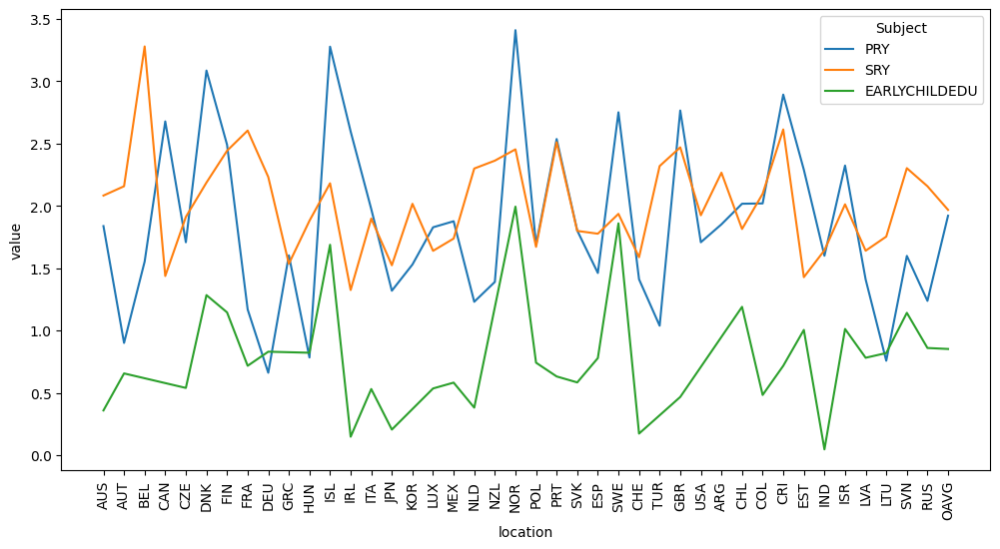

In [62]:
df_filtrado = df_33[df_33['subject'].isin(['EARLYCHILDEDU', 'PRY', 'SRY'])]

plt.figure(figsize=(12, 6))
sns.lineplot(data=df_filtrado, x='location', y='value', hue='subject', ci=None)

plt.xticks(rotation=90)

plt.xlabel('location')
plt.ylabel('value')

plt.legend(title='Subject')
plt.show()


En vez de elegir una de estos tres campos de métricas, vamos a realizar una media de las tres para que el gasto en educación aborde más información. Como hemos visto antes, hay registros donde no aparecen las 3 métricas. Aunque se pierda calidad de información, no es un problema grave pues la mayoría de esos registros (sobre todo los que tienen sólo 1 métrica) serán eliminados posteriormente por diversas razones. A nuestra nueva variable la llamaremos EARLY-SRY

In [63]:
filtered_df = df_33[df_33['subject'].isin(['EARLYCHILDEDU', 'PRY', 'SRY'])]

average_df = filtered_df.groupby(['location', 'measure', 'year','id']).agg({'value': 'mean'}).reset_index()

average_df['subject'] = 'EARLY-SRY'

df_33 = pd.concat([df_33, average_df], ignore_index=True)

df_33[df_33["subject"] == 'EARLY-SRY'].sample(n=10)

,location,subject,measure,year,value,id
2329,DNK,EARLY-SRY,PC_GDP,2017,1.637288,2017_DNK
2662,SVK,EARLY-SRY,PC_GDP,2012,1.042718,2012_SVK
2254,CAN,EARLY-SRY,PC_GDP,2012,1.825731,2012_CAN
2290,CRI,EARLY-SRY,PC_GDP,2013,2.075009,2013_CRI
2541,MEX,EARLY-SRY,PC_GDP,2005,1.480506,2005_MEX
2417,HUN,EARLY-SRY,PC_GDP,2014,1.135225,2014_HUN
2528,LVA,EARLY-SRY,PC_GDP,2009,1.579175,2009_LVA
2652,RUS,EARLY-SRY,PC_GDP,2016,1.436487,2016_RUS
2561,NLD,EARLY-SRY,PC_GDP,2012,1.372773,2012_NLD
2396,GBR,EARLY-SRY,PC_GDP,2014,1.762821,2014_GBR


In [64]:
df_33.subject.value_counts()

EARLY-SRY        512
PRY_NTRY         510
TRY              499
PRY              490
SRY              405
EARLYCHILDEDU    305
Name: subject, dtype: int64

In [65]:
df_33=df_33[df_33["subject"]=="EARLY-SRY"]
df_33.shape

(512, 6)

In [66]:
df_33.sample(5)

,location,subject,measure,year,value,id
2311,DEU,EARLY-SRY,PC_GDP,2013,1.249725,2013_DEU
2498,KOR,EARLY-SRY,PC_GDP,2018,1.765759,2018_KOR
2485,JPN,EARLY-SRY,PC_GDP,2010,2.848551,2010_JPN
2252,CAN,EARLY-SRY,PC_GDP,2010,3.947410,2010_CAN
2301,CZE,EARLY-SRY,PC_GDP,2015,1.046440,2015_CZE


In [67]:
df_33.drop(columns=["subject","measure"],inplace=True)
df_33.sample(5)

,location,year,value,id
2719,USA,2018,1.743424,2018_USA
2493,JPN,2018,0.909757,2018_JPN
2614,POL,2005,1.423504,2005_POL
2307,DEU,2008,1.168210,2008_DEU
2431,IRL,2011,4.327207,2011_IRL


In [68]:
df_33_1=df_33.copy()
df_33.drop(columns=["year","location"],inplace=True)
df_33.rename(columns={"value":"education_spending"},inplace=True)
df_33.sample(5)

,education_spending,id
2554,1.147340,1995_NLD
2556,1.310819,2005_NLD
2636,1.703341,2014_PRT
2526,1.282385,2005_LVA
2330,1.619733,2018_DNK


In [69]:
df=df.merge(df_33,how="left",on="id")
df.head(5)

,id,year,location,rea_boys_value,rea_girls_value,rea_total_value,sci_boys_value,sci_girls_value,sci_total_value,mat_boys_value,mat_girls_value,mat_total_value,education_spending
0,2000_AUS,2000.0,AUS,513.00,546.000,528.0,NaN,NaN,NaN,NaN,NaN,NaN,1.256071
1,2003_AUS,2003.0,AUS,506.00,545.000,525.0,NaN,NaN,NaN,527.000,522.000,524.0,NaN
2,2006_AUS,2006.0,AUS,495.00,532.000,513.0,527.000,527.000,527.0,527.000,513.000,520.0,NaN
3,2009_AUS,2009.0,AUS,496.00,533.000,515.0,527.000,528.000,527.0,519.000,509.000,514.0,1.410902
4,2012_AUS,2012.0,AUS,495.09,529.542,512.0,523.728,519.124,521.0,510.115,497.821,504.0,1.439487


In [70]:
df.education_spending.isna().sum()

108

In [71]:
total_filas = len(df)
print(f'Cantidad total de filas en el DataFrame: {total_filas}')

valores_nulos = df['education_spending'].isna().sum()
print(f'Cantidad de valores nulos en education_spending: {valores_nulos}')

porcentaje_nulos = (valores_nulos / total_filas) * 100
porcentaje_formatado1 = "{:.2f}".format(porcentaje_nulos)
print(f'Porcentaje de valores nulos en education_spending: {porcentaje_formatado1}%')


Cantidad total de filas en el DataFrame: 270
Cantidad de valores nulos en education_spending: 108
Porcentaje de valores nulos en education_spending: 40.00%


### `3.4. Salarios de los profesores`

Datos registrados de 2005 a 2021. Los salarios de los maestros son los salarios brutos promedio del personal docente según las escalas salariales oficiales, antes de la deducción de impuestos, incluidas las contribuciones del empleado para planes de jubilación o atención médica, y otras contribuciones o primas para el seguro social u otros fines, pero menos la contribución del empleador a la seguridad social y la pensión. Los salarios basados en las calificaciones más prevalentes se muestran en USD que cubren a los maestros de educación infantil, maestros de primaria y secundaria al comienzo de su carrera, después de 15 años, y en la parte superior de la escala. Las tendencias salariales se muestran como un índice con el año base 2010.

| Subject           | Descripción                                       |
|------------------|-------------------------------------------------|
| PRY15YREXP       | Primaria, 15 años de experiencia                |
| PRY_START        | Primaria, a partir de                           |
| PRY_TOP          | Primaria, superior a escala                    |
| LOWSRY_15YREXP   | Secundaria inferior, 15 años de experiencia    |
| UPPSRY_15YREXP   | Secundaria superior, 15 años de experiencia    |
| LOWSRY_START     | Secundaria inferior, a partir de                |
| UPPSRY_START     | Secundaria superior, a partir de                |
| UPPSRY_TOP       | Secundaria superior, superior de escala        |
| LOWSRY_TOP       | Secundaria inferior, parte superior de la escala|
| EARLYCHILDEDU_15YREXP | Educación infantil, 15 años de experiencia |
| EARLYCHILDEDU_START  | Educación de la primera infancia, inicio  |
| EARLYCHILDEDU_TOP    | Educación infantil, a la altura de la escala |


In [72]:
df_314 = pd.read_csv("data/Teachers_ salaries_2005_2021(18).csv")
df_314.columns = df_314.columns.str.lower().str.replace(' ', '_')
df_314.sample(5)

,location,indicator,subject,measure,frequency,time,value,flag_codes
518,DNK,TEACHERSALARY,LOWSRY_15YREXP,IDX2010,A,2019,95.103321,NaN
847,HUN,TEACHERSALARY,LOWSRY_15YREXP,IDX2010,A,2009,79.084602,NaN
1284,NOR,TEACHERSALARY,LOWSRY_15YREXP,IDX2010,A,2006,85.546338,NaN
1150,KOR,TEACHERSALARY,EARLYCHILDEDU_15YREXP,IDX2010,A,2011,93.259029,NaN
1055,JPN,TEACHERSALARY,LOWSRY_15YREXP,IDX2010,A,2020,99.864469,NaN


In [73]:
get_unique_values(df_314,["location","time","value"])

Valores únicos de la columna 'indicator':
['TEACHERSALARY']
Cantidad de valores únicos en la columna 'indicator': 1

Valores únicos de la columna 'subject':
['PRY15YREXP' 'PRY_START' 'PRY_TOP' 'LOWSRY_15YREXP' 'UPPSRY_15YREXP'
 'LOWSRY_START' 'UPPSRY_START' 'UPPSRY_TOP' 'LOWSRY_TOP'
 'EARLYCHILDEDU_15YREXP' 'EARLYCHILDEDU_START' 'EARLYCHILDEDU_TOP']
Cantidad de valores únicos en la columna 'subject': 12

Valores únicos de la columna 'measure':
['USD' 'IDX2010']
Cantidad de valores únicos en la columna 'measure': 2

Valores únicos de la columna 'frequency':
['A']
Cantidad de valores únicos en la columna 'frequency': 1

Valores únicos de la columna 'flag_codes':
[nan]
Cantidad de valores únicos en la columna 'flag_codes': 1



In [74]:
df_314.shape

(2276, 8)

In [75]:
df_314.measure.value_counts()

IDX2010    1884
USD         392
Name: measure, dtype: int64

Parece que la medida IDX2010 es más explorable.

In [76]:
def get_unique_subjects(x):
    unique_subjects = x.unique()
    return ', '.join(unique_subjects)

def count_unique_subjects(x):
    return len(x.unique())

unique_subjects_df = df_314.groupby('measure')['subject'].agg(get_unique_subjects).reset_index()
count_unique_subjects_df = df_314.groupby('measure')['subject'].agg(count_unique_subjects).reset_index()

unique_subjects_df.columns = ['measure', 'unique_subjects']
count_unique_subjects_df.columns = ['measure', 'count_unique_subjects']

df_combined = count_unique_subjects_df.merge(unique_subjects_df, on='measure')

df_combined

,measure,count_unique_subjects,unique_subjects
0,IDX2010,4,"LOWSRY_15YREXP, PRY15YREXP, UPPSRY_15YREXP, EA..."
1,USD,12,"PRY15YREXP, PRY_START, PRY_TOP, LOWSRY_15YREXP..."


In [77]:
df_314.groupby('measure')['time'].unique()

measure
IDX2010    [2005, 2006, 2007, 2008, 2009, 2010, 2011, 201...
USD                                       [2021, 2020, 2019]
Name: time, dtype: object

Como se esperaba, vamos a quedarnos con la medida IDX2010 pues tiene registros en la mayoría de años que nos interesan.

In [78]:
df_314.subject.value_counts()

PRY15YREXP               535
LOWSRY_15YREXP           535
UPPSRY_15YREXP           525
EARLYCHILDEDU_15YREXP    411
PRY_START                 38
LOWSRY_START              38
UPPSRY_START              38
PRY_TOP                   33
UPPSRY_TOP                33
LOWSRY_TOP                33
EARLYCHILDEDU_START       30
EARLYCHILDEDU_TOP         27
Name: subject, dtype: int64

In [79]:
df_314=df_314[df_314.measure=="IDX2010"]
display(df_314.sample(5))
display(df_314.shape)

,location,indicator,subject,measure,frequency,time,value,flag_codes
2014,OAVG,TEACHERSALARY,EARLYCHILDEDU_15YREXP,IDX2010,A,2019,108.083709,NaN
2070,CZE,TEACHERSALARY,UPPSRY_15YREXP,IDX2010,A,2021,137.104133,NaN
973,ITA,TEACHERSALARY,LOWSRY_15YREXP,IDX2010,A,2009,106.682576,NaN
794,GRC,TEACHERSALARY,PRY15YREXP,IDX2010,A,2010,140.557688,NaN
1507,SVK,TEACHERSALARY,UPPSRY_15YREXP,IDX2010,A,2011,81.841313,NaN


(1884, 8)

La medida IDX2010 es un índice con un año base, aunque se informa que este año es 2010, comprobamos que en realidad es 2015. Cuando se trabaja con índices, es común utilizar un año base con un valor de 100 para facilitar la comparación a lo largo del tiempo. Sin embargo, para análisis más detallados y comparaciones internacionales, hemos encontrado otra fuente de datos que proporciona los salarios de los profesores en USD para todos los países en 2015. Esto nos permitirá analizar las diferencias salariales entre los países de manera más precisa.

In [80]:
df_314_2010 = df_314[df_314['time'] == 2010]
df_314_2010.sample(5)

,location,indicator,subject,measure,frequency,time,value,flag_codes
1742,CHL,TEACHERSALARY,PRY15YREXP,IDX2010,A,2010,97.729545,NaN
938,IRL,TEACHERSALARY,PRY15YREXP,IDX2010,A,2010,103.655389,NaN
1450,PRT,TEACHERSALARY,UPPSRY_15YREXP,IDX2010,A,2010,108.894053,NaN
1841,ISR,TEACHERSALARY,EARLYCHILDEDU_15YREXP,IDX2010,A,2010,74.214117,NaN
635,FIN,TEACHERSALARY,EARLYCHILDEDU_15YREXP,IDX2010,A,2010,101.994379,NaN


In [81]:
df_314_2015 = df_314[df_314['time'] == 2015]
df_314_2015.sample(5)

,location,indicator,subject,measure,frequency,time,value,flag_codes
1792,ISR,TEACHERSALARY,LOWSRY_15YREXP,IDX2010,A,2015,100.0,NaN
1120,KOR,TEACHERSALARY,PRY15YREXP,IDX2010,A,2015,100.0,NaN
460,AUT,TEACHERSALARY,LOWSRY_15YREXP,IDX2010,A,2015,100.0,NaN
817,GRC,TEACHERSALARY,UPPSRY_15YREXP,IDX2010,A,2015,100.0,NaN
2143,SWE,TEACHERSALARY,PRY15YREXP,IDX2010,A,2015,100.0,NaN


In [82]:
Location_df_314 = df_314[df_314['time'] == 2015]['location'].unique()

display("Países Salario de los profesores IDX2010 año 2015:", Location_df_314)
display("Subject:", df_314[df_314['time'] == 2015]['subject'].unique())

df_314_aux = pd.read_csv("data/Teachers_ salaries_2015_USD.csv")

Location_aux = df_314_aux['LOCATION'].unique()
display("Países Salario de los profesores USD año 2015:", Location_aux)
display("Subject:", df_314_aux['SUBJECT'].unique())

paises_ausentes = [pais for pais in Location_df_314 if pais not in Location_aux]

if len(paises_ausentes) == 0:
    print("Todos los países PISA están presentes en df_314_aux.")
else:
    print("Faltan los siguientes países:")
    print(paises_ausentes)


Subject_ausentes = [subject for subject in df_314[df_314['time'] == 2015]['subject'].unique() if subject not in df_314_aux['SUBJECT'].unique()]

if len(Subject_ausentes) == 0:
    print("Todos los países PISA están presentes en df_314_aux.")
else:
    print("Faltan los siguientes subjects:")
    print(Subject_ausentes)

'Países Salario de los profesores IDX2010 año 2015:'

array(['AUS', 'AUT', 'DNK', 'FIN', 'FRA', 'DEU', 'GRC', 'HUN', 'IRL',
       'ITA', 'JPN', 'KOR', 'LUX', 'MEX', 'NOR', 'POL', 'PRT', 'SVK',
       'ESP', 'TUR', 'USA', 'CHL', 'ISR', 'LVA', 'SVN', 'OAVG', 'CAN',
       'CZE', 'NLD', 'NZL', 'SWE', 'COL', 'CRI', 'LTU'], dtype=object)

'Subject:'

array(['LOWSRY_15YREXP', 'PRY15YREXP', 'UPPSRY_15YREXP',
       'EARLYCHILDEDU_15YREXP'], dtype=object)

'Países Salario de los profesores USD año 2015:'

array(['AUS', 'AUT', 'CAN', 'CZE', 'DNK', 'FIN', 'FRA', 'DEU', 'GRC',
       'HUN', 'IRL', 'ITA', 'JPN', 'KOR', 'LUX', 'MEX', 'NLD', 'NZL',
       'NOR', 'POL', 'PRT', 'SVK', 'ESP', 'SWE', 'TUR', 'USA', 'CHL',
       'ISR', 'SVN', 'COL', 'CRI', 'LVA', 'LTU'], dtype=object)

'Subject:'

array(['PRY15YREXP', 'LOWSRY_15YREXP', 'UPPSRY_15YREXP'], dtype=object)

Faltan los siguientes países:
['OAVG']
Faltan los siguientes subjects:
['EARLYCHILDEDU_15YREXP']


In [83]:
df_314 = df_314.sort_values(by=["location", "time", "subject" ]).reset_index(drop=True)
df_314.iloc[:44]

,location,indicator,subject,measure,frequency,time,value,flag_codes
0,AUS,TEACHERSALARY,EARLYCHILDEDU_15YREXP,IDX2010,A,2005,87.850885,NaN
1,AUS,TEACHERSALARY,LOWSRY_15YREXP,IDX2010,A,2005,87.467984,NaN
2,AUS,TEACHERSALARY,PRY15YREXP,IDX2010,A,2005,87.359045,NaN
3,AUS,TEACHERSALARY,UPPSRY_15YREXP,IDX2010,A,2005,87.467984,NaN
4,AUS,TEACHERSALARY,EARLYCHILDEDU_15YREXP,IDX2010,A,2006,85.609940,NaN
5,AUS,TEACHERSALARY,LOWSRY_15YREXP,IDX2010,A,2006,86.158043,NaN
6,AUS,TEACHERSALARY,PRY15YREXP,IDX2010,A,2006,85.378517,NaN
7,AUS,TEACHERSALARY,UPPSRY_15YREXP,IDX2010,A,2006,86.158043,NaN
8,AUS,TEACHERSALARY,EARLYCHILDEDU_15YREXP,IDX2010,A,2007,87.877284,NaN
9,AUS,TEACHERSALARY,LOWSRY_15YREXP,IDX2010,A,2007,87.860929,NaN


In [84]:
df_314_aux = df_314_aux.sort_values(by=["LOCATION", "SUBJECT"]).reset_index(drop=True)
df_314_aux.head(3)

,LOCATION,INDICATOR,SUBJECT,MEASURE,FREQUENCY,TIME,Value,Flag Codes
0,AUS,TEACHERSALARY,LOWSRY_15YREXP,USD,A,2015,59760.968,NaN
1,AUS,TEACHERSALARY,PRY15YREXP,USD,A,2015,59697.374,NaN
2,AUS,TEACHERSALARY,UPPSRY_15YREXP,USD,A,2015,59760.968,NaN


In [85]:
df_314.groupby('subject')['value'].apply(lambda x: x.isna().sum())

subject
EARLYCHILDEDU_15YREXP    0
LOWSRY_15YREXP           0
PRY15YREXP               0
UPPSRY_15YREXP           0
Name: value, dtype: int64

In [86]:
mapping_dict = df_314_aux.set_index(['LOCATION', 'SUBJECT'])['Value'].to_dict()

def adjust_values(row):
    location = row['location']
    subject = row['subject']
    time = row['time']

    # Obtener el valor correspondiente a 2015 en USD en función de "location" y "subject".
    value_2015_usd = mapping_dict.get((location, subject), None)

    if value_2015_usd is not None:
        # Ajustar los valores basados en la medida IDX2010 utilizando el valor de 2015 en USD como referencia.
        row['value'] = (row['value'] * (value_2015_usd)) / 100

        row['value'] = round(row['value'], 2)
    else:
        row['value'] = np.nan

    row['measure'] = 'USD'

    return row

df_314 = df_314.apply(adjust_values, axis=1)

df_314.iloc[:44]


,location,indicator,subject,measure,frequency,time,value,flag_codes
0,AUS,TEACHERSALARY,EARLYCHILDEDU_15YREXP,USD,A,2005,NaN,NaN
1,AUS,TEACHERSALARY,LOWSRY_15YREXP,USD,A,2005,52271.71,NaN
2,AUS,TEACHERSALARY,PRY15YREXP,USD,A,2005,52151.06,NaN
3,AUS,TEACHERSALARY,UPPSRY_15YREXP,USD,A,2005,52271.71,NaN
4,AUS,TEACHERSALARY,EARLYCHILDEDU_15YREXP,USD,A,2006,NaN,NaN
5,AUS,TEACHERSALARY,LOWSRY_15YREXP,USD,A,2006,51488.88,NaN
6,AUS,TEACHERSALARY,PRY15YREXP,USD,A,2006,50968.73,NaN
7,AUS,TEACHERSALARY,UPPSRY_15YREXP,USD,A,2006,51488.88,NaN
8,AUS,TEACHERSALARY,EARLYCHILDEDU_15YREXP,USD,A,2007,NaN,NaN
9,AUS,TEACHERSALARY,LOWSRY_15YREXP,USD,A,2007,52506.54,NaN


In [87]:
df_314.groupby('subject')['value'].apply(lambda x: x.isna().sum())

subject
EARLYCHILDEDU_15YREXP    385
LOWSRY_15YREXP            17
PRY15YREXP                17
UPPSRY_15YREXP            17
Name: value, dtype: int64

No hay problema con estos valores nulos porque no íbamos a utilizar el subject "EARLYCHILDEDU_15YREXP" y los otros valores nulos son de location "OAVG", que eliminaremos más adelante.

In [88]:
df_314.loc[(df_314['value'].isna()) & (df_314['subject'].isin(['LOWSRY_15YREXP', 'PRY15YREXP', 'UPPSRY_15YREXP']))]

,location,indicator,subject,measure,frequency,time,value,flag_codes
1406,OAVG,TEACHERSALARY,LOWSRY_15YREXP,USD,A,2005,NaN,NaN
1407,OAVG,TEACHERSALARY,PRY15YREXP,USD,A,2005,NaN,NaN
1408,OAVG,TEACHERSALARY,UPPSRY_15YREXP,USD,A,2005,NaN,NaN
1409,OAVG,TEACHERSALARY,LOWSRY_15YREXP,USD,A,2006,NaN,NaN
1410,OAVG,TEACHERSALARY,PRY15YREXP,USD,A,2006,NaN,NaN
1411,OAVG,TEACHERSALARY,UPPSRY_15YREXP,USD,A,2006,NaN,NaN
1412,OAVG,TEACHERSALARY,LOWSRY_15YREXP,USD,A,2007,NaN,NaN
1413,OAVG,TEACHERSALARY,PRY15YREXP,USD,A,2007,NaN,NaN
1414,OAVG,TEACHERSALARY,UPPSRY_15YREXP,USD,A,2007,NaN,NaN
1415,OAVG,TEACHERSALARY,LOWSRY_15YREXP,USD,A,2008,NaN,NaN


In [89]:
df_314.subject.value_counts()

LOWSRY_15YREXP           503
PRY15YREXP               503
UPPSRY_15YREXP           493
EARLYCHILDEDU_15YREXP    385
Name: subject, dtype: int64

In [90]:
subject = df_314.groupby(['location', 'time'])['subject'].nunique().reset_index()

subject_filtrado = subject[subject['subject'] <= 3]

def get_unique_subjects(row):
    location = row['location']
    time = row['time']
    subjects = df_314[(df_314['location'] == location) & (df_314['time'] == time)]['subject'].unique()
    return ', '.join(subjects)

subject_filtrado['subjects'] = subject_filtrado.apply(get_unique_subjects, axis=1)

subject_filtrado


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,location,time,subject,subjects
16,AUT,2000,3,"LOWSRY_15YREXP, PRY15YREXP, UPPSRY_15YREXP"
17,AUT,2005,3,"LOWSRY_15YREXP, PRY15YREXP, UPPSRY_15YREXP"
18,AUT,2006,3,"LOWSRY_15YREXP, PRY15YREXP, UPPSRY_15YREXP"
19,AUT,2007,3,"LOWSRY_15YREXP, PRY15YREXP, UPPSRY_15YREXP"
20,AUT,2008,3,"LOWSRY_15YREXP, PRY15YREXP, UPPSRY_15YREXP"
21,AUT,2009,3,"LOWSRY_15YREXP, PRY15YREXP, UPPSRY_15YREXP"
22,AUT,2010,3,"LOWSRY_15YREXP, PRY15YREXP, UPPSRY_15YREXP"
23,AUT,2011,3,"LOWSRY_15YREXP, PRY15YREXP, UPPSRY_15YREXP"
24,AUT,2012,3,"LOWSRY_15YREXP, PRY15YREXP, UPPSRY_15YREXP"
25,AUT,2013,3,"LOWSRY_15YREXP, PRY15YREXP, UPPSRY_15YREXP"


Como hemos hecho con el gasto en educación, vamos a realizar una media de diferentes categorías de sueldos para que la información abarque más variedad.

In [91]:
filtered_df = df_314[df_314['subject'].isin(['PRY15YREXP','LOWSRY_15YREXP'])]

average_df = filtered_df.groupby(['location', 'indicator', 'measure','frequency','time']).agg({'value': 'mean'}).reset_index()

average_df['subject'] = 'PRY-SRY'

df_314 = pd.concat([df_314, average_df], ignore_index=True)

df_314['value'] = df_314['value'].round(3)

df_314[df_314["subject"] == 'PRY-SRY'].sample(n=10)

,location,indicator,subject,measure,frequency,time,value,flag_codes
2241,NOR,TEACHERSALARY,PRY-SRY,USD,A,2010,41130.810,NaN
2308,PRT,TEACHERSALARY,PRY-SRY,USD,A,2021,40370.430,NaN
2262,OAVG,TEACHERSALARY,PRY-SRY,USD,A,2007,NaN,NaN
2315,SVK,TEACHERSALARY,PRY-SRY,USD,A,2015,17890.070,NaN
2144,JPN,TEACHERSALARY,PRY-SRY,USD,A,2007,53452.590,NaN
2306,PRT,TEACHERSALARY,PRY-SRY,USD,A,2019,40905.420,NaN
2129,ITA,TEACHERSALARY,PRY-SRY,USD,A,2010,37714.595,NaN
2314,SVK,TEACHERSALARY,PRY-SRY,USD,A,2014,17014.040,NaN
1957,CZE,TEACHERSALARY,PRY-SRY,USD,A,2016,19860.145,NaN
2194,LUX,TEACHERSALARY,PRY-SRY,USD,A,2016,108701.275,NaN


Vamos a quedarnos con los salarios 'EARLY-SRY', por la misma lógica que se aplicó al gasto en educación.


In [92]:
df_314 = df_314[df_314.subject == "PRY-SRY"].reset_index(drop=True)
df_314.shape

(503, 8)

In [93]:
dataframe_quality(df_314)

No se encontraron filas duplicadas.
No hay valores faltantes.
No hay valores inconsistentes.
Valores correctos: [52211.385, 51228.805, 52266.155, 53907.23, 53681.58, 54664.82, 55875.0, 56099.04, 58352.245, 58549.935, 59729.17, 60697.65, 60912.575, 61468.975, 60467.17, 63328.575, 41508.025, 46623.635, 46768.28, 47059.595, 47269.83, 48265.425, 48734.56, 48075.67, 47809.79, 47382.31, 46873.055, 46908.28, 50054.845, 50018.025, 50062.405, 50507.99, 51263.355, 51281.58, 67004.41, 64813.59, 65774.28, 65567.74, 65704.96, 65901.63, 66131.56, 66579.33, 65450.6, 15435.22, 15409.97, 25571.5, 26085.81, 26007.01, 26370.93, 26874.15, 26687.4, 26691.83, 26542.38, 33746.65, 33652.76, 35374.15, 35552.19, 30135.68, 31193.76, 31492.38, 34361.46, 36114.29, 37636.7, 39125.65, 40382.29, 30693.58, 30456.465, 30241.71, 30209.285, 29950.61, 19089.97, 18943.61, 19361.86, 19860.145, 21031.6, 23095.22, 24531.02, 25925.03, 26508.2, 62134.285, 61558.37, 64186.3, 63703.72, 63217.83, 64853.255, 66090.04, 66582.03, 669

In [94]:
elements_in_dataframe(df_314,"location")

BEL does not exist in new dataframe
BRA does not exist in new dataframe
CHE does not exist in new dataframe
EST does not exist in new dataframe
GBR does not exist in new dataframe
HKG does not exist in new dataframe
IDN does not exist in new dataframe
ISL does not exist in new dataframe
MAC does not exist in new dataframe
PER does not exist in new dataframe
RUS does not exist in new dataframe
SGP does not exist in new dataframe
TWN does not exist in new dataframe


In [95]:
try:
    df_314.drop(columns=["subject","indicator","measure","frequency","flag_codes"],inplace=True)
except KeyError:
    pass
df_314.sample(30)

,location,time,value
251,ITA,2016,35133.630
62,COL,2019,37636.700
467,TUR,2000,24851.400
201,HUN,2020,18981.280
24,AUT,2012,47809.790
491,USA,2010,58965.670
21,AUT,2009,48265.425
244,ITA,2009,37532.340
65,CRI,2017,30693.580
187,HUN,2006,18835.450


In [96]:
nulos = df_314['value'].isna().sum()

print(f"Total de valores nulos en la columna 'value': {nulos}")
df_nulos = df_314.loc[df_314['value'].isna()]
df_nulos

Total de valores nulos en la columna 'value': 17


,location,time,value
376,OAVG,2005,NaN
377,OAVG,2006,NaN
378,OAVG,2007,NaN
379,OAVG,2008,NaN
380,OAVG,2009,NaN
381,OAVG,2010,NaN
382,OAVG,2011,NaN
383,OAVG,2012,NaN
384,OAVG,2013,NaN
385,OAVG,2014,NaN


In [97]:
df_314.rename(columns={"time":"year","value":"teachers_salary"},inplace=True)
df_314["id"]=df_314["year"].astype(str)+"_"+df_314["location"]
df_314.drop(columns=["location","year"],inplace=True)
df=df.merge(df_314,how="left",on="id")
df.head(5)

,id,year,location,rea_boys_value,rea_girls_value,rea_total_value,sci_boys_value,sci_girls_value,sci_total_value,mat_boys_value,mat_girls_value,mat_total_value,education_spending,teachers_salary
0,2000_AUS,2000.0,AUS,513.00,546.000,528.0,NaN,NaN,NaN,NaN,NaN,NaN,1.256071,NaN
1,2003_AUS,2003.0,AUS,506.00,545.000,525.0,NaN,NaN,NaN,527.000,522.000,524.0,NaN,NaN
2,2006_AUS,2006.0,AUS,495.00,532.000,513.0,527.000,527.000,527.0,527.000,513.000,520.0,NaN,51228.805
3,2009_AUS,2009.0,AUS,496.00,533.000,515.0,527.000,528.000,527.0,519.000,509.000,514.0,1.410902,53681.580
4,2012_AUS,2012.0,AUS,495.09,529.542,512.0,523.728,519.124,521.0,510.115,497.821,504.0,1.439487,56099.040


In [98]:
df.teachers_salary.isna().sum()

122

In [99]:
df.shape

(270, 14)

In [100]:
total_filas = len(df)
print(f'Cantidad total de filas en el DataFrame: {total_filas}')

valores_nulos = df['teachers_salary'].isna().sum()
print(f'Cantidad de valores nulos en teachers_salary: {valores_nulos}')

porcentaje_nulos = (valores_nulos / total_filas) * 100
porcentaje_formatado2 = "{:.2f}".format(porcentaje_nulos)
print(f'Porcentaje de valores nulos en teachers_salary: {porcentaje_formatado2}%')

Cantidad total de filas en el DataFrame: 270
Cantidad de valores nulos en teachers_salary: 122
Porcentaje de valores nulos en teachers_salary: 45.19%


### `3.5. Jóvenes sin empleo, educación o formación (NEET)`

Datos registrados de 1997 a 2021. Este indicador presenta la proporción de jóvenes que no trabajan, ni estudian ni reciben formación (ninis), como porcentaje del número total de jóvenes en el grupo de edad correspondiente, por sexo. Los jóvenes que estudian incluyen a los que asisten a la educación a tiempo parcial o completo, pero excluyen a los que cursan estudios no formales y a actividades educativas de muy corta duración. El empleo se define de acuerdo con las Directrices de la OCDE/OIT y abarca a todos aquellos que han tenido un trabajo remunerado durante al menos una hora en la semana de referencia de la encuesta o que estuvieron temporalmente ausentes de dicho trabajo. Por lo tanto, los jóvenes ninis pueden estar desempleados o inactivos y no participar en la educación o la formación. Los jóvenes que no trabajan, ni estudian ni reciben formación corren el riesgo de quedar excluidos socialmente, es decir, personas con ingresos por debajo del umbral de pobreza y que carecen de las habilidades para mejorar su situación económica.

In [101]:
df_318 = pd.read_csv("data/Youth not in employment, education or training (NEET)_1997_2021(25).csv")
df_318.columns = df_318.columns.str.lower().str.replace(' ', '_')
df_318.sample(5)

,location,indicator,subject,measure,frequency,time,value,flag_codes
3892,HUN,NEET,15_29_WOMEN,PC_AGE,A,2000,25.647896,NaN
6040,GBR,NEET,15_29_MEN,PC_AGE,A,2010,13.634942,NaN
6101,GBR,NEET,15_29_WOMEN,PC_AGE,A,2005,17.395981,NaN
6288,BRA,NEET,15_19_MEN,PC_AGE,A,2020,17.664537,NaN
2757,BEL,NEET,15_29_WOMEN,PC_AGE,A,2017,13.209764,NaN


In [102]:
df_318.shape

(7318, 8)

In [103]:
get_unique_values(df_318,["location","time","value"])

Valores únicos de la columna 'indicator':
['NEET']
Cantidad de valores únicos en la columna 'indicator': 1

Valores únicos de la columna 'subject':
['15_19' '20_24' '15_29' '15_19_MEN' '20_24_MEN' '15_29_MEN' '15_19_WOMEN'
 '20_24_WOMEN' '15_29_WOMEN']
Cantidad de valores únicos en la columna 'subject': 9

Valores únicos de la columna 'measure':
['PC_AGE']
Cantidad de valores únicos en la columna 'measure': 1

Valores únicos de la columna 'frequency':
['A']
Cantidad de valores únicos en la columna 'frequency': 1

Valores únicos de la columna 'flag_codes':
[nan]
Cantidad de valores únicos en la columna 'flag_codes': 1



Nos interesa filtrar por el rango de edad 15-29 años

In [104]:
df_318=df_318[df_318.subject=="15_29"]
df_318.sample(5)

,location,indicator,subject,measure,frequency,time,value,flag_codes
2279,ISR,NEET,15_29,PC_AGE,A,2007,29.706457,NaN
1987,NZL,NEET,15_29,PC_AGE,A,2020,12.361838,NaN
1646,CAN,NEET,15_29,PC_AGE,A,2002,13.511760,NaN
1856,IRL,NEET,15_29,PC_AGE,A,2003,10.790169,NaN
2110,ESP,NEET,15_29,PC_AGE,A,2018,19.058907,NaN


In [105]:
df_318.shape

(829, 8)

In [106]:
try:
    df_318.drop(columns=["indicator","measure","frequency","flag_codes"],inplace=True)
except KeyError:
    pass
df_318.sample(5)

,location,subject,time,value
1940,MEX,15_29,2015,21.938206
2334,OAVG,15_29,2000,15.824174
2043,PRT,15_29,2001,9.932059
1953,NLD,15_29,2004,7.535714
1852,IRL,15_29,1999,9.944112


In [107]:
dataframe_quality(df_318)

No se encontraron filas duplicadas.
No hay valores faltantes.
No hay valores inconsistentes.
Valores correctos: [16.034595, 14.880802, 13.637552, 13.19296, 12.979, 12.743526, 12.591039, 12.322674, 11.442005, 11.395142, 10.529561, 10.411158, 12.320885, 11.827723, 11.516515, 11.717311, 13.015899, 12.647472, 11.83161, 11.35215, 10.946128, 10.842403, 10.399729, 14.243934, 10.379926, 12.389748, 11.440991, 11.958549, 11.302896, 10.652842, 11.419484, 11.712417, 10.265295, 10.286999, 10.680032, 11.552073, 10.438811, 10.861573, 10.806797, 11.101415, 10.437009, 11.57, 11.379028, 15.246123, 15.449347, 14.318655, 12.918994, 11.738148, 13.997588, 14.364562, 13.9872, 14.18948, 13.903902, 12.734346, 12.107311, 12.740355, 14.208397, 13.893257, 14.955427, 14.977997, 15.014685, 13.80891, 12.989787, 13.241013, 12.750292, 12.602888, 12.460939, 11.269361, 15.791224, 15.126329, 14.063276, 13.706755, 13.080444, 13.51176, 12.872084, 12.98391, 12.332651, 12.016768, 12.087744, 11.916313, 13.361357, 13.668851, 1

In [108]:
elements_in_dataframe(df_318,"location")

HKG does not exist in new dataframe
IDN does not exist in new dataframe
KOR does not exist in new dataframe
MAC does not exist in new dataframe
PER does not exist in new dataframe
SGP does not exist in new dataframe
TWN does not exist in new dataframe


In [109]:
df_318.rename(columns={"time":"year"},inplace=True)
df_318[df_318.year.isin(years)].value.isna().sum()

0

In [110]:
df_318["id"]=df_318["year"].astype(str)+"_"+df_318["location"]
df_318.drop(columns=["location","year","subject"],inplace=True)
df_318.rename(columns={"value":"neet"},inplace=True)
df_318.sample(5)

,neet,id
2185,14.173508,2005_GBR
1700,6.226722,2006_DNK
2277,30.801971,2005_ISR
2223,13.486071,2018_USA
1840,12.140234,2010_ISL


In [111]:
df=df.merge(df_318,how="left",on="id")
df.head(5)

,id,year,location,rea_boys_value,rea_girls_value,rea_total_value,sci_boys_value,sci_girls_value,sci_total_value,mat_boys_value,mat_girls_value,mat_total_value,education_spending,teachers_salary,neet
0,2000_AUS,2000.0,AUS,513.00,546.000,528.0,NaN,NaN,NaN,NaN,NaN,NaN,1.256071,NaN,13.192960
1,2003_AUS,2003.0,AUS,506.00,545.000,525.0,NaN,NaN,NaN,527.000,522.000,524.0,NaN,NaN,12.591039
2,2006_AUS,2006.0,AUS,495.00,532.000,513.0,527.000,527.000,527.0,527.000,513.000,520.0,NaN,51228.805,11.395142
3,2009_AUS,2009.0,AUS,496.00,533.000,515.0,527.000,528.000,527.0,519.000,509.000,514.0,1.410902,53681.580,12.320885
4,2012_AUS,2012.0,AUS,495.09,529.542,512.0,523.728,519.124,521.0,510.115,497.821,504.0,1.439487,56099.040,11.717311


In [112]:
total_filas = len(df)
print(f'Cantidad total de filas en el DataFrame: {total_filas}')

valores_nulos = df['neet'].isna().sum()
print(f'Cantidad de valores nulos en NEET: {valores_nulos}')

porcentaje_nulos = (valores_nulos / total_filas) * 100
porcentaje_formatado3 = "{:.2f}".format(porcentaje_nulos)
print(f'Porcentaje de valores nulos en NEET: {porcentaje_formatado3}%')

Cantidad total de filas en el DataFrame: 270
Cantidad de valores nulos en NEET: 47
Porcentaje de valores nulos en NEET: 17.41%


### `3.6. Repaso y limpieza de los datos añadidos`

#### 3.6.1. Primeras impresiones

Veamos la cantidad de nulos que tiene nuestro dataframe después de realizar los merges.

In [113]:
print(df.education_spending.isna().sum())
print(df.teachers_salary.isna().sum())
print(df.neet.isna().sum())

108
122
47


In [114]:
print(f'Porcentaje de valores nulos en gastos en educación: {porcentaje_formatado1}%')
print(f'Porcentaje de valores nulos en salario de los profesores: {porcentaje_formatado2}%')
print(f'Porcentaje de valores nulos en NEET: {porcentaje_formatado3}%')

Porcentaje de valores nulos en gastos en educación: 40.00%
Porcentaje de valores nulos en salario de los profesores: 45.19%
Porcentaje de valores nulos en NEET: 17.41%


Hay muchos datos nulos, tanto absoluta como relativamente. Veamos si hay países que acumulan la mayoría de nulos. De ser el caso, sería recomendable eliminar todos sus registros.

Vamos a realizar toda la limpieza en un dataframe secundario para no perder los datos. Por ello, crearemos el dataframe df_copy

In [115]:
df_copy=df.copy()
for country in df.location.unique():
    nulls_spend=(df[df["location"]==country]).education_spending.isna().sum()
    nulls_salary=(df[df["location"]==country]).teachers_salary.isna().sum()
    nulls_neet=(df[df["location"]==country]).neet.isna().sum()
    country_rows=(df[df["location"]==country]).shape[0]
    print(f'Para el país {country} existen {nulls_spend}/{country_rows} registros nulos en gastos de educación, {nulls_salary}/{country_rows} registros nulos en salario de profesores y {nulls_neet}/{country_rows} registros nulos en NEET')
    if nulls_spend/country_rows>0.6 or nulls_salary/country_rows>0.6 or nulls_neet/country_rows>0.6:
        df_copy=df_copy[df_copy["location"]!=country]
        print(f'El país {country} ha sido eliminado del dataframe')

Para el país AUS existen 2/7 registros nulos en gastos de educación, 2/7 registros nulos en salario de profesores y 0/7 registros nulos en NEET
Para el país AUT existen 3/6 registros nulos en gastos de educación, 1/6 registros nulos en salario de profesores y 2/6 registros nulos en NEET
Para el país BEL existen 3/7 registros nulos en gastos de educación, 7/7 registros nulos en salario de profesores y 0/7 registros nulos en NEET
El país BEL ha sido eliminado del dataframe
Para el país BRA existen 7/7 registros nulos en gastos de educación, 7/7 registros nulos en salario de profesores y 3/7 registros nulos en NEET
El país BRA ha sido eliminado del dataframe
Para el país CAN existen 2/7 registros nulos en gastos de educación, 5/7 registros nulos en salario de profesores y 0/7 registros nulos en NEET
El país CAN ha sido eliminado del dataframe
Para el país CHE existen 6/7 registros nulos en gastos de educación, 7/7 registros nulos en salario de profesores y 2/7 registros nulos en NEET
El p

Veámoslo en una tabla.

In [116]:
info_rows = []

for country in df['location'].unique():
    nulls_spend = (df[df['location'] == country])['education_spending'].isna().sum()
    nulls_salary = (df[df['location'] == country])['teachers_salary'].isna().sum()
    nulls_neet = (df[df['location'] == country])['neet'].isna().sum()
    country_rows = (df[df['location'] == country]).shape[0]

    info = {
        'País': country,
        'Gasto en Educación': f'{nulls_spend}/{country_rows}',
        'Salario de los Profesores': f'{nulls_salary}/{country_rows}',
        'NEET': f'{nulls_neet}/{country_rows}'
    }

    if nulls_spend / country_rows > 0.6 or nulls_salary / country_rows > 0.6 or nulls_neet / country_rows > 0.6:
        info['Eliminado'] = 'Sí'
    else:
        info['Eliminado'] = 'No'

    info_rows.append(info)

info_df = pd.DataFrame(info_rows)

print("Registro Nulo:")
info_df


Registro Nulo:


,País,Gasto en Educación,Salario de los Profesores,NEET,Eliminado
0,AUS,2/7,2/7,0/7,No
1,AUT,3/6,1/6,2/6,No
2,BEL,3/7,7/7,0/7,Sí
3,BRA,7/7,7/7,3/7,Sí
4,CAN,2/7,5/7,0/7,Sí
5,CHE,6/7,7/7,2/7,Sí
6,CHL,1/6,1/6,4/6,Sí
7,COL,0/2,0/2,0/2,No
8,CRI,1/1,0/1,0/1,Sí
9,CZE,2/7,5/7,0/7,Sí


Podríamos eliminar algunos países, pero mejor veamos si la acumulación de nulos se asocia más con el año de registro.

In [117]:
nulos_por_ano = df_copy.groupby('year').apply(lambda x: x.isnull().sum().sum())
print(nulos_por_ano)

year
2000.0    143
2003.0    113
2006.0     30
2009.0      6
2012.0      2
2015.0      2
2018.0      5
dtype: int64


Se observa que el año 2000 y 2003 tienen muchos registros nulos, luego quitamos sus muestras.

In [118]:
df_copy=df_copy[df_copy["year"]!=2000]
df_copy=df_copy[df_copy["year"]!=2003]
df_copy.reset_index(drop=True,inplace=True)
display(df_copy.groupby('year').apply(lambda x: x.isnull().sum().sum()))
df_copy.groupby('year').apply(lambda x: x[x.isnull().any(axis=1)])

year
2006.0    30
2009.0     6
2012.0     2
2015.0     2
2018.0     5
dtype: int64

id    year location  rea_boys_value  rea_girls_value  \
year                                                                     
2006.0 0    2006_AUS  2006.0      AUS         495.000          532.000   
       5    2006_AUT  2006.0      AUT         468.000          513.000   
       11   2006_DEU  2006.0      DEU         475.000          517.000   
       16   2006_DNK  2006.0      DNK         480.000          509.000   
       21   2006_ESP  2006.0      ESP         443.000          479.000   
       25   2006_FIN  2006.0      FIN         521.000          572.000   
       30   2006_FRA  2006.0      FRA         470.000          505.000   
       35   2006_GRC  2006.0      GRC         432.000          488.000   
       40   2006_HUN  2006.0      HUN         463.000          503.000   
       45   2006_IRL  2006.0      IRL         500.000          534.000   
       50   2006_ISR  2006.0      ISR         417.000          460.000   
       55   2006_ITA  2006.0      ITA         448.000          489.000   
       60   2006_JPN  2006.0      JPN         483.000          513.000   
       66   2006_LUX  2006.0      LUX         464.000          495.000   
       71   2006_LVA  2006.0      LVA           0.000            0.000   
       76   2006_MEX  2006.0      MEX         393.000          427.000   
       81   2006_NOR  2006.0      NOR         462.000          508.000   
       86   2006_POL  2006.0      POL         487.000          528.000   
       91   2006_PRT  2006.0      PRT         455.000          488.000   
       96   2006_SVK  2006.0      SVK         446.000          488.000   
       101  2006_SVN  2006.0      SVN         467.000          521.000   
       106  2006_SWE  2006.0      SWE         488.000          528.000   
       111  2006_TUR  2006.0      TUR         427.000          471.000   
       121  2006_USA  2006.0      USA             NaN              NaN   
2009.0 12   2009_DEU  2009.0      DEU         478.000          518.000   
       36   2009_GRC  2009.0      GRC         459.000          506.000   
       41   2009_HUN  2009.0      HUN         475.000          513.000   
       61   2009_JPN  2009.0      JPN         501.000          540.000   
       72   2009_LVA  2009.0      LVA           0.000            0.000   
       112  2009_TUR  2009.0      TUR         443.000          486.000   
2012.0 108  2012_SWE  2012.0      SWE         457.991          509.135   
       113  2012_TUR  2012.0      TUR         452.843          498.640   
2015.0 19   2015_DNK  2015.0      DNK         489.000          511.000   
       63   2015_JPN  2015.0      JPN         509.000          523.000   
2018.0 64   2018_JPN  2018.0      JPN         493.000          514.000   
       75   2018_LVA  2018.0      LVA         462.000          495.000   
       120  2018_ESP  2018.0      ESP             NaN              NaN   

            rea_total_value  sci_boys_value  sci_girls_value  sci_total_value  \
year                                                                            
2006.0 0              513.0         527.000          527.000            527.0   
       5              490.0         515.000          507.000            511.0   
       11             495.0         519.000          512.000            516.0   
       16             494.0         500.000          491.000            496.0   
       21             461.0         491.000          486.000            488.0   
       25             547.0         562.000          565.000            563.0   
       30             488.0         497.000          494.000            495.0   
       35             460.0         468.000          479.000            473.0   
       40             482.0         507.000          501.000            504.0   
       45             517.0         508.000          509.000            508.0   
       50             439.0         456.000          452.000            454.0   
       55             469.0         477.000          474.000            475.0 

Ordenamos por año y pais.

In [119]:
df_copy.sort_values(by=["year","location"],inplace=True)
df_copy.reset_index(drop=True,inplace=True)
df_copy.groupby('year').apply(lambda x: x[x.isnull().any(axis=1)])

id    year location  rea_boys_value  rea_girls_value  \
year                                                                     
2006.0 0    2006_AUS  2006.0      AUS         495.000          532.000   
       1    2006_AUT  2006.0      AUT         468.000          513.000   
       2    2006_DEU  2006.0      DEU         475.000          517.000   
       3    2006_DNK  2006.0      DNK         480.000          509.000   
       4    2006_ESP  2006.0      ESP         443.000          479.000   
       5    2006_FIN  2006.0      FIN         521.000          572.000   
       6    2006_FRA  2006.0      FRA         470.000          505.000   
       7    2006_GRC  2006.0      GRC         432.000          488.000   
       8    2006_HUN  2006.0      HUN         463.000          503.000   
       9    2006_IRL  2006.0      IRL         500.000          534.000   
       10   2006_ISR  2006.0      ISR         417.000          460.000   
       11   2006_ITA  2006.0      ITA         448.000          489.000   
       12   2006_JPN  2006.0      JPN         483.000          513.000   
       13   2006_LUX  2006.0      LUX         464.000          495.000   
       14   2006_LVA  2006.0      LVA           0.000            0.000   
       15   2006_MEX  2006.0      MEX         393.000          427.000   
       16   2006_NOR  2006.0      NOR         462.000          508.000   
       17   2006_POL  2006.0      POL         487.000          528.000   
       18   2006_PRT  2006.0      PRT         455.000          488.000   
       19   2006_SVK  2006.0      SVK         446.000          488.000   
       20   2006_SVN  2006.0      SVN         467.000          521.000   
       21   2006_SWE  2006.0      SWE         488.000          528.000   
       22   2006_TUR  2006.0      TUR         427.000          471.000   
       23   2006_USA  2006.0      USA             NaN              NaN   
2009.0 25   2009_DEU  2009.0      DEU         478.000          518.000   
       30   2009_GRC  2009.0      GRC         459.000          506.000   
       31   2009_HUN  2009.0      HUN         475.000          513.000   
       35   2009_JPN  2009.0      JPN         501.000          540.000   
       37   2009_LVA  2009.0      LVA           0.000            0.000   
       45   2009_TUR  2009.0      TUR         443.000          486.000   
2012.0 68   2012_SWE  2012.0      SWE         457.991          509.135   
       69   2012_TUR  2012.0      TUR         452.843          498.640   
2015.0 75   2015_DNK  2015.0      DNK         489.000          511.000   
       84   2015_JPN  2015.0      JPN         509.000          523.000   
2018.0 101  2018_ESP  2018.0      ESP             NaN              NaN   
       109  2018_JPN  2018.0      JPN         493.000          514.000   
       112  2018_LVA  2018.0      LVA         462.000          495.000   

            rea_total_value  sci_boys_value  sci_girls_value  sci_total_value  \
year                                                                            
2006.0 0              513.0         527.000          527.000            527.0   
       1              490.0         515.000          507.000            511.0   
       2              495.0         519.000          512.000            516.0   
       3              494.0         500.000          491.000            496.0   
       4              461.0         491.000          486.000            488.0   
       5              547.0         562.000          565.000            563.0   
       6              488.0         497.000          494.000            495.0   
       7              460.0         468.000          479.000            473.0   
       8              482.0         507.000          501.000            504.0   
       9              517.0         508.000          509.000            508.0   
       10             439.0         456.000          452.000            454.0   
       11             469.0         477.000          474.000            475.0 

#### 3.6.2. USA

Se observa que el dataframe ha perdido gran cantidad de nulos como era de esperar. Nos fijamos ahora en que USA no tiene datos de reading en el año 2006.

In [120]:
df_copy[df_copy["location"]=="USA"]

,id,year,location,rea_boys_value,rea_girls_value,rea_total_value,sci_boys_value,sci_girls_value,sci_total_value,mat_boys_value,mat_girls_value,mat_total_value,education_spending,teachers_salary,neet
23,2006_USA,2006.0,USA,NaN,NaN,NaN,489.000,489.000,489.0,479.000,470.000,474.0,NaN,59851.220,12.458967
46,2009_USA,2009.0,USA,488.000,513.000,500.0,509.000,495.000,502.0,497.000,477.000,487.0,1.971164,58841.270,14.538002
70,2012_USA,2012.0,USA,482.498,513.269,498.0,496.529,498.325,497.0,483.647,478.995,481.0,1.783510,61506.020,13.994720
95,2015_USA,2015.0,USA,487.000,507.000,497.0,500.000,493.000,496.0,474.000,465.000,470.0,1.731243,61536.555,15.563759
121,2018_USA,2018.0,USA,494.000,517.000,505.0,503.000,502.000,502.0,482.000,474.000,478.0,1.743424,59420.905,13.486071


Los datos de USA 2006 en lectura no están registrados en ningún informe de internet. Una posible solución es sustituir esos nulos con la media de 2003 y 2009.

In [121]:
df[(df["location"]=="USA")&((df["year"]==2003)|(df["year"]==2009))]

,id,year,location,rea_boys_value,rea_girls_value,rea_total_value,sci_boys_value,sci_girls_value,sci_total_value,mat_boys_value,mat_girls_value,mat_total_value,education_spending,teachers_salary,neet
263,2003_USA,2003.0,USA,479.0,511.0,495.0,NaN,NaN,NaN,486.0,480.0,483.0,NaN,NaN,12.919765
264,2009_USA,2009.0,USA,488.0,513.0,500.0,509.0,495.0,502.0,497.0,477.0,487.0,1.971164,58841.27,14.538002


In [122]:
USA_2006 = (df_copy['year'] == 2006.0) & (df_copy['location'] == 'USA')

if any(USA_2006):
    nuevo_valor_boys = (479 + 488) // 2
    nuevo_valor_girls = (511 + 513) // 2
    nuevo_valor_total = (495 + 500) // 2
    df_copy.loc[USA_2006, 'rea_boys_value'] = nuevo_valor_boys
    df_copy.loc[USA_2006, 'rea_girls_value'] = nuevo_valor_girls
    df_copy.loc[USA_2006, 'rea_total_value'] = nuevo_valor_total

df_copy[df_copy["location"]=="USA"]

,id,year,location,rea_boys_value,rea_girls_value,rea_total_value,sci_boys_value,sci_girls_value,sci_total_value,mat_boys_value,mat_girls_value,mat_total_value,education_spending,teachers_salary,neet
23,2006_USA,2006.0,USA,483.000,512.000,497.0,489.000,489.000,489.0,479.000,470.000,474.0,NaN,59851.220,12.458967
46,2009_USA,2009.0,USA,488.000,513.000,500.0,509.000,495.000,502.0,497.000,477.000,487.0,1.971164,58841.270,14.538002
70,2012_USA,2012.0,USA,482.498,513.269,498.0,496.529,498.325,497.0,483.647,478.995,481.0,1.783510,61506.020,13.994720
95,2015_USA,2015.0,USA,487.000,507.000,497.0,500.000,493.000,496.0,474.000,465.000,470.0,1.731243,61536.555,15.563759
121,2018_USA,2018.0,USA,494.000,517.000,505.0,503.000,502.000,502.0,482.000,474.000,478.0,1.743424,59420.905,13.486071


Hecho

#### 3.6.3. LVA

También se observa del dataframe completo que Letonia tiene varios registros con el valor 0, lo cual se deduce que no es correcto.

In [123]:
df_copy[df_copy["location"]=="LVA"]

,id,year,location,rea_boys_value,rea_girls_value,rea_total_value,sci_boys_value,sci_girls_value,sci_total_value,mat_boys_value,mat_girls_value,mat_total_value,education_spending,teachers_salary,neet
14,2006_LVA,2006.0,LVA,0.0,0.0,479.0,0.0,0.0,490.0,0.0,0.0,486.0,NaN,8033.45,14.360036
37,2009_LVA,2009.0,LVA,0.0,0.0,484.0,0.0,0.0,494.0,0.0,0.0,482.0,1.579175,NaN,20.202469
61,2012_LVA,2012.0,LVA,0.0,0.0,489.0,0.0,0.0,502.0,0.0,0.0,491.0,1.201774,7857.93,19.086819
86,2015_LVA,2015.0,LVA,467.0,509.0,488.0,485.0,496.0,490.0,481.0,483.0,482.0,1.352765,8849.73,12.961889
112,2018_LVA,2018.0,LVA,462.0,495.0,479.0,483.0,491.0,487.0,500.0,493.0,496.0,1.197974,NaN,11.176793


Debemos buscar en la fuente original si no están registrados.

No se pueden encontrar los datos de Letonia por género. Debido a esto vamos a suprimir las puntuaciones por género, utilizando sólo los valores totales. Ésta es una decisión dificil, pues otra solución sería borrar los registros de Letonia para poder tener los datos por género, pero creemos que no nos van a servir de gran ayuda a la hora de hacer nuestros análisis.

In [124]:
df_copy.drop(columns=["rea_boys_value","rea_girls_value","sci_boys_value","sci_girls_value","mat_boys_value","mat_girls_value"],inplace=True)
df_copy.sample(5)

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
117,2018_SVK,2018.0,SVK,458.0,464.0,486.0,1.124537,20797.260,15.148472
44,2009_SWE,2009.0,SWE,497.0,495.0,494.0,3.922372,36878.985,10.992398
62,2012_MEX,2012.0,MEX,424.0,415.0,413.0,1.474865,32366.180,22.882490
23,2006_USA,2006.0,USA,497.0,489.0,474.0,NaN,59851.220,12.458967
55,2012_HUN,2012.0,HUN,488.0,494.0,477.0,1.232209,13756.550,18.879009


Hecho.

#### 3.6.4. ESP

In [125]:
df_copy[df_copy["rea_total_value"].isna()]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
101,2018_ESP,2018.0,ESP,NaN,483.0,481.0,1.253951,46937.615,19.058907


Busquemos este dato

Observamos que la OECD publicó lo siguiente respecto a los resultados de lectura en España:

Los datos de España cumplieron con los Estándares Técnicos de PISA 2018. Sin embargo, algunos datos muestran un comportamiento de respuesta implausible entre los estudiantes. En consecuencia, en el momento de la publicación de este informe, la OCDE no puede asegurar que las comparaciones internacionales, subnacionales y de tendencias de los resultados de España conduzcan a conclusiones válidas sobre la competencia lectora de los estudiantes y, en general, sobre el sistema educativo en España. Por lo tanto, los resultados de lectura de PISA 2018 para España no se publican en este informe y no se incluyen en los resultados promedio de la OCDE.

Las anomalías más evidentes en el comportamiento de respuesta de los estudiantes en España se pueden resumir de la siguiente manera:

    Un gran número de estudiantes españoles respondieron a una sección de la prueba de lectura (la sección de fluidez lectora) de una manera que obviamente no era representativa de su verdadera competencia lectora. La evaluación es en computadora y las acciones de los estudiantes se registran y siguen. Una proporción significativa de estudiantes (incluidos estudiantes que obtuvieron altas puntuaciones en las otras secciones de la prueba PISA) pasaron rápidamente por la sección de fluidez lectora, gastando menos de 25 segundos en total en más de 20 ítems de prueba.

    Muchos de estos estudiantes dieron respuestas patrones (todas sí o todas no, etc.).

    Las respuestas rápidas y patrones no estaban uniformemente presentes en la muestra española, pero se observaron predominantemente en un pequeño número de escuelas en algunas áreas de España.

La información se recoge en el siguiente enlace: https://www.oecd.org/pisa/data/PISA2018Spain_final_esp.pdf

Vamos a eliminar el dato ya que sustituirlo nos parece no adecuado. No queremos predecir un dato que sabemos que existe pero que no conocemos, estamos hablando de un dato que fue anulado y por tanto no existe.

In [126]:
df_copy=df_copy[df_copy["id"]!="2018_ESP"]
df_copy[df_copy["location"]=="ESP"]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
4,2006_ESP,2006.0,ESP,461.0,488.0,480.0,NaN,49366.180,15.878056
27,2009_ESP,2009.0,ESP,481.0,488.0,483.0,1.385694,52181.585,22.630316
51,2012_ESP,2012.0,ESP,488.0,496.0,484.0,1.341707,47407.385,25.629156
76,2015_ESP,2015.0,ESP,496.0,493.0,486.0,1.290729,46236.750,22.820313


#### 3.6.5. Salario de profesores

##### `3.6.5.1. Nulos`

In [127]:
df_copy.isna().sum()

id                     0
year                   0
location               0
rea_total_value        0
sci_total_value        0
mat_total_value        0
education_spending    30
teachers_salary        6
neet                   3
dtype: int64

In [128]:
df_copy[df_copy["teachers_salary"].isna()]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
17,2006_POL,2006.0,POL,508.0,498.0,495.0,NaN,NaN,17.429583
19,2006_SVK,2006.0,SVK,466.0,488.0,492.0,NaN,NaN,19.125250
21,2006_SWE,2006.0,SWE,507.0,503.0,502.0,NaN,NaN,10.463096
37,2009_LVA,2009.0,LVA,484.0,494.0,482.0,1.579175,NaN,20.202469
68,2012_SWE,2012.0,SWE,483.0,485.0,478.0,1.795987,NaN,9.695676
112,2018_LVA,2018.0,LVA,479.0,487.0,496.0,1.197974,NaN,11.176793


Vamos con Suecia

In [129]:
df_copy[df_copy["location"]=="SWE"]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
21,2006_SWE,2006.0,SWE,507.0,503.0,502.0,NaN,NaN,10.463096
44,2009_SWE,2009.0,SWE,497.0,495.0,494.0,3.922372,36878.985,10.992398
68,2012_SWE,2012.0,SWE,483.0,485.0,478.0,1.795987,NaN,9.695676
93,2015_SWE,2015.0,SWE,500.0,493.0,494.0,1.822980,41588.135,9.077164
119,2018_SWE,2018.0,SWE,506.0,499.0,502.0,1.927291,46359.000,8.858016


Volvemos a completar con media aritmética para 2012 y para 2006 continuando la tendencia.

In [130]:
SWE_2012 = (df_copy['year'] == 2012.0) & (df_copy['location'] == 'SWE')
SWE_2015 = (df_copy['year'] == 2015.0) & (df_copy['location'] == 'SWE')
SWE_2009 = (df_copy['year'] == 2009.0) & (df_copy['location'] == 'SWE')


if all([any(SWE_2012), any(SWE_2015), any(SWE_2009)]):
    nuevo_valor_71 = (df_copy.loc[SWE_2015, 'teachers_salary'].values[0] / 2) + (df_copy.loc[SWE_2009, 'teachers_salary'].values[0] / 2)
    df_copy.loc[SWE_2012, 'teachers_salary'] = nuevo_valor_71

SWE_2006 = (df_copy['year'] == 2006.0) & (df_copy['location'] == 'SWE')


if all([any(SWE_2006)]):
    nuevo_valor_22 = df_copy.loc[SWE_2009, 'teachers_salary'].values[0] + (df_copy.loc[SWE_2009, 'teachers_salary'].values[0] - df_copy.loc[SWE_2012, 'teachers_salary'].values[0])
    df_copy.loc[SWE_2006, 'teachers_salary'] = nuevo_valor_22


df_copy[df_copy["location"]=="SWE"]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
21,2006_SWE,2006.0,SWE,507.0,503.0,502.0,NaN,34524.410,10.463096
44,2009_SWE,2009.0,SWE,497.0,495.0,494.0,3.922372,36878.985,10.992398
68,2012_SWE,2012.0,SWE,483.0,485.0,478.0,1.795987,39233.560,9.695676
93,2015_SWE,2015.0,SWE,500.0,493.0,494.0,1.822980,41588.135,9.077164
119,2018_SWE,2018.0,SWE,506.0,499.0,502.0,1.927291,46359.000,8.858016


Veamos Letonia.

In [131]:
df_copy[df_copy["location"]=="LVA"]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
14,2006_LVA,2006.0,LVA,479.0,490.0,486.0,NaN,8033.45,14.360036
37,2009_LVA,2009.0,LVA,484.0,494.0,482.0,1.579175,NaN,20.202469
61,2012_LVA,2012.0,LVA,489.0,502.0,491.0,1.201774,7857.93,19.086819
86,2015_LVA,2015.0,LVA,488.0,490.0,482.0,1.352765,8849.73,12.961889
112,2018_LVA,2018.0,LVA,479.0,487.0,496.0,1.197974,NaN,11.176793


Rellenamos el dato de 2009 con la media de los próximos y el de 2018 con la media de las dos tendencias anteriores.

In [132]:
LVA_2009 = (df_copy['year'] == 2009.0) & (df_copy['location'] == 'LVA')
LVA_2012 = (df_copy['year'] == 2012.0) & (df_copy['location'] == 'LVA')
LVA_2006 = (df_copy['year'] == 2006.0) & (df_copy['location'] == 'LVA')

if all([any(LVA_2009), any(LVA_2012), any(LVA_2006)]):
    nuevo_valor_38 = (df_copy.loc[LVA_2012, 'teachers_salary'].values[0] / 2) + (df_copy.loc[LVA_2006, 'teachers_salary'].values[0] / 2)
    df_copy.loc[LVA_2009, 'teachers_salary'] = nuevo_valor_38

LVA_2018 = (df_copy['year'] == 2018.0) & (df_copy['location'] == 'LVA')
LVA_2015 = (df_copy['year'] == 2015.0) & (df_copy['location'] == 'LVA')

if all([any(LVA_2018), any(LVA_2015), any(LVA_2012)]):
    nuevo_valor_116 = (df_copy.loc[LVA_2015, 'teachers_salary'].values[0] + (df_copy.loc[LVA_2015, 'teachers_salary'].values[0] - df_copy.loc[LVA_2012, 'teachers_salary'].values[0]))/2 + (df_copy.loc[LVA_2015, 'teachers_salary'].values[0] + (df_copy.loc[LVA_2012, 'teachers_salary'].values[0] - df_copy.loc[LVA_2009, 'teachers_salary'].values[0]))/2
    df_copy.loc[LVA_2018, 'teachers_salary'] = nuevo_valor_116

df_copy[df_copy["location"]=="LVA"]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
14,2006_LVA,2006.0,LVA,479.0,490.0,486.0,NaN,8033.45,14.360036
37,2009_LVA,2009.0,LVA,484.0,494.0,482.0,1.579175,7945.69,20.202469
61,2012_LVA,2012.0,LVA,489.0,502.0,491.0,1.201774,7857.93,19.086819
86,2015_LVA,2015.0,LVA,488.0,490.0,482.0,1.352765,8849.73,12.961889
112,2018_LVA,2018.0,LVA,479.0,487.0,496.0,1.197974,9301.75,11.176793


Los datos restantes son Eslovakia y Polonia para 2006. También rellenamos usando la tendencia de los dos registros siguientes.

In [133]:
df_copy[df_copy["location"]=="POL"]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
17,2006_POL,2006.0,POL,508.0,498.0,495.0,NaN,NaN,17.429583
40,2009_POL,2009.0,POL,500.0,508.0,495.0,1.385755,22552.13,14.222003
64,2012_POL,2012.0,POL,518.0,526.0,518.0,1.360302,24732.86,15.982306
89,2015_POL,2015.0,POL,506.0,501.0,504.0,1.306223,25372.94,15.646258
115,2018_POL,2018.0,POL,512.0,511.0,516.0,1.337205,25763.64,12.690605


In [134]:
POL_2006 = (df_copy['year'] == 2006.0) & (df_copy['location'] == 'POL')
POL_2009 = (df_copy['year'] == 2009.0) & (df_copy['location'] == 'POL')
POL_2012 = (df_copy['year'] == 2012.0) & (df_copy['location'] == 'POL')

if all([any(POL_2006), any(POL_2009), any(POL_2012)]):
    nuevo_valor_18 = 2 * df_copy.loc[POL_2009, 'teachers_salary'].values[0] - df_copy.loc[POL_2012, 'teachers_salary'].values[0]
    df_copy.loc[POL_2006, 'teachers_salary'] = nuevo_valor_18
df_copy[df_copy["location"]=="POL"]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
17,2006_POL,2006.0,POL,508.0,498.0,495.0,NaN,20371.40,17.429583
40,2009_POL,2009.0,POL,500.0,508.0,495.0,1.385755,22552.13,14.222003
64,2012_POL,2012.0,POL,518.0,526.0,518.0,1.360302,24732.86,15.982306
89,2015_POL,2015.0,POL,506.0,501.0,504.0,1.306223,25372.94,15.646258
115,2018_POL,2018.0,POL,512.0,511.0,516.0,1.337205,25763.64,12.690605


In [135]:
df_copy[df_copy["location"]=="SVK"]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
19,2006_SVK,2006.0,SVK,466.0,488.0,492.0,NaN,NaN,19.125250
42,2009_SVK,2009.0,SVK,477.0,490.0,497.0,3.013412,14590.94,16.115896
66,2012_SVK,2012.0,SVK,463.0,471.0,482.0,1.042718,14303.97,18.792595
91,2015_SVK,2015.0,SVK,453.0,461.0,475.0,1.115346,17890.07,17.206007
117,2018_SVK,2018.0,SVK,458.0,464.0,486.0,1.124537,20797.26,15.148472


In [136]:
SVK_2006 = (df_copy['year'] == 2006.0) & (df_copy['location'] == 'SVK')
SVK_2009 = (df_copy['year'] == 2009.0) & (df_copy['location'] == 'SVK')
SVK_2012 = (df_copy['year'] == 2012.0) & (df_copy['location'] == 'SVK')

if all([any(SVK_2006), any(SVK_2009), any(SVK_2012)]):
    nuevo_valor_20 = 2 * df_copy.loc[SVK_2009, 'teachers_salary'].values[0] - df_copy.loc[SVK_2012, 'teachers_salary'].values[0]
    df_copy.loc[SVK_2006, 'teachers_salary'] = nuevo_valor_20

df_copy[df_copy["location"]=="SVK"]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
19,2006_SVK,2006.0,SVK,466.0,488.0,492.0,NaN,14877.91,19.125250
42,2009_SVK,2009.0,SVK,477.0,490.0,497.0,3.013412,14590.94,16.115896
66,2012_SVK,2012.0,SVK,463.0,471.0,482.0,1.042718,14303.97,18.792595
91,2015_SVK,2015.0,SVK,453.0,461.0,475.0,1.115346,17890.07,17.206007
117,2018_SVK,2018.0,SVK,458.0,464.0,486.0,1.124537,20797.26,15.148472


Hecho

#### 3.6.6. Ninis

In [137]:
df_copy.isna().sum()

id                     0
year                   0
location               0
rea_total_value        0
sci_total_value        0
mat_total_value        0
education_spending    30
teachers_salary        0
neet                   3
dtype: int64

In [138]:
df_copy[df_copy["neet"].isna()]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
69,2012_TUR,2012.0,TUR,475.0,463.0,448.0,1.660729,28541.11,NaN
84,2015_JPN,2015.0,JPN,516.0,538.0,532.0,0.981387,50746.19,NaN
109,2018_JPN,2018.0,JPN,504.0,529.0,527.0,0.909757,50755.98,NaN


Veamos para Turquía

In [139]:
df_copy[df_copy["location"]=="TUR"]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
22,2006_TUR,2006.0,TUR,447.0,424.0,424.0,NaN,23907.805,42.636936
45,2009_TUR,2009.0,TUR,464.0,454.0,445.0,NaN,26826.865,39.581005
69,2012_TUR,2012.0,TUR,475.0,463.0,448.0,1.660729,28541.110,NaN
94,2015_TUR,2015.0,TUR,428.0,425.0,420.0,1.645602,30596.155,28.777969
120,2018_TUR,2018.0,TUR,466.0,468.0,454.0,1.685528,32082.700,26.480194


Viendo que se presenta una tendencia negativa en el número de "ninis", podemos reemplazar el valor nulo como una media ponderada del resto de valores respecto a la distancia anual.

In [140]:
TUR_2012 = (df_copy['year'] == 2012) & (df_copy['location'] == 'TUR')
TUR_2015 = (df_copy['year'] == 2015) & (df_copy['location'] == 'TUR')
TUR_2006 = (df_copy['year'] == 2006) & (df_copy['location'] == 'TUR')
TUR_2009 = (df_copy['year'] == 2009) & (df_copy['location'] == 'TUR')
TUR_2018 = (df_copy['year'] == 2018) & (df_copy['location'] == 'TUR')

if all([any(TUR_2012), any(TUR_2015), any(TUR_2006), any(TUR_2009), any(TUR_2018)]):
    nuevo_valor = (df_copy.loc[TUR_2015, 'neet'].values[0] / 3) + (df_copy.loc[TUR_2006, 'neet'].values[0] / 6) + (df_copy.loc[TUR_2009, 'neet'].values[0] / 3) + (df_copy.loc[TUR_2018, 'neet'].values[0] / 6)
    df_copy.loc[TUR_2012, 'neet'] = nuevo_valor
df_copy[df_copy["location"]=="TUR"]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
22,2006_TUR,2006.0,TUR,447.0,424.0,424.0,NaN,23907.805,42.636936
45,2009_TUR,2009.0,TUR,464.0,454.0,445.0,NaN,26826.865,39.581005
69,2012_TUR,2012.0,TUR,475.0,463.0,448.0,1.660729,28541.110,34.305846
94,2015_TUR,2015.0,TUR,428.0,425.0,420.0,1.645602,30596.155,28.777969
120,2018_TUR,2018.0,TUR,466.0,468.0,454.0,1.685528,32082.700,26.480194


Veamos con Japón.

In [141]:
df_copy[df_copy["location"]=="JPN"]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
12,2006_JPN,2006.0,JPN,498.0,531.0,523.0,NaN,55845.64,12.038647
35,2009_JPN,2009.0,JPN,520.0,539.0,529.0,NaN,51635.02,12.200111
59,2012_JPN,2012.0,JPN,538.0,547.0,536.0,1.012234,50950.21,11.501273
84,2015_JPN,2015.0,JPN,516.0,538.0,532.0,0.981387,50746.19,NaN
109,2018_JPN,2018.0,JPN,504.0,529.0,527.0,0.909757,50755.98,NaN


Utilizar el mismo criterio que en Turquía sería una buena opción. Sin embargo, buscando datos en la red, la tendencia en Japón es mucho más decreciente, llegando a valores en 2015 por debajo del 5% y en 2018 por debajo del 4%. Dado que no podemos verificar la veracidad de estos datos (desconocemos la confianza de las publicadoras) haremos una media de ambas suposiciones.

In [142]:
JPN_2015 = (df_copy['year'] == 2015) & (df_copy['location'] == 'JPN')
JPN_2012 = (df_copy['year'] == 2012) & (df_copy['location'] == 'JPN')
JPN_2009 = (df_copy['year'] == 2009) & (df_copy['location'] == 'JPN')

if all([any(JPN_2015), any(JPN_2012), any(JPN_2009)]):
    nuevo_valor = (4.8 / 2) + ((df_copy.loc[JPN_2012, 'neet'].values[0] - (df_copy.loc[JPN_2012, 'neet'].values[0] - df_copy.loc[JPN_2009, 'neet'].values[0])) / 2)
    df_copy.loc[JPN_2015, 'neet'] = nuevo_valor

linha_113 = (df_copy['year'] == 2018) & (df_copy['location'] == 'JPN')

if all([any(linha_113), any(JPN_2015), any(JPN_2012)]):
    nuevo_valor = (3.9 / 2) + ((df_copy.loc[JPN_2015, 'neet'].values[0] - (df_copy.loc[JPN_2015, 'neet'].values[0] - df_copy.loc[JPN_2012, 'neet'].values[0])) / 2)
    df_copy.loc[linha_113, 'neet'] = nuevo_valor


df_copy[df_copy["location"]=="JPN"]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
12,2006_JPN,2006.0,JPN,498.0,531.0,523.0,NaN,55845.64,12.038647
35,2009_JPN,2009.0,JPN,520.0,539.0,529.0,NaN,51635.02,12.200111
59,2012_JPN,2012.0,JPN,538.0,547.0,536.0,1.012234,50950.21,11.501273
84,2015_JPN,2015.0,JPN,516.0,538.0,532.0,0.981387,50746.19,8.500056
109,2018_JPN,2018.0,JPN,504.0,529.0,527.0,0.909757,50755.98,7.700636


Hecho

#### 3.6.7 Gasto en educación.

In [143]:
df_copy.isna().sum()

id                     0
year                   0
location               0
rea_total_value        0
sci_total_value        0
mat_total_value        0
education_spending    30
teachers_salary        0
neet                   0
dtype: int64

In [144]:
df_copy[df_copy["education_spending"].isna()]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
0,2006_AUS,2006.0,AUS,513.0,527.0,520.0,NaN,51228.805,11.395142
1,2006_AUT,2006.0,AUT,490.0,511.0,505.0,NaN,46768.280,11.958549
2,2006_DEU,2006.0,DEU,495.0,516.0,504.0,NaN,61558.370,13.602721
3,2006_DNK,2006.0,DNK,494.0,496.0,513.0,NaN,53278.370,6.226722
4,2006_ESP,2006.0,ESP,461.0,488.0,480.0,NaN,49366.180,15.878056
5,2006_FIN,2006.0,FIN,547.0,563.0,548.0,NaN,42871.030,10.433372
6,2006_FRA,2006.0,FRA,488.0,495.0,496.0,NaN,37222.715,15.150719
7,2006_GRC,2006.0,GRC,460.0,473.0,459.0,NaN,35355.440,16.701204
8,2006_HUN,2006.0,HUN,482.0,504.0,491.0,NaN,18835.450,17.044252
9,2006_IRL,2006.0,IRL,517.0,508.0,501.0,NaN,52073.275,10.397779


In [145]:
display(df_copy[df_copy["education_spending"].isna()].location.unique())

display(df_copy[df_copy["education_spending"].isna()].year.unique())

display(df_33_1["year"].unique())

array(['AUS', 'AUT', 'DEU', 'DNK', 'ESP', 'FIN', 'FRA', 'GRC', 'HUN',
       'IRL', 'ISR', 'ITA', 'JPN', 'LUX', 'LVA', 'MEX', 'NOR', 'POL',
       'PRT', 'SVK', 'SVN', 'SWE', 'TUR', 'USA'], dtype=object)

array([2006., 2009., 2015.])

array([2008, 2009, 2010, 2011, 2000, 2005, 2012, 2013, 2014, 2015, 2016,
       2017, 2018, 2019, 1995, 2020])

Veamos los registros de estos países en el dataframe original.

In [146]:
countries=df_copy[(df_copy["education_spending"].isna())].location.unique().tolist()
df_33_1[(df_33_1["location"].isin(countries))&(df_33_1["year"].isin([2005,2008]))]

,location,year,value,id
2214,AUS,2005,1.282893,2005_AUS
2215,AUS,2008,1.281373,2008_AUS
2306,DEU,2005,1.223547,2005_DEU
2307,DEU,2008,1.168210,2008_DEU
2320,DNK,2005,4.356052,2005_DNK
2321,DNK,2008,4.132153,2008_DNK
2334,ESP,2005,1.148465,2005_ESP
2335,ESP,2008,1.272582,2008_ESP
2362,FIN,2005,2.326169,2005_FIN
2363,FIN,2008,2.322652,2008_FIN


Vamos a rellenar los datos de 2006 con los de 2005.

In [147]:
for country in countries:
    try:
        m=df_33_1.loc[((df_33_1["location"]==country)&(df_33_1["year"]==2005)),"value"].values[0]
        df_copy.loc[(df_copy["location"]==country)&(df_copy["year"]==2006),"education_spending"]=m
    except IndexError:
        pass

In [148]:
df_copy[df_copy.education_spending.isna()]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
1,2006_AUT,2006.0,AUT,490.0,511.0,505.0,NaN,46768.280,11.958549
8,2006_HUN,2006.0,HUN,482.0,504.0,491.0,NaN,18835.450,17.044252
13,2006_LUX,2006.0,LUX,479.0,486.0,490.0,NaN,87591.060,8.560420
22,2006_TUR,2006.0,TUR,447.0,424.0,424.0,NaN,23907.805,42.636936
25,2009_DEU,2009.0,DEU,497.0,520.0,513.0,NaN,63217.830,11.639909
30,2009_GRC,2009.0,GRC,483.0,470.0,466.0,NaN,34904.280,16.617811
31,2009_HUN,2009.0,HUN,494.0,503.0,490.0,NaN,15628.010,17.737835
35,2009_JPN,2009.0,JPN,520.0,539.0,529.0,NaN,51635.020,12.200111
45,2009_TUR,2009.0,TUR,464.0,454.0,445.0,NaN,26826.865,39.581005
75,2015_DNK,2015.0,DNK,500.0,502.0,511.0,NaN,55966.690,11.433514


In [149]:
countries=df_copy[(df_copy["education_spending"].isna())].location.unique().tolist()
countries

['AUT', 'HUN', 'LUX', 'TUR', 'DEU', 'GRC', 'JPN', 'DNK']

In [150]:
df_33_1[(df_33_1["location"].isin(countries))&(df_33_1["year"].isin([2008,2010,2011,2014,2016]))]

,location,year,value,id
2229,AUT,2014,1.241855,2014_AUT
2231,AUT,2016,1.260675,2016_AUT
2307,DEU,2008,1.168210,2008_DEU
2308,DEU,2010,1.291406,2010_DEU
2309,DEU,2011,1.248499,2011_DEU
2312,DEU,2014,1.246870,2014_DEU
2314,DEU,2016,1.228877,2016_DEU
2321,DNK,2008,4.132153,2008_DNK
2323,DNK,2010,4.665208,2010_DNK
2324,DNK,2011,4.252995,2011_DNK


Para Dinamarca 2015 hacemos la media de 2014 y 2016.

In [151]:
df_copy.loc[(df_copy["location"]=="DNK")&(df_copy["year"]==2015),"education_spending"]=(df_33_1.loc[((df_33_1["location"]=="DNK")&(df_33_1["year"]==2014)),"value"].values[0]+df_33_1.loc[((df_33_1["location"]=="DNK")&(df_33_1["year"]==2016)),"value"].values[0])/2

In [152]:
df_copy[df_copy.education_spending.isna()]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
1,2006_AUT,2006.0,AUT,490.0,511.0,505.0,NaN,46768.280,11.958549
8,2006_HUN,2006.0,HUN,482.0,504.0,491.0,NaN,18835.450,17.044252
13,2006_LUX,2006.0,LUX,479.0,486.0,490.0,NaN,87591.060,8.560420
22,2006_TUR,2006.0,TUR,447.0,424.0,424.0,NaN,23907.805,42.636936
25,2009_DEU,2009.0,DEU,497.0,520.0,513.0,NaN,63217.830,11.639909
30,2009_GRC,2009.0,GRC,483.0,470.0,466.0,NaN,34904.280,16.617811
31,2009_HUN,2009.0,HUN,494.0,503.0,490.0,NaN,15628.010,17.737835
35,2009_JPN,2009.0,JPN,520.0,539.0,529.0,NaN,51635.020,12.200111
45,2009_TUR,2009.0,TUR,464.0,454.0,445.0,NaN,26826.865,39.581005


In [153]:
countries=df_copy[(df_copy["education_spending"].isna())].location.unique().tolist()
countries

['AUT', 'HUN', 'LUX', 'TUR', 'DEU', 'GRC', 'JPN']

Veamos si para los de 2009 podemos rellenarlos con datos de 2010.

In [154]:
df_33_1[(df_33_1["location"].isin(countries))&(df_33_1["year"].isin([2008,2010,2011]))]

,location,year,value,id
2307,DEU,2008,1.168210,2008_DEU
2308,DEU,2010,1.291406,2010_DEU
2309,DEU,2011,1.248499,2011_DEU
2485,JPN,2010,2.848551,2010_JPN
2486,JPN,2011,0.998070,2011_JPN
2512,LUX,2008,2.875418,2008_LUX
2514,LUX,2010,3.295239,2010_LUX
2515,LUX,2011,3.157009,2011_LUX
2698,TUR,2011,1.550798,2011_TUR


Lo hacemos con Alemania con la media de 2008 y 2010, Japón con 2010 y Turquía con 2011.

In [155]:
df_copy.loc[(df_copy["location"]=="DEU")&(df_copy["year"]==2009),"education_spending"]=(df_33_1.loc[((df_33_1["location"]=="DEU")&(df_33_1["year"]==2008)),"value"].values[0]+df_33_1.loc[((df_33_1["location"]=="DEU")&(df_33_1["year"]==2010)),"value"].values[0])/2
df_copy.loc[(df_copy["location"]=="JPN")&(df_copy["year"]==2009),"education_spending"]=df_33_1.loc[((df_33_1["location"]=="JPN")&(df_33_1["year"]==2010)),"value"].values[0]
df_copy.loc[(df_copy["location"]=="TUR")&(df_copy["year"]==2009),"education_spending"]=df_33_1.loc[((df_33_1["location"]=="TUR")&(df_33_1["year"]==2011)),"value"].values[0]
df_copy[df_copy.education_spending.isna()]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
1,2006_AUT,2006.0,AUT,490.0,511.0,505.0,NaN,46768.280,11.958549
8,2006_HUN,2006.0,HUN,482.0,504.0,491.0,NaN,18835.450,17.044252
13,2006_LUX,2006.0,LUX,479.0,486.0,490.0,NaN,87591.060,8.560420
22,2006_TUR,2006.0,TUR,447.0,424.0,424.0,NaN,23907.805,42.636936
30,2009_GRC,2009.0,GRC,483.0,470.0,466.0,NaN,34904.280,16.617811
31,2009_HUN,2009.0,HUN,494.0,503.0,490.0,NaN,15628.010,17.737835


In [156]:
countries=df_copy[(df_copy["education_spending"].isna())].location.unique().tolist()
print(countries)
df_33_1[(df_33_1["location"].isin(countries))&(df_33_1["year"].isin([2000,2005,2007,2008,2010,2011]))]

['AUT', 'HUN', 'LUX', 'TUR', 'GRC']


,location,year,value,id
2403,GRC,2000,2.559750,2000_GRC
2404,GRC,2005,2.733400,2005_GRC
2414,HUN,2000,1.201156,2000_HUN
2512,LUX,2008,2.875418,2008_LUX
2514,LUX,2010,3.295239,2010_LUX
2515,LUX,2011,3.157009,2011_LUX
2698,TUR,2011,1.550798,2011_TUR


In [157]:
for country in countries:
    display(df_copy[df_copy.location==country])

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
1,2006_AUT,2006.0,AUT,490.0,511.0,505.0,NaN,46768.280,11.958549
48,2012_AUT,2012.0,AUT,490.0,506.0,506.0,1.228972,47809.790,10.286999
72,2015_AUT,2015.0,AUT,485.0,495.0,497.0,1.250372,46908.280,10.438811
97,2018_AUT,2018.0,AUT,484.0,490.0,499.0,1.207143,50062.405,11.101415


,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
8,2006_HUN,2006.0,HUN,482.0,504.0,491.0,NaN,18835.45,17.044252
31,2009_HUN,2009.0,HUN,494.0,503.0,490.0,NaN,15628.01,17.737835
55,2012_HUN,2012.0,HUN,488.0,494.0,477.0,1.232209,13756.55,18.879009
80,2015_HUN,2015.0,HUN,470.0,477.0,477.0,1.126321,19761.13,15.890547
105,2018_HUN,2018.0,HUN,476.0,481.0,481.0,1.099896,20479.37,13.499011


,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
13,2006_LUX,2006.0,LUX,479.0,486.0,490.0,NaN,87591.060,8.560420
36,2009_LUX,2009.0,LUX,472.0,484.0,489.0,3.190149,94589.125,7.930428
60,2012_LUX,2012.0,LUX,488.0,491.0,490.0,1.249284,107953.220,8.175474
85,2015_LUX,2015.0,LUX,481.0,483.0,486.0,1.133978,111606.890,8.425355
111,2018_LUX,2018.0,LUX,470.0,477.0,483.0,1.067409,107602.535,8.387812


,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
22,2006_TUR,2006.0,TUR,447.0,424.0,424.0,NaN,23907.805,42.636936
45,2009_TUR,2009.0,TUR,464.0,454.0,445.0,1.550798,26826.865,39.581005
69,2012_TUR,2012.0,TUR,475.0,463.0,448.0,1.660729,28541.110,34.305846
94,2015_TUR,2015.0,TUR,428.0,425.0,420.0,1.645602,30596.155,28.777969
120,2018_TUR,2018.0,TUR,466.0,468.0,454.0,1.685528,32082.700,26.480194


,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
7,2006_GRC,2006.0,GRC,460.0,473.0,459.0,2.733400,35355.44,16.701204
30,2009_GRC,2009.0,GRC,483.0,470.0,466.0,NaN,34904.28,16.617811
54,2012_GRC,2012.0,GRC,477.0,467.0,453.0,1.454595,27992.97,26.738800
79,2015_GRC,2015.0,GRC,467.0,455.0,454.0,1.414897,25637.48,26.147640
104,2018_GRC,2018.0,GRC,457.0,452.0,451.0,1.429420,25519.54,21.454674


Para Grecia 2009 hacemos una media entre 2006 y 2012

In [158]:
df_copy.loc[(df_copy["location"]=="GRC")&(df_copy["year"]==2009),"education_spending"]=(df_copy.loc[((df_copy["location"]=="GRC")&(df_copy["year"]==2006)),"education_spending"].values[0]+df_copy.loc[((df_copy["location"]=="GRC")&(df_copy["year"]==2012)),"education_spending"].values[0])/2

Para Turquía 2006 y Luxemburgo 2006 una interpolación lineal con datos de 2009 y 2012

In [159]:
df_copy.loc[(df_copy["location"]=="TUR")&(df_copy["year"]==2006),"education_spending"]=(2/3)*df_copy.loc[((df_copy["location"]=="TUR")&(df_copy["year"]==2009)),"education_spending"].values[0]+(1/3)*df_copy.loc[((df_copy["location"]=="TUR")&(df_copy["year"]==2012)),"education_spending"].values[0]
df_copy.loc[(df_copy["location"]=="LUX")&(df_copy["year"]==2006),"education_spending"]=(2/3)*df_copy.loc[((df_copy["location"]=="LUX")&(df_copy["year"]==2009)),"education_spending"].values[0]+(1/3)*df_copy.loc[((df_copy["location"]=="LUX")&(df_copy["year"]==2012)),"education_spending"].values[0]

Para Hungría 2006 haremos la media de 2000 y 2012, y posteriormente Hungría 2009 la media de 2006 y 2012

In [160]:
df_copy.loc[(df_copy["location"]=="HUN")&(df_copy["year"]==2006),"education_spending"]=(df_33_1.loc[((df_33_1["location"]=="HUN")&(df_33_1["year"]==2000)),"value"].values[0]+df_copy.loc[((df_copy["location"]=="HUN")&(df_copy["year"]==2012)),"education_spending"].values[0])/2
df_copy.loc[(df_copy["location"]=="HUN")&(df_copy["year"]==2009),"education_spending"]=(df_copy.loc[((df_copy["location"]=="HUN")&(df_copy["year"]==2006)),"education_spending"].values[0]+df_copy.loc[((df_copy["location"]=="HUN")&(df_copy["year"]==2012)),"education_spending"].values[0])/2

Para Austria seguimos explorando.

In [161]:
df_copy[df_copy["location"]=="AUT"]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
1,2006_AUT,2006.0,AUT,490.0,511.0,505.0,NaN,46768.280,11.958549
48,2012_AUT,2012.0,AUT,490.0,506.0,506.0,1.228972,47809.790,10.286999
72,2015_AUT,2015.0,AUT,485.0,495.0,497.0,1.250372,46908.280,10.438811
97,2018_AUT,2018.0,AUT,484.0,490.0,499.0,1.207143,50062.405,11.101415


In [162]:
df_33_1[df_33_1["location"]=="AUT"]

,location,year,value,id
2227,AUT,2012,1.228972,2012_AUT
2228,AUT,2013,1.262627,2013_AUT
2229,AUT,2014,1.241855,2014_AUT
2230,AUT,2015,1.250372,2015_AUT
2231,AUT,2016,1.260675,2016_AUT
2232,AUT,2017,1.246872,2017_AUT
2233,AUT,2018,1.207143,2018_AUT
2234,AUT,2019,1.209118,2019_AUT


Haremos una interpolación lineal de los datos de 2012 a 2014

In [163]:
df_copy.loc[(df_copy.location=='AUT')&(df_copy.year==2006),"education_spending"]=(9/21)*df_33_1.loc[((df_33_1["location"]=="AUT")&(df_33_1["year"]==2012)),"value"].values[0]+(7/21)*df_33_1.loc[((df_33_1["location"]=="AUT")&(df_33_1["year"]==2013)),"value"].values[0]+(5/21)*df_33_1.loc[((df_33_1["location"]=="AUT")&(df_33_1["year"]==2014)),"value"].values[0]

In [164]:
df_copy.education_spending.isna().sum()

0

Hecho.

#### 3.6.8. Último repaso.

In [165]:
df_copy.isna().sum()

id                    0
year                  0
location              0
rea_total_value       0
sci_total_value       0
mat_total_value       0
education_spending    0
teachers_salary       0
neet                  0
dtype: int64

In [166]:
unique_locations = df_copy['location'].unique()

result_df = pd.DataFrame(columns=['location', 'unique_years'])

for location in unique_locations:
    unique_years = df_copy[df_copy['location'] == location]['year'].unique()
    result_df = result_df.append({'location': location, 'unique_years': unique_years}, ignore_index=True)

result_df

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
The frame.append method is deprecated and will be remove

,location,unique_years
0,AUS,"[2006.0, 2009.0, 2012.0, 2015.0, 2018.0]"
1,AUT,"[2006.0, 2012.0, 2015.0, 2018.0]"
2,DEU,"[2006.0, 2009.0, 2012.0, 2015.0, 2018.0]"
3,DNK,"[2006.0, 2009.0, 2012.0, 2015.0, 2018.0]"
4,ESP,"[2006.0, 2009.0, 2012.0, 2015.0]"
5,FIN,"[2006.0, 2009.0, 2012.0, 2015.0, 2018.0]"
6,FRA,"[2006.0, 2009.0, 2012.0, 2015.0, 2018.0]"
7,GRC,"[2006.0, 2009.0, 2012.0, 2015.0, 2018.0]"
8,HUN,"[2006.0, 2009.0, 2012.0, 2015.0, 2018.0]"
9,IRL,"[2006.0, 2009.0, 2012.0, 2015.0, 2018.0]"


In [167]:
df_copy[(df_copy['location'] == 'LTU') | (df_copy['location'] == 'COL')]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
73,2015_COL,2015.0,COL,425.0,416.0,390.0,1.522110,31492.38,20.997860
98,2018_COL,2018.0,COL,412.0,413.0,391.0,1.539098,36114.29,22.749687
110,2018_LTU,2018.0,LTU,476.0,482.0,481.0,1.069106,20001.68,10.495108


In [168]:
display(df_copy.shape)
display(df_copy)

(121, 9)

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
0,2006_AUS,2006.0,AUS,513.0,527.0,520.0,1.282893,51228.805,11.395142
1,2006_AUT,2006.0,AUT,490.0,511.0,505.0,1.243258,46768.280,11.958549
2,2006_DEU,2006.0,DEU,495.0,516.0,504.0,1.223547,61558.370,13.602721
3,2006_DNK,2006.0,DNK,494.0,496.0,513.0,4.356052,53278.370,6.226722
4,2006_ESP,2006.0,ESP,461.0,488.0,480.0,1.148465,49366.180,15.878056
5,2006_FIN,2006.0,FIN,547.0,563.0,548.0,2.326169,42871.030,10.433372
6,2006_FRA,2006.0,FRA,488.0,495.0,496.0,1.514805,37222.715,15.150719
7,2006_GRC,2006.0,GRC,460.0,473.0,459.0,2.733400,35355.440,16.701204
8,2006_HUN,2006.0,HUN,482.0,504.0,491.0,1.216683,18835.450,17.044252
9,2006_IRL,2006.0,IRL,517.0,508.0,501.0,3.239546,52073.275,10.397779


Ya podemos volver a copiar el dataframe original.

In [169]:
df=df_copy.copy()

In [170]:
df.describe()

,year,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet
count,121.000000,121.000000,121.000000,121.000000,121.000000,121.000000,121.000000
mean,2012.099174,487.289256,490.826446,485.983471,1.843450,41685.820661,15.555971
std,4.276691,25.761223,29.670883,29.451934,0.917493,19458.467379,6.636580
min,2006.000000,410.000000,410.000000,390.000000,0.811661,7857.930000,6.226722
25%,2009.000000,476.000000,481.000000,478.000000,1.250467,30029.420000,10.971951
50%,2012.000000,490.000000,495.000000,491.000000,1.503364,40110.950000,13.994720
75%,2015.000000,503.000000,506.000000,502.000000,1.971164,52073.275000,18.792595
max,2018.000000,547.000000,563.000000,548.000000,4.995760,111606.890000,42.636936


## 4. Análisis de datos

### `4.1. Nueva variable`

Vamos a añadir la puntuación media en cada registro.

In [171]:
df["mean_score"]=df[["rea_total_value","sci_total_value","mat_total_value"]].mean(axis=1).round(2)
df.sample(5)

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score
11,2006_ITA,2006.0,ITA,469.0,475.0,462.0,3.000727,37305.52,20.075226,468.67
58,2012_ITA,2012.0,ITA,490.0,494.0,485.0,1.437497,36148.94,24.617849,489.67
103,2018_FRA,2018.0,FRA,493.0,493.0,495.0,1.473582,36909.79,16.096914,493.67
116,2018_PRT,2018.0,PRT,492.0,492.0,492.0,1.908198,41366.52,12.493576,492.00
5,2006_FIN,2006.0,FIN,547.0,563.0,548.0,2.326169,42871.03,10.433372,552.67


Veamos entre que valores se mueven las puntuaciones.

<Axes: >

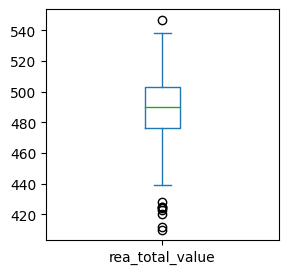

In [172]:
df.rea_total_value.plot(kind='box',figsize=(3,3))

<Axes: >

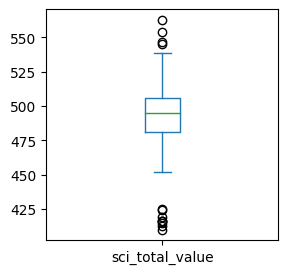

In [173]:
df.sci_total_value.plot(kind='box',figsize=(3,3))

<Axes: >

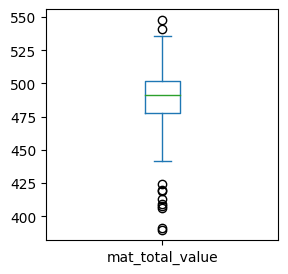

In [174]:
df.mat_total_value.plot(kind='box',figsize=(3,3))

<Axes: >

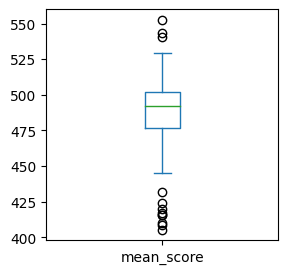

In [175]:
df.mean_score.plot(kind='box',figsize=(3,3))

### `4.2. Gastos en educación`

#### 4.2.1. Organización

Debido a que el análisis puede resultar algo improvisado, constructivo, y por tanto, desordenado, vamos a crear una lista de observaciones para luego analizarlas juntas y sacar conclusiones globales

In [176]:
observaciones_42=[]

#### 4.2.2. Primeras observaciones

Recordemos que la medida del gasto en educación es relativa respecto al PIB del país.

In [177]:
df.education_spending.describe()

count    121.000000
mean       1.843450
std        0.917493
min        0.811661
25%        1.250467
50%        1.503364
75%        1.971164
max        4.995760
Name: education_spending, dtype: float64

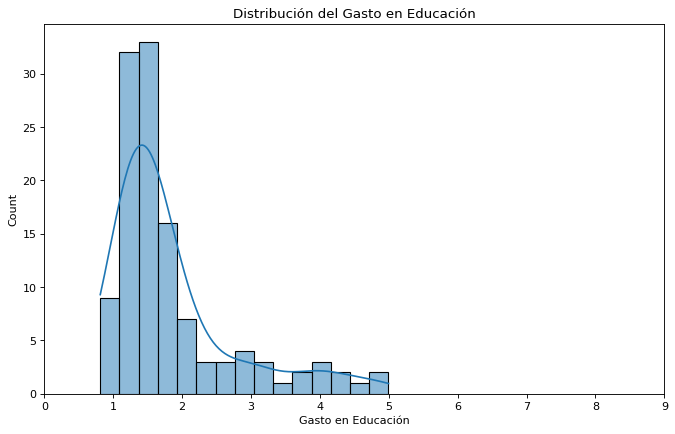

In [178]:
plt.figure(figsize=(10,6), dpi= 80)
sns.histplot(df.education_spending, label="Gasto en Educación", kde=True)
plt.xlabel("Gasto en Educación")
plt.xticks(np.arange(0, 10, 1))
plt.title('Distribución del Gasto en Educación')
plt.show()

Veamos donde se encuentran los datos tan altos.

In [179]:
df[df.education_spending>3]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score
3,2006_DNK,2006.0,DNK,494.0,496.0,513.0,4.356052,53278.370,6.226722,501.00
9,2006_IRL,2006.0,IRL,517.0,508.0,501.0,3.239546,52073.275,10.397779,508.67
11,2006_ITA,2006.0,ITA,469.0,475.0,462.0,3.000727,37305.520,20.075226,468.67
16,2006_NOR,2006.0,NOR,484.0,487.0,490.0,4.891086,38556.820,7.894737,487.00
18,2006_PRT,2006.0,PRT,472.0,474.0,466.0,3.573294,42659.110,12.392595,470.67
20,2006_SVN,2006.0,SVN,494.0,519.0,504.0,4.126616,40394.230,10.769654,505.67
21,2006_SWE,2006.0,SWE,507.0,503.0,502.0,3.965153,34524.410,10.463096,504.00
26,2009_DNK,2009.0,DNK,495.0,499.0,503.0,4.619483,57548.350,8.845994,499.00
32,2009_IRL,2009.0,IRL,496.0,508.0,487.0,4.417780,57958.820,18.578489,497.00
34,2009_ITA,2009.0,ITA,486.0,489.0,483.0,3.103365,37532.340,21.167088,486.00


Veamos la evolución de estos países.

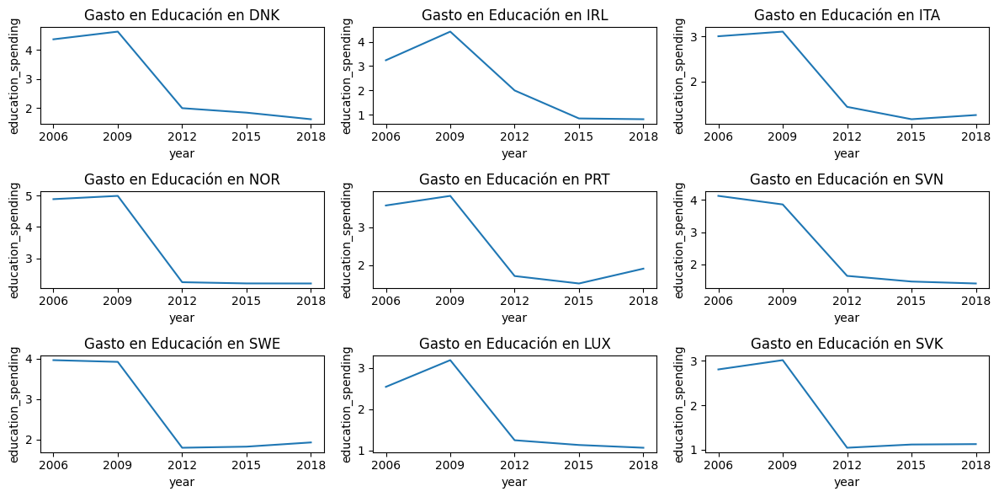

In [180]:
countries=df[(df["education_spending"]>3)].location.unique().tolist()
num_linhas = 3
num_colunas = 3
fig, axs = plt.subplots(num_linhas, num_colunas, figsize=(12, 6))
years_to_display = [2006, 2009, 2012, 2015, 2018]
for ax in axs.flat:
    ax.set_xticks(years_to_display)
for i, country in enumerate(countries):
    linha = i // num_colunas
    coluna = i % num_colunas
    sns.lineplot(data=df[df["location"]==country], x='year', y='education_spending',ax=axs[linha, coluna])
    plt.xlabel('year')
    plt.xticks(df['year'].unique())
    axs[linha, coluna].set_title(f'Gasto en Educación en {country}')
plt.tight_layout()
plt.show()


Podemos observar que en los países con una gran inversión en 2009, se presentó una gran caída posteriormente. Esto es muy probable que se deba al impacto de la crisis ecónomica mundial de 2007, que comenzaría a tener sus consecuencias a partir del año 2010.

Veamos la relación entre el gasto en educación y el desempeño en lectura, ciencias y matemáticas de dichos países.

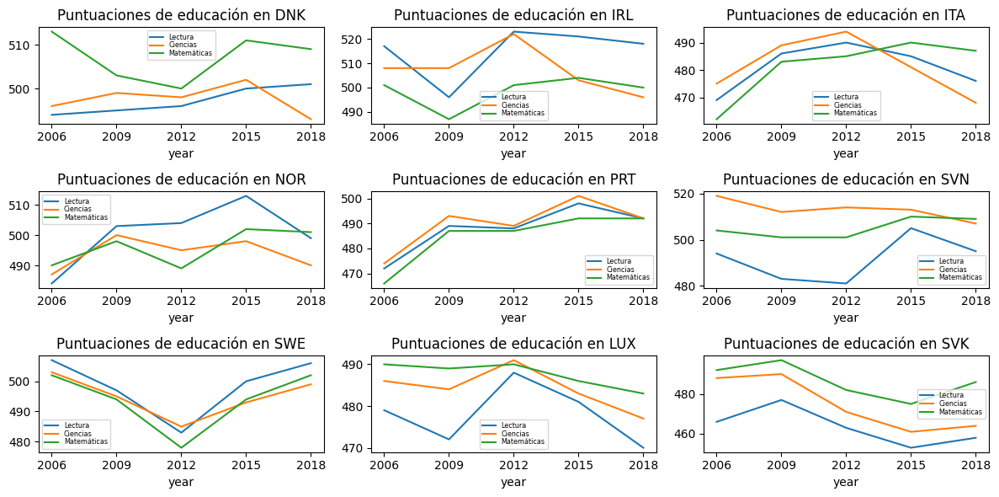

In [181]:
num_lineas = 3
num_columnas = 3
fig, axs = plt.subplots(num_lineas, num_columnas, figsize=(12, 6))
years_to_display = [2006, 2009, 2012, 2015, 2018]
for ax in axs.flat:
    ax.set_xticks(years_to_display)
for i, country in enumerate(countries):
    linha = i // num_columnas
    coluna = i % num_columnas
    sns.lineplot(data=df[df["location"]==country], x='year', y='rea_total_value', ax=axs[linha, coluna], label='Lectura')
    sns.lineplot(data=df[df["location"]==country], x='year', y='sci_total_value', ax=axs[linha, coluna], label='Ciencias')
    sns.lineplot(data=df[df["location"]==country], x='year', y='mat_total_value', ax=axs[linha, coluna], label='Matemáticas')
    axs[linha, coluna].set_ylabel('')
    axs[linha, coluna].set_title(f'Puntuaciones de educación en {country}')
    axs[linha, coluna].legend(fontsize='xx-small', labelspacing=0.1)
plt.tight_layout()
plt.show()

Pese a haber una clara reducción en la inversión educativa, los resultados no reflejan lo mismo. Esto nos dice que la crisis económica de 2007 no se tradujo en una crisis educativa en los países más afectados.

In [182]:
observaciones_42.append("Existen países que tanto en 2006 como en 2009 tenían una gran inversión en educación. En los años posteriores ésta se vio reducida drásticamente, sin embargo, las puntuaciones de los alumnos no se vieron afectadas por esta reducción.")

Volviendo al análisis para todos los países, veamos las correlaciones de la variable con las puntuaciones PISA.

In [183]:
df[['education_spending', 'rea_total_value', 'sci_total_value', 'mat_total_value']].corr()["education_spending"].sort_values(ascending=False)

education_spending    1.000000
rea_total_value       0.087489
sci_total_value       0.082594
mat_total_value       0.082111
Name: education_spending, dtype: float64

Vemos que la correlación es bastante baja, lo que nos sigue rechazando la hipótesis de que el gasto en educación tiene incidencia en los resultados PISA.

Probemos ahora con la correlación de Spearman, que a diferencia de la correlación de Pearson, valora también relaciones no lineales.

In [184]:
df[['education_spending', 'rea_total_value', 'sci_total_value', 'mat_total_value']].corr(method='spearman')["education_spending"].sort_values(ascending=False)

education_spending    1.000000
rea_total_value       0.057462
sci_total_value      -0.036817
mat_total_value      -0.060075
Name: education_spending, dtype: float64

Seguimos teniendo resultados semejantes. De momento no se puede afirmar la hipótesis ni mucho menos. Debemos seguir filtrando y observando diferentes distribuciones para poder sacar conclusiones más firmes.

In [185]:
observaciones_42.append("Las correlaciones del gasto en educación con las puntuaciones de los alumnos son muy bajas, por lo que no se puede afirmar, de momento, que un mayor gasto en educación implique una mejora en las puntuaciones de los alumnos.")

#### 4.2.3. Análisis temporal

In [186]:
for year in df.year.unique():
    df_year=df[df['year']==year]
    df_year=df_year.sort_values(by="education_spending",ascending=False)
    df_year["score_avg"]=df_year[["rea_total_value","sci_total_value","mat_total_value"]].mean(axis=1)
    fig = make_subplots(specs=[[{"secondary_y": True}]])
    fig.update_layout(height=350, width=1500)
    fig.add_trace(go.Bar(x=df_year.location, y=df_year.education_spending, name="Gasto en Educación"),secondary_y=False,)
    fig.add_trace(go.Scatter(x=df_year.location, y=df_year.score_avg, name="Rendimiento medio"),secondary_y=True,)
    fig.update_layout(title_text=f'Rendimiento medio y Gasto en Educación en {int(year)} con desviación = {df_year.education_spending.std()}')
    fig.update_yaxes(title_text="Gasto en Educación", secondary_y=False)
    fig.update_yaxes(title_text="Rendimiento medio", secondary_y=True)
    fig.show()

Se observa como la desviación típica del gasto educativo ha ido disminuyendo con el paso de los años. Esto se corresponde por la reducción en 2012 de los países analizados anteriormente.

Se aprecia que la varianza de las puntuaciones medias no presenta una tendencia monótona a diferencia del gasto educativo. También se vuelve a confirmar que las puntuaciones no correlacionan en absoluto con el gasto educativo en ninguno de los años, lo cual sigue contradiciendo nuestra hipótesis.

In [187]:
observaciones_42.append("Estudiando año por año, podemos volver a descartar, a nivel general, que un mayor gasto en educación implique una mejora en las puntuaciones de los alumnos.")

In [188]:
for observacion in observaciones_42:
    print(observacion)

Existen países que tanto en 2006 como en 2009 tenían una gran inversión en educación. En los años posteriores ésta se vio reducida drásticamente, sin embargo, las puntuaciones de los alumnos no se vieron afectadas por esta reducción.
Las correlaciones del gasto en educación con las puntuaciones de los alumnos son muy bajas, por lo que no se puede afirmar, de momento, que un mayor gasto en educación implique una mejora en las puntuaciones de los alumnos.
Estudiando año por año, podemos volver a descartar, a nivel general, que un mayor gasto en educación implique una mejora en las puntuaciones de los alumnos.


Probemos a clusterizar.

#### 4.2.4. Cluster

In [189]:
df_subset = df[["mean_score", "education_spending"]]
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_subset)

In [190]:
n_clusters = 6
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df["cluster_mean_edu_spe"] = kmeans.fit_predict(df_scaled)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [191]:
cluster_means = df.groupby('cluster_mean_edu_spe').mean()

<ipython-input-191-df746a272a99>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



In [192]:
df.groupby('cluster_mean_edu_spe').describe()

year                                                  \
                     count         mean       std     min      25%     50%   
cluster_mean_edu_spe                                                         
0                     10.0  2007.800000  1.549193  2006.0  2006.00  2009.0   
1                     20.0  2013.950000  4.273234  2006.0  2011.25  2015.0   
2                      9.0  2012.666667  4.690416  2006.0  2009.00  2015.0   
3                     55.0  2013.036364  3.925055  2006.0  2010.50  2015.0   
4                     17.0  2011.823529  4.034775  2006.0  2009.00  2012.0   
5                     10.0  2007.500000  2.121320  2006.0  2006.00  2006.0   

                                     rea_total_value                         \
                         75%     max           count        mean        std   
cluster_mean_edu_spe                                                          
0                     2009.0  2009.0            10.0  494.200000   7.524774   
1                     2018.0  2018.0            20.0  467.700000  10.503633   
2                     2015.0  2018.0             9.0  423.777778  10.627532   
3                     2015.0  2018.0            55.0  495.236364   9.742925   
4                     2015.0  2018.0            17.0  519.411765  12.425070   
5                     2009.0  2012.0            10.0  478.400000  15.882905   

                                                          sci_total_value  \
                        min     25%    50%     75%    max           count   
cluster_mean_edu_spe                                                        
0                     483.0  490.25  494.5  496.75  507.0            10.0   
1                     439.0  462.50  470.0  476.00  483.0            20.0   
2                     410.0  420.00  424.0  425.00  447.0             9.0   
3                     479.0  488.00  496.0  500.50  521.0            55.0   
4                     498.0  512.00  518.0  524.00  547.0            17.0   
5                     460.0  469.75  474.5  484.25  517.0            10.0   

                                                                           \
                            mean        std    min     25%    50%     75%   
cluster_mean_edu_spe                                                        
0                     501.200000   9.566144  487.0  495.25  499.5  506.75   
1                     466.800000  10.324218  452.0  459.50  467.0  472.50   
2                     417.111111   4.859127  410.0  415.00  416.0  419.00   
3                     498.072727   8.379549  481.0  493.00  497.0  503.00   
4                     532.764706  13.316012  511.0  524.00  529.0  539.00   
5                     483.700000  11.324016  470.0  474.25  485.0  488.75   

                            mat_total_value                                \
                        max           count        mean        std    min   
cluster_mean_edu_spe                                                        
0                     519.0            10.0  497.900000   8.385835  487.0   
1                     488.0            20.0  466.250000  15.630183  442.0   
2                     425.0             9.0  408.888889  12.025436  390.0   
3                     520.0            55.0  493.727273   9.986017  470.0   
4                     563.0            17.0  521.176471  12.991513  501.0   
5                     508.0            10.0  480.500000  15.700318  459.0   

                                                  education_spending  \
                        25%    50%     75%    max              count   
cluster_mean_edu_spe                                                   
0                     491.0  499.5  502.75  513.0               10.0   
1                     452.5  468.0  481.00  487.0               20.0   
2                     406.0  409.0  419.00  424.0                9.0   
3                     486.5  494.0  501.00  513.0               55.0   
4                    

El siguiente comando es para visualizar solo los años que tenemos registrados.

In [193]:
df.groupby('cluster_mean_edu_spe').describe()[['year', 'education_spending', 'mean_score']]

year                                                  \
                     count         mean       std     min      25%     50%   
cluster_mean_edu_spe                                                         
0                     10.0  2007.800000  1.549193  2006.0  2006.00  2009.0   
1                     20.0  2013.950000  4.273234  2006.0  2011.25  2015.0   
2                      9.0  2012.666667  4.690416  2006.0  2009.00  2015.0   
3                     55.0  2013.036364  3.925055  2006.0  2010.50  2015.0   
4                     17.0  2011.823529  4.034775  2006.0  2009.00  2012.0   
5                     10.0  2007.500000  2.121320  2006.0  2006.00  2006.0   

                                     education_spending                      \
                         75%     max              count      mean       std   
cluster_mean_edu_spe                                                          
0                     2009.0  2009.0               10.0  4.298050  0.428875   
1                     2018.0  2018.0               20.0  1.430708  0.344898   
2                     2015.0  2018.0                9.0  1.500300  0.108590   
3                     2015.0  2018.0               55.0  1.487649  0.318243   
4                     2015.0  2018.0               17.0  1.569199  0.567163   
5                     2009.0  2012.0               10.0  2.946302  0.375333   

                                                                        \
                           min       25%       50%       75%       max   
cluster_mean_edu_spe                                                     
0                     3.825897  3.933067  4.241334  4.569057  4.995760   
1                     1.042718  1.122240  1.422158  1.666928  2.093997   
2                     1.250467  1.480506  1.511068  1.539098  1.645602   
3                     0.811661  1.237733  1.437497  1.722492  2.231547   
4                     0.909757  1.240826  1.410902  1.731696  2.848551   
5                     2.261258  2.751219  3.007070  3.168453  3.573294   

                     mean_score                                           \
                          count        mean        std     min       25%   
cluster_mean_edu_spe                                                       
0                          10.0  497.767000   5.856446  487.00  495.7475   
1                          20.0  466.917000   9.676148  445.00  461.1675   
2                           9.0  416.592222   8.134692  405.33  410.3300   
3                          55.0  495.678909   7.340365  482.00  489.6700   
4                          17.0  524.450588  11.551064  512.33  516.3300   
5                          10.0  480.868000  12.708883  464.00  471.5025   

                                                 
                          50%       75%     max  
cluster_mean_edu_spe                             
0                     498.835  500.8325  505.67  
1                     467.500  475.0850  479.67  
2                     416.000  420.0000  431.67  
3                     495.670  501.0000  510.00  
4                     520.000  529.3300  552.67  
5                     481.835  485.7500  508.67

Describamos cada cluster:

- 0:  Grupo donde los años se acumulan entre 2006 y 2009. Poca muestra. El gasto en educación es muy alto respecto al resto, con una media de 4.20 y una variación de 0.5. Los resultados en las 3 ramas son de los más altos, por debajo del cluster 5 y cercano al cluster 2.
- 1:  Grupo con más muestras que el anterior pero con mucha varianza en los años (aparecen todos). Es un grupo con unas puntuaciones bajas y un gasto relativamente, por lo que podemos decir una calidad poco eficiente.
- 2:  Grupo con pequeña muestra pero con varianza en los años, por tanto muy poco significativo. Su principal cararacterística es su baja puntuación, independientemente de todo lo demás.
- 3:  Grupo donde se concentra la mitad de los registros. Se caracteriza por unas puntuaciones medio-altas con una baja inversión educativa. Su variable temporal abarca todos los años pero algo más centrada en los datos recientes.
- 4:  Grupo poco representativo, pero al a vez que el 0, destaca por su notable inversión respecto al resto, aunque en menor medida. Sus notas son muy cercanas a la media.
- 5:  Sin duda el grupo con mayores puntuaciones, y como se refleja una vez más, con un gasto inferior a la media, lo que nos vuelve a rechazar nuestra hipótesis.

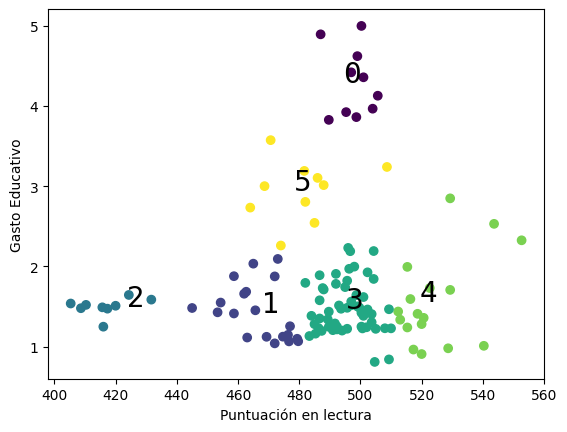

In [194]:
plt.scatter(df["mean_score"], df["education_spending"], c=df["cluster_mean_edu_spe"], cmap='viridis')
for i in range(n_clusters):
    plt.text(cluster_means["rea_total_value"][i], cluster_means["education_spending"][i], str(i), fontsize=20)
plt.xlabel("Puntuación en lectura")
plt.ylabel("Gasto Educativo")
plt.show()

Tanto de la descripción anterior como del último gráfico podemos sacar varias conclusiones

#### 4.2.5. Grupo 0

El cluster con índice 0 se refiere a grupos con gran inversión educativa. Todos ellos coinciden en que sus puntuaciones medias son relativamente altas, por lo que podemos establecer que un elevado esfuerzo económico en educación puede implicar unas notas consistentes.

In [195]:
observaciones_42.append("El cluster con índice 0 se refiere a grupos con gran inversión educativa. Todos ellos coinciden en que sus puntuaciones medias son relativamente altas, por lo que podemos establecer que un elevado esfuerzo económico en educación puede implicar unas notas consistentes.")

Veamos que paises lo forman

In [196]:
df[df["cluster_mean_edu_spe"]==0]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score,cluster_mean_edu_spe
3,2006_DNK,2006.0,DNK,494.0,496.0,513.0,4.356052,53278.370,6.226722,501.00,0
16,2006_NOR,2006.0,NOR,484.0,487.0,490.0,4.891086,38556.820,7.894737,487.00,0
20,2006_SVN,2006.0,SVN,494.0,519.0,504.0,4.126616,40394.230,10.769654,505.67,0
21,2006_SWE,2006.0,SWE,507.0,503.0,502.0,3.965153,34524.410,10.463096,504.00,0
26,2009_DNK,2009.0,DNK,495.0,499.0,503.0,4.619483,57548.350,8.845994,499.00,0
32,2009_IRL,2009.0,IRL,496.0,508.0,487.0,4.417780,57958.820,18.578489,497.00,0
39,2009_NOR,2009.0,NOR,503.0,500.0,498.0,4.995760,40508.220,7.980915,500.33,0
41,2009_PRT,2009.0,PRT,489.0,493.0,487.0,3.825897,42306.110,12.796033,489.67,0
43,2009_SVN,2009.0,SVN,483.0,512.0,501.0,3.860303,43371.730,9.036617,498.67,0
44,2009_SWE,2009.0,SWE,497.0,495.0,494.0,3.922372,36878.985,10.992398,495.33,0


Lógicamente este grupo se corresponde con los países que evaluamos anteriormente. Gracias al cluster podemos diferenciarlos tanto por su inversión educativa como por sus puntuaciones medias.

Veamos como se comporta la agrupación en los años 2006 y 2009

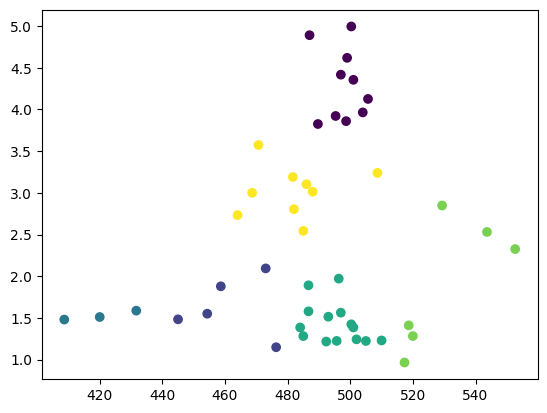

In [197]:
cluster_list=[]
df_year=df[df.year.isin([2006,2009])]
for cluster in df_year.cluster_mean_edu_spe.unique():
    cluster_list.append(cluster)
plt.scatter(df_year["mean_score"], df_year["education_spending"], c=df_year["cluster_mean_edu_spe"], cmap='viridis')
plt.show()

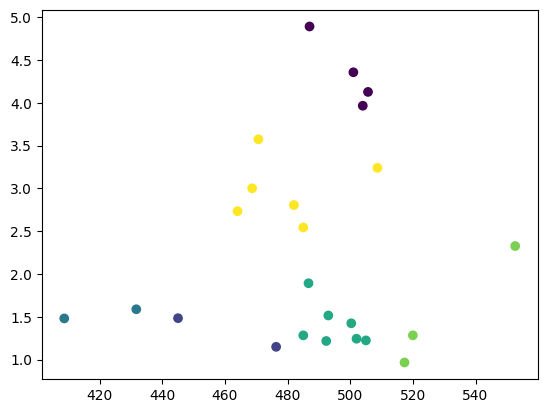

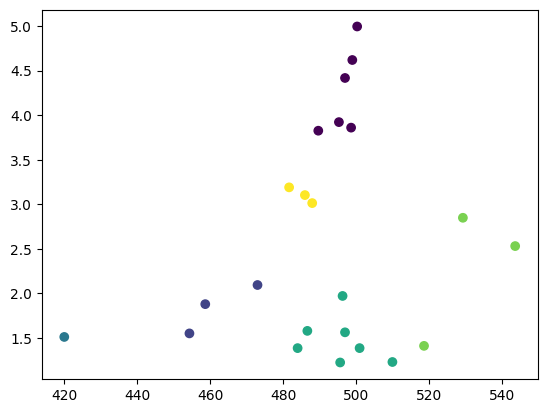

In [198]:
for year in [2006,2009]:
    cluster_list=[]
    df_year=df[df.year==year]
    for cluster in df_year.cluster_mean_edu_spe.unique():
        cluster_list.append(cluster)
    plt.scatter(df_year["mean_score"], df_year["education_spending"], c=df_year["cluster_mean_edu_spe"], cmap='viridis')
    plt.show()

Durante estos dos años, se puede observar que los países con un gasto educativo medio o bajo respecto a su PIB, sus puntuaciones escolares son mucho mas variables, aunque con una pequeña tendencia positiva.

In [199]:
df[(df["year"]==2006)&(df.mean_score>520)]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score,cluster_mean_edu_spe
5,2006_FIN,2006.0,FIN,547.0,563.0,548.0,2.326169,42871.03,10.433372,552.67,4


In [200]:
df[(df["year"]==2009)&(df.mean_score>520)]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score,cluster_mean_edu_spe
28,2009_FIN,2009.0,FIN,536.0,554.0,541.0,2.531049,43902.40,11.955111,543.67,4
35,2009_JPN,2009.0,JPN,520.0,539.0,529.0,2.848551,51635.02,12.200111,529.33,4


In [201]:
observaciones_42.append("Durante 2006 y 2009, los países con menor inversión educativa presentan una mayor dispersión en sus puntuaciones medias, aunque si con una pequeña tendencia positiva, ya que países como Japón y sobre todo Finlandia, presentan una inversión media y unas puntuaciones excesivamente altas.")

In [202]:
for observacion in observaciones_42:
    print(observacion)

Existen países que tanto en 2006 como en 2009 tenían una gran inversión en educación. En los años posteriores ésta se vio reducida drásticamente, sin embargo, las puntuaciones de los alumnos no se vieron afectadas por esta reducción.
Las correlaciones del gasto en educación con las puntuaciones de los alumnos son muy bajas, por lo que no se puede afirmar, de momento, que un mayor gasto en educación implique una mejora en las puntuaciones de los alumnos.
Estudiando año por año, podemos volver a descartar, a nivel general, que un mayor gasto en educación implique una mejora en las puntuaciones de los alumnos.
El cluster con índice 0 se refiere a grupos con gran inversión educativa. Todos ellos coinciden en que sus puntuaciones medias son relativamente altas, por lo que podemos establecer que un elevado esfuerzo económico en educación puede implicar unas notas consistentes.
Durante 2006 y 2009, los países con menor inversión educativa presentan una mayor dispersión en sus puntuaciones med

#### 4.2.6. Grupo 5

El grupo 5 también es representativo: se encuentran registros con una inversión media alta, y con unos resultados medios con poca varianza, produciéndose una relación lineal con el grupo 0.

In [203]:
observaciones_42.append("Existe otro grupo donde se encuentran registros con una inversión media alta, y con unos resultados medios con poca varianza, produciéndose una relación lineal con el grupo anterior.")

Veamos los países que lo forman

In [204]:
df[df["cluster_mean_edu_spe"]==5]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score,cluster_mean_edu_spe
7,2006_GRC,2006.0,GRC,460.0,473.0,459.0,2.733400,35355.440,16.701204,464.00,5
9,2006_IRL,2006.0,IRL,517.0,508.0,501.0,3.239546,52073.275,10.397779,508.67,5
11,2006_ITA,2006.0,ITA,469.0,475.0,462.0,3.000727,37305.520,20.075226,468.67,5
13,2006_LUX,2006.0,LUX,479.0,486.0,490.0,2.543194,87591.060,8.560420,485.00,5
18,2006_PRT,2006.0,PRT,472.0,474.0,466.0,3.573294,42659.110,12.392595,470.67,5
19,2006_SVK,2006.0,SVK,466.0,488.0,492.0,2.804677,14877.910,19.125250,482.00,5
34,2009_ITA,2009.0,ITA,486.0,489.0,483.0,3.103365,37532.340,21.167088,486.00,5
36,2009_LUX,2009.0,LUX,472.0,484.0,489.0,3.190149,94589.125,7.930428,481.67,5
42,2009_SVK,2009.0,SVK,477.0,490.0,497.0,3.013412,14590.940,16.115896,488.00,5
57,2012_ISR,2012.0,ISR,486.0,470.0,466.0,2.261258,27684.460,15.659012,474.00,5


Seguimos teniendo registros de los primeros años. Será interesante estudiar los años siguientes.

In [205]:
observaciones_42.append('Los registros de este último grupo también aparecen en los primeros años.')

In [206]:
for observacion in observaciones_42:
    print(observacion)

Existen países que tanto en 2006 como en 2009 tenían una gran inversión en educación. En los años posteriores ésta se vio reducida drásticamente, sin embargo, las puntuaciones de los alumnos no se vieron afectadas por esta reducción.
Las correlaciones del gasto en educación con las puntuaciones de los alumnos son muy bajas, por lo que no se puede afirmar, de momento, que un mayor gasto en educación implique una mejora en las puntuaciones de los alumnos.
Estudiando año por año, podemos volver a descartar, a nivel general, que un mayor gasto en educación implique una mejora en las puntuaciones de los alumnos.
El cluster con índice 0 se refiere a grupos con gran inversión educativa. Todos ellos coinciden en que sus puntuaciones medias son relativamente altas, por lo que podemos establecer que un elevado esfuerzo económico en educación puede implicar unas notas consistentes.
Durante 2006 y 2009, los países con menor inversión educativa presentan una mayor dispersión en sus puntuaciones med

#### 4.2.7. Resto de grupos / años recientes

El año 2012 tiene 24 muestras y pertenece a los clusters [4, 3, 1, 5, 2]


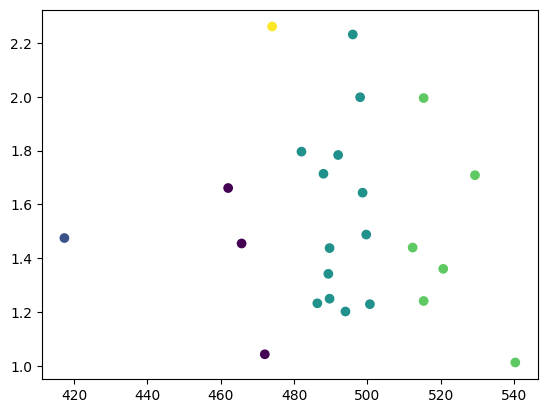

El año 2015 tiene 25 muestras y pertenece a los clusters [3, 2, 4, 1]


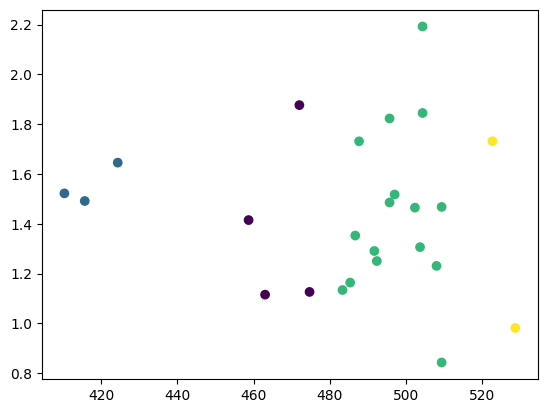

El año 2018 tiene 25 muestras y pertenece a los clusters [3, 2, 4, 1]


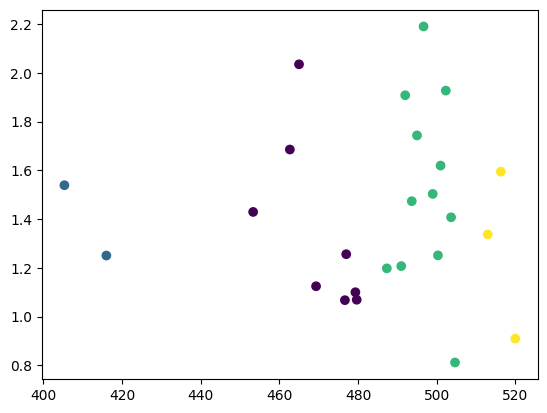

In [207]:
for year in [2012,2015,2018]:
    cluster_list=[]
    df_year=df[df.year==year]
    for cluster in df_year.cluster_mean_edu_spe.unique():
        cluster_list.append(cluster)
    print(f'El año {year} tiene {df_year.shape[0]} muestras y pertenece a los clusters {cluster_list}')
    plt.scatter(df_year["mean_score"], df_year["education_spending"], c=df_year["cluster_mean_edu_spe"], cmap='viridis')
    plt.show()


Lo primero que observamos es que hay varios registros que destacan por su baja puntuación, a pesar de tener una inversión media respecto al resto. Además se corresponde con el cluster 2

In [208]:
df[(df.year>2011)&(df.cluster_mean_edu_spe==2)]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score,cluster_mean_edu_spe
62,2012_MEX,2012.0,MEX,424.0,415.0,413.0,1.474865,32366.180,22.882490,417.33,2
73,2015_COL,2015.0,COL,425.0,416.0,390.0,1.522110,31492.380,20.997860,410.33,2
87,2015_MEX,2015.0,MEX,423.0,416.0,408.0,1.491546,33170.655,21.938206,415.67,2
94,2015_TUR,2015.0,TUR,428.0,425.0,420.0,1.645602,30596.155,28.777969,424.33,2
98,2018_COL,2018.0,COL,412.0,413.0,391.0,1.539098,36114.290,22.749687,405.33,2
113,2018_MEX,2018.0,MEX,420.0,419.0,409.0,1.250467,35891.280,20.878084,416.00,2


Tenemos 3 países aquí: México, Colombia y Turquía. Podemos deducir que, a pesar de no tener una pequeña inversión educativa, sus resultados son muy bajos. Esto se puede deber simplemente al estar alejados social y culturalmente de los países referentes en educación (centro europa).

In [209]:
observaciones_42.append("Los registros con menores puntuaciones medias, más que ser consecuencia de una baja inversión educativa, se deben a encontrarse en países alejados social y culturalmente de los países referentes en educación, como los centro europeos.")

Seguramente, como nuestro dato está en relación al PIB, si obtuviésemos datos absolutos, sus inversiones educativas serían significantemente bajas.

#### 4.2.8. PIB para tratar con gasto absoluto

In [210]:
df_PIB= pd.read_csv("data/Gross domestic product (GDP).csv")
df_PIB.columns = df_PIB.columns.str.lower().str.replace(' ', '_')
countries=df.location.unique().tolist()
df_PIB=df_PIB[df_PIB.location.isin(countries)]
df_PIB.sample(5)

,location,indicator,subject,measure,frequency,time,value,flag_codes
3602,ISR,GDP,TOT,MLN_USD,A,2013,2.799902e+05,NaN
3703,SVN,GDP,TOT,MLN_USD,A,2001,3.775318e+04,NaN
1685,LUX,GDP,TOT,MLN_USD,A,1974,2.895894e+03,E
3081,USA,GDP,TOT,USD_CAP,A,1991,2.428955e+04,NaN
1412,ITA,GDP,TOT,MLN_USD,A,2019,2.735577e+06,NaN


In [211]:
df_PIB.time.unique()

array([1960, 1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970,
       1971, 1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981,
       1982, 1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992,
       1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003,
       2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014,
       2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022])

In [212]:
df_PIB=df_PIB[df_PIB.time>2004]

In [213]:
df_PIB.shape

(936, 8)

In [214]:
get_unique_values(df_PIB, ['location','value','time'])

Valores únicos de la columna 'indicator':
['GDP']
Cantidad de valores únicos en la columna 'indicator': 1

Valores únicos de la columna 'subject':
['TOT']
Cantidad de valores únicos en la columna 'subject': 1

Valores únicos de la columna 'measure':
['MLN_USD' 'USD_CAP']
Cantidad de valores únicos en la columna 'measure': 2

Valores únicos de la columna 'frequency':
['A']
Cantidad de valores únicos en la columna 'frequency': 1

Valores únicos de la columna 'flag_codes':
[nan 'E' 'P' 'B']
Cantidad de valores únicos en la columna 'flag_codes': 4



In [215]:
df_PIB.drop(columns=["indicator",'subject','frequency','flag_codes'],inplace=True)
df_PIB.sample(5)

<ipython-input-215-e5dfb40eb9cf>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,location,measure,time,value
3708,SVN,MLN_USD,2006,51614.174000
2262,POL,USD_CAP,2006,15155.041822
1134,HUN,USD_CAP,2006,18382.558594
724,FIN,USD_CAP,2008,40083.701943
3750,SVN,USD_CAP,2020,40864.408685


In [216]:
df_PIB.measure.value_counts()

MLN_USD    468
USD_CAP    468
Name: measure, dtype: int64

Nos quedamos con la métrica MLN_USD, que nos da el valor absoluto.

In [217]:
df_PIB=df_PIB[df_PIB.measure=="MLN_USD"]
df_PIB.drop(columns=["measure"],inplace=True)
df_PIB.shape

(468, 3)

Vamos a probar a mergear ambas tablas y comprobar que no hay muchos nulos para hacer la conversión

In [218]:
df_PIB['id']=df_PIB['time'].astype(str)+"_"+df_PIB['location']
df_PIB.sample(5)

,location,time,value,id
1400,ITA,2007,1.995407e+06,2007_ITA
1401,ITA,2008,2.089717e+06,2008_ITA
2488,ESP,2011,1.489595e+06,2011_ESP
3054,USA,2017,1.947734e+07,2017_USA
1304,IRL,2017,3.757886e+05,2017_IRL


In [219]:
df_PIB.drop(columns=["location","time"],inplace=True)
df_PIB.sample(5)

,value,id
2318,279627.039,2009_PRT
4172,73809.042,2012_LTU
1032,333014.632,2021_GRC
2815,1268708.962,2010_TUR
2403,136951.599,2010_SVK


In [220]:
df_PIB.rename(columns={"value":"pib"},inplace=True)

In [221]:
df=df.merge(df_PIB,how="left",on="id")
df.sample(10)

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score,cluster_mean_edu_spe,pib
28,2009_FIN,2009.0,FIN,536.0,554.0,541.0,2.531049,43902.400,11.955111,543.67,4,202731.154
97,2018_AUT,2018.0,AUT,484.0,490.0,499.0,1.207143,50062.405,11.101415,491.00,3,503361.417
35,2009_JPN,2009.0,JPN,520.0,539.0,529.0,2.848551,51635.020,12.200111,529.33,4,4295628.986
66,2012_SVK,2012.0,SVK,463.0,471.0,482.0,1.042718,14303.970,18.792595,472.00,1,145972.536
71,2015_AUS,2015.0,AUS,503.0,510.0,494.0,1.464833,59729.170,11.831610,502.33,3,1124752.510
98,2018_COL,2018.0,COL,412.0,413.0,391.0,1.539098,36114.290,22.749687,405.33,2,747103.675
27,2009_ESP,2009.0,ESP,481.0,488.0,483.0,1.385694,52181.585,22.630316,484.00,3,1487912.773
114,2018_POL,2018.0,POL,512.0,511.0,516.0,1.337205,25763.640,12.690605,513.00,4,1216240.494
3,2006_DNK,2006.0,DNK,494.0,496.0,513.0,4.356052,53278.370,6.226722,501.00,0,202984.122
62,2012_MEX,2012.0,MEX,424.0,415.0,413.0,1.474865,32366.180,22.882490,417.33,2,2012767.781


In [222]:
df.pib.isna().sum()

0

Los datos están completamente limpios, vamos a generar la nueva variable.

In [223]:
df["abs_education_spending"]=df["education_spending"]*df["pib"]/100
df.sample(5)

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score,cluster_mean_edu_spe,pib,abs_education_spending
102,2018_FRA,2018.0,FRA,493.0,493.0,495.0,1.473582,36909.79,16.096914,493.67,3,3125379.860,46055.048592
63,2012_NOR,2012.0,NOR,504.0,495.0,489.0,2.231547,43135.41,8.396015,496.00,3,330093.373,7366.187662
113,2018_NOR,2018.0,NOR,499.0,490.0,501.0,2.190450,46504.04,8.674975,496.67,3,373182.531,8174.376750
72,2015_AUT,2015.0,AUT,485.0,495.0,497.0,1.250372,46908.28,10.438811,492.33,3,430975.924,5388.803286
38,2009_MEX,2009.0,MEX,425.0,416.0,419.0,1.511068,31226.19,24.376291,420.00,2,1636084.571,24722.356404


In [224]:
df_PIB = df.copy()
df_PIB.shape

(121, 13)

In [225]:
df.drop(columns=["pib"],inplace=True)

In [226]:
df[df.location=='ESP']

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score,cluster_mean_edu_spe,abs_education_spending
4,2006_ESP,2006.0,ESP,461.0,488.0,480.0,1.148465,49366.180,15.878056,476.33,1,15662.846174
27,2009_ESP,2009.0,ESP,481.0,488.0,483.0,1.385694,52181.585,22.630316,484.00,3,20617.921988
51,2012_ESP,2012.0,ESP,488.0,496.0,484.0,1.341707,47407.385,25.629156,489.33,3,19906.297304
76,2015_ESP,2015.0,ESP,496.0,493.0,486.0,1.290729,46236.750,22.820313,491.67,3,20933.371667


#### 4.2.9. Comparamos variables

In [227]:
df.education_spending.corr(df.abs_education_spending)

-0.017955662491929786

La correlación país por país debería ser mucho mayor.

In [228]:
for country in countries:
    df_country=df[df.location==country]
    print(f'En el país {country}, que tiene {df_country.shape[0]} registros, la correlación es {df_country.education_spending.corr(df_country.abs_education_spending)}')

En el país AUS, que tiene 5 registros, la correlación es 0.9294636017762241
En el país AUT, que tiene 4 registros, la correlación es -0.5960259579542563
En el país DEU, que tiene 5 registros, la correlación es 0.8610920899238711
En el país DNK, que tiene 5 registros, la correlación es 0.9783974581721573
En el país ESP, que tiene 4 registros, la correlación es 0.8895670796026256
En el país FIN, que tiene 5 registros, la correlación es 0.7159456160905339
En el país FRA, que tiene 5 registros, la correlación es -0.6412856585229179
En el país GRC, que tiene 5 registros, la correlación es 0.9855899965754455
En el país HUN, que tiene 5 registros, la correlación es -0.8051456259904736
En el país IRL, que tiene 5 registros, la correlación es 0.9880062842306859
En el país ISR, que tiene 5 registros, la correlación es 0.7656718218550419
En el país ITA, que tiene 5 registros, la correlación es 0.98744139336244
En el país JPN, que tiene 5 registros, la correlación es 0.9938343222764914
En el país 

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2845: RuntimeWarning:

Degrees of freedom <= 0 for slice

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2704: RuntimeWarning:

divide by zero encountered in divide



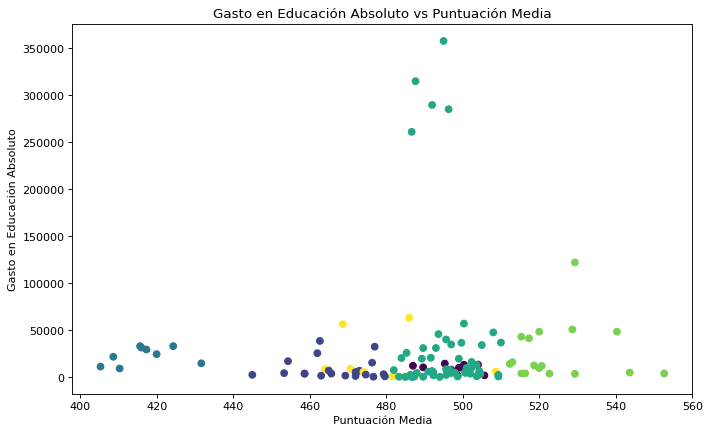

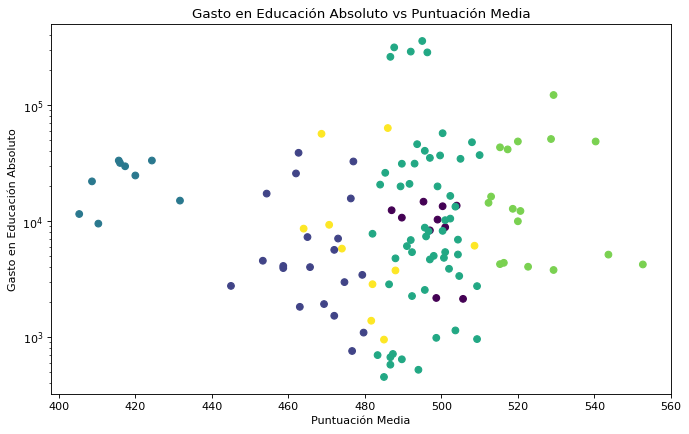

In [229]:
for i in range(2):
    plt.figure(figsize=(10,6), dpi= 80)
    plt.scatter(df["mean_score"],df["abs_education_spending"], c=df["cluster_mean_edu_spe"], cmap='viridis')
    plt.ylabel("Gasto en Educación Absoluto")
    plt.xlabel("Puntuación Media")
    if i==1:
        plt.yscale('log')
    plt.title('Gasto en Educación Absoluto vs Puntuación Media')
    plt.show()

Llama mucho la atención que los grupos marcados por los colores amarillo y morado no destacan en este gráfico mientras que si destacaban antes por tener un gasto elevado. Esto quiere decir que son países con un PIB poco elevado, ya que en términos absolutos el gasto es similar al resto de registros.

Sin embargo, del primer gráfico se puede extraer una observación parecida: para los países que tienen una gran inversion educativa en términos absolutos (sin depender de su PIB) encontramos que sus puntuaciones van a ser superiores a la media. Para países o registros con menor inversión absoluta, los resultados siguen presentando una gran varianza. Sin embargo, es cierto que para registros con mínimo gasto educativo, también se obtienen unos resultados con menor varianza.

In [230]:
observaciones_42.append('Para los países que tienen una gran inversion educativa en términos absolutos (sin depender de su PIB) encontramos que sus puntuaciones van a ser superiores a la media. Para países o registros con menor inversión absoluta, los resultados siguen presentando una gran varianza. Sin embargo, es cierto que para registros con mínimo gasto educativo, también se obtienen unos resultados con menor varianza.')

Otra observación e hipótesis que habíamos supuesto era que los registros del grupo 2 (izquierda) tenían muy baja puntuación pero no se reflejaba en el gasto educativo por estar relacionado con el PIB, pero que en el gasto absoluto se reflejaría mejor. Bueno pues esta suposición es errónea, ya que se puede ver que el gasto absoluto se encuentra también en la media con el resto de países, lo que nos dice que el PIB de los países en cuestión (México, Colombia, Turquía) están cerca de la media del resto.

In [231]:
observaciones_42.append("El cluster con índice 2 nos muestra los registros con menor puntuación. Sin embargo, tanto su gasto relativo al PIB como el gasto absoluto no destacan por estar ni debajo ni encima de la media, por lo que no podemos encontrar una causa directa.")

In [232]:
df[df.abs_education_spending>150000]

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score,cluster_mean_edu_spe,abs_education_spending
23,2006_USA,2006.0,USA,497.0,489.0,474.0,1.891234,59851.220,12.458967,486.67,3,261285.002994
46,2009_USA,2009.0,USA,500.0,502.0,487.0,1.971164,58841.270,14.538002,496.33,3,285386.444600
70,2012_USA,2012.0,USA,498.0,497.0,481.0,1.783510,61506.020,13.994720,492.00,3,289891.180347
95,2015_USA,2015.0,USA,497.0,496.0,470.0,1.731243,61536.555,15.563759,487.67,3,315190.498766
120,2018_USA,2018.0,USA,505.0,502.0,478.0,1.743424,59420.905,13.486071,495.00,3,357978.158441


No nos llena de sorpresa ver que este país es USA. Su inversión respecto a su PIB está dentro de los intervalos europeos, pero si nos vamos a cantidades absolutas, se situa en otra liga.

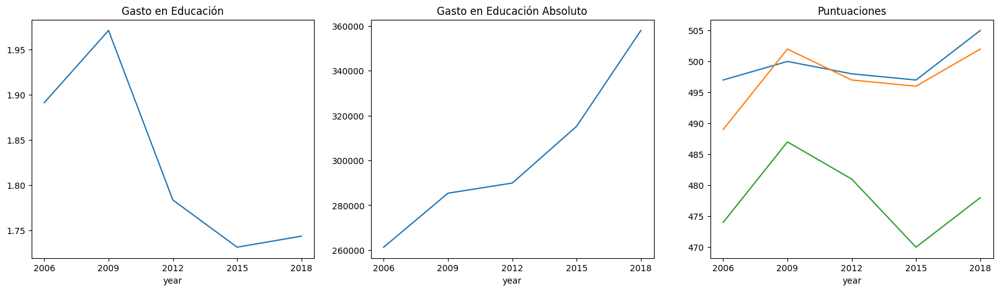

In [233]:
df_usa=df[df.location=="USA"]
fig,axes=plt.subplots(1,3,figsize=(20,5))
sns.lineplot(data=df_usa,x="year",y="education_spending",ax=axes[0])
sns.lineplot(data=df_usa,x="year",y="abs_education_spending",ax=axes[1])
sns.lineplot(data=df_usa,x="year",y="rea_total_value",ax=axes[2],legend=True)
sns.lineplot(data=df_usa,x="year",y="sci_total_value",ax=axes[2],legend=True)
sns.lineplot(data=df_usa,x="year",y="mat_total_value",ax=axes[2],legend=True)
axes[0].set_title("Gasto en Educación")
axes[1].set_title("Gasto en Educación Absoluto")
axes[2].set_title("Puntuaciones")
axes[0].set_ylabel(None)
axes[1].set_ylabel(None)
axes[2].set_ylabel(None)
axes[0].set_xticks(df_usa.year.unique())
axes[1].set_xticks(df_usa.year.unique())
axes[2].set_xticks(df_usa.year.unique())
plt.show()

Vemos que en USA, no solo el gasto relativo es mas significativo, si no que lo es bastante.

In [234]:
observaciones_42.append("En USA si existe una clara relacion de causalidad de gasto eduactivo relativo y puntuaciones")

Veamos si esto sucede para mas países. Lo aplicaremos para países cercanos a USA respecto a nuestro cluster, es decir, para los del cluster 3

In [235]:
df[df.cluster_mean_edu_spe==3].location.unique()

array(['AUT', 'DEU', 'FRA', 'HUN', 'LVA', 'POL', 'USA', 'ESP', 'DNK',
       'ITA', 'LUX', 'NOR', 'PRT', 'SVN', 'SWE', 'AUS', 'IRL'],
      dtype=object)

-------------------------------------------AUT-------------------------------------------


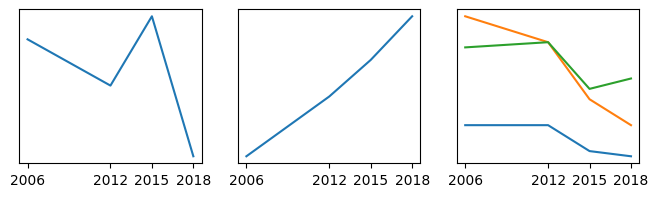

-------------------------------------------DEU-------------------------------------------


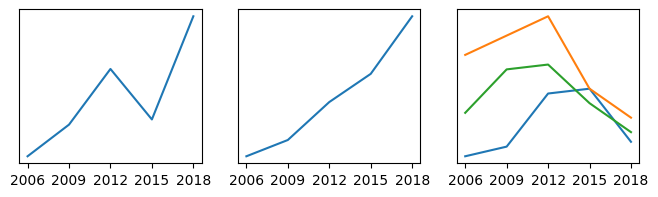

-------------------------------------------FRA-------------------------------------------


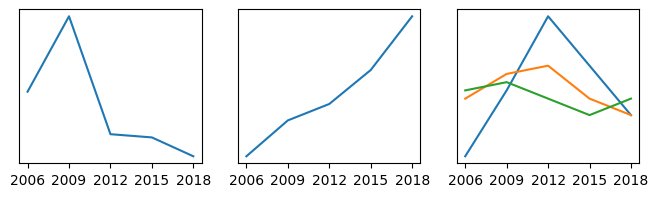

-------------------------------------------HUN-------------------------------------------


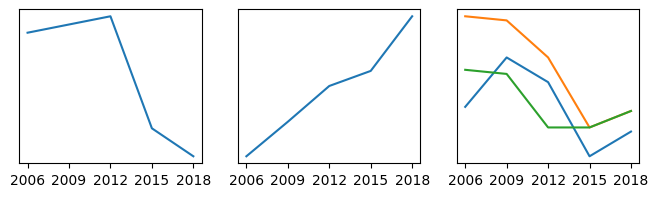

-------------------------------------------LVA-------------------------------------------


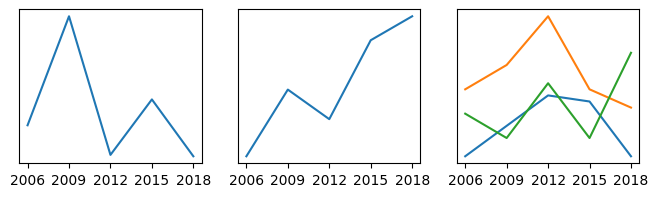

-------------------------------------------POL-------------------------------------------


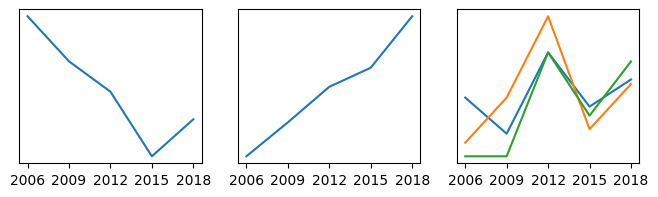

-------------------------------------------ESP-------------------------------------------


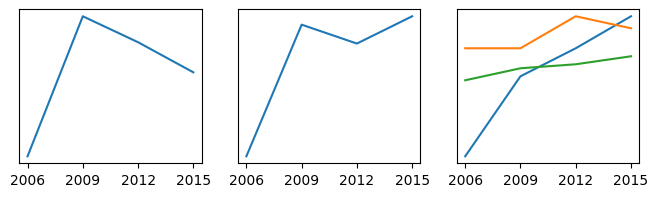

-------------------------------------------DNK-------------------------------------------


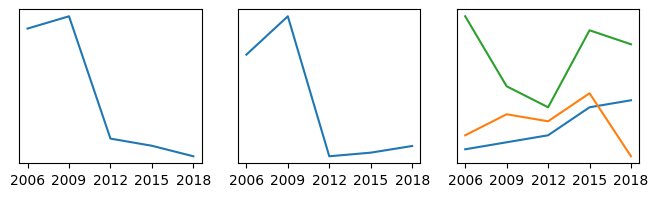

-------------------------------------------ITA-------------------------------------------


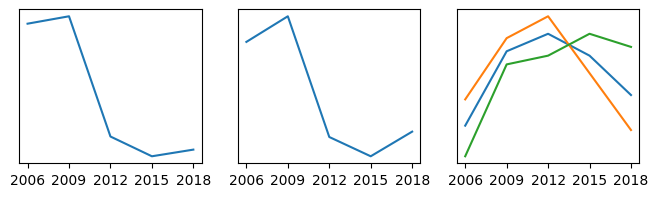

-------------------------------------------LUX-------------------------------------------


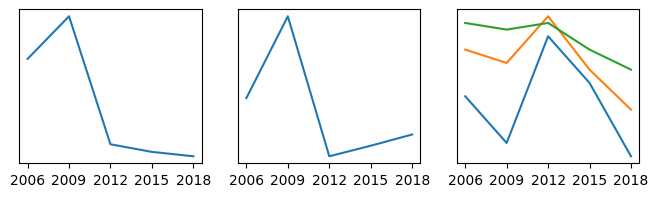

-------------------------------------------NOR-------------------------------------------


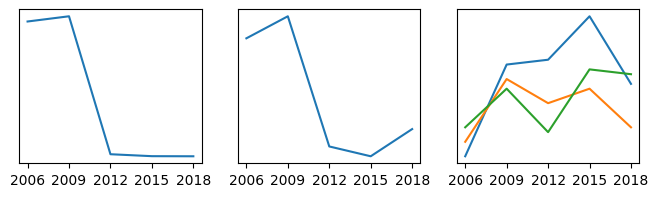

-------------------------------------------PRT-------------------------------------------


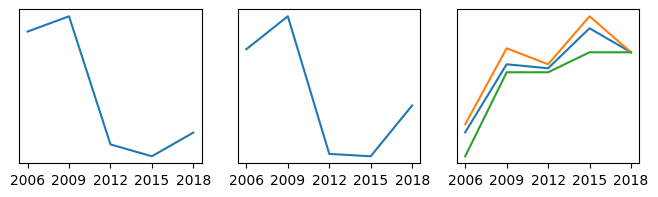

-------------------------------------------SVN-------------------------------------------


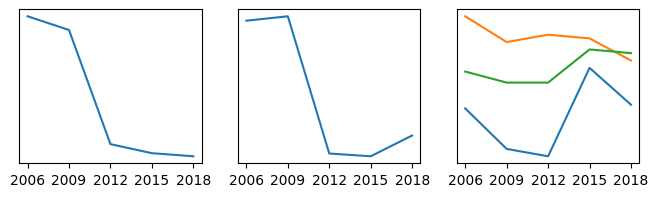

-------------------------------------------SWE-------------------------------------------


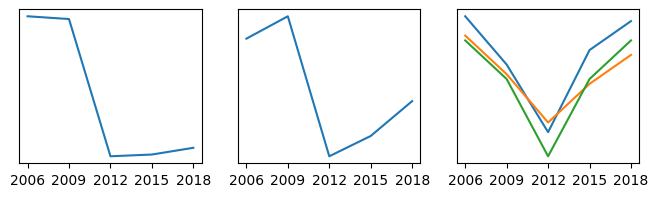

-------------------------------------------AUS-------------------------------------------


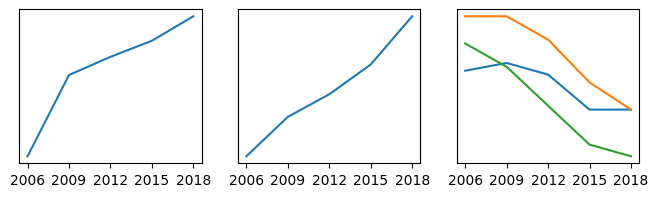

-------------------------------------------IRL-------------------------------------------


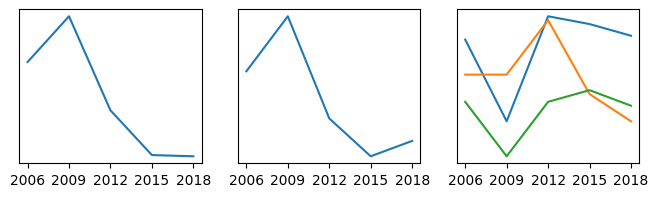

In [236]:
for country in df[(df.cluster_mean_edu_spe==3)&(df.location!='USA')].location.unique():
    df_country=df[df.location==country]
    print(f'-------------------------------------------{country}-------------------------------------------')
    fig,axes=plt.subplots(1,3,figsize=(8,2))
    sns.lineplot(data=df_country,x="year",y="education_spending",ax=axes[0])
    sns.lineplot(data=df_country,x="year",y="abs_education_spending",ax=axes[1])
    sns.lineplot(data=df_country,x="year",y="rea_total_value",ax=axes[2],legend=True)
    sns.lineplot(data=df_country,x="year",y="sci_total_value",ax=axes[2],legend=True)
    sns.lineplot(data=df_country,x="year",y="mat_total_value",ax=axes[2],legend=True)
    for x in range(0,3):
        axes[x].set_xlabel(None)
        axes[x].set_ylabel(None)
        axes[x].set_xticks(df_country.year.unique())
        axes[x].set_yticks([])
    plt.show()

Podemos decir que sucede lo mismo para Suecia únicamente.

Casualmente, llama mucho la atención como el gasto se reduce drásticamente en 2012 pero en muchos países las puntuaciones aumentan hasta el punto de experimentar máximos. Esto sucede en FRA, LVA, POL, ITA, LUX, NOR, IRL

In [237]:
observaciones_42.append("En los países FRA, LVA, POL, ITA, LUX, NOR, IRL en 2012 se produce una potente relación inversa entre gasto educativo y puntuaciones")

Vamos a ver las evoluciones anteriores pero eliminando el año 2012.

-------------------------------------------AUT-------------------------------------------


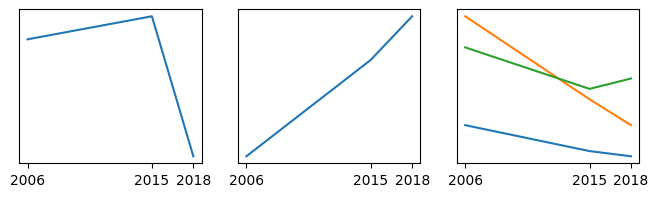

-------------------------------------------DEU-------------------------------------------


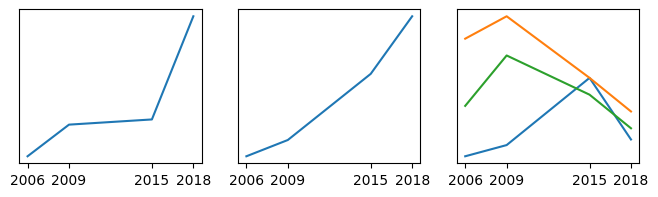

-------------------------------------------FRA-------------------------------------------


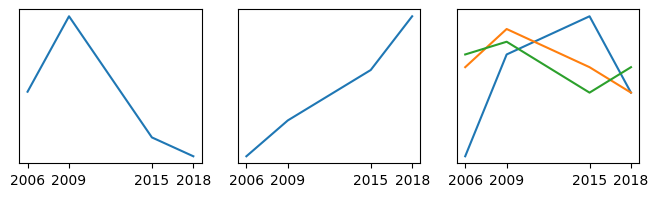

-------------------------------------------HUN-------------------------------------------


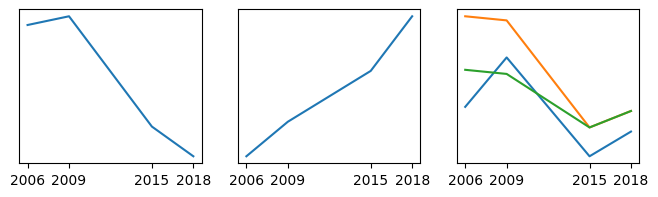

-------------------------------------------LVA-------------------------------------------


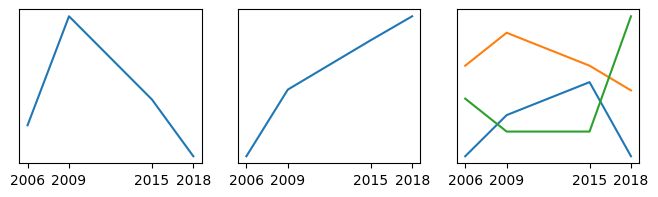

-------------------------------------------POL-------------------------------------------


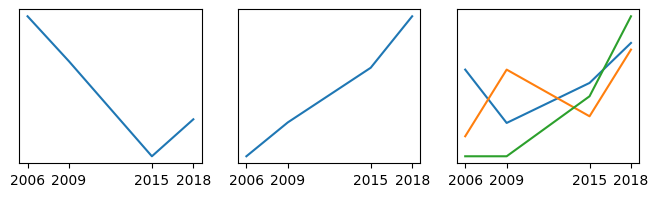

-------------------------------------------ESP-------------------------------------------


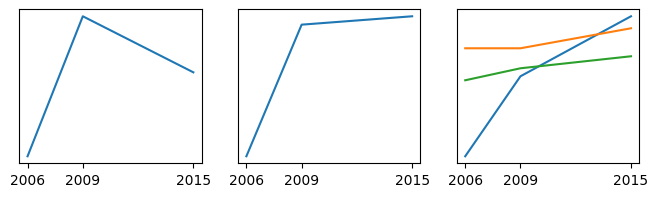

-------------------------------------------DNK-------------------------------------------


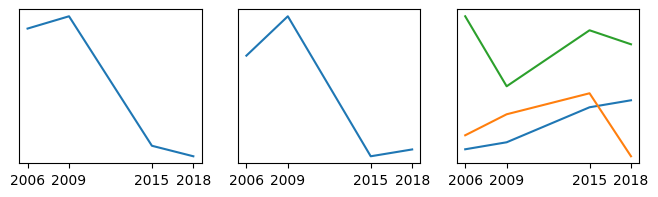

-------------------------------------------ITA-------------------------------------------


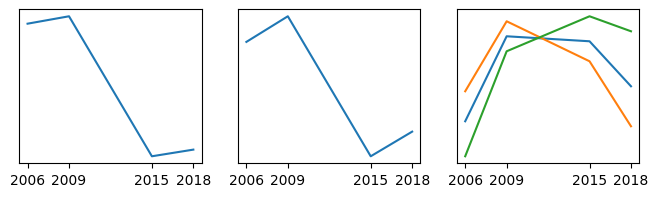

-------------------------------------------LUX-------------------------------------------


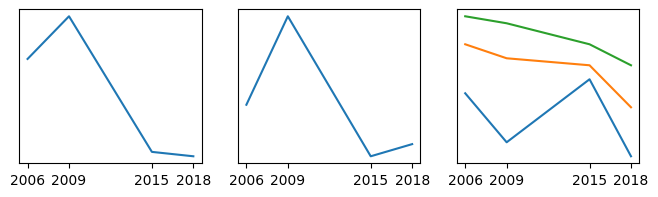

-------------------------------------------NOR-------------------------------------------


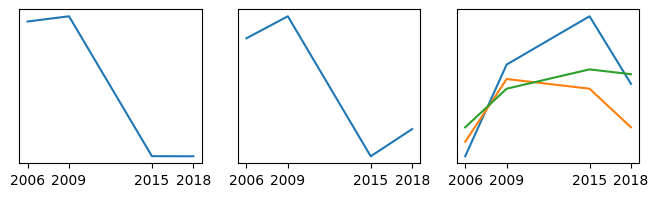

-------------------------------------------PRT-------------------------------------------


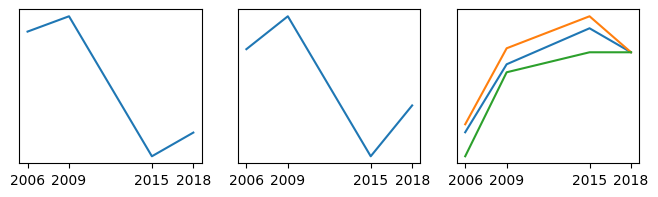

-------------------------------------------SVN-------------------------------------------


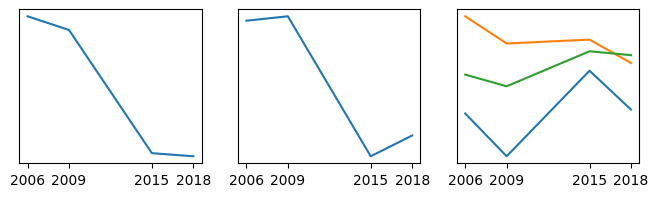

-------------------------------------------SWE-------------------------------------------


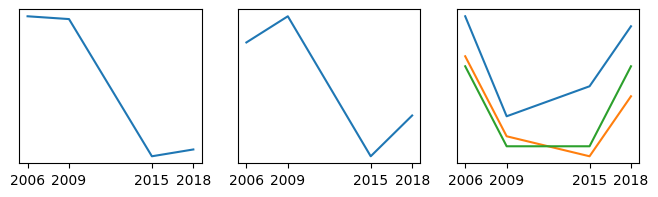

-------------------------------------------AUS-------------------------------------------


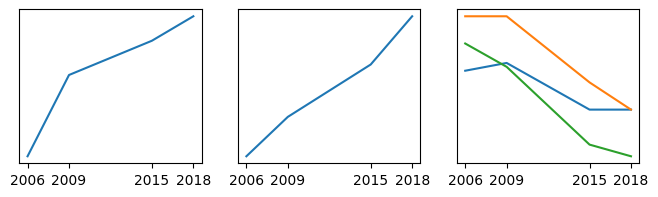

-------------------------------------------IRL-------------------------------------------


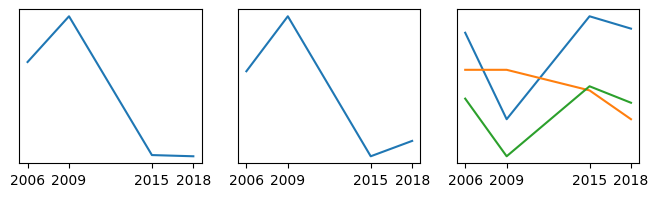

In [238]:
for country in df[(df.cluster_mean_edu_spe==3)&(df.location!='USA')].location.unique():
    df_country=df[df.location==country]
    df_country=df_country[df_country.year!=2012]
    print(f'-------------------------------------------{country}-------------------------------------------')
    fig,axes=plt.subplots(1,3,figsize=(8,2))
    sns.lineplot(data=df_country,x="year",y="education_spending",ax=axes[0])
    sns.lineplot(data=df_country,x="year",y="abs_education_spending",ax=axes[1])
    sns.lineplot(data=df_country,x="year",y="rea_total_value",ax=axes[2],legend=True)
    sns.lineplot(data=df_country,x="year",y="sci_total_value",ax=axes[2],legend=True)
    sns.lineplot(data=df_country,x="year",y="mat_total_value",ax=axes[2],legend=True)
    for x in range(0,3):
        axes[x].set_xlabel(None)
        axes[x].set_ylabel(None)
        axes[x].set_xticks(df_country.year.unique())
        axes[x].set_yticks([])
    plt.show()

Sigue siendo complicado encontrar implicaciones inversion, resultados, pero en países como HUN, ESP, SWE si se puede deducir alguna causalidad, pero muy leve.

#### 4.2.10. Observación de la tendencia

Después de tener que observar e interpretar muchos gráficos temporales, creemos que la tendencia de la evolución del gasto puede tener mas incidencia en las puntuaciones que el propio valor del gasto. Por ello, vamos a generar una variable que muestre la diferencia del gasto con el registro anterior.

In [239]:
df["diff_education_spending"]=np.nan
df["diff_abs_education_spending"]=np.nan
df.sample(5)

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score,cluster_mean_edu_spe,abs_education_spending,diff_education_spending,diff_abs_education_spending
108,2018_JPN,2018.0,JPN,504.0,529.0,527.0,0.909757,50755.980,7.700636,520.00,4,48617.972021,NaN,NaN
0,2006_AUS,2006.0,AUS,513.0,527.0,520.0,1.282893,51228.805,11.395142,520.00,4,9953.787636,NaN,NaN
22,2006_TUR,2006.0,TUR,447.0,424.0,424.0,1.587441,23907.805,42.636936,431.67,2,15005.084411,NaN,NaN
107,2018_ITA,2018.0,ITA,476.0,468.0,487.0,1.255961,35456.025,23.673616,477.00,1,32659.079250,NaN,NaN
89,2015_POL,2015.0,POL,506.0,501.0,504.0,1.306223,25372.940,15.646258,503.67,3,13309.057177,NaN,NaN


In [240]:
for year in [2009,2012,2015,2018]:
    for country in df.location.unique():
        try:
            df.loc[(df.year==year)&(df.location==country),"education_spending"].values[0]
            df.loc[(df.year==(year-3))&(df.location==country),"education_spending"].values[0]
            df.loc[(df.year==year)&(df.location==country),"diff_education_spending"]=df.loc[(df.year==year)&(df.location==country),"education_spending"].values[0]-df.loc[(df.year==(year-3))&(df.location==country),"education_spending"].values[0]
            df.loc[(df.year==year)&(df.location==country),"diff_abs_education_spending"]=df.loc[(df.year==year)&(df.location==country),"abs_education_spending"].values[0]-df.loc[(df.year==(year-3))&(df.location==country),"abs_education_spending"].values[0]
        except IndexError:
            pass

In [241]:
df.isna().sum()

id                              0
year                            0
location                        0
rea_total_value                 0
sci_total_value                 0
mat_total_value                 0
education_spending              0
teachers_salary                 0
neet                            0
mean_score                      0
cluster_mean_edu_spe            0
abs_education_spending          0
diff_education_spending        27
diff_abs_education_spending    27
dtype: int64

In [242]:
df.sample(5)

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score,cluster_mean_edu_spe,abs_education_spending,diff_education_spending,diff_abs_education_spending
26,2009_DNK,2009.0,DNK,495.0,499.0,503.0,4.619483,57548.350,8.845994,499.00,0,10290.198141,0.263431,1448.104235
73,2015_COL,2015.0,COL,425.0,416.0,390.0,1.522110,31492.380,20.997860,410.33,2,9499.783540,NaN,NaN
102,2018_FRA,2018.0,FRA,493.0,493.0,495.0,1.473582,36909.790,16.096914,493.67,3,46055.048592,-0.012045,5668.346461
41,2009_PRT,2009.0,PRT,489.0,493.0,487.0,3.825897,42306.110,12.796033,489.67,0,10698.242496,0.252603,1418.330193
45,2009_TUR,2009.0,TUR,464.0,454.0,445.0,1.550798,26826.865,39.581005,454.33,1,17252.348777,-0.036643,2247.264366


Hagamos el mismo gráfico pero con la variable gasto diferenciada

-------------------------------------------AUT------------------------------------------


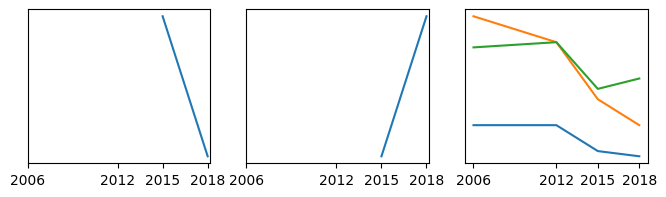

-------------------------------------------DEU------------------------------------------


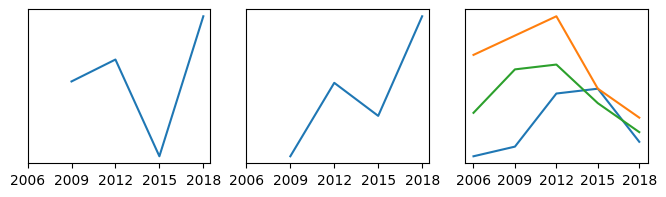

-------------------------------------------FRA------------------------------------------


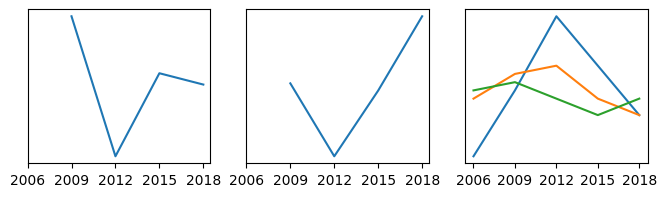

-------------------------------------------HUN------------------------------------------


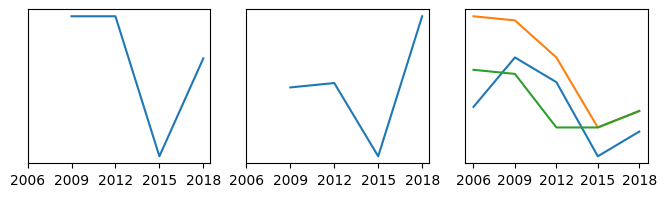

-------------------------------------------LVA------------------------------------------


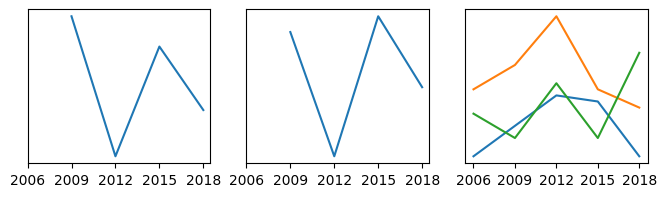

-------------------------------------------POL------------------------------------------


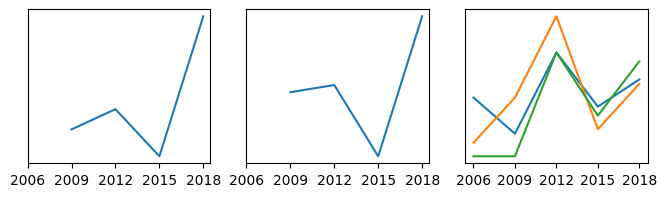

-------------------------------------------ESP------------------------------------------


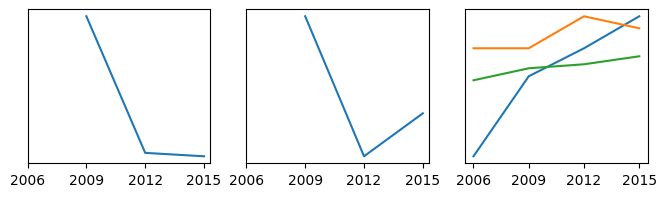

-------------------------------------------DNK------------------------------------------


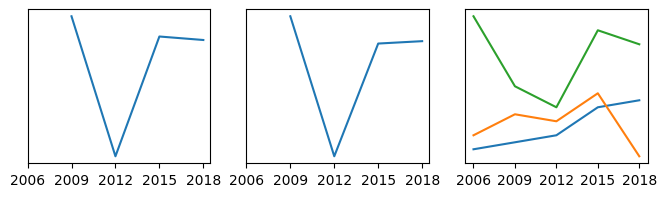

-------------------------------------------ITA------------------------------------------


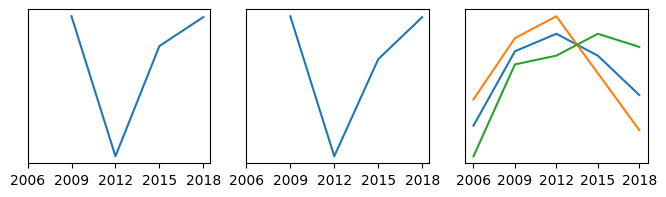

-------------------------------------------LUX------------------------------------------


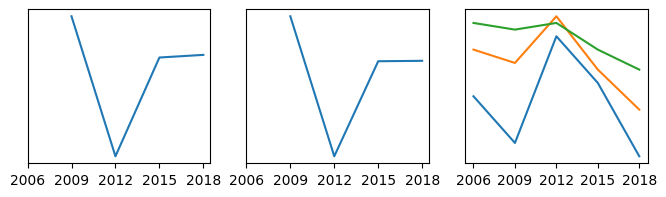

-------------------------------------------NOR------------------------------------------


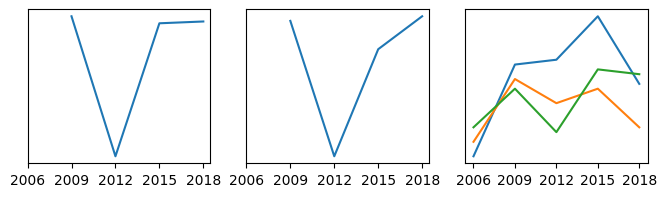

-------------------------------------------PRT------------------------------------------


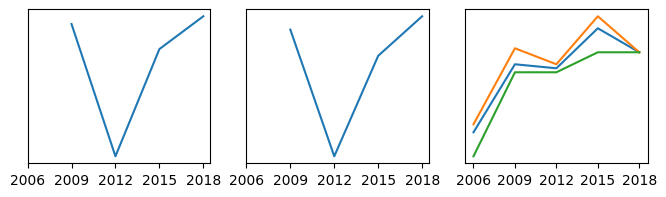

-------------------------------------------SVN------------------------------------------


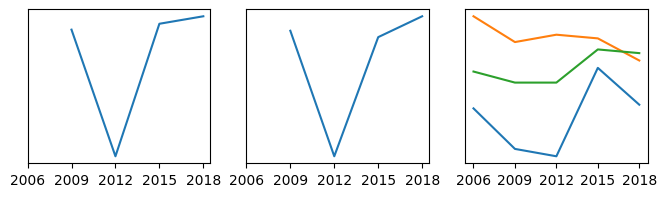

-------------------------------------------SWE------------------------------------------


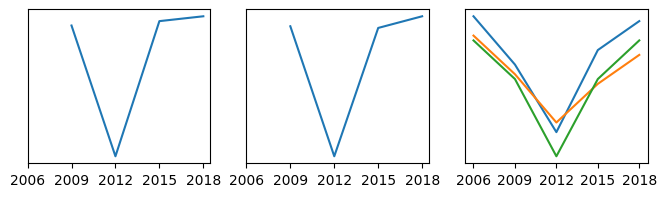

-------------------------------------------AUS------------------------------------------


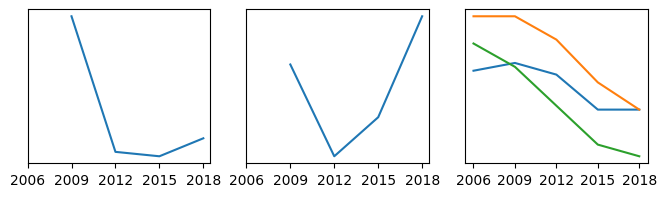

-------------------------------------------IRL------------------------------------------


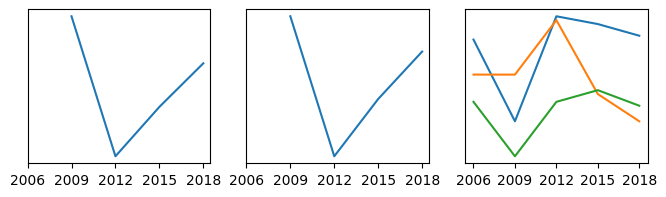

In [243]:
for country in df[(df.cluster_mean_edu_spe==3)&(df.location!='USA')].location.unique():
    df_country=df[df.location==country]
    print(f'-------------------------------------------{country}------------------------------------------')
    fig,axes=plt.subplots(1,3,figsize=(8,2))
    sns.lineplot(data=df_country,x="year",y="diff_education_spending",ax=axes[0])
    sns.lineplot(data=df_country,x="year",y="diff_abs_education_spending",ax=axes[1])
    sns.lineplot(data=df_country,x="year",y="rea_total_value",ax=axes[2],legend=True)
    sns.lineplot(data=df_country,x="year",y="sci_total_value",ax=axes[2],legend=True)
    sns.lineplot(data=df_country,x="year",y="mat_total_value",ax=axes[2],legend=True)
    for x in range(0,3):
        axes[x].set_xlabel(None)
        axes[x].set_ylabel(None)
        axes[x].set_xticks(df_country.year.unique())
        axes[x].set_yticks([])
    plt.show()

Se puede apreciar algo más de causalidad en la variable de gasto relativo al PIB. Esto sucede en cierta medida en los países POL, DEU, HUN, DNK, NOR, SWE, AUS.

In [244]:
observaciones_42.append("En los países POL, DEU, HUN, DNK, NOR, SWE, AUS existe una implicación entre el cambio de presupuesto educativo y las puntuaciones")

#### 4.2.11. Conclusiones

In [245]:
observaciones_42

['Existen países que tanto en 2006 como en 2009 tenían una gran inversión en educación. En los años posteriores ésta se vio reducida drásticamente, sin embargo, las puntuaciones de los alumnos no se vieron afectadas por esta reducción.',
 'Las correlaciones del gasto en educación con las puntuaciones de los alumnos son muy bajas, por lo que no se puede afirmar, de momento, que un mayor gasto en educación implique una mejora en las puntuaciones de los alumnos.',
 'Estudiando año por año, podemos volver a descartar, a nivel general, que un mayor gasto en educación implique una mejora en las puntuaciones de los alumnos.',
 'El cluster con índice 0 se refiere a grupos con gran inversión educativa. Todos ellos coinciden en que sus puntuaciones medias son relativamente altas, por lo que podemos establecer que un elevado esfuerzo económico en educación puede implicar unas notas consistentes.',
 'Durante 2006 y 2009, los países con menor inversión educativa presentan una mayor dispersión en su

Podríamos resumir que la hipótesis inicial de que un mayor gasto educativo implican mejores resultados no es del todo cierta. Sin embargo, se pueden rescatar resultados interesantes que relacionan ambas variables:

- Los países con mayores registros en inversión educativa (Noruega, Dinamarca, Suecia, Eslovenia, Portugal e Irlanda) ocurrieron en los años 2006 y 2009. Aquí si encontramos que estos países tienen puntuaciones PISA ligeramente encima de la media y muy similares entre ellas.

- Durante estos años, los países con una inversion media/alta, la dispersión en las puntuaciones es baja y se situan ligeramente por detrás de las del grupo anterior.

- Durante estos años también, para los países con inversiones medias/bajas, existe una gran dispersión en puntuaciones, aunque con cierta tendencia positiva, ya que Japón o Finlandia tienen gasto educativo medio y puntuaciones excesivamente altas.

- Para los años posteriores, lo más destacable se encuentra en que México, Colombia y Turquía tienen unas puntuaciones muy bajas, sin destacar por una baja inversión respecto al resto. Se consideró que esto podía deberse a que nuestro indicativo de gasto educativo es relativo frente al PIB, por lo que realmente la inversión de estos países si era baja en términos absolutos. Introdujimos la variable PIB a nuestra base de datos y se comprobó que dicha suposición no era cierta. En este caso no había causalidad entre inversión y puntuación.

- Aprovechamos para repetir el análisis con los gastos absolutos en vez de relativos y obtuvimos resultados similares: mucha varianza para inversiones medias o bajas, muy poca para las mayores (en este caso se debía a que USA acaparaba las mayores cifras).

- Analizando después la evolución temporal de las puntuaciones con respecto al gasto en Estados Unidos, si encontramos una relación de causalidad. Después evaluamos si sucedía también para países de sus características respecto al cluster que creamos.

   - Lo primero que se observa es que el gasto relativo al PIB parece ser mas indicativo para el score que el gasto absoluto con el paso del tiempo.

   - Sorprendentemente, para países como Francia, Letonia, Polonia, Italia, Luxemburgo, Noruega o Irlanda, en 2012 se produce una potente relación inversa entre gasto educativo y puntuaciones.

   - Probamos a analizar la evolución temporal eliminando el registro de 2012 y tampoco se observaron patrones temporales claros.

- Por último, consideramos que la evolución en las puntuaciones puede ser consecuencia de un cambio de tendencia en el gasto educativo. Es decir, la calidad educativa podría verse afectada por un cambio de plan educativo como por ejemplo una reducción en el incremento temporal del gasto.

   - Países como Polonia, Alemania, Hungría, Noruega, Suecia y Australia si muestran una pequeña implicación entre esta variable y las puntuaciones medias.

### `4.3. Salario de profesores`


#### 4.3.1 Organización

Crearemos unos registros medios para cada año.

In [246]:
df_medias = df.groupby('year').mean().reset_index()

df_medias['location'] = 'PROMEDIO'

df_promedio = pd.concat([df, df_medias], ignore_index=True)

df_promedio.sort_values(['year', 'location'], inplace=True)

df_promedio.reset_index(drop=True, inplace=True)

df_promedio['id'] = df_promedio['year'].astype(int).astype(str) + '_' + df_promedio['location']

colunas_a_formatar = ['rea_total_value', 'sci_total_value', 'mat_total_value', 'mean_score', 'teachers_salary']

for coluna in colunas_a_formatar:
    df_promedio[coluna] = df_promedio[coluna].round(2) if coluna != 'teachers_salary' else df_promedio[coluna].round(3)

display(df_promedio.shape)
columnas= ['year', 'location', 'rea_total_value', 'sci_total_value', 'mat_total_value', 'teachers_salary','mean_score']
df_promedio = df_promedio[columnas]
df_promedio[df_promedio['location'] == 'PROMEDIO']

<ipython-input-246-0e3f77a0b37d>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



(126, 14)

,year,location,rea_total_value,sci_total_value,mat_total_value,teachers_salary,mean_score
18,2006.0,PROMEDIO,483.17,492.04,486.38,40259.473,487.20
42,2009.0,PROMEDIO,489.87,495.57,489.00,41282.330,491.48
67,2012.0,PROMEDIO,493.17,497.12,488.25,41869.179,492.85
93,2015.0,PROMEDIO,486.92,485.96,482.32,42487.950,485.07
119,2018.0,PROMEDIO,483.60,484.12,484.32,42448.172,484.01


De la misma forma que con la variable anterior, iremos guardando nuestras observaciones.

In [247]:
observaciones_43=[]

#### 4.3.2 Estadísticas descriptivas

In [248]:
df.drop_duplicates(subset='location')[['year','location','rea_total_value','sci_total_value','mat_total_value','teachers_salary']]

,year,location,rea_total_value,sci_total_value,mat_total_value,teachers_salary
0,2006.0,AUS,513.0,527.0,520.0,51228.805
1,2006.0,AUT,490.0,511.0,505.0,46768.280
2,2006.0,DEU,495.0,516.0,504.0,61558.370
3,2006.0,DNK,494.0,496.0,513.0,53278.370
4,2006.0,ESP,461.0,488.0,480.0,49366.180
5,2006.0,FIN,547.0,563.0,548.0,42871.030
6,2006.0,FRA,488.0,495.0,496.0,37222.715
7,2006.0,GRC,460.0,473.0,459.0,35355.440
8,2006.0,HUN,482.0,504.0,491.0,18835.450
9,2006.0,IRL,517.0,508.0,501.0,52073.275


In [249]:
year_unique_count = len(df['year'].unique())
year_unique_values = df['year'].unique()

location_unique_count = len(df['location'].unique())
location_unique_values = df['location'].unique()

display(f"{year_unique_count} registros en años: {year_unique_values}")
display(f"{location_unique_count} países: {location_unique_values}")


'5 registros en años: [2006. 2009. 2012. 2015. 2018.]'

"26 países: ['AUS' 'AUT' 'DEU' 'DNK' 'ESP' 'FIN' 'FRA' 'GRC' 'HUN' 'IRL' 'ISR' 'ITA'\n 'JPN' 'LUX' 'LVA' 'MEX' 'NOR' 'POL' 'PRT' 'SVK' 'SVN' 'SWE' 'TUR' 'USA'\n 'COL' 'LTU']"

In [250]:
df[['id', 'year', 'location', 'rea_total_value', 'sci_total_value', 'mat_total_value', 'teachers_salary', 'mean_score']].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 121 entries, 0 to 120
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               121 non-null    object 
 1   year             121 non-null    float64
 2   location         121 non-null    object 
 3   rea_total_value  121 non-null    float64
 4   sci_total_value  121 non-null    float64
 5   mat_total_value  121 non-null    float64
 6   teachers_salary  121 non-null    float64
 7   mean_score       121 non-null    float64
dtypes: float64(6), object(2)
memory usage: 8.5+ KB


El df.info() muestra que los datos están estructurados correctamente, sin valores nulos y con los tipos adecuados para los análisis.

In [251]:
salary_stats = df['teachers_salary'].describe()
rea_stats = df['rea_total_value'].describe()
sci_stats = df['sci_total_value'].describe()
mat_stats = df['mat_total_value'].describe()
mean_stats = df['mean_score'].describe()

combined_stats = pd.concat([salary_stats, rea_stats, sci_stats, mat_stats, mean_stats], axis=1)
combined_stats.columns = ['Salario Profesores', 'Resultado PISA - Lectura', 'Resultado PISA - Ciencias', 'Resultado PISA - Matematica', 'Resultado PISA - Media']

combined_stats

,Salario Profesores,Resultado PISA - Lectura,Resultado PISA - Ciencias,Resultado PISA - Matematica,Resultado PISA - Media
count,121.000000,121.000000,121.000000,121.000000,121.000000
mean,41685.820661,487.289256,490.826446,485.983471,488.033223
std,19458.467379,25.761223,29.670883,29.451934,27.566447
min,7857.930000,410.000000,410.000000,390.000000,405.330000
25%,30029.420000,476.000000,481.000000,478.000000,477.000000
50%,40110.950000,490.000000,495.000000,491.000000,492.330000
75%,52073.275000,503.000000,506.000000,502.000000,502.330000
max,111606.890000,547.000000,563.000000,548.000000,552.670000


La desviación estándar para las tres áreas es relativamente baja, lo que indica que los resultados del PISA tienen menos variabilidad entre los países en comparación con la variabilidad en los salarios de los profesores.

El salario promedio de los profesores es de 41.685 USD, pero con una desviación estándar alta de 19.458 USD, lo que indica que hay una dispersión importante. Esto sugiere que los salarios de los profesores varían más entre países, lo que también confirman los valores mínimo y máximo. El salario mínimo es de 7.857 USD (Letonia), mientras que el máximo es de 111.606 USD (Luxemburgo). El 25% de los países pagan salarios de profesor por debajo de 30.029 USD, la mitad por debajo de 40.110 USD, y el 75% por debajo de 52.073 USD.

Esto muestra que, aunque algunos países como Luxemburgo pagan salarios docentes muy elevados, en términos generales existe una gran brecha entre los salarios altos y bajos. La mayoría de los países se ubican en un rango intermedio de salarios.

Lo que indica que no hay una igualdad en los salarios docentes entre los distintos sistemas educativos. Esto podría deberse a diferencias en el desarrollo económico, priorización de la educación, costo de vida, etc.

In [252]:
observaciones_43.append("Salario medio de 41.685 USD, pero con una elevada desviación estándar de 19.458 USD, lo que indica una gran variación de salarios entre países.")

#### 4.3.3 Distribución de los salarios

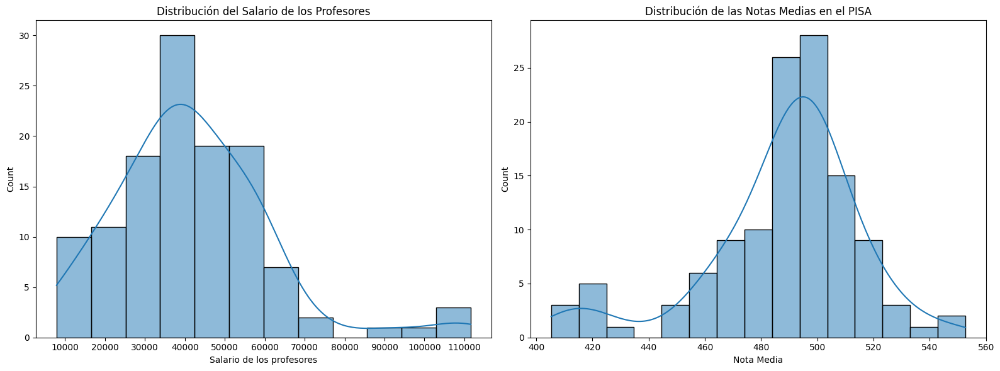

In [253]:
plt.figure(figsize=(16, 6))

plt.subplot(1, 2, 1)
sns.histplot(df['teachers_salary'], label="Salario de los profesores", kde=True)
plt.xlabel("Salario de los profesores")
plt.xticks(np.arange(10000, 120000, 10000))
plt.title('Distribución del Salario de los Profesores')

plt.subplot(1, 2, 2)
sns.histplot(df['mean_score'], kde=True)
plt.xlabel('Nota Media')
plt.title('Distribución de las Notas Medias en el PISA')

plt.tight_layout()

plt.show()

Hay una distribución asimétrica positiva en el primer histograma, es decir, inclinada hacia la derecha, con una larga extensión de salarios más altos. La mayoría de los datos se concentra en el rango de 20 a 70 mil dólares, pero existen algunos valores atípicos con ingresos superiores a 100 mil dólares al año, probablemente en países de Europa Occidental.

La presencia de estos valores extremos inclina la media salarial hacia arriba, lo que hace que no represente adecuadamente la situación típica de la mayoría de los países. La mediana y la moda estarían más cerca de los 40 a 50 mil dólares al año. Se observa, por lo tanto, una gran variación en los salarios de los docentes entre los sistemas educativos analizados.

Es posible que los salarios más altos estén en países desarrollados como Alemania, Francia y otros de Europa Occidental, mientras que los salarios más bajos se concentren en países de Europa del Este, América Latina y Asia. De todas formas, queda evidente la falta de estandarización o equidad en los ingresos de los profesores a nivel global.

Ya el histograma de las puntuaciones medias de PISA entre los países evaluados muestra una distribución aproximadamente simétrica y unimodal, con una curva en forma de campana. La mayor frecuencia de datos se concentra en el intervalo entre 460 y 500 puntos, lo que muestra que la mayoría de los países obtienen puntuaciones medias en este intervalo.

A diferencia de la distribución de los salarios, no hay muchos valores atípicos. Las puntuaciones extremadamente bajas (por debajo de 450) o altas (por encima de 550) son poco frecuentes, y los datos se concentran en la región central. Así lo confirman la curtosis positiva y la escasa asimetría de la distribución.

La forma simétrica y unimodal, con colas ligeras, indica que, en general, los sistemas educativos obtienen resultados relativamente similares cuando son evaluados por PISA, a pesar de las diferencias socioeconómicas entre países. No hay tanta dispersión en los resultados como la observada en los salarios.

Así, mientras que los salarios fluctúan mucho, la calidad media de la educación medida por PISA varía dentro de un rango menos amplio entre los distintos países. Esto sugiere que puede no haber una relación lineal simple entre los recursos invertidos y la calidad de la educación.

En continuidad, vamos a comparar este patrón de distribución no equitativa de los salarios con el desempeño de los estudiantes en el PISA, para evaluar si existe una correlación positiva entre la remuneración de los docentes y la calidad de la educación.

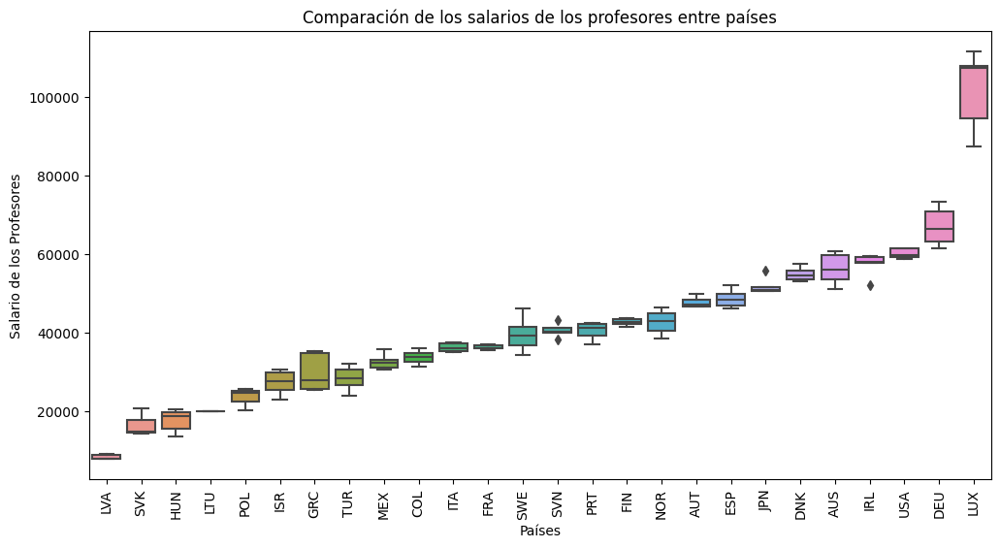

In [254]:
order = df.groupby('location')['teachers_salary'].median().sort_values().index

plt.figure(figsize=(12, 6))
sns.boxplot(x='location', y='teachers_salary', data=df, order=order)
plt.xticks(rotation=90)
plt.xlabel('Países')
plt.ylabel('Salario de los Profesores')
plt.title('Comparación de los salarios de los profesores entre países')
plt.show()

Se confirma la alta variabilidad en los salarios docentes entre países como se ha visto anteriormente en df.describe() y en el gráfico del histograma. Hay unos pocos que pagan por encima de los 60.000 dólares anuales, mientras que la mayoría se ubica entre 20.000 y 50.000 dólares. No se aprecia un patrón entre los países con salarios altos y sus resultados académicos previamente analizados.

En resumen, los análisis realizados en estos gráficos refuerzan las conclusiones previas: no se encuentra una relación sólida y consistente entre el salario docente y los resultados educativos medidos a través del PISA. La inversión económica en remuneraciones al profesorado por sí sola no garantiza mejor calidad.

Una buena forma de realizar una comparación más justa del esfuerzo relativo en educación es normalizar los salarios por el PIB per cápita de cada país, ya que tiene en cuenta la capacidad económica de cada país:

In [255]:
df_pop = pd.read_csv("data/Population.csv")
df_pop.columns = df_pop.columns.str.lower().str.replace(' ', '_')
countries = df_PIB.location.unique().tolist()
df_pop = df_pop[df_pop.location.isin(countries)]
df_pop = df_pop[df_pop.time > 2004]
df_pop.drop(columns=["indicator", 'measure', 'frequency', 'flag_codes'], inplace=True)
df_pop = df_pop[df_pop.subject == "TOT"].round(2)
df_pop.drop(columns=["subject"], inplace=True)
df_pop['id'] = df_pop['time'].astype(str) + "_" + df_pop['location']
df_pop.drop(columns=["location", "time"], inplace=True)
df_pop.rename(columns={"value": "pop"}, inplace=True)
display(df_pop.head())

# Assuming df_PIB is correctly loaded
df_PIB = df_PIB.merge(df_pop, how="left", on="id")
print(df_PIB['pop'].isna().sum())
df_PIB['PIB_per_capita'] = df_PIB['pib'] / (df_PIB['pop'])
columnas= ['year', 'location', 'rea_total_value', 'sci_total_value', 'mat_total_value', 'teachers_salary','mean_score','pib','pop','PIB_per_capita']
df_PIB2 = df_PIB[columnas]

# Normalizar la columna de salarios por el PIB per cápita:
df_PIB2['teachers_salary_normalized'] = df_PIB2['teachers_salary'] / df_PIB2['PIB_per_capita']
df_PIB2.head()


,pop,id
127,20.18,2005_AUS
128,20.45,2006_AUS
129,20.83,2007_AUS
130,21.25,2008_AUS
131,21.69,2009_AUS


0


<ipython-input-255-d006f62bd175>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,year,location,rea_total_value,sci_total_value,mat_total_value,teachers_salary,mean_score,pib,pop,PIB_per_capita,teachers_salary_normalized
0,2006.0,AUS,513.0,527.0,520.0,51228.805,520.00,775886.237,20.45,37940.647286,1.350235
1,2006.0,AUT,490.0,511.0,505.0,46768.280,502.00,311394.800,8.27,37653.542926,1.242069
2,2006.0,DEU,495.0,516.0,504.0,61558.370,505.00,2813824.860,82.38,34156.650401,1.802237
3,2006.0,DNK,494.0,496.0,513.0,53278.370,501.00,202984.122,5.43,37381.974586,1.425242
4,2006.0,ESP,461.0,488.0,480.0,49366.180,476.33,1363807.168,44.36,30744.075023,1.605714


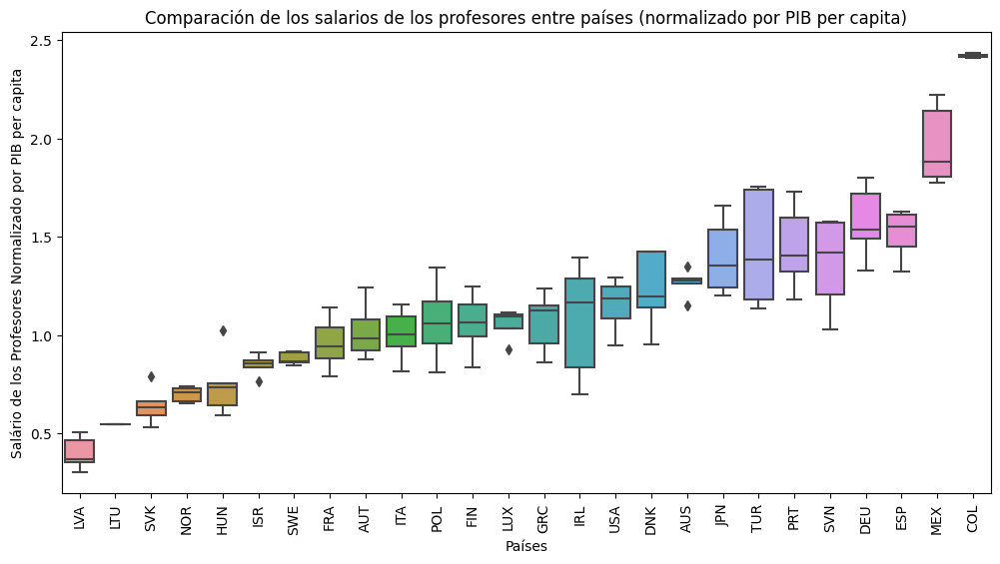

In [256]:
order = df_PIB2.groupby('location')['teachers_salary_normalized'].median().sort_values().index

plt.figure(figsize=(12, 6))
sns.boxplot(x='location', y='teachers_salary_normalized', data=df_PIB2, order=order)
plt.xticks(rotation=90)
plt.xlabel('Países')
plt.ylabel('Salário de los Profesores Normalizado por PIB per capita')
plt.title('Comparación de los salarios de los profesores entre países (normalizado por PIB per capita)')
plt.show()

Resulta que incluso normalizando el salario, se confirma que existen diferencias significativas en los salarios entre los países, lo que indica que la remuneración de los profesores varía considerablemente en todo el mundo. Analicemos algunos países:

Luxemburgo (LUX) tiene salarios docentes altos, pero cuando se normalizan por el PIB per cápita, se ubica en la media. Esto muestra que, a pesar de los altos ingresos, el país no necesariamente prioriza los salarios de los profesores.

México (MEX) tiene de los salarios nominales más bajos, pero cuando se normalizan, se encuentra en la cima. Esto refleja el esfuerzo del país en invertir en educación a pesar de las limitaciones económicas, donde enfrenta desafíos significativos en términos de desigualdad educativa y financiamiento insuficiente para el sistema educativo en algunas áreas.

Letonia (LVA) tiene salarios bajos nominales y relativamente aún más bajos cuando se normalizan, lo que puede indicar poca prioridad gubernamental en la educación.

Finlandia (FIN) es conocida por su excelencia educativa, pero tiene salarios relativamente modestos, lo que sugiere que hay otros factores además de los ingresos que influyen en su éxito.

Noruega (NOR) es un país con altos ingresos y calidad de vida. A pesar de ello, los salarios de los profesores normalizados por el PIB per cápita son relativamente bajos en comparación con otros países. Esto puede deberse a la priorización de otros beneficios y programas sociales en el país, así como al alto costo de vida en Noruega.

Suecia (SWE) es conocida por tener un sistema educativo de alta calidad y un compromiso con la igualdad de oportunidades. Sin embargo, los salarios de los profesores normalizados por el PIB per cápita son relativamente bajos, lo que sugiere que los profesores suecos pueden estar motivados por factores además de la compensación financiera, como el prestigio de la profesión y las condiciones de trabajo.

Estados Unidos (USA) tiene salarios de profesores normalizados por el PIB per cápita en un nivel intermedio, lo que puede explicarse por las diferencias significativas en los sistemas educativos entre los estados de EE. UU. y la falta de un estándar nacional de salarios para los profesores. Algunos estados pagan salarios más altos que otros, y la profesión de profesor en EE. UU. a menudo enfrenta desafíos relacionados con la financiación educativa.

Japón (JPN) es conocido por su sistema educativo de alta calidad y su cultura de respeto hacia los profesores. En el gráfico, los salarios de los profesores en Japón son relativamente altos en comparación con otros países. Esto puede ser resultado de una cultura que valora la educación y considera a los profesores como fundamentales para el éxito educativo de los estudiantes.

In [257]:
observaciones_43.append("La distribución de los salarios es asimétrica y tiende hacia los valores más altos, con algunos valores atípicos de salarios muy altos. La distribución de las puntuaciones PISA, por otra parte, es aproximadamente simétrica, con la mayoría de los datos concentrados en la región central.")
observaciones_43.append("El Boxplot de los salarios normalizados por el PIB per cápita de cada país confirma que existe una gran variación entre países, lo que indica que la disparidad de los salarios docentes no se debe únicamente a las diferencias de desarrollo económico.")

#### 4.3.4 Salario x Rendimiento

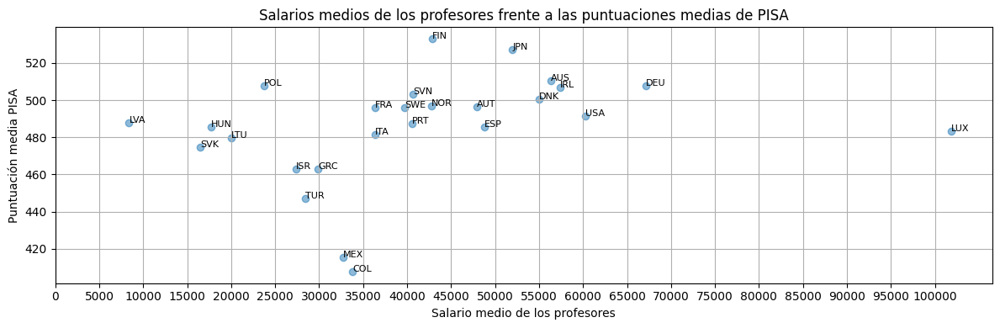

In [258]:
average_data = df.groupby('location')[['teachers_salary', 'mean_score']].mean().reset_index()

plt.figure(figsize=(12, 4))
plt.scatter(average_data['teachers_salary'], average_data['mean_score'], alpha=0.5)

for i, row in average_data.iterrows():
    plt.annotate(row['location'], (row['teachers_salary'], row['mean_score']), fontsize=8)

plt.title('Salarios medios de los profesores frente a las puntuaciones medias de PISA')
plt.xlabel('Salario medio de los profesores')
plt.ylabel('Puntuación media PISA')

plt.grid(True)
plt.xticks(range(0, int(average_data['teachers_salary'].max()) , 5000))
plt.tight_layout()
plt.show()


Hay países con salarios de profesor similares que obtienen resultados diferentes en las evaluaciones PISA como Noruega y Finlandia: tienen salarios medios similares (alrededor de 42.500 dólares), pero Finlandia tiene una puntuación media en PISA más alta que Noruega.

Hay países con salarios altos y bajos puntajes (como Estados Unidos) y viceversa (como Finlandia)

En general, no parece haber una correlación fuerte entre el salario promedio de los profesores y el puntaje promedio en el PISA mismo que se observa una ligera tendencia positiva, con mayores salarios asociados a mejores puntuaciones. Pero la relación no es tan clara.

Text(0, 0.5, 'Nota Media')

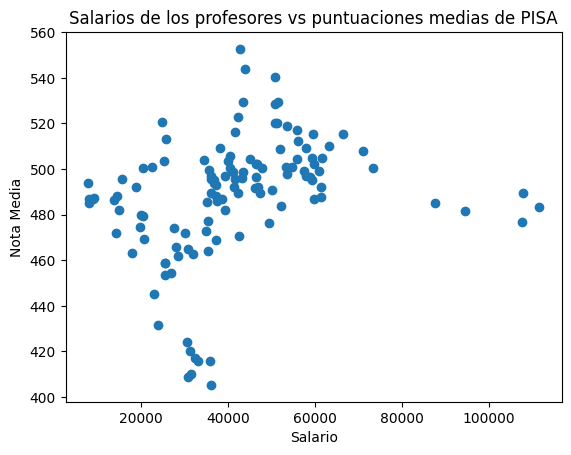

In [259]:
plt.scatter(df['teachers_salary'], df['mean_score'])
plt.title('Salarios de los profesores vs puntuaciones medias de PISA')
plt.xlabel('Salario')
plt.ylabel('Nota Media')

Es posible observar una pequena correlación positiva entre ambas variables, es decir, a mayores salarios tienden a darse puntajes más altos. Sin embargo, la correlación no parece ser muy fuerte visualmente.

Se observa una dispersión importante de los datos, con varios países con salarios similares que obtienen resultados muy distintos en PISA. Hay un cúmulo de países con salarios entre 20 mil y 60 mil dólares y puntajes promedio de 460 a 500 puntos aproximadamente. Pero también existen varios casos atípicos.

Los outliers con salarios muy elevados (por encima de 100 mil dólares) no necesariamente logran las puntuaciones más altas en PISA.  

En conclusión, el gráfico sugiere que, aunque existe cierta relación positiva entre salario docente y resultados educativos, ésta no es ni lineal ni determinista. El salario por sí solo no explica fuertemente las variaciones en el rendimiento académico. Influyen muchos otros factores en la calidad de la educación.

Comprobaremos si el comportamiento es el mismo de un año a otro y de una materia a otra

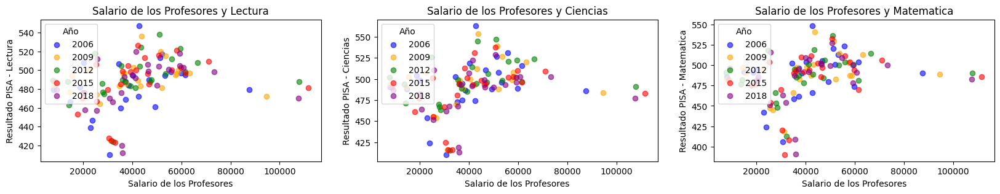

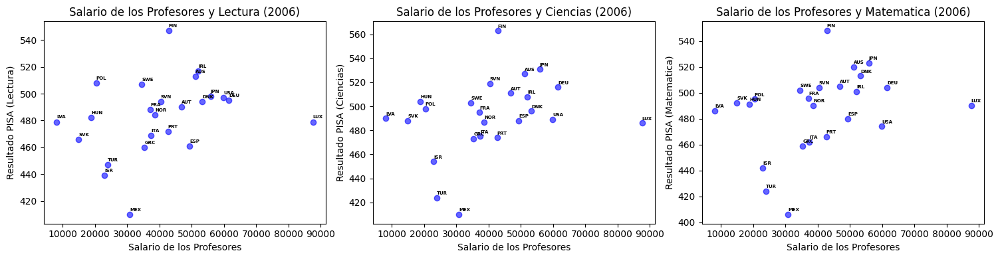

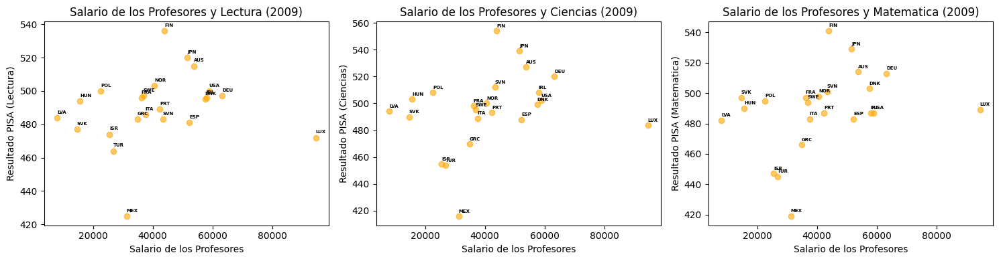

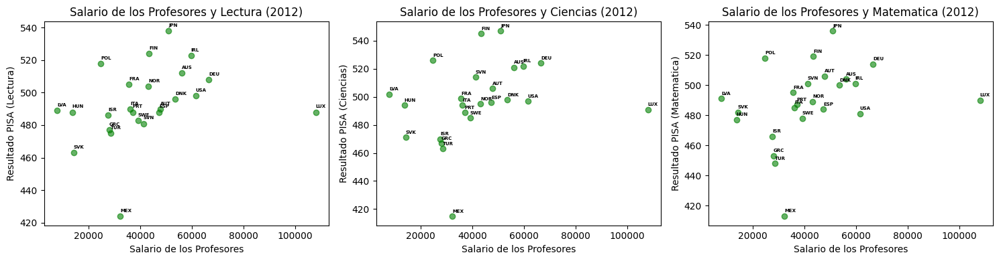

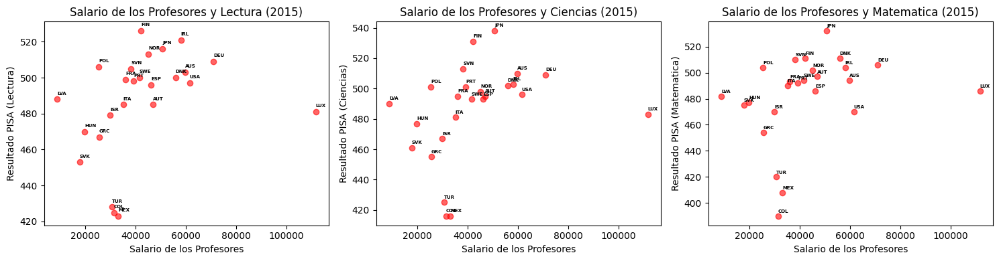

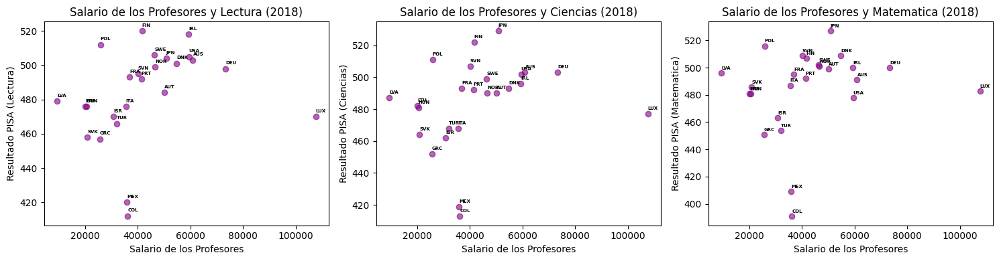

In [260]:
colores_por_año = {
    2006: 'blue',
    2009: 'orange',
    2012: 'green',
    2015: 'red',
    2018: 'purple'
}

materias = ['Lectura', 'Ciencias', 'Matematica']
fig, axes = plt.subplots(1, 3, figsize=(20, 3))

transparencia = 0.6

for i, materia in enumerate(['rea_total_value', 'sci_total_value', 'mat_total_value']):
    for year, group_data in df.groupby('year'):
        color = colores_por_año.get(year, 'gray')
        axes[i].scatter(group_data['teachers_salary'], group_data[materia], label=str(int(year)), color=color, alpha=transparencia)

    axes[i].set_xlabel('Salario de los Profesores')
    axes[i].set_ylabel(f'Resultado PISA - {materias[i]}')
    axes[i].set_title(f'Salario de los Profesores y {materias[i]}')
    axes[i].legend(title='Año', loc='upper left')

years = df['year'].unique()
for year in years:
    fig, axes_year = plt.subplots(1, 3, figsize=(15, 4))

    for j, materia in enumerate(['rea_total_value', 'sci_total_value', 'mat_total_value']):
        data = df[df['year'] == year]
        color = colores_por_año.get(year, 'gray')
        axes_year[j].scatter(data['teachers_salary'], data[materia], color=color, alpha=transparencia)
        axes_year[j].set_xlabel('Salario de los Profesores')
        axes_year[j].set_ylabel(f'Resultado PISA ({materias[j]})')
        axes_year[j].set_title(f'Salario de los Profesores y {materias[j]} ({int(year)})')

        for index, row in data.iterrows():
            x_offset = 0.1
            y_offset = 2.5
            axes_year[j].annotate(f"\n{row['location']}", (row['teachers_salary'] + x_offset, row[materia] + y_offset),
                                  fontsize=5, weight='bold')

    plt.tight_layout()
    plt.show()

La dispersión de puntos en los gráficos para cada materia y año, no revela una correlación tan evidente entre el salario de los profesores y el rendimiento de los estudiantes, aunque en algunos casos, parece haber una ligera correlación positiva. Sin embargo, esta relación generalmente viene acompañada de una dispersión significativa de puntos, lo que significa que no es una tendencia fuerte o predominante.

Se observa que en los distintos años los puntos en los gráficos se desplazan, reflejando variaciones en los puntajes y salarios. Pero estos cambios no siguen una pauta lineal clara. No parece haber una tendencia definida de mejora o deterioro en el PISA conforme avanzan los años.

Al estudiar país por país, tampoco se observan patrones fuertes. Por ejemplo, Estados Unidos (USA) y Alemania(DEU) tienen salarios docentes altos en todos los años, pero sus resultados en PISA fluctúan bastante. Otros países con salarios bajos como Polonia (POL) o Letonia (LVA) obtienen buenos puntajes algunos años.

Hay caso atipicos, los datos en los extremos que no siguen las tendencias generales como LUX, MEX y COL. Al segmentar por año y materia, se mantiene el patrón difuso sin cambios sustanciales en la relación salario-resultados.

En resumen, aún no podemos afirmar con seguridad que exista una relación fuerte, directa y consistente entre la inversión en salarios de profesores y la calidad de la educación. Los resultados sugieren que simplemente aumentar el salario de los profesores no necesariamente obtienen un desempeño mejor en las pruebas del PISA. Lo que seguimos la idea de que otros factores también pueden estar desempeñando un papel importante en esta ecuación compleja, y se requeriría un análisis más profundo para comprender completamente esta dinámica.

Sigamos analizando la relación entre los salarios de los profesores y los resultados de PISA

In [261]:
for year in df.year.unique():
    df_year=df[df['year']==year]
    df_year=df_year.sort_values(by="teachers_salary",ascending=False)
    df_year["score_avg"]=df_year[["rea_total_value","sci_total_value","mat_total_value"]].mean(axis=1)
    fig = make_subplots(specs=[[{"secondary_y": True}]])
    fig.update_layout(height=350, width=1500)
    fig.add_trace(go.Bar(x=df_year.location, y=df_year.teachers_salary, name="Salario de los Profesores"),secondary_y=False,)
    fig.add_trace(go.Scatter(x=df_year.location, y=df_year.score_avg, name="Rendimiento medio"),secondary_y=True,)
    fig.update_layout(title_text=f'Rendimiento medio y Salario de los Profesores en {int(year)}')
    fig.update_yaxes(title_text="Salario de los profesores", secondary_y=False)
    fig.update_yaxes(title_text="Rendimiento medio", secondary_y=True)
    fig.show()

Se observa poca relación entre los salarios docentes y el rendimiento medio en las pruebas PISA para un determinado año. Por ejemplo, en 2006 Dinamarca (DNK) tiene un de los salarios más altos pero hay otros países con salarios menores y resultados similares, como República Eslovaca (SVK) y Polonia (POL).

Esto se repite en otros años: países con sueldos docentes bajos logran buen desempeño académico, mientras que algunos de los que mejor pagan alcanzan resultados medios o bajos.

El gráfico refuerza la conclusión de que el vínculo entre inversión salarial en docentes y calidad educativa no es fuerte ni lineal.

Correlación entre el Salario de los Profesores y el Resultado PISA - Lectura: 0.2824914212045704
Correlación entre el Salario de los Profesores y el Resultado PISA - Ciencias: 0.2810273119223766
Correlación entre el Salario de los Profesores y el Resultado PISA - Matemáticas: 0.275558415404274
Correlación entre el Salario de los Profesores y el Resultado PISA - Media: 0.275558415404274


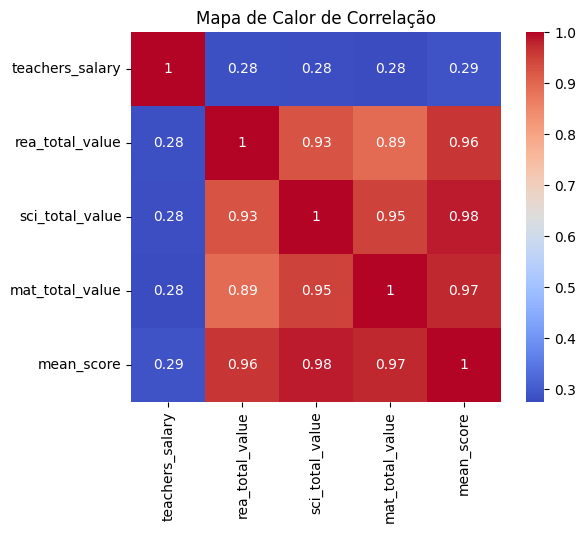

In [262]:
correlacion_leitura_salario = df['teachers_salary'].corr(df['rea_total_value'])
print("Correlación entre el Salario de los Profesores y el Resultado PISA - Lectura:", correlacion_leitura_salario)

correlacion_sci_salario = df['teachers_salary'].corr(df['sci_total_value'])
print("Correlación entre el Salario de los Profesores y el Resultado PISA - Ciencias:", correlacion_sci_salario)

correlacion_mat_salario = df['teachers_salary'].corr(df['mat_total_value'])
print("Correlación entre el Salario de los Profesores y el Resultado PISA - Matemáticas:", correlacion_mat_salario)

correlacion_mean_salario = df['teachers_salary'].corr(df['mean_score'])
print("Correlación entre el Salario de los Profesores y el Resultado PISA - Media:", correlacion_mat_salario)

correlation_matrix = df[['teachers_salary', 'rea_total_value', 'sci_total_value', 'mat_total_value','mean_score' ]].corr()

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', square=True)
plt.title('Mapa de Calor de Correlação')
plt.show()

En coherencia con los análisis anteriores, se constata  que  las correlaciones son positivas y muestran valores moderados, pero no muy fuertes. Esto indica que, en general, a medida que aumentan los salarios de los profesores, los resultados promedio en el PISA también tienden a aumentar, y viceversa. Sin embargo, al no ser correlaciones muy fuertes, esto significa que el salario de los profesores no es el único ni el factor principal que influye en los resultados del PISA. Además, lógicamente, las puntuaciones en diferentes áreas del PISA están más relacionadas entre sí que con el salario de los profesores.


Sin embargo, si indagamos más y analizamos las mismas correlaciones por países, vemos la complejidad y que debe haber muchos otros factores que influyen en los resultados de PISA.

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2845: RuntimeWarning:

Degrees of freedom <= 0 for slice

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2704: RuntimeWarning:

divide by zero encountered in divide



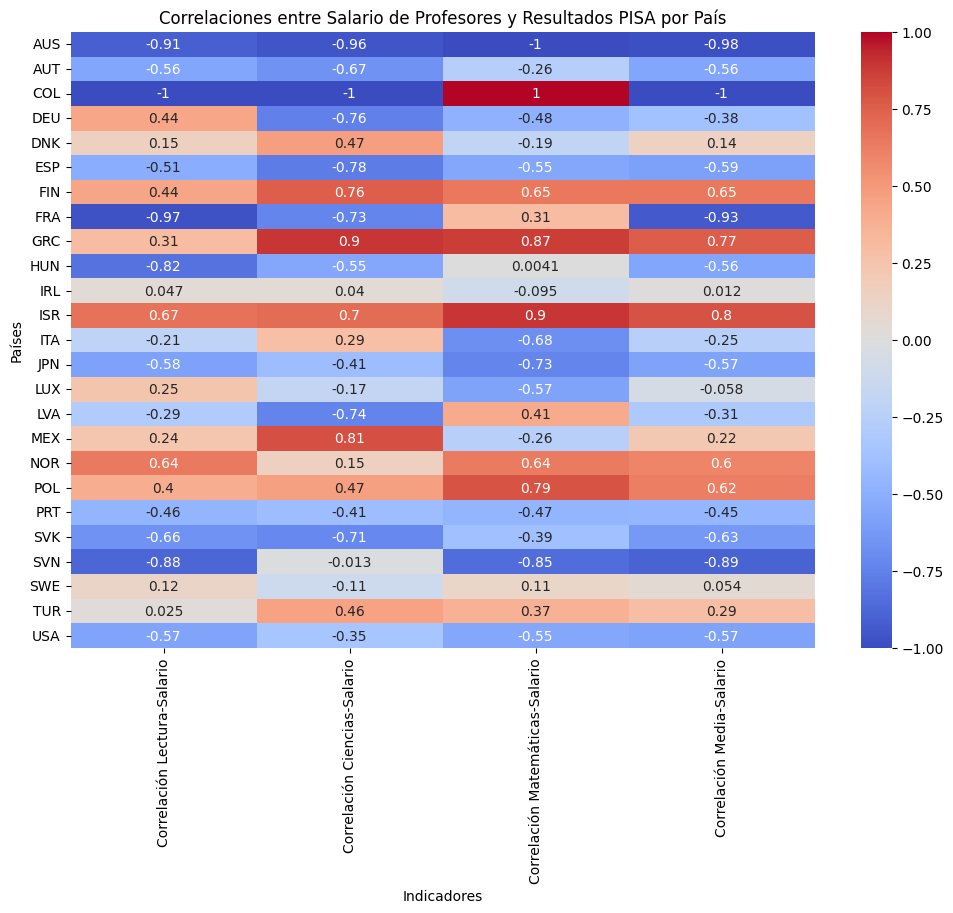

In [263]:
grouped = df.groupby('location')

correlations_by_country = {}
for country, data in grouped:
    correlacion_leer_salario = data['teachers_salary'].corr(data['rea_total_value'])
    correlacion_sci_salario = data['teachers_salary'].corr(data['sci_total_value'])
    correlacion_mat_salario = data['teachers_salary'].corr(data['mat_total_value'])
    correlacion_mean_salario = data['teachers_salary'].corr(data['mean_score'])

    if not (pd.isna(correlacion_leer_salario) or pd.isna(correlacion_sci_salario) or pd.isna(correlacion_mat_salario) or pd.isna(correlacion_mean_salario)):
        correlations_by_country[country] = {
            'Correlación Lectura-Salario': correlacion_leer_salario,
            'Correlación Ciencias-Salario': correlacion_sci_salario,
            'Correlación Matemáticas-Salario': correlacion_mat_salario,
            'Correlación Media-Salario': correlacion_mean_salario
        }

correlations_df = pd.DataFrame.from_dict(correlations_by_country, orient='index')

plt.figure(figsize=(12, 8))
sns.heatmap(correlations_df, annot=True, cmap='coolwarm', vmin=-1, vmax=1)

plt.xlabel('Indicadores')
plt.ylabel('Países')
plt.title('Correlaciones entre Salario de Profesores y Resultados PISA por País')

plt.show()

In [264]:
df_col = df[df['location'] == 'COL']
correlacion_leer_salario = df_col['teachers_salary'].corr(df_col['rea_total_value'])
correlacion_sci_salario = df_col['teachers_salary'].corr(df_col['sci_total_value'])
correlacion_mat_salario = df_col['teachers_salary'].corr(df_col['mat_total_value'])
correlacion_mean_salario = df_col['teachers_salary'].corr(df_col['mean_score'])
display("Datos COL")
display(df[df['location'] == 'COL'][['year', 'rea_total_value', 'sci_total_value','mat_total_value', 'mean_score','teachers_salary']]
)
print(f"Correlación  entre teachers_salary y rea_total_value em COL: {correlacion_leer_salario}")
print(f"Correlación  entre teachers_salary y sci_total_value em COL: {correlacion_sci_salario}")
print(f"Correlación  entre teachers_salary y mat_total_value em COL: {correlacion_mat_salario}")
print(f"Correlación  entre teachers_salary y mean_score em COL: {correlacion_mean_salario}")

display( '' )
print('Con sólo 2 puntos de datos(2015 y 2018), el coeficiente de correlación de Pearson sólo puede ser -1, 0 ó 1.')
print('Indicando una relación perfectamente negativa, ninguna relación o una relación perfectamente positiva.')

'Datos COL'

,year,rea_total_value,sci_total_value,mat_total_value,mean_score,teachers_salary
73,2015.0,425.0,416.0,390.0,410.33,31492.38
98,2018.0,412.0,413.0,391.0,405.33,36114.29


Correlación  entre teachers_salary y rea_total_value em COL: -1.0
Correlación  entre teachers_salary y sci_total_value em COL: -1.0
Correlación  entre teachers_salary y mat_total_value em COL: 1.0
Correlación  entre teachers_salary y mean_score em COL: -1.0


''

Con sólo 2 puntos de datos(2015 y 2018), el coeficiente de correlación de Pearson sólo puede ser -1, 0 ó 1.
Indicando una relación perfectamente negativa, ninguna relación o una relación perfectamente positiva.


Esos resultados destacan la complejidad de las relaciones entre el salario de los profesores y el rendimiento de los estudiantes en el PISA, mostrando que estas relaciones pueden variar significativamente de un país a otro y entre diferentes áreas del PISA. Por ejemplo, la correlación entre el salario de los profesores y el resultado del PISA en Ciencias es negativa en muchos países, mientras que la correlación con Matemáticas puede ser positiva en otros.

1. Algunas correlaciones son fuertes y negativas, lo que significa que en algunos países, un salario más alto de los profesores se correlaciona con puntuaciones más bajas en una área del PISA, y viceversa.
   Países como Australia (AUS), Francia (FRA), Hungría (HUN), Italia (ITA), Japón (JPN), Letonia (LVA), Luxemburgo (LUX), Eslovaquia (SVK) y Eslovenia (SVN) tienen correlaciones negativas fuertes entre el salario de los profesores y los resultados del PISA en al menos una de las áreas.

2. En otros países, las correlaciones son fuertes y positivas, lo que indica que un salario más alto de los profesores se correlaciona con puntuaciones más altas en el PISA.
   Países como Finlandia (FIN), Noruega (NOR), Polonia (POL), Grecia (GRC), Israel(ISR) y Mexico (MEX) tienen correlaciones positivas entre el salario de los profesores y los resultados del PISA en al menos una de las áreas.

3. Incluso países con salarios docentes relativamente altos como Japón (JPN) y Luxemburgo (LUX) tienen correlaciones negativas entre salario y desempeño en el PISA. Y otros con salarios bajos como Letonia (LVA) muestran correlaciones positivas en al menos una de las áreas.


Algunas posibles explicaciones para la ausencia de correlación positiva consistente:

- Factores culturales como valoración de la educación podrían pesar más que el salario docente.
- La formación y capacitación de los profesores influye más que el salario en sí.
- Metodologías de enseñanza y evaluación también determinan los resultados.
- El salario podría impactar en la motivación y satisfacción docente pero no necesariamente se traduce en mejor desempeño de los alumnos.
- Los salarios altos atraen a las personas por motivos económicos pero no garantizan vocación docente.

In [265]:
observaciones_43.append("Existen países con salarios de profesor similares que obtienen resultados diferentes en las evaluaciones PISA, como Noruega(NOR) y Finlandia(FIN)")
observaciones_43.append("En el gráfico de dispersión se observa una cierta correlación positiva, pero con una dispersión significativa de los datos.  Sin embargo, al analizar los datos año tras año, se puede notar que países como Estados Unidos (USA) y Alemania (DEU) mantienen salarios altos para los profesores a lo largo de los años, pero sus resultados en las pruebas PISA varían. Por otro lado, hay países con salarios más bajos, como Polonia (POL) y Letonia (LVA), que muestran un desempeño sólido en las pruebas PISA a pesar de sus ingresos más modestos.")
observaciones_43.append("El mapa de calor que correlaciona los salarios y los resultados por país revela que en algunos países la correlación es negativa en las tres áreas analizadas (Australia(AUS), Portugal(PRT), Estados Unidos(USA) y Japón(JPN)). En otros países, la correlación es positiva (Finlandia(FIN), Grecia(GRC), Noruega(NOR) y Israel(ISR)). También existen casos donde se observa una correlación negativa en dos de las áreas y positiva en una (como en Dinamarca(DNK), México(MEX), Irlanda(IRL) y Suecia(SWE)), así como casos donde se presenta una correlación positiva en dos áreas y negativa en una (como en Luxemburgo(LUX), Italia(ITa), Francia(FRA) y Hungría(HUN)). Existen complejidades en esta relación.")

#### 4.3.5 Análisis temporal

<ipython-input-266-983939daafd1>:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-266-983939daafd1>:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-266-983939daafd1>:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-266-983939daafd1>:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-266-983939daafd1>:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

<ipython-input-266-983939daafd1>:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future versi

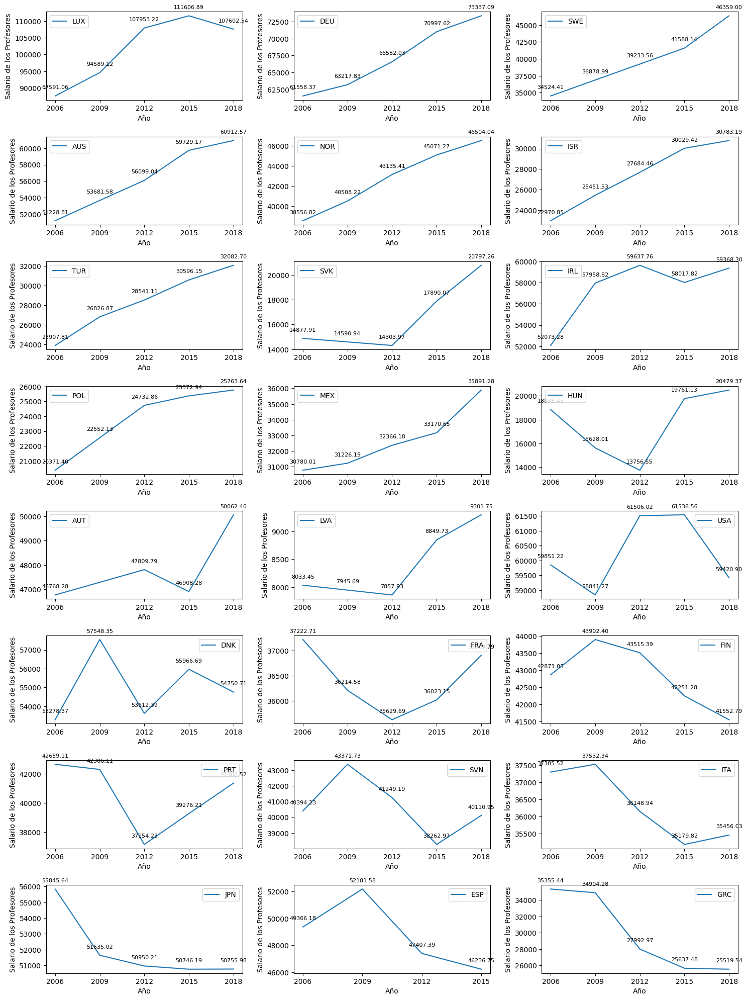

In [266]:
paises = ['AUS', 'AUT', 'DEU', 'DNK', 'ESP', 'FIN', 'FRA', 'GRC', 'HUN', 'IRL', 'ISR', 'ITA', 'JPN', 'LUX', 'LVA', 'MEX', 'NOR', 'POL', 'PRT', 'SVK', 'SVN', 'SWE', 'TUR', 'USA']

anos = [2006, 2009, 2012, 2015, 2018]

num_colunas = 3

num_filas = (len(paises) + num_colunas - 1) // num_colunas

slope_df = pd.DataFrame(columns=['Pais', 'Pendiente'])

for pais in paises:
    df_pais = df_copy[(df_copy['location'] == pais) & (df_copy['year'].isin(anos))]

    x = df_pais['year'].values.reshape(-1, 1)
    y = df_pais['teachers_salary'].values

    modelo = LinearRegression()
    modelo.fit(x, y)

    pendiente = modelo.coef_[0]

    slope_df = slope_df.append({'Pais': pais, 'Pendiente': pendiente}, ignore_index=True)

# Ordena los países según la pendiente (slope) de la regresión
slope_df = slope_df.sort_values(by='Pendiente', ascending=False)

fig, axs = plt.subplots(num_filas, num_colunas, figsize=(15, 20))

for i, pais in enumerate(slope_df['Pais']):
    df_pais = df_copy[(df_copy['location'] == pais) & (df_copy['year'].isin(anos))]

    ax = axs[i // num_colunas, i % num_colunas]

    ax.plot(df_pais['year'], df_pais['teachers_salary'], label=pais)

    for x, y in zip(df_pais['year'], df_pais['teachers_salary']):
        ax.annotate(f'{y:.2f}', (x, y), textcoords="offset points", xytext=(0,10), ha='center', fontsize=8)

    ax.set_xlabel('Año')
    ax.set_ylabel('Salario de los Profesores')

    ax.legend()

    ax.set_xticks(df_pais['year'])

for i in range(len(slope_df), num_filas * num_colunas):
    fig.delaxes(axs[i // num_colunas, i % num_colunas])

plt.tight_layout()

plt.show()


No hay una tendencia fija en los salarios a lo largo de los años entre los países. Algunos países tienen aumentos consistentes con el tiempo, mientras que otros experimentan fluctuaciones o tendencias a la baja en los salarios de los profesores.

1. Algunos países tienen tasas de crecimiento positivas, lo que indica aumentos en los salarios de los profesores a lo largo de los años.
   Países como Australia (AUS), Alemania (DEU), Noruega (NOR), Polonia (POL), México (MEX) y Suecia (SWE).

2. Algunos países muestran fluctuaciones en los salarios de los profesores a lo largo de los años, sin una tendencia clara de aumento o disminución.
   Países como Hungría (HUN), Letonia (LVA), Estados Unidos (USA), Dinamarca (DNK), Francia (FRA), Portugal (PRT) y Eslovaquia (SVK).

3. Otros países tienen tasas de crecimiento negativas, lo que sugiere una pequeña disminución en los salarios de los profesores.
   Países como Japón (JPN) y Grecia (GRC)

En conclusión, no se aprecia un patrón común entre los países. Cada uno ha seguido una evolución salarial, determinada por sus políticas educativas y coyuntura económica.

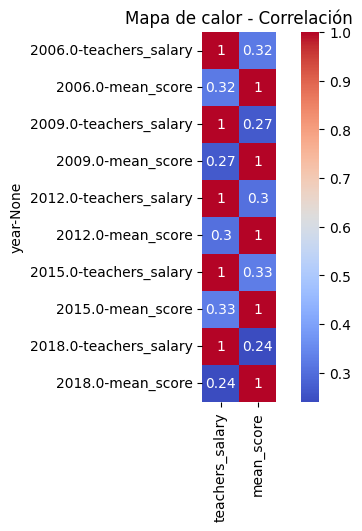

In [267]:
df_yearly = df.groupby(['year'])[['teachers_salary','mean_score']].corr()

sns.heatmap(df_yearly, annot=True, cmap='coolwarm', square=True)
plt.title('Mapa de calor - Correlación')
plt.show()

A pesar de existir una relación directamente proporcional entre el salario de los profesores y el rendimiento en el PISA a lo largo de los años, esta relación no es particularmente fuerte ni consistente en el tiempo (los valores de las correlaciones son relativamente bajos, oscilando entre 0,24 y 0,33).

No hay un patrón constante de aumento o disminución de la correlación a lo largo de los años. En 2015 fue la más alta (0,33) y en 2018 la más baja (0,24), pero en los años intermedios hubo variaciones. El valor más común encontrado fue alrededor de 0,3, una correlación positiva débil.

Los valores bajos y fluctuantes de las correlaciones año tras año son otro indicio de que el salario de los docentes no puede considerarse un factor determinante o aislado para explicar los resultados de los estudiantes. Claramente, hay muchos otros factores en juego que también influyen en el rendimiento académico.

In [268]:
observaciones_43.append("No hay una tendencia fija en los salarios a lo largo de los años entre los países. Algunos países tienen aumentos consistentes con el tiempo, mientras que otros experimentan fluctuaciones o tendencias a la baja en los salarios de los profesores.")
observaciones_43.append("El mapa de calor con la correlación entre salario y resultado año tras año no muestra que exista un patrón constante a lo largo del tiempo. Las correlaciones son débiles y fluctúan entre 0,24(2018) y 0,33(2015).")

#### 4.3.6 Agrupamiento (Cluster)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The

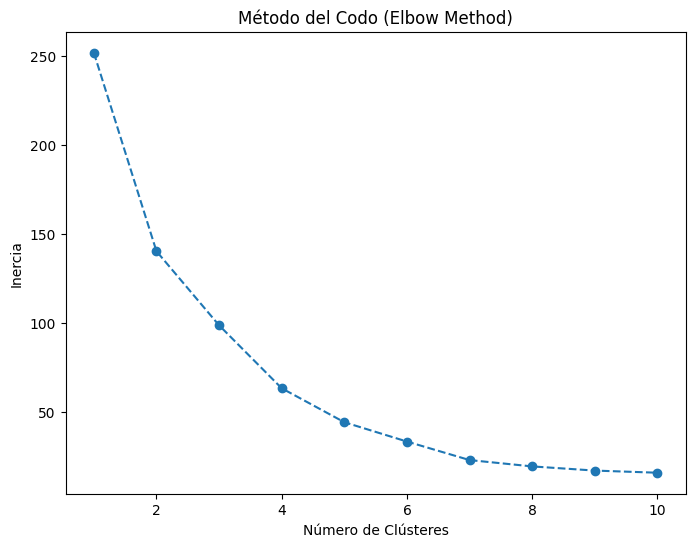

In [269]:
df_subset = df_promedio[['mean_score', 'teachers_salary', 'year', 'location']]

# Normalización de los datos
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_subset[['mean_score', 'teachers_salary']])

# Codificación one-hot para la columna 'year'
encoder = OneHotEncoder(sparse=False)
year_encoded = encoder.fit_transform(df_subset[['year']])

# Combinar los datos normalizados y los datos codificados
combined_data = np.column_stack((scaled_data, year_encoded))

# Encontrar el número ideal de clústeres usando el método del codo (Elbow Method)
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(scaled_data)
    inertia.append(kmeans.inertia_)

# Graficar el gráfico del codo
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertia, marker='o', linestyle='--')
plt.xlabel('Número de Clústeres')
plt.ylabel('Inercia')
plt.title('Método del Codo (Elbow Method)')
plt.show()


In [270]:
num_clusters = 5

# Aplicar K-Means con los datos combinados
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
df_subset['cluster'] = kmeans.fit_predict(combined_data)

# Ahora puedes agregar los resultados del clúster de vuelta al DataFrame original
df_promedio['cluster'] = df_subset['cluster']

# Ejecutar K-Means con los datos combinados
kmeans = KMeans(n_clusters=num_clusters, random_state=0)
df_subset['cluster'] = kmeans.fit_predict(combined_data)

# Ahora puedes agregar los resultados del clúster de vuelta al DataFrame original
df_promedio['cluster'] = df_subset['cluster']

# Calcular los valores máximos y mínimos para cada clúster
cluster_max_values = df_promedio.groupby('cluster')[['mean_score', 'teachers_salary']].max()
cluster_min_values = df_promedio.groupby('cluster')[['mean_score', 'teachers_salary']].min()

# Renombrar las columnas para evitar conflictos
cluster_min_values.rename(columns={'mean_score': 'min_mean_score', 'teachers_salary': 'min_teachers_salary'}, inplace=True)
cluster_max_values.rename(columns={'mean_score': 'max_mean_score', 'teachers_salary': 'max_teachers_salary'}, inplace=True)

# Combinar los valores máximos y mínimos de nuevo en el DataFrame original
df_promedio = pd.merge(df_promedio, cluster_max_values, on='cluster')
df_promedio = pd.merge(df_promedio, cluster_min_values, on='cluster')

df_promedio = df_promedio.sort_values(by=["year", "cluster"])

anos_unicos = df_promedio["year"].unique()

df_promedio.head(10)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

<ipython-input-270-8ecfda0c55a5>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

<ipython-input-270-8ecfda0c55a5>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://panda

,year,location,rea_total_value,sci_total_value,mat_total_value,teachers_salary,mean_score,cluster,max_mean_score,max_teachers_salary,min_mean_score,min_teachers_salary
0,2006.0,AUS,513.0,527.0,520.0,51228.805,520.00,0,552.67,73337.085,486.67,41552.795
1,2006.0,DEU,495.0,516.0,504.0,61558.370,505.00,0,552.67,73337.085,486.67,41552.795
2,2006.0,DNK,494.0,496.0,513.0,53278.370,501.00,0,552.67,73337.085,486.67,41552.795
3,2006.0,FIN,547.0,563.0,548.0,42871.030,552.67,0,552.67,73337.085,486.67,41552.795
4,2006.0,IRL,517.0,508.0,501.0,52073.275,508.67,0,552.67,73337.085,486.67,41552.795
5,2006.0,JPN,498.0,531.0,523.0,55845.640,517.33,0,552.67,73337.085,486.67,41552.795
6,2006.0,USA,497.0,489.0,474.0,59851.220,486.67,0,552.67,73337.085,486.67,41552.795
111,2006.0,ISR,439.0,454.0,442.0,22970.850,445.00,1,445.00,36114.290,405.33,22970.850
112,2006.0,MEX,410.0,410.0,406.0,30780.015,408.67,1,445.00,36114.290,405.33,22970.850
113,2006.0,TUR,447.0,424.0,424.0,23907.805,431.67,1,445.00,36114.290,405.33,22970.850


In [271]:
cluster_data = {
    'cluster': [],
    'min_mean_score': [],
    'max_mean_score': [],
    'min_teachers_salary': [],
    'max_teachers_salary': []
}

grupos_cluster = df_promedio.groupby('cluster')

for cluster, grupo in grupos_cluster:
    cluster_data['cluster'].append(cluster)
    cluster_data['min_mean_score'].append(grupo['min_mean_score'].unique()[0])
    cluster_data['max_mean_score'].append(grupo['max_mean_score'].unique()[0])
    cluster_data['min_teachers_salary'].append(grupo['min_teachers_salary'].unique()[0])
    cluster_data['max_teachers_salary'].append(grupo['max_teachers_salary'].unique()[0])

display(pd.DataFrame(cluster_data))


cluster_data = df_promedio.groupby(['location', 'year'])['cluster'].agg(lambda x: x.value_counts().idxmax()).reset_index()

cluster_data = cluster_data.pivot(index='year', columns='location', values='cluster').reset_index()

cluster_data = cluster_data.rename(columns={'year': 'Ano', 'location' :'Cluster'})
cluster_data = cluster_data.fillna('-')

reference_row = cluster_data.iloc[0, 1:]

def highlight_diff(row):
    return ['color: red' if x != y else '' for x, y in zip(row, reference_row)]

highlighted_cluster_data = cluster_data.style.apply(highlight_diff, axis=1, subset=cluster_data.columns[1:])

highlighted_cluster_data

,cluster,min_mean_score,max_mean_score,min_teachers_salary,max_teachers_salary
0,0,486.67,552.67,41552.795,73337.085
1,1,405.33,445.00,22970.850,36114.290
2,2,476.67,489.67,87591.060,111606.890
3,3,453.33,501.00,7857.930,35355.440
4,4,468.67,520.67,24732.860,52181.585


location,Ano,AUS,AUT,COL,DEU,DNK,ESP,FIN,FRA,GRC,HUN,IRL,ISR,ITA,JPN,LTU,LUX,LVA,MEX,NOR,POL,PROMEDIO,PRT,SVK,SVN,SWE,TUR,USA
0,2006.000000,0.000000,4.000000,-,0.000000,0.000000,4.000000,0.000000,4.000000,3.000000,3.000000,0.000000,1.000000,4.000000,0.000000,-,2.000000,3.000000,1.000000,4.000000,3.000000,4.000000,4.000000,3.000000,4.000000,4.000000,1.000000,0.000000
1,2009.000000,0.000000,-,-,0.000000,0.000000,4.000000,0.000000,4.000000,3.000000,3.000000,0.000000,3.000000,4.000000,0.000000,-,2.000000,3.000000,1.000000,4.000000,3.000000,4.000000,4.000000,3.000000,4.000000,4.000000,3.000000,0.000000
2,2012.000000,0.000000,4.000000,-,0.000000,0.000000,4.000000,0.000000,4.000000,3.000000,3.000000,0.000000,3.000000,4.000000,0.000000,-,2.000000,3.000000,1.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,4.000000,3.000000,0.000000
3,2015.000000,0.000000,4.000000,1.000000,0.000000,0.000000,4.000000,0.000000,4.000000,3.000000,3.000000,0.000000,3.000000,4.000000,0.000000,-,2.000000,3.000000,1.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,4.000000,1.000000,0.000000
4,2018.000000,0.000000,4.000000,1.000000,0.000000,0.000000,-,0.000000,4.000000,3.000000,3.000000,0.000000,3.000000,4.000000,0.000000,3.000000,2.000000,3.000000,1.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,4.000000,3.000000,0.000000


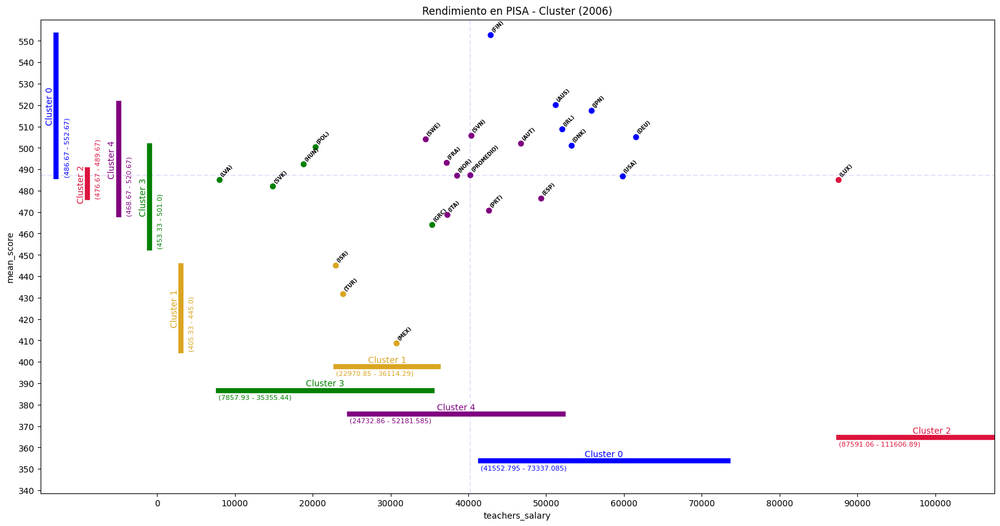

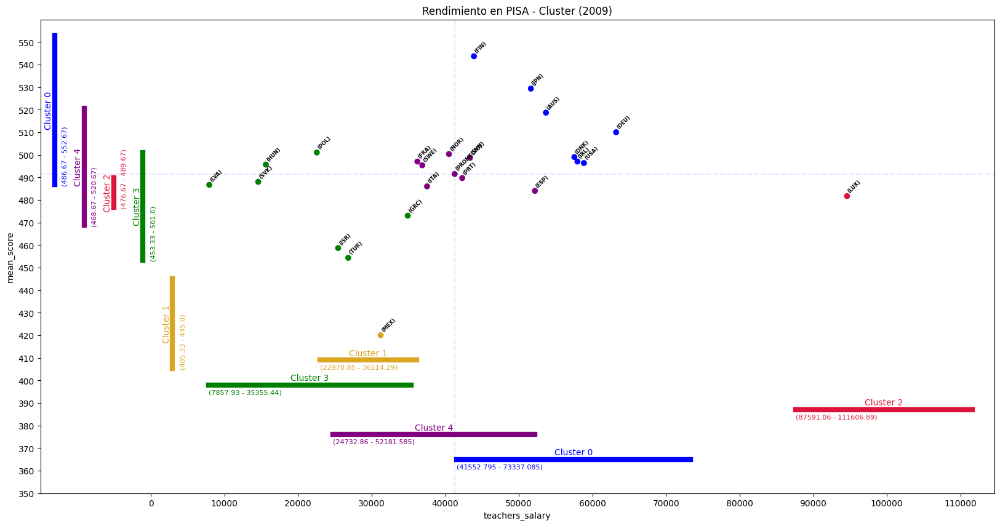

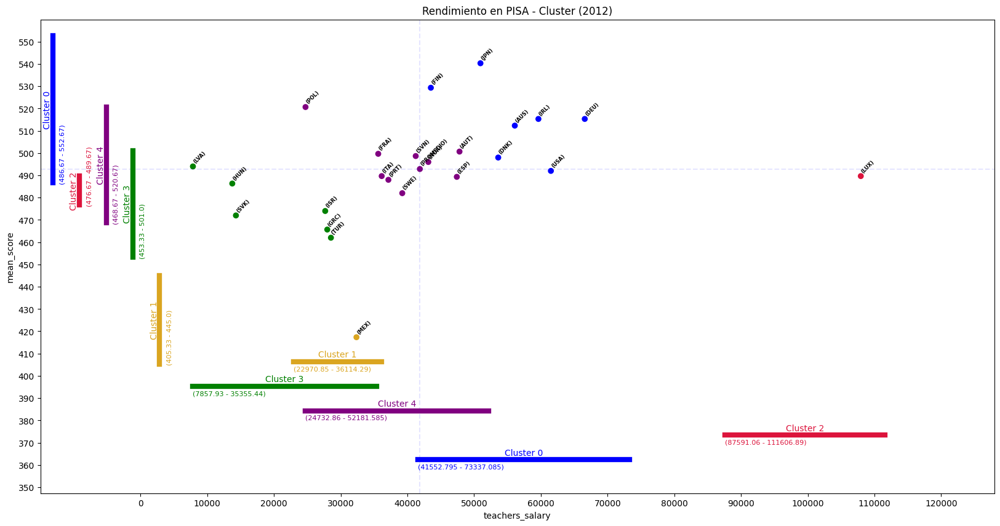

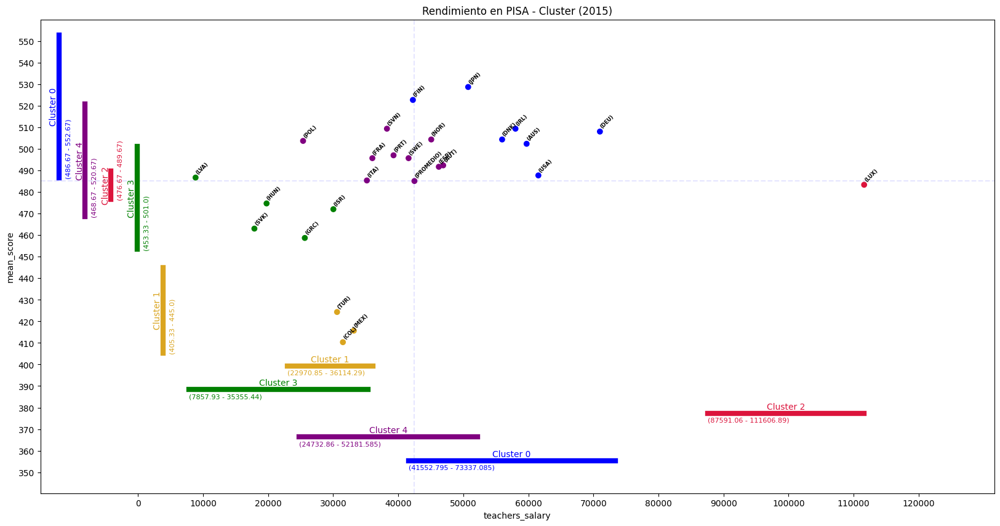

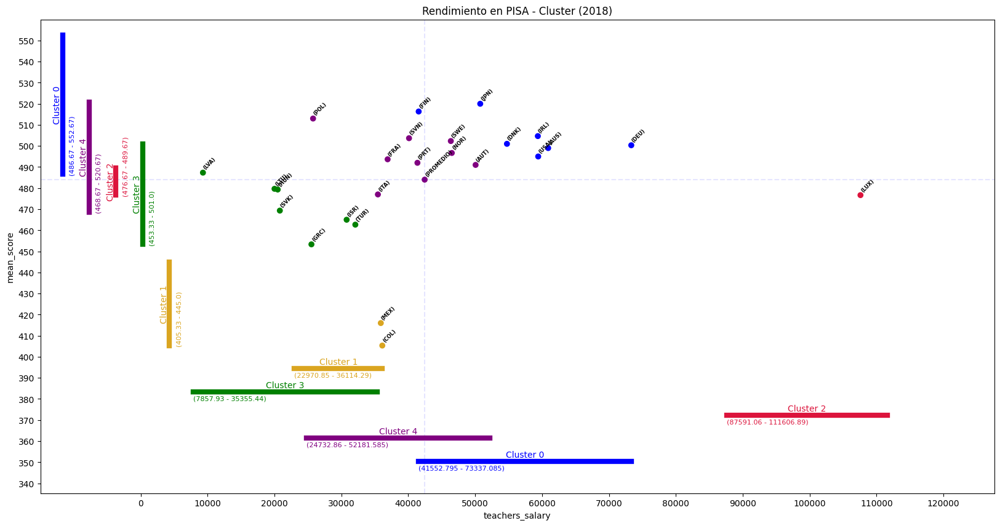

In [272]:
cluster_colors = {0: 'blue', 1: 'goldenrod', 2: 'crimson', 3:'green', 4:'purple', 5:'brown', 6:'cyane'}

promedio_salary = df_promedio[df_promedio["location"] == "PROMEDIO"]["teachers_salary"].iloc[0]

for ano in anos_unicos:
    df_ano = df_promedio[df_promedio["year"] == ano]

    df_ano = df_ano.sort_values(by="mean_score")

    plt.figure(figsize=(20, 10))

    # Crear una lista de colores para los puntos basados en la asignación de clusters.
    point_colors = [cluster_colors[cluster] for cluster in df_ano["cluster"]]

    # Agregar los puntos coloreados correspondientes a los grupos
    plt.scatter(df_ano["teachers_salary"], df_ano["mean_score"], c=point_colors)

    for i, row in df_ano.iterrows():
        mean_score = row["mean_score"]
        location = row["location"]
        if location == "PROMEDIO":
            promedio_salary = df_ano[df_ano["location"] == "PROMEDIO"]["teachers_salary"].iloc[0]
            plt.axhline(y=mean_score, color='b', linestyle='--', alpha=0.1)
            plt.axvline(x=promedio_salary, color='b', linestyle='--', alpha=0.1)

    # Definir un límite inferior personalizado para el eje y
    plt.ylim(min(df_ano["mean_score"]) - 10, max(df_ano["mean_score"]) + 10)

    clusters_unicos = df_ano["cluster"].unique()

    for i, cluster in enumerate(clusters_unicos):
        df_cluster = df_ano[df_ano["cluster"] == cluster]
        min_value = df_cluster["min_teachers_salary"].iloc[0]
        max_value = df_cluster["max_teachers_salary"].iloc[0]
        y_offset = min(df_ano["mean_score"]) - (i + 1) * 11  # Mover cada línea de grupo hacia abajo
        plt.plot([min_value, max_value], [y_offset, y_offset], linewidth=6, color=cluster_colors[cluster])
        plt.text(min_value, y_offset - 4, f"({min_value} - {max_value})", ha='left', va='baseline', fontsize=8, color=cluster_colors[cluster])
        plt.text((min_value + max_value) / 2, y_offset + 2, f"Cluster {cluster}", ha='center', color=cluster_colors[cluster])

        # Establecer un valor mayor de x_offset para mover todas las líneas hacia la izquierda
    x_offset_initial = df_ano["teachers_salary"].min() - 5000  # Mover la primera línea más hacia la izquierda
    x_offset_increment = 4000  # Valor de separación entre las líneas

    for i, cluster in enumerate(clusters_unicos):
        df_cluster = df_ano[df_ano["cluster"] == cluster]
        min_value = df_cluster["min_mean_score"].iloc[0]
        max_value = df_cluster["max_mean_score"].iloc[0]

        # Ajustar el valor de x_offset basado en el índice del grupo para separar las líneas verticales
        x_offset = x_offset_initial - i * x_offset_increment  # Mover cada línea hacia la izquierda

        plt.plot([x_offset, x_offset], [min_value, max_value], linewidth=6, color=cluster_colors[cluster])

        # Colocar el texto "(min_value} - {max_value}" a la derecha debajo de la línea
        plt.text(x_offset + 1000, min_value, f"({min_value} - {max_value})", ha='left', va='baseline', fontsize=8, color=cluster_colors[cluster], rotation=90)

        # Colocar el texto "Cluster X" en el centro vertical de las líneas verticales y a la izquierda de ellas
        plt.text(x_offset-800, (min_value + max_value) / 2, f"Cluster {cluster}", ha='center', va='center', color=cluster_colors[cluster], rotation=90)

    plt.title(f"Rendimiento en PISA - Cluster ({ano:.0f})")
    plt.xlabel("teachers_salary")
    plt.ylabel("mean_score")

    x_ticks = np.arange(0, 130000, 10000)
    plt.xticks(x_ticks)
    y_ticks = np.arange(0, 560, 10)
    plt.yticks(y_ticks)

    for x, y, salario, pais, nota in zip(df_ano["teachers_salary"], df_ano["mean_score"], df_ano["teachers_salary"], df_ano["location"], df_ano["mean_score"]):
        text = f"({pais})"
        plt.text(x+500, y+1, text, ha='left', va='bottom', fontsize=6, rotation=45, rotation_mode='anchor',fontweight='bold')

     # Definir un límite inferior personalizado para el eje y
    plt.ylim(min(df_ano["mean_score"]) - 70, 560)
    plt.xlim(-15000, df_ano["teachers_salary"].max() + 20000)

    plt.show()



- El Cluster 0 agrupa a muchos de los países tradicionalmente con un alto rendimiento en educación, como Finlandia(FIN), Japón(JPN) y Alemania(DEU). Se caracteriza por tener salarios de profesores y resultados académicos altos.

- El Cluster 1 incluye países como México(MEX) y Colombia(COL), con salarios de profesores bajos y resultados académicos también bajos.

- El Cluster 2 contiene solo a Luxemburgo(LUX), que se destaca por tener el salario de profesor más alto entre todos los países.

- El Cluster 3 contiene una mezcla de países, incluyendo Hungría(HUN), Letonia(LVA) y Grecia(GRC). En general, tiene salarios más bajos y resultados académicos promedio.

- El Cluster 4 agrupa principalmente países europeos con salarios de profesores y resultados académicos relativamente altos. Incluye países como Francia(FRA), Noruega(NOR) y Suecia(SWE).

- Al analizar la evolución temporal, se observa cierta estabilidad en los clusters, con pocos cambios a lo largo de los años.

- Es curioso que países nórdicos como Finlandia(FIN) y Suecia(SWE) no estén siempre en el mismo cluster, a pesar de tener características socioeconómicas similares.

- Llama la atención Israel(ISR), que en 2006 estaba en el Cluster 1 y luego pasó al Cluster 3, posiblemente reflejando un aumento en los salarios.

- México(MEX) y Colombia(COL) siempre permanecen en el Cluster 1, lo que indica la necesidad de políticas educativas en estos países.

- Se observa que el PROMEDIO siempre se encuentra en el Cluster 4, que agrupa a países con altas calificaciones y salarios. Esto se debe a que el PROMEDIO tiende a elevarse debido a los países desarrollados con buenos resultados.

En general, parece haber una relación positiva entre los salarios de los profesores y los resultados académicos, lo que respalda las hipótesis.

Análisis visual tiene limitaciones para cuantificar y determinar la correlación. Se necesitan técnicas estadísticas más avanzadas:

In [273]:
observaciones_43.append("Existe una relación positiva entre estas variables en los grupos formados en la agrupación, agrupando los países por salario y rendimiento. Se observa estabilidad en los clusters a lo largo de los años.")
observaciones_43.append("Existe cierta relación positiva entre salario y rendimiento en los clusters identificados, apoyando las hipótesis.Sin embargo, también se observó que países similares a veces se agrupan en clústers diferentes, lo que indica la complejidad de esta asociación.")

#### 4.3.7 Regresión Lineal

##### `4.3.7.1 LinearRegression`

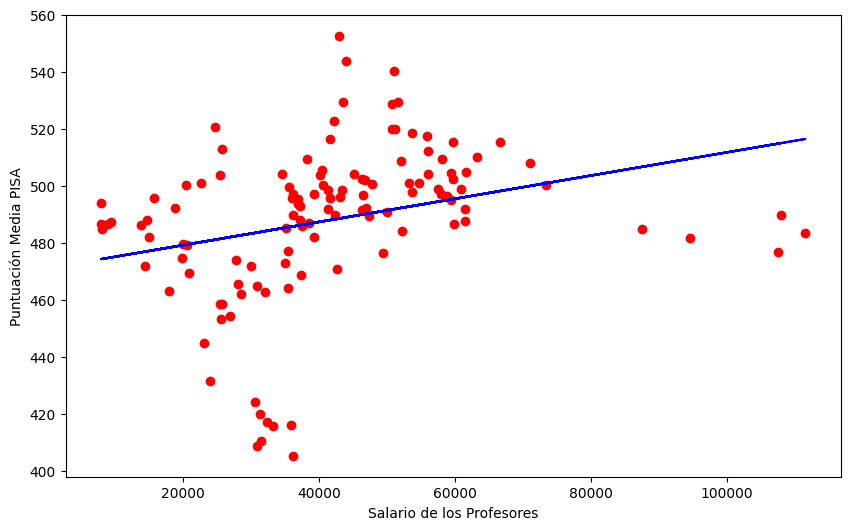

Coeficiente (pendiente): 0.0004065265470137453
Intercepto (origen): 471.087
Puntaje R²: 0.082


In [274]:
X = df[['teachers_salary']].values
y = df['mean_score'].values

regression_linear = linear_model.LinearRegression()

regression_linear.fit(X, y)

y_pred = regression_linear.predict(X)

plt.figure(figsize=(10, 6))
plt.scatter(X, y, color='red')
plt.plot(X, y_pred, color='blue')
plt.xlabel('Salario de los Profesores')
plt.ylabel('Puntuación Media PISA')
plt.show()

print(f"Coeficiente (pendiente): {regression_linear.coef_[0]}")
print(f"Intercepto (origen): {regression_linear.intercept_:.3f}")
print(f"Puntaje R²: {regression_linear.score(X, y):.3f}")

El gráfico muestra una dispersión de puntos y la línea de regresión tiene una forma curva ascendente. Esto indica que la relación entre el salario de los profesores y el puntaje PISA no es perfectamente lineal.

- Coeficiente (pendiente):  0.00040652654701374527

El coeficiente de pendiente es cerca de cero, lo que significa que no existe una relación lineal fuerte o significativa entre los salarios de los profesores y los resultados académicos del PISA. Esto implica que, según este modelo de regresión lineal, los salarios de los profesores no tienen un impacto lineal medible en los resultados académicos de los estudiantes.

- Intercepto (origen): 471.087

El intercepto es el valor previsto de los resultados académicos cuando los salarios de los profesores son cero, lo cual no tiene una interpretación práctica significativa en este contexto.

- Puntuación R²: 0.082

El valor R² de 0.082 sugiere que solo alrededor del 8.2% de la variación en los resultados académicos del PISA puede explicarse mediante el modelo de regresión lineal basado en los salarios de los profesores. Esto indica que el modelo no es muy eficaz para explicar las diferencias en los resultados académicos basados en los salarios de los profesores.

Según estos resultados, aunque existe una tendencia creciente, la relación entre estas dos variables no es fuertemente lineal: No existe una relación lineal significativa entre los salarios de los profesores y los resultados académicos en el PISA. No hay pruebas en los datos de que salarios más altos estén asociados linealmente a mejores resultados en PISA. La correlación entre estas variables es prácticamente nula.

##### `4.3.7.2 Regresión simple y múltiple`

In [275]:
result = smf.ols('mean_score ~ teachers_salary', data=df).fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:             mean_score   R-squared:                       0.082
Model:                            OLS   Adj. R-squared:                  0.075
Method:                 Least Squares   F-statistic:                     10.68
Date:                Thu, 12 Oct 2023   Prob (F-statistic):            0.00142
Time:                        09:28:36   Log-Likelihood:                -567.30
No. Observations:                 121   AIC:                             1139.
Df Residuals:                     119   BIC:                             1144.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept         471.0868      5.719     

In [276]:
# Regresión múltiple controlando por año y país
result = smf.ols('mean_score ~ teachers_salary + C(year) + C(location)', data=df).fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:             mean_score   R-squared:                       0.933
Model:                            OLS   Adj. R-squared:                  0.911
Method:                 Least Squares   F-statistic:                     41.74
Date:                Thu, 12 Oct 2023   Prob (F-statistic):           7.96e-41
Time:                        09:28:36   Log-Likelihood:                -409.01
No. Observations:                 121   AIC:                             880.0
Df Residuals:                      90   BIC:                             966.7
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept            508.8855     15

La regresión lineal simple entre el salario y el rendimiento PISA muestra una correlación positiva estadísticamente significativa (P < 0.05), pero el salario solo explica un 8,2% de la variación en los resultados. Esto indica una relación positiva pero débil y estadísticamente significativa entre el salario de los profesores y la puntuación media.

Al incorporar controles por año y país en la regresión múltiple, el porcentaje de variación explicada aumenta sustancialmente a 93,3%. Sin embargo, el coeficiente para "teachers_salary" en este modelo fue estimado como -1.311e-05 con un valor p de 0,961. Esto sugiere que, después de controlar por año y país, el salario de los profesores no tiene un impacto significativo en la puntuación media.

En otras palabras, el impacto del salario de los profesores en el puntaje PISA es prácticamente insignificante y no muestra una relación significativa en este contexto.

In [277]:
observaciones_43.append("Ninguno de los tres modelos de regresión lineal calculados encontró una relación lineal significativa entre el salario y los resultados de PISA, no son estatisticamente significativos")

#### 4.3.8 Conclusiones

In [278]:
observaciones_43

['Salario medio de 41.685 USD, pero con una elevada desviación estándar de 19.458 USD, lo que indica una gran variación de salarios entre países.',
 'La distribución de los salarios es asimétrica y tiende hacia los valores más altos, con algunos valores atípicos de salarios muy altos. La distribución de las puntuaciones PISA, por otra parte, es aproximadamente simétrica, con la mayoría de los datos concentrados en la región central.',
 'El Boxplot de los salarios normalizados por el PIB per cápita de cada país confirma que existe una gran variación entre países, lo que indica que la disparidad de los salarios docentes no se debe únicamente a las diferencias de desarrollo económico.',
 'Existen países con salarios de profesor similares que obtienen resultados diferentes en las evaluaciones PISA, como Noruega(NOR) y Finlandia(FIN)',
 'En el gráfico de dispersión se observa una cierta correlación positiva, pero con una dispersión significativa de los datos.  Sin embargo, al analizar los d

A pesar de que inicialmente se había hipotetizado que salarios más altos para los profesores resultarían en un mejor desempeño académico, los diversos métodos estadísticos y modelos econométricos aplicados a los datos del PISA no encontraron evidencia concluyente que respalde firmemente esta relación.

Existe una correlación positiva, aunque débil, entre el salario de los profesores y las calificaciones promedio en el PISA. Esto indica que los países con salarios más altos tienden a tener un rendimiento ligeramente mejor, pero la relación no es determinante. Existen países con salarios de profesor similares que obtienen resultados diferentes en las evaluaciones PISA, como Noruega y Finlandia.

Además, al considerar la variación salarial entre países, se notó una amplia disparidad en los salarios, sin un patrón claro asociado a los resultados en el PISA. Países con salarios más altos tuvieron desempeños medianos en algunos años, mientras que países con pagos más modestos ocasionalmente obtuvieron puntuaciones elevadas. En el gráfico de dispersión se observa una cierta correlación positiva, pero con una dispersión significativa de los datos. Sin embargo, al analizar los datos año tras año, se puede notar que países como Estados Unidos y Alemania mantienen salarios altos para los profesores a lo largo de los años, pero sus resultados en las pruebas PISA varían. Por otro lado, hay países con salarios más bajos, como Polonia y Letonia, que muestran un desempeño sólido en las pruebas PISA a pesar de sus ingresos más modestos. No hay un patrón único entre los países en la evolución de los salarios docentes con el tiempo. El salario por sí solo no determina la calidad de la educación. Factores como la formación de los profesores, las metodologías de enseñanza, la cultura educativa y las condiciones de trabajo probablemente desempeñen un papel importante. Es relevante considerar los salarios de los profesores en relación al costo de vida y al poder adquisitivo de cada país. Un salario más alto en un país puede no ser tan ventajoso si el costo de vida es significativamente mayor.

El mapa de calor que correlaciona los salarios y los resultados por país revela que en algunos países la correlación es negativa en las tres áreas analizadas (Australia, Portugal, Estados Unidos y Japón). En otros países, la correlación es positiva (Finlandia, Grecia, Noruega y Israel). También existen casos donde se observa una correlación negativa en dos de las áreas y positiva en una (como en México, Irlanda, Dinamarca y Suecia), así como casos donde se presenta una correlación positiva en dos áreas y negativa en una (como en Luxemburgo, Italia, Francia y Hungría). Existen complejidades en esta relación.

En cuanto a los números, se observa que el salario medio de los profesores varía significativamente entre países, con una media de 41.685 USD y una desviación estándar de 19.458 USD, lo que indica una gran variación salarial. Sin embargo, esta disparidad no se correlaciona de manera clara con los resultados en las pruebas PISA. Las correlaciones entre salario y rendimiento son en su mayoría débiles y fluctúan entre 0,2 y 0,3 (las correlaciones año tras año entre estos factores fueron mayoritariamente bajas, en el rango de 0,2 a 0,3)

El análisis por clusters muestra que, aunque existe una cierta correlación positiva entre salario y rendimiento en algunos casos, esta relación no es determinante y presenta complejidades. Países con salarios más altos a veces obtienen puntuaciones medias, mientras que países con salarios más bajos pueden lograr resultados elevados y que países similares a veces se agrupan en clústers diferentes.

Normalizar los salarios por el PIB per cápita de cada país muestra diferencias significativas en la remuneración de los profesores en todo el mundo. Algunos ejemplos incluyen a México, que a pesar de salarios nominales bajos, invierte considerablemente en educación, y Noruega, que tiene altos ingresos pero salarios relativamente bajos para los profesores.

El análisis de regresión muestra que el salario docente explica solo una pequeña parte de la variación en las calificaciones del PISA. Cuando controlamos por año y país, el poder explicativo aumenta, pero aún persisten problemas de correlación múltiple.

Em resumen, los datos disponibles no respaldan de manera concluyente la idea de que un salario más alto para los profesores se traduzca automáticamente en un mejor rendimiento académico de los estudiantes. Aunque existe una correlación débil pero positiva entre los salarios de los profesores y las calificaciones promedio en las pruebas PISA, esta relación no es definitiva.

### `4.4.Tasa NEET`

#### 4.4.0. Descripción de la variable

Tras explorar la relación entre la inversión educativa y el rendimiento académico, ahora nos embarcamos en analizar un indicador crucial en el ámbito social y educativo: NEET (Ni estudian, ni trabajan). Esta métrica refleja el porcentaje de jóvenes que no están involucrados en actividades laborales ni en programas educativos. Su importancia radica en su capacidad para revelar posibles fallas en el sistema educativo y laboral, y para identificar áreas en las que los jóvenes pueden estar siendo desatendidos. Para empezar, es esencial obtener una descripción general de los datos relacionados con NEET en nuestro conjunto de datos.

In [279]:
df.neet.describe()

count    121.000000
mean      15.555971
std        6.636580
min        6.226722
25%       10.971951
50%       13.994720
75%       18.792595
max       42.636936
Name: neet, dtype: float64

De los datos proporcionados, observamos que tenemos 121 registros para la métrica NEET. El promedio de jóvenes que pertenecen a la categoría NEET en los países analizados es aproximadamente del 15.55%. Sin embargo, este porcentaje varía ampliamente, con un mínimo del 6.22% y un máximo alarmante del 42.63%. Esta amplia variación se evidencia aún más con una desviación estándar del 6.63%.

Esta primera inspección nos brinda una idea de la magnitud y variabilidad del problema a nivel global. El siguiente paso será profundizar en el análisis, buscando relaciones y patrones que nos permitan entender las causas detrás de estas cifras y, si es posible, identificar áreas potenciales de intervención.

----

#### 4.4.1 Primeras Observaciones

En el contexto del análisis de la educación y el rendimiento académico, es crucial entender la distribución de jóvenes que no están empleados ni están en educación o formación (NEET). Estos jóvenes representan una población potencialmente en riesgo de exclusión social y económica. Al visualizar la distribución de NEET, nos acercamos a comprender la magnitud y características de este fenómeno.

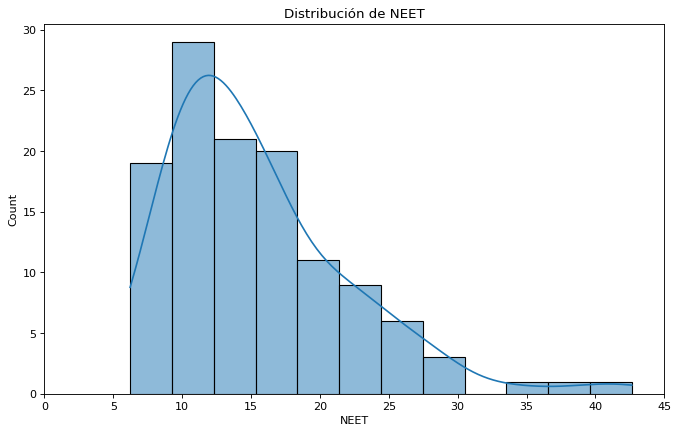

In [280]:
plt.figure(figsize=(10,6), dpi= 80)
sns.histplot(df.neet, label="NEET", kde=True)
plt.xlabel("NEET")
plt.xticks(np.arange(0, 50, 5))
plt.title('Distribución de NEET')
plt.show()

La distribución muestra que la mayoría de los países tienen tasas de NEET que se encuentran entre el 10% y el 20%. Sin embargo, hay una cola larga hacia la derecha, lo que indica que hay países con tasas de NEET mucho más altas, llegando hasta casi el 45%. La presencia de esta cola sugiere que, mientras muchos países tienen tasas moderadas de NEET, hay otros donde esta métrica es preocupantemente alta.

Al observar este gráfico, hemos identificado una variabilidad considerable en las tasas de NEET entre diferentes países. Si bien muchos países mantienen tasas moderadas, hay otros donde una proporción significativa de jóvenes ni estudia ni trabaja, lo que podría tener implicaciones serias para el futuro económico y social de esas naciones


------

#### 4.4.2.  Análisis temporal

Siguiendo nuestra exploración sobre la métrica NEET, es esencial visualizar cómo se distribuye este porcentaje a través de diferentes países y cómo ha evolucionado a lo largo de los años. Esta visualización nos ayudará a identificar tendencias, outliers y patrones de comportamiento en relación con esta métrica.

In [281]:
for year in df.year.unique():
    df_year = df[df['year'] == year]
    df_year = df_year.sort_values(by="neet", ascending=False)
    fig = px.bar(df_year, x='location', y='neet', color='location', title=f'Porcentaje de NEET en {int(year)} con desviación estándar = {df_year.neet.std():.2f}')
    fig.update_yaxes(title=None)
    fig.update_layout(height=300, width=1200)
    fig.update_layout(showlegend=False)
    fig.show()

Estos gráficos nos permiten visualizar la cantidad de jóvenes que no trabajan, no estudian ni reciben formación en cada país para cada año. Es especialmente útil para comparar y entender la situación de diferentes países y cómo ha evolucionado a lo largo del tiempo.
En general, parece que la situación de las personas NEET ha empeorado en algunos países como Italia y Grecia durante este período, de 2006 hasta 2018, mientras que en otros países como , Noruega y Finlandia se ha mantenido estable. Asi como Dinamarca ha duplicado. Además, la disminución de la desviación estándar sugiere que la brecha entre los países con altos y bajos porcentajes de NEET se ha estrechado con el tiempo

#### 4.4.3. Tendencia Temporal de la Tasa NEET en Países de la OCDE

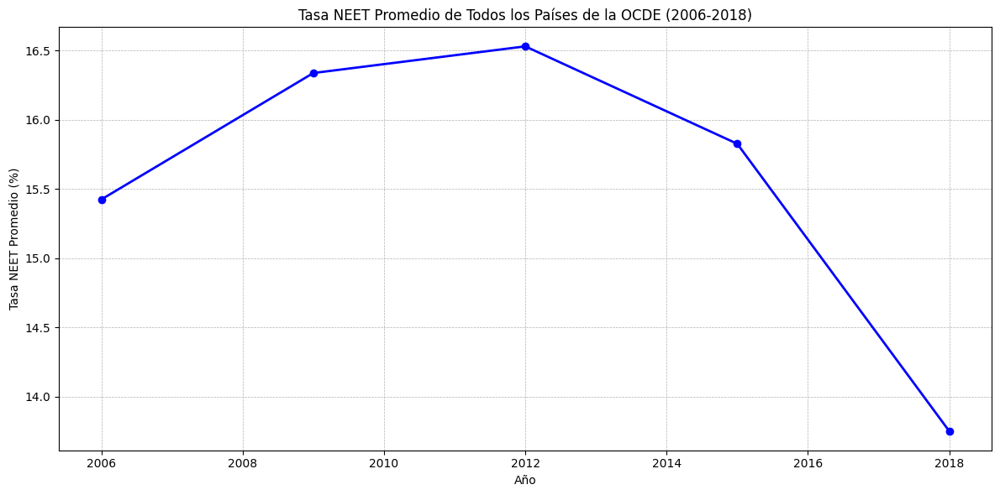

In [282]:
# Calculamos la tasa NEET promedio de todos los países de la OCDE a lo largo del tiempo
neet_promedio = df.groupby("year")["neet"].mean()

# Graficamos la tasa NEET promedio a lo largo del tiempo
plt.figure(figsize=(12, 6))
neet_promedio.plot(marker='o', linestyle='-', linewidth=2, color='blue')
plt.title('Tasa NEET Promedio de Todos los Países de la OCDE (2006-2018)')
plt.xlabel('Año')
plt.ylabel('Tasa NEET Promedio (%)')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


El gráfico nos presenta la evolución de la tasa NEET promedio entre los países de la OCDE desde el año 2006 hasta 2018. Si bien hay fluctuaciones a lo largo de los años, es evidente una tendencia decreciente en la tasa NEET a partir de 2012. Este descenso post-2012 coincide con las observaciones realizadas anteriormente para varios países específicos, lo que refuerza la idea de que hubo un cambio positivo generalizado en la OCDE en términos de reducción de jóvenes que no estudian ni trabajan.

#### 4.4.4. Desglose por Países

Ahora, vamos a desglosar esta tendencia por países para observar si esta tendencia general se mantiene a nivel individual. Para esto, seleccionaremos algunos países de interés y visualizaremos sus tendencias individuales.

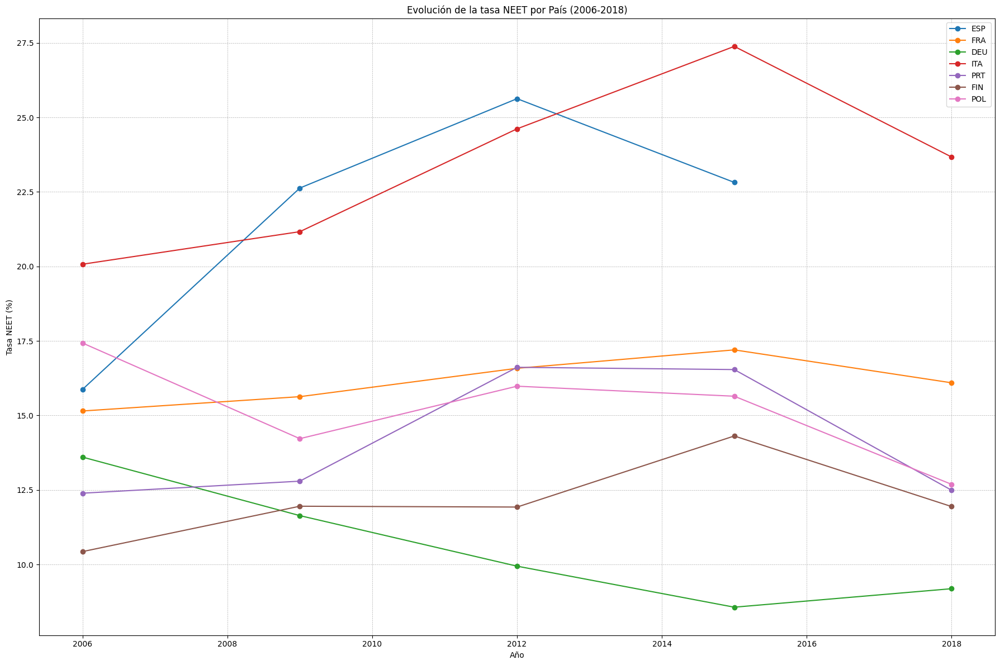

In [283]:
# Desglosar por Países: Tendencias individuales

# Seleccionamos algunos países representativos para el análisis
selected_countries = ["ESP", "FRA", "DEU", "ITA", "PRT", "FIN", "POL"]

# Filtramos el dataframe
df_selected = df[df["location"].isin(selected_countries)]

# Gráficos de tendencia por país
plt.figure(figsize=(18, 12))
for country in selected_countries:
    subset = df_selected[df_selected["location"] == country]
    plt.plot(subset["year"], subset["neet"], marker='o', label=country)

plt.title('Evolución de la tasa NEET por País (2006-2018)')
plt.xlabel('Año')
plt.ylabel('Tasa NEET (%)')
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


El gráfico muestra las tendencias de la tasa NEET para los países seleccionados desde el año 2006 hasta el 2018. Podemos observar las siguientes tendencias:

- España (ESP): Muestra una tendencia creciente hasta aproximadamente 2012 y luego comienza a decrecer.
- Francia (FRA): Presenta una tendencia relativamente estable con ligeras oscilaciones.
- Alemania (DEU): Exhibe una marcada tendencia decreciente a lo largo de los años.
- Italia (ITA): Similar a España, tiene un aumento hasta 2012 y luego una disminución.
- Portugal (PRT): Aunque presenta oscilaciones, en general, muestra una tendencia decreciente.
- Finlandia (FIN): La tendencia es relativamente estable, con un ligero aumento en los primeros años y luego una estabilización.
- Polonia (POL): Exhibe una clara tendencia decreciente a lo largo de los años.

Aunque las tendencias varían entre países, en general, muchos de ellos muestran una tendencia decreciente o estable en su tasa NEET a lo largo del tiempo.

#### 4.4.5 Tendencias individuales de cada pais

Tras haber analizado tendencias individuales de ciertos países seleccionados, es esencial ampliar nuestra visión y considerar las tendencias de la tasa NEET para cada país de la OCDE. Esta amplia visión nos permitirá identificar patrones o excepciones que no habíamos considerado previamente

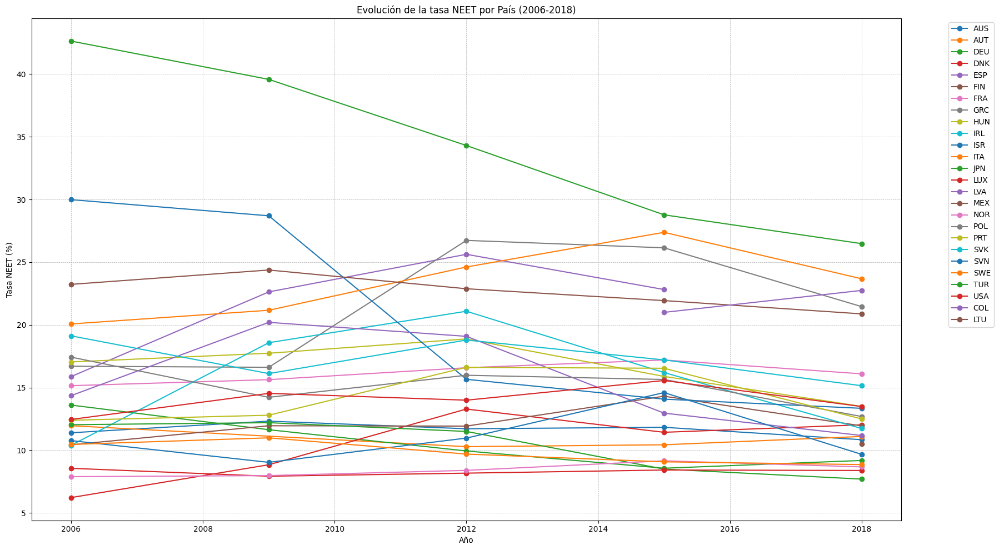

In [284]:
# Graficar la evolución de la tasa NEET para cada país
plt.figure(figsize=(18, 10))

for country in df["location"].unique():
    df_temp = df[df["location"] == country]
    plt.plot(df_temp["year"], df_temp["neet"], label=country, marker='o', linestyle='-')

plt.title('Evolución de la tasa NEET por País (2006-2018)')
plt.xlabel('Año')
plt.ylabel('Tasa NEET (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


La visualización muestra la evolución de la tasa NEET para cada país de la OCDE en el periodo 2000-2018. Observamos lo siguiente:

- Algunos países, como Turquía (TUR) y México (MEX), han mostrado una tendencia decreciente en su tasa NEET a lo largo del tiempo.
- Otros países, como Grecia (GRC) y España (ESP), muestran cierta volatilidad y una tendencia creciente, especialmente durante la crisis financiera mundial (alrededor de 2008).
- La mayoría de los países muestran variaciones, pero no hay una tendencia uniformemente decreciente en todos ellos.

Estas observaciones son consistentes con la idea de que factores económicos, políticos y sociales, además de la calidad educativa, pueden influir en la tasa NEET.

---

#### 4.4.6. Identificación de Outliers

Para comprender mejor la distribución de la métrica NEET y poder identificar aquellos países que presentan valores significativamente altos, es crucial detectar y analizar los outliers. Para ello, utilizaremos el enfoque tradicional basado en el Rango Intercuartil (IQR), que nos permite identificar valores que se alejan considerablemente de la tendencia central de los datos.

In [285]:
limite_superior = df['neet'].quantile(0.75) + 1.5 * (df['neet'].quantile(0.75) - df['neet'].quantile(0.25))

paises_con_altos_neet = df[df['neet'] > limite_superior]
paises_con_altos_neet


,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score,cluster_mean_edu_spe,abs_education_spending,diff_education_spending,diff_abs_education_spending
22,2006_TUR,2006.0,TUR,447.0,424.0,424.0,1.587441,23907.805,42.636936,431.67,2,15005.084411,NaN,NaN
45,2009_TUR,2009.0,TUR,464.0,454.0,445.0,1.550798,26826.865,39.581005,454.33,1,17252.348777,-0.036643,2247.264366
69,2012_TUR,2012.0,TUR,475.0,463.0,448.0,1.660729,28541.110,34.305846,462.00,1,25752.725600,0.109931,8500.376823


Nuestro análisis revela que Turquía es un outlier en lo que respecta a la métrica NEET. En los años 2006, 2009 y 2012, Turquía mostró tasas de NEET que superaban notablemente las de otros países incluidos en nuestro conjunto de datos. Estos valores atípicos pueden ser indicativos de desafíos específicos que enfrenta el país, ya sean de índole socioeconómica, estructural o relacionados directamente con el sistema educativo.

---

#### 4.4.7. Turquia

Dado que hemos identificado a Turquía como uno de los países con una tasa de NEET particularmente alta, es esencial comprender cómo ha evolucionado esta métrica a lo largo del tiempo.

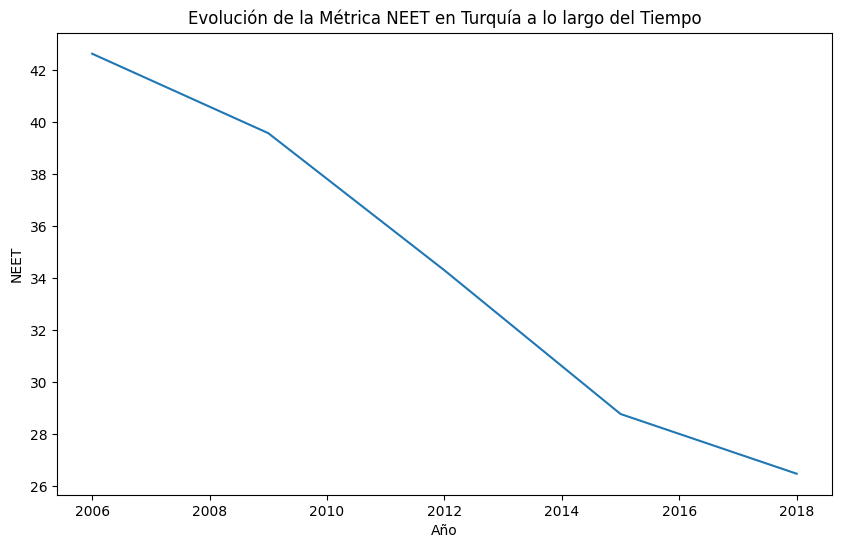

In [286]:
datos_turquia = df[df["location"] == "TUR"]
plt.figure(figsize=(10,6))
sns.lineplot(data=datos_turquia, x='year', y='neet')
plt.xlabel('Año')
plt.ylabel('NEET')
plt.title('Evolución de la Métrica NEET en Turquía a lo largo del Tiempo')
plt.show()


La gráfica muestra que la métrica NEET en Turquía ha experimentado fluctuaciones a lo largo del tiempo, con ciertos años mostrando un aumento notable y otros mostrando un leve descenso.

Veamos la relación entre el gasto en educación y el desempeño en lectura, ciencias y matemáticas de Turquía.

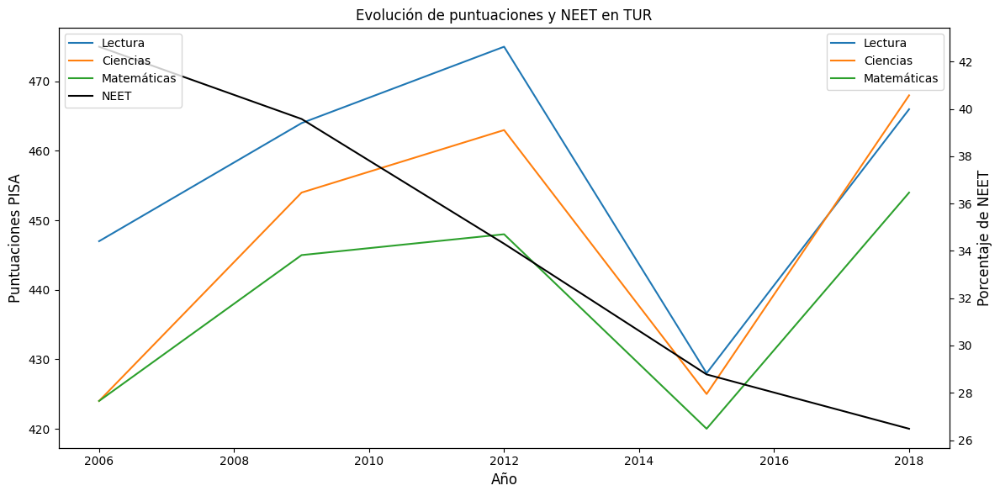

In [287]:
pais_interes = "TUR"

fig, ax = plt.subplots(figsize=(12, 6))

sns.lineplot(data=df[df["location"]==pais_interes], x='year', y='rea_total_value', ax=ax, label='Lectura')
sns.lineplot(data=df[df["location"]==pais_interes], x='year', y='sci_total_value', ax=ax, label='Ciencias')
sns.lineplot(data=df[df["location"]==pais_interes], x='year', y='mat_total_value', ax=ax, label='Matemáticas')

ax2 = ax.twinx()
sns.lineplot(data=df[df["location"]==pais_interes], x='year', y='neet', ax=ax2, color='black', label='NEET')
ax2.set_ylabel('Porcentaje de NEET', fontsize=12)

ax.set_title(f'Evolución de puntuaciones y NEET en {pais_interes}')
ax.set_xlabel('Año', fontsize=12)
ax.set_ylabel('Puntuaciones PISA', fontsize=12)

lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=2)

plt.tight_layout()
plt.show()

La correlación entre las puntuaciones educativas y la tasa NEET en Turquía es evidente. A medida que las puntuaciones en Lectura, Ciencias y Matemáticas mejoran, la tasa de NEET tiende a disminuir. Específicamente, se observa que las puntuaciones en Ciencias y Matemáticas sufrieron un descenso hasta el 2015, pero luego mostraron una recuperación significativa hasta el 2018. Paralelamente, la tasa de NEET también disminuyó durante este periodo. Esta tendencia sugiere que una educación de calidad y un buen desempeño académico pueden desempeñar un papel crucial en la reducción de las tasas de NEET, proporcionando a los jóvenes mayores oportunidades de empleo y formación.

#### 4.4.8. España, Italia y Portugal



Para realizar un análisis comparativo, vamos a centrarnos en tres países europeos con características socioeconómicas y culturales similares, pero con tendencias diferentes en términos de la métrica NEET: España, Italia y Portugal.

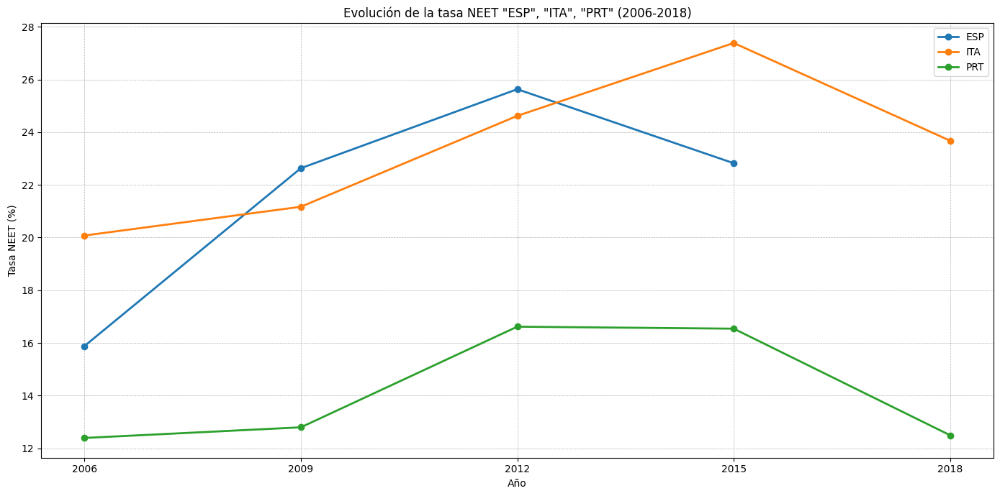

In [288]:
# Seleccionar solo España, Italia y Portugal
paises_interes = df[df["location"].isin(["ESP", "ITA", "PRT"])]

plt.figure(figsize=(14, 7))

# Graficar la evolución de la tasa NEET para cada país
for country in ["ESP", "ITA", "PRT"]:
    df_temp = paises_interes[paises_interes["location"] == country]
    plt.plot(df_temp["year"], df_temp["neet"], label=country, marker='o', linestyle='-', linewidth=2)

plt.title('Evolución de la tasa NEET "ESP", "ITA", "PRT" (2006-2018)')
plt.xlabel('Año')
plt.ylabel('Tasa NEET (%)')
plt.xticks(paises_interes["year"].unique())
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


- España muestra una tendencia ascendente en la tasa NEET hasta alrededor de 2012, después de lo cual hay una disminución constante.
- Italia tiene un patrón similar a España, pero la disminución después de 2013 no es tan pronunciada.
- Portugal, por otro lado, muestra una tendencia general a la baja a lo largo de los años, especialmente notable después de 2013.

Desempeño en PISA

A continuación, vamos a profundizar en cómo se correlacionan las puntuaciones PISA en Lectura, Ciencias y Matemáticas con la métrica NEET en estos tres países.

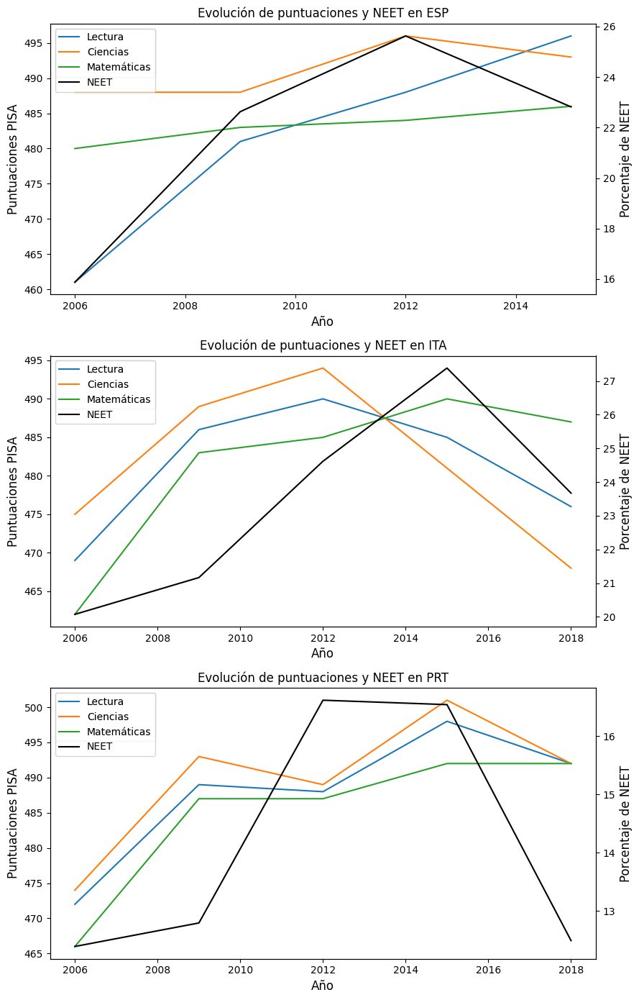

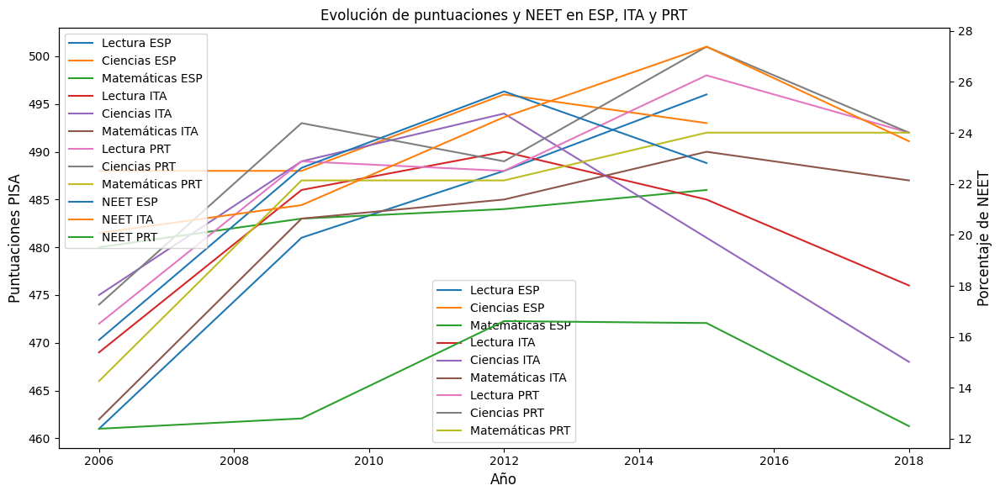

In [289]:
# Definiendo los países de interés
paises_interes = ["ESP", "ITA", "PRT"]

# Creando gráficos separados para cada país
fig, axs = plt.subplots(len(paises_interes), 1, figsize=(9, 14))

for i, pais in enumerate(paises_interes):
    sns.lineplot(data=df[df["location"]==pais], x='year', y='rea_total_value', ax=axs[i], label='Lectura')
    sns.lineplot(data=df[df["location"]==pais], x='year', y='sci_total_value', ax=axs[i], label='Ciencias')
    sns.lineplot(data=df[df["location"]==pais], x='year', y='mat_total_value', ax=axs[i], label='Matemáticas')

    ax2 = axs[i].twinx()
    sns.lineplot(data=df[df["location"]==pais], x='year', y='neet', ax=ax2, color='black', label='NEET')
    ax2.set_ylabel('Porcentaje de NEET', fontsize=12)

    axs[i].set_title(f'Evolución de puntuaciones y NEET en {pais}')
    axs[i].set_xlabel('Año', fontsize=12)
    axs[i].set_ylabel('Puntuaciones PISA', fontsize=12)

    lines, labels = axs[i].get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc=2)

plt.tight_layout()
plt.show()

# Creando un gráfico combinado
fig, ax = plt.subplots(figsize=(12, 6))

for pais in paises_interes:
    sns.lineplot(data=df[df["location"]==pais], x='year', y='rea_total_value', ax=ax, label=f'Lectura {pais}')
    sns.lineplot(data=df[df["location"]==pais], x='year', y='sci_total_value', ax=ax, label=f'Ciencias {pais}')
    sns.lineplot(data=df[df["location"]==pais], x='year', y='mat_total_value', ax=ax, label=f'Matemáticas {pais}')

ax2 = ax.twinx()
for pais in paises_interes:
    sns.lineplot(data=df[df["location"]==pais], x='year', y='neet', ax=ax2, label=f'NEET {pais}')

ax2.set_ylabel('Porcentaje de NEET', fontsize=12)
ax.set_title('Evolución de puntuaciones y NEET en ESP, ITA y PRT')
ax.set_xlabel('Año', fontsize=12)
ax.set_ylabel('Puntuaciones PISA', fontsize=12)

lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=2)

plt.tight_layout()
plt.show()


Interpretación:

En general, las tendencias en las puntuaciones PISA y la métrica NEET varían entre estos tres países:

- Aunque España y Portugal han mostrado signos positivos de recuperación en la reducción de la tasa NEET en años recientes, Italia aún enfrenta retos considerables en este aspecto.
- En el ámbito educativo, medido a través de las puntuaciones PISA, Portugal destaca por su mejora constante. España, a pesar de enfrentar desafíos, muestra indicios de recuperación en los últimos años. Italia, por su parte, ha mantenido una estabilidad en sus puntuaciones.

Este análisis comparativo subraya la importancia de considerar el contexto específico de cada país al evaluar y proponer soluciones para abordar la problemática de la métrica NEET.

#### 4.4.9.  Finlandia y Polonia

Para continuar con nuestro análisis comparativo, vamos a centrarnos en dos países europeos que han mostrado importantes avances en educación y políticas laborales: Finlandia y Polonia. Analizar la evolución de la métrica NEET en estos países nos proporcionará insights sobre las dinámicas educativas y laborales en contextos distintos

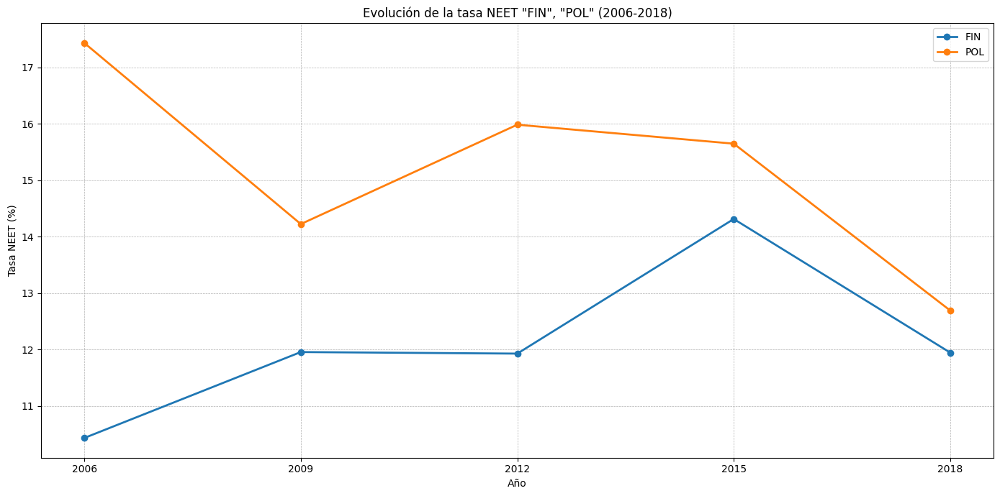

In [290]:
# Seleccionar solo Finlandia y Polonia
paises_interes = df[df["location"].isin(["FIN", "POL"])]

plt.figure(figsize=(14, 7))

# Graficar la evolución de la tasa NEET para cada país
for country in ["FIN", "POL"]:
    df_temp = paises_interes[paises_interes["location"] == country]
    plt.plot(df_temp["year"], df_temp["neet"], label=country, marker='o', linestyle='-', linewidth=2)

plt.title('Evolución de la tasa NEET "FIN", "POL" (2006-2018)')
plt.xlabel('Año')
plt.ylabel('Tasa NEET (%)')
plt.xticks(paises_interes["year"].unique())
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

- Ambos países han mostrado una disminución en la tasa NEET hacia 2018, la trayectoria ha sido diferente. Finlandia experimentó un aumento inicial seguido de una disminución, mientras que Polonia ha tenido una tendencia decreciente más constante.
- Polonia ha logrado una reducción más pronunciada en la tasa NEET en comparación con Finlandia durante el período observado.

Desempeño PISA

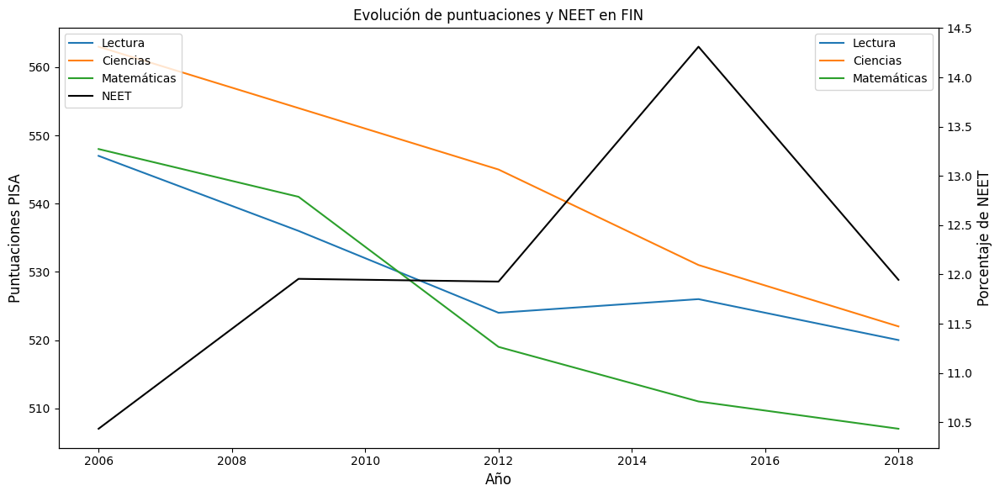

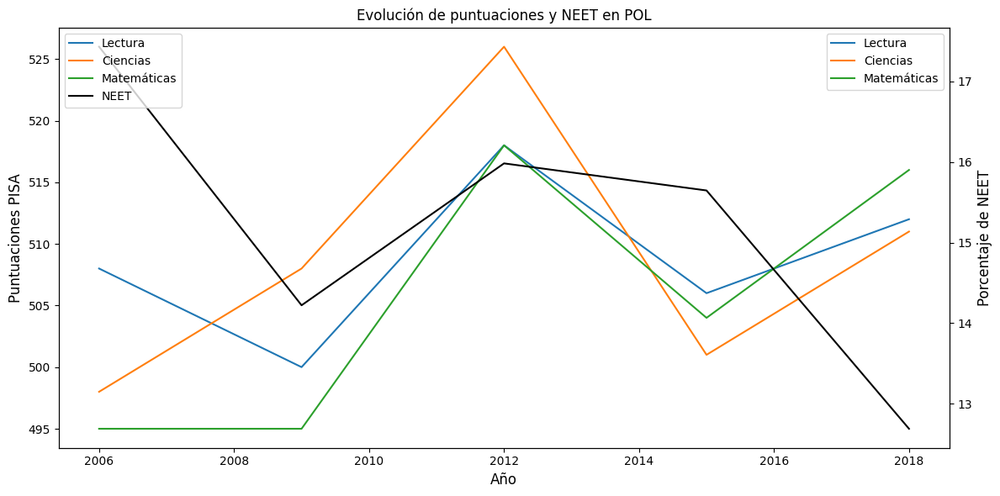

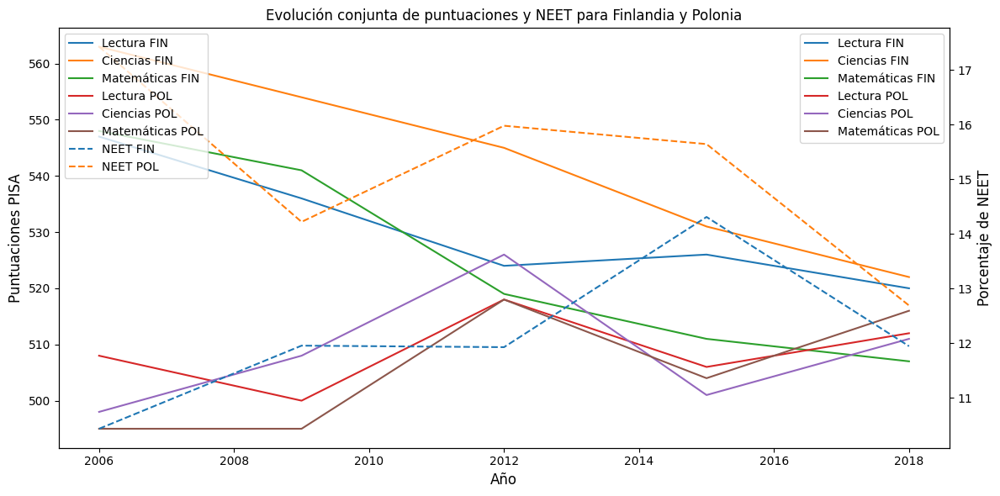

In [291]:
paises_interes = "FIN", "POL"


# Creación de los gráficos
for pais in paises_interes:
    fig, ax = plt.subplots(figsize=(12, 6))

    # Gráficos para las puntuaciones PISA
    sns.lineplot(data=df[df["location"] == pais], x='year', y='rea_total_value', ax=ax, label='Lectura')
    sns.lineplot(data=df[df["location"] == pais], x='year', y='sci_total_value', ax=ax, label='Ciencias')
    sns.lineplot(data=df[df["location"] == pais], x='year', y='mat_total_value', ax=ax, label='Matemáticas')

    # Eje secundario para la métrica NEET
    ax2 = ax.twinx()
    sns.lineplot(data=df[df["location"] == pais], x='year', y='neet', ax=ax2, color='black', label='NEET')
    ax2.set_ylabel('Porcentaje de NEET', fontsize=12)

    ax.set_title(f'Evolución de puntuaciones y NEET en {pais}')
    ax.set_xlabel('Año', fontsize=12)
    ax.set_ylabel('Puntuaciones PISA', fontsize=12)

    # Leyenda
    lines, labels = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc=2)

    plt.tight_layout()
    plt.show()

# Gráfico conjunto para Finlandia y Polonia
fig, ax = plt.subplots(figsize=(12, 6))

for pais in paises_interes:
    sns.lineplot(data=df[df["location"] == pais], x='year', y='rea_total_value', ax=ax, label=f'Lectura {pais}')
    sns.lineplot(data=df[df["location"] == pais], x='year', y='sci_total_value', ax=ax, label=f'Ciencias {pais}')
    sns.lineplot(data=df[df["location"] == pais], x='year', y='mat_total_value', ax=ax, label=f'Matemáticas {pais}')

ax2 = ax.twinx()
for pais in paises_interes:
    sns.lineplot(data=df[df["location"] == pais], x='year', y='neet', ax=ax2, linestyle='--', label=f'NEET {pais}')

ax2.set_ylabel('Porcentaje de NEET', fontsize=12)
ax.set_title(f'Evolución conjunta de puntuaciones y NEET para Finlandia y Polonia')
ax.set_xlabel('Año', fontsize=12)
ax.set_ylabel('Puntuaciones PISA', fontsize=12)

lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc=2)

plt.tight_layout()
plt.show()


Finlandia, con puntuaciones PISA consistentemente altas, enfrentó un aumento en la tasa NEET hasta 2010, luego logró una disminución constante. Polonia, aunque comenzó con puntuaciones PISA más bajas, ha mostrado una mejora continua en estas puntuaciones y una notable reducción en su tasa NEET a lo largo de los años.

**Conclusiones hasta el momento:**
Comparando los resultados de Finlandia y Polonia con los de España, Italia y Portugal:

1. Tendencia NEET:

    - Finlandia y Polonia: Ambos países han logrado reducir su tasa NEET en los años recientes, siendo Polonia particularmente exitoso en esta área.
    - España e Italia: Estos países experimentaron un aumento en la tasa NEET hasta aproximadamente 2013, después del cual comenzaron a ver una disminución, aunque Italia no mostró una bajada tan pronunciada como España.
    - Portugal: Ha mostrado una tendencia decreciente constante en su tasa NEET, similar a Polonia.

2. Desempeño PISA:
    - Finlandia y Polonia: Finlandia ha mantenido puntuaciones PISA robustas, mientras que Polonia ha mejorado en las tres categorías a lo largo de los años.
    - España, Italia y Portugal: España y Portugal han mostrado signos de recuperación en sus puntuaciones PISA en años recientes, mientras que Italia ha permanecido relativamente estable.

En síntesis, mientras que Finlandia y Polonia han demostrado ser eficientes en equilibrar altas puntuaciones PISA con tasas NEET reducidas, España, Italia y Portugal enfrentan desafíos distintos. Portugal ha logrado reducir su tasa NEET de manera eficaz, similar a Polonia, mientras que España e Italia todavía enfrentan desafíos significativos en la reducción de su tasa NEET, aunque están mostrando signos de mejora.

#### 4.4.10.  Correlaciones

**Correlaciones De NEET con valores PISA**

Después de analizar la evolución de la tasa NEET en diferentes países y de observar las tendencias en las puntuaciones PISA, es vital entender cómo estas puntuaciones se relacionan directamente con la métrica NEET. Una matriz de correlaciones nos brindará una perspectiva cuantitativa de estas relaciones, enriqueciendo nuestro análisis acumulativo.

In [292]:
corr_neet = df[['neet', 'rea_total_value', 'sci_total_value', 'mat_total_value']].corr()["neet"].sort_values(ascending=False)
corr_neet

neet               1.000000
rea_total_value   -0.528580
sci_total_value   -0.590858
mat_total_value   -0.650961
Name: neet, dtype: float64

Las correlaciones revelan una relación inversa entre la métrica NEET y las puntuaciones PISA. Específicamente, una puntuación más alta en matemáticas está más inversamente correlacionada con la tasa NEET. Esto respalda las observaciones anteriores donde identificamos que una buena educación, reflejada en puntuaciones PISA más altas, parece estar asociada con tasas NEET más bajas. Sin embargo, es esencial recordar que correlación no implica causalidad.

**Analisis de Correlacion por año**


Profundizando en nuestro análisis, examinaremos cómo ha evolucionado la relación entre NEET y las puntuaciones PISA año tras año. Esto nos proporcionará una visión más detallada sobre si la correlación entre estas métricas ha cambiado con el tiempo y cómo se compara con las tendencias que hemos observado hasta ahora.

In [293]:
for year in df.year.unique():
    corr_yearly = df[df['year'] == year][['neet', 'rea_total_value', 'sci_total_value', 'mat_total_value']].corr()["neet"]
    print(f"Correlaciones para el año {year}:\n", corr_yearly, "\n")

Correlaciones para el año 2006.0:
 neet               1.000000
rea_total_value   -0.643262
sci_total_value   -0.694359
mat_total_value   -0.735703
Name: neet, dtype: float64 

Correlaciones para el año 2009.0:
 neet               1.000000
rea_total_value   -0.537349
sci_total_value   -0.626437
mat_total_value   -0.720988
Name: neet, dtype: float64 

Correlaciones para el año 2012.0:
 neet               1.000000
rea_total_value   -0.404891
sci_total_value   -0.497617
mat_total_value   -0.598167
Name: neet, dtype: float64 

Correlaciones para el año 2015.0:
 neet               1.000000
rea_total_value   -0.590306
sci_total_value   -0.637042
mat_total_value   -0.623312
Name: neet, dtype: float64 

Correlaciones para el año 2018.0:
 neet               1.000000
rea_total_value   -0.645655
sci_total_value   -0.708690
mat_total_value   -0.713660
Name: neet, dtype: float64 



- Hay una tendencia general en la que los países con mejores puntuaciones en las pruebas PISA tienden a tener tasas NEET más bajas.
- Aunque la fuerza de esta relación ha fluctuado a lo largo de los años, la dirección de la relación (negativa) se ha mantenido constante.
- La relación fue más débil en 2012 en comparación con otros años, lo que podría indicar que otros factores afectaron la tasa NEET ese año o que las puntuaciones de PISA no fueron tan predictivas de la tasa NEET como en otros años.
- En 2018, la relación entre las puntuaciones de PISA y la tasa NEET volvió a ser similar a la de 2006, lo que sugiere que la relación entre estas variables se ha mantenido bastante estable a lo largo del tiempo.

**Análisis de Correlaciones para Identificar Factores Asociados con la Tasa NEET - Invesigación de Factores Adicionales**

Después de observar la evolución de la tasa NEET y sus tendencias en diferentes países, vamos a profundizar en el conjunto de datos para descubrir posibles factores adicionales que puedan influir en esta tasa. Aunque hemos visto una correlación entre las puntuaciones PISA y la tasa NEET, es esencial explorar más variables.

<ipython-input-294-72b3aae2cad0>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



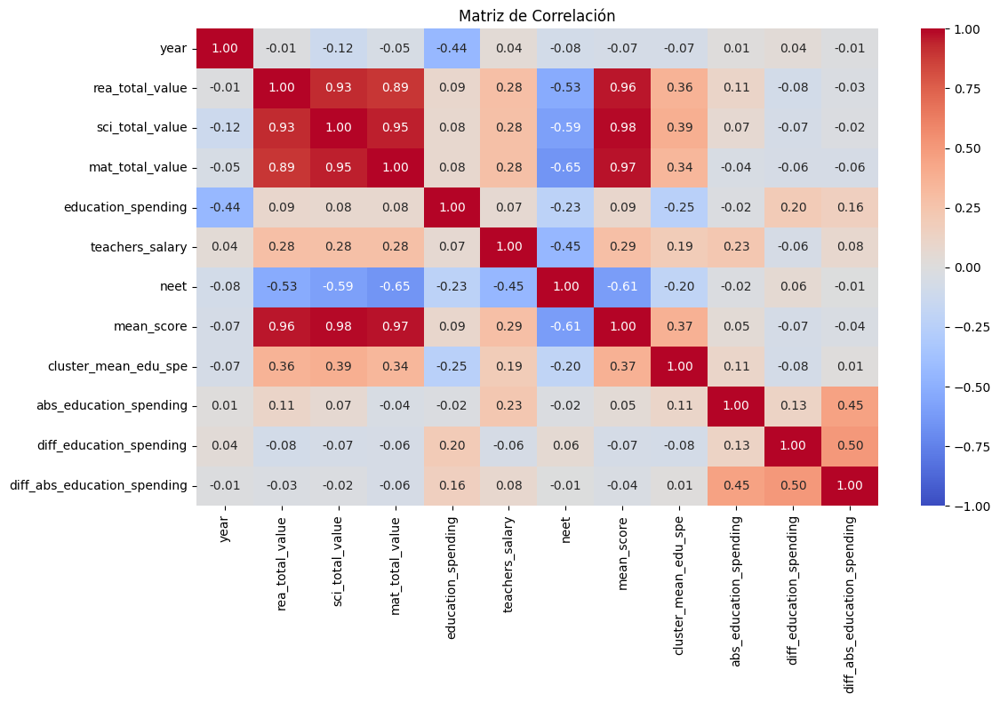

In [294]:
# Calculate the correlation matrix
correlation_matrix = df.corr()

# Plot the heatmap
plt.figure(figsize=(12,8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1, fmt=".2f")
plt.title('Matriz de Correlación')
plt.tight_layout()
plt.show()



Resaltan dos factores adicionales:
- Salario de los maestros (teachers_salary): Tiene una correlación negativa con la tasa NEET. Sugerente de que invertir en la profesión docente, a través de mejores salarios, puede tener un impacto positivo en la tasa NEET.
- Gasto en educación (education_spending): También con correlación negativa, reforzando la idea de que la inversión en educación es una herramienta clave para abordar el desempleo y la inactividad juvenil.

Estos hallazgos, en conjunto con nuestros análisis anteriores, resaltan la importancia de la educación y la inversión en ella como herramientas centrales para abordar el desafío NEET."

#### 4.4.11 Relación Detallada entre la Tasa NEET, Salario de Profesores y Gasto en Educación.

Dado que hemos identificado algunas correlaciones interesantes, podríamos investigar más a fondo la relación entre el salario de los maestros y la tasa NEET, así como el gasto en educación y la tasa NEET. Para ello, graficaremos la relación entre estas variables para ver si hay alguna tendencia visible. Empezaremos con el salario de los maestros y la tasa NEET.

**Relacion entre Neet y Salario de profesores**

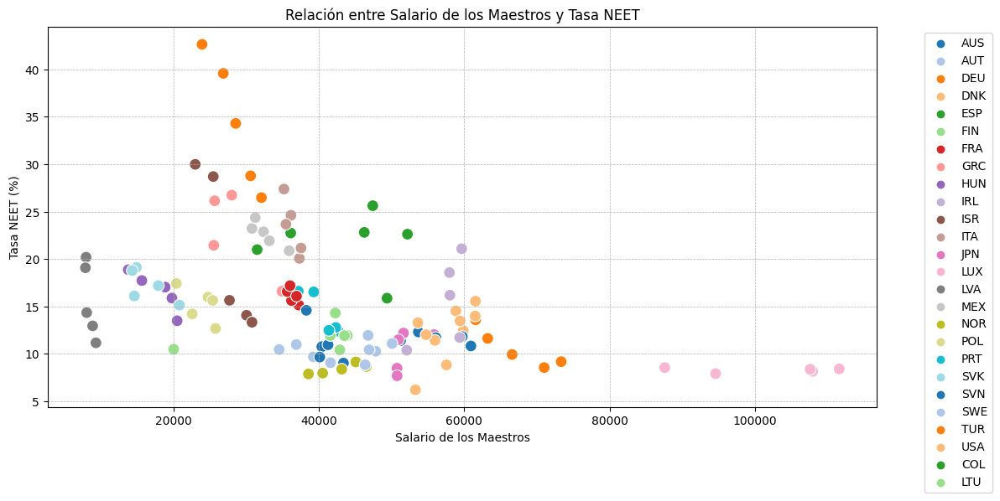

In [295]:
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x='teachers_salary', y='neet', hue='location', palette='tab20', edgecolor='w', s=100)
plt.title('Relación entre Salario de los Maestros y Tasa NEET')
plt.xlabel('Salario de los Maestros')
plt.ylabel('Tasa NEET (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


La gráfica muestra la relación entre el salario de los maestros y la tasa NEET para los diferentes países en el periodo 2006-2018. Observamos lo siguiente:

- Existe una tendencia general donde países con salarios de maestros más altos tienden a mostrar tasas NEET más bajas.

Esto respalda la correlación negativa identificada entre el salario de los maestros y la tasa NEET.

**Relación entre Neet y Gasto en Educación**

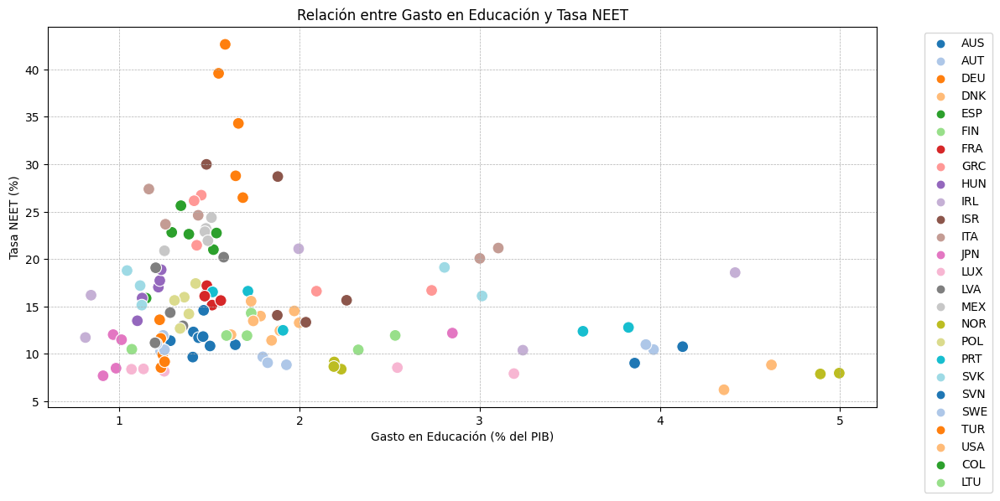

In [296]:
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x='education_spending', y='neet', hue='location', palette='tab20', edgecolor='w', s=100)
plt.title('Relación entre Gasto en Educación y Tasa NEET')
plt.xlabel('Gasto en Educación (% del PIB)')
plt.ylabel('Tasa NEET (%)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()


- Algunos países, como México (MEX) y Turquía (TUR), presentan tasas NEET más altas a pesar de invertir en educación de manera similar a países con tasas NEET inferiores.
- Es evidente que países como Noruega (NOR) y Dinamarca (DNK) invierten proporcionalmente más en educación y, a su vez, tienen tasas NEET más bajas.

Conclusión
- Hay variaciones claras en la tasa NEET entre los diferentes países y a lo largo del tiempo.
- El salario de los maestros parece tener una relación inversa con la tasa NEET, sugiriendo que una mayor remuneración para los maestros podría estar asociada con tasas NEET más bajas.
- Aunque el gasto en educación muestra una correlación negativa con la tasa NEET, la relación no es tan evidente visualmente.
- Las puntuaciones PISA, en general, están inversamente relacionadas con la tasa NEET, respaldando la idea de que una mejor calidad educativa podría estar asociada con tasas NEET más bajas.

#### 4.4.12 Análisis de tendencias para otros países de la OCDE

Ya hemos analizado en detalle países como Turquía, España, Italia, Portugal, Finlandia y Polonia. Por lo tanto, escojamos algunos otros países de la OCDE para nuestro análisis.

Para esta selección, buscaremos países que muestren tendencias claramente ascendentes o descendentes en al menos una de las áreas PISA (lectura, ciencias, matemáticas) a lo largo del tiempo. La idea es que si la hipótesis es correcta, deberíamos ver una tendencia inversa correspondiente en las tasas NEET.

Vamos a identificar tres países que cumplan con este criterio y luego analizarlos en detalle:

- Australia (Oceanía, economía avanzada)
- México México (América del Norte, economía emergente)
- Japón (Asia, economía avanzada)

Estos países fueron seleccionados debido a sus tendencias notables en las puntuaciones PISA y representan diferentes regiones geográficas.

**Análisis de Japon**

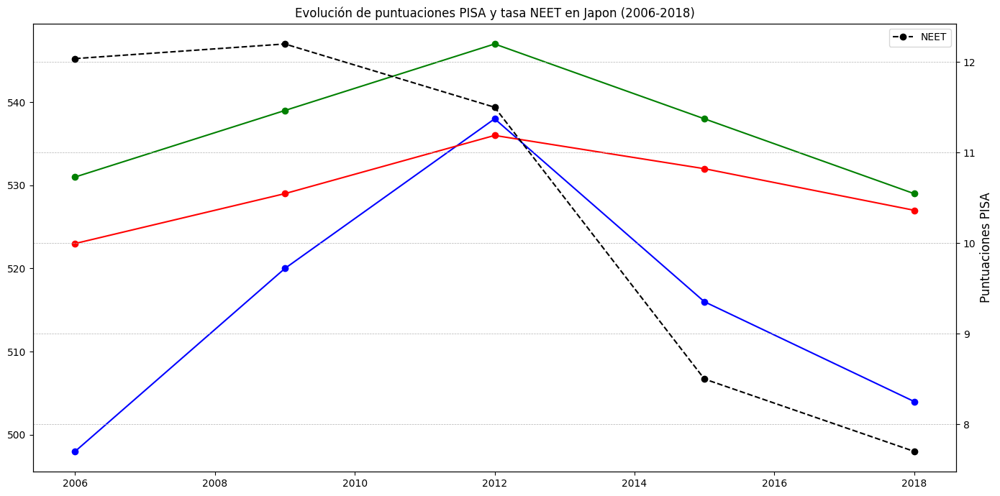

In [297]:
# Filtrando datos para Japon
df_japan = df[df["location"] == "JPN"]

# Graficar la evolución de las puntuaciones PISA y la tasa NEET para México
plt.figure(figsize=(14, 7))

# Puntuaciones PISA
plt.plot(df_japan["year"], df_japan["rea_total_value"], marker='o', label="Lectura", color='blue')
plt.plot(df_japan["year"], df_japan["sci_total_value"], marker='o', label="Ciencias", color='green')
plt.plot(df_japan["year"], df_japan["mat_total_value"], marker='o', label="Matemáticas", color='red')

# Tasa NEET
ax2 = plt.gca().twinx()
ax2.plot(df_japan["year"], df_japan["neet"], marker='o', linestyle='--', label="NEET", color='black')
ax2.set_ylabel('Tasa NEET (%)', fontsize=12)

plt.title('Evolución de puntuaciones PISA y tasa NEET en Japon (2006-2018)')
plt.xlabel('Año')
plt.ylabel('Puntuaciones PISA')
plt.legend(loc="upper left")
ax2.legend(loc="upper right")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()



- Las puntuaciones PISA, en términos generales, se han mantenido relativamente estables o han mostrado ligeros incrementos a lo largo de los años.
- La tasa NEET ha fluctuado, pero es importante destacar que cualquier cambio en las puntuaciones PISA no necesariamente se traduce en un cambio correlativo en la tasa NEET.

In [298]:
# Modelo de regresión lineal para Japón con Lectura, Ciencias y Matemáticas como predictores y NEET como variable dependiente
X_japan = df_japan[["rea_total_value", "sci_total_value", "mat_total_value"]]
X_japan = sm.add_constant(X_japan)  # Añadir constante
y_japan = df_japan["neet"]

model_japan = sm.OLS(y_japan, X_japan).fit()
model_japan.summary()

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning:

omni_normtest is not valid with less than 8 observations; 5 samples were given.



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   neet   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     129.8
Date:                Thu, 12 Oct 2023   Prob (F-statistic):             0.0644
Time:                        09:28:52   Log-Likelihood:                 4.6169
No. Observations:                   5   AIC:                            -1.234
Df Residuals:                       1   BIC:                            -2.796
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const             197.9923     35.650      5.554      0.113    -254.983     650.968
rea_total_value     0.0955      0.039      2.422      0.249      -0.406       0.597
sci_total_value     0.5071      0.064      7.906      0.080      -0.308       1.322
mat_total_value    -0.9615      0.066    -14.604      0.044      -1.798      -0.125
==============================================================================
Omnibus:                          nan   Durbin-Watson:                   3.486
Prob(Omnibus):                    nan   Jarque-Bera (JB):                0.538
Skew:                          -0.382   Prob(JB):                        0.764
Kurtosis:                       1.587   Cond. No.                     3.39e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.39e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Las puntuaciones PISA de Lectura y Ciencias están positivamente asociadas con la tasa NEET, mientras que la de Matemáticas tiene una asociación negativa. Sin embargo, solo la puntuación de Matemáticas es estadísticamente significativa al nivel de confianza del 95%.

**Análisis de México (MEX):**

Pasemos ahora a México y observemos cómo han evolucionado sus puntuaciones PISA y su tasa NEET a lo largo del tiempo.


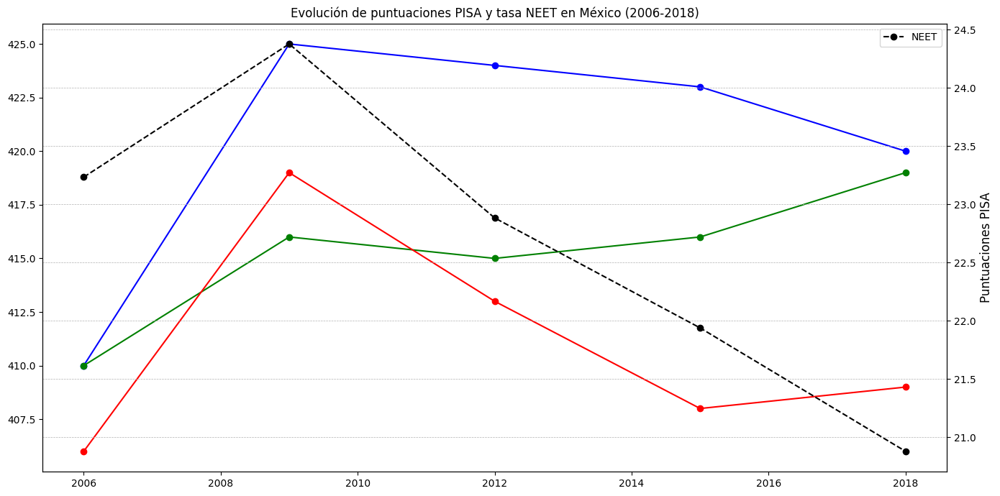

In [299]:
# Filtrando datos para México
df_mex = df[df["location"] == "MEX"]

# Graficar la evolución de las puntuaciones PISA y la tasa NEET para México
plt.figure(figsize=(14, 7))

# Puntuaciones PISA
plt.plot(df_mex["year"], df_mex["rea_total_value"], marker='o', label="Lectura", color='blue')
plt.plot(df_mex["year"], df_mex["sci_total_value"], marker='o', label="Ciencias", color='green')
plt.plot(df_mex["year"], df_mex["mat_total_value"], marker='o', label="Matemáticas", color='red')

# Tasa NEET
ax2 = plt.gca().twinx()
ax2.plot(df_mex["year"], df_mex["neet"], marker='o', linestyle='--', label="NEET", color='black')
ax2.set_ylabel('Tasa NEET (%)', fontsize=12)

plt.title('Evolución de puntuaciones PISA y tasa NEET en México (2006-2018)')
plt.xlabel('Año')
plt.ylabel('Puntuaciones PISA')
plt.legend(loc="upper left")
ax2.legend(loc="upper right")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

- Las puntuaciones PISA para Lectura, Ciencias y Matemáticas en México muestran un patrón general de aumento, con algunas fluctuaciones menores.
- La tasa NEET parece haber tenido un pico alrededor de 2009, luego disminuyó gradualmente desde entonces.

In [300]:
# Modelo de regresión lineal para Mexico con Lectura, Ciencias y Matemáticas como predictores y NEET como variable dependiente
X_mex = df_mex[["rea_total_value", "sci_total_value", "mat_total_value"]]
X_mex = sm.add_constant(X_mex)  # Añadir constante
y_mex = df_mex["neet"]

model_mex = sm.OLS(y_mex, X_mex).fit()
model_mex.summary()

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning:

omni_normtest is not valid with less than 8 observations; 5 samples were given.



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   neet   R-squared:                       0.976
Model:                            OLS   Adj. R-squared:                  0.903
Method:                 Least Squares   F-statistic:                     13.44
Date:                Thu, 12 Oct 2023   Prob (F-statistic):              0.197
Time:                        09:28:52   Log-Likelihood:                 1.3607
No. Observations:                   5   AIC:                             5.279
Df Residuals:                       1   BIC:                             3.716
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              65.4925     33.072      1.980      0.298    -354.724     485.709
rea_total_value     0.0028      0.070      0.039      0.975      -0.890       0.895
sci_total_value    -0.3307      0.098     -3.374      0.183      -1.576       0.915
mat_total_value     0.2271      0.061      3.715      0.167      -0.549       1.004
==============================================================================
Omnibus:                          nan   Durbin-Watson:                   3.452
Prob(Omnibus):                    nan   Jarque-Bera (JB):                0.423
Skew:                          -0.532   Prob(JB):                        0.809
Kurtosis:                       2.051   Cond. No.                     1.29e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.29e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Observaciones:

- Las puntuaciones PISA para Lectura, Ciencias y Matemáticas en México muestran una tendencia generalmente ascendente a lo largo del tiempo, aunque con algunas fluctuaciones.
- La tasa NEET se ha mantenido relativamente constante desde 2000 hasta alrededor de 2013, después de lo cual parece haber disminuido ligeramente.


Las tendencias en México no muestran un patrón claro entre las puntuaciones PISA y la tasa NEET. Si bien las puntuaciones PISA han mejorado en general, la tasa NEET no ha mostrado un cambio significativo.

Las puntuaciones PISA de Lectura y Matemáticas están positivamente asociadas con la tasa NEET, mientras que la de Ciencias tiene una asociación negativa. Sin embargo, en contraste con Japón, ninguna de estas asociaciones es estadísticamente significativa al nivel de confianza del 95% en el caso de México.

**Análisis de Australia (AUS):**

Ahora sigamos con Australia y veamos cómo han evolucionado sus puntuaciones PISA y su tasa NEET a lo largo del tiempo.


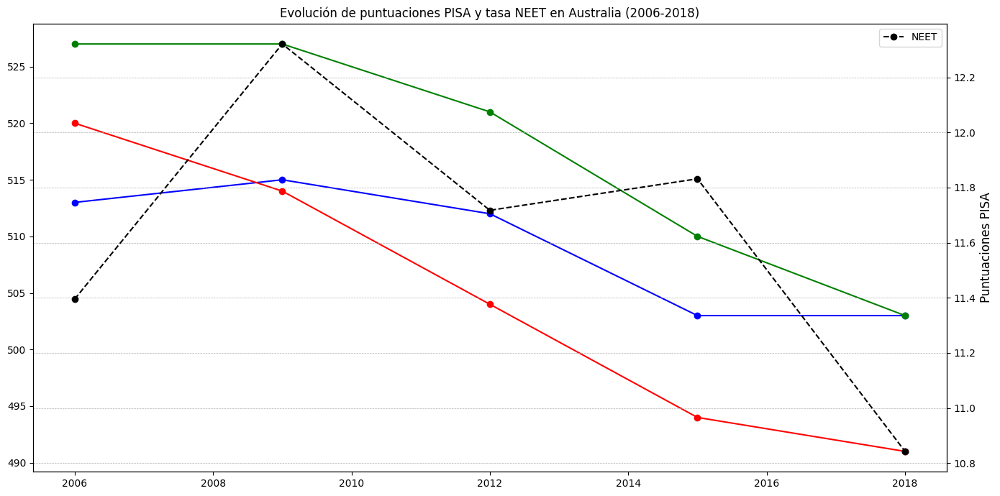

In [301]:
# Filtrando datos para Australia
df_aus = df[df["location"] == "AUS"]

# Graficar la evolución de las puntuaciones PISA y la tasa NEET para Australia
plt.figure(figsize=(14, 7))

# Puntuaciones PISA
plt.plot(df_aus["year"], df_aus["rea_total_value"], marker='o', label="Lectura", color='blue')
plt.plot(df_aus["year"], df_aus["sci_total_value"], marker='o', label="Ciencias", color='green')
plt.plot(df_aus["year"], df_aus["mat_total_value"], marker='o', label="Matemáticas", color='red')

# Tasa NEET
ax2 = plt.gca().twinx()
ax2.plot(df_aus["year"], df_aus["neet"], marker='o', linestyle='--', label="NEET", color='black')
ax2.set_ylabel('Tasa NEET (%)', fontsize=12)

plt.title('Evolución de puntuaciones PISA y tasa NEET en Australia (2006-2018)')
plt.xlabel('Año')
plt.ylabel('Puntuaciones PISA')
plt.legend(loc="upper left")
ax2.legend(loc="upper right")
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

Observaciones:

- Las puntuaciones PISA para Lectura, Ciencias y Matemáticas muestran una tendencia generalmente decreciente a lo largo del tiempo.
- En contraste, la tasa NEET muestra picos.

Estas tendencias parecen respaldar parcialmente la hipótesis, ya que cuando las puntuaciones PISA disminuyen, vemos un aumento en la tasa NEET. Sin embargo, también hay que tener en cuenta que, después de 2013, la tasa NEET comenzó a disminuir a pesar de que las puntuaciones PISA no mostraron mejoras significativas.

In [302]:
# Modelo de regresión lineal para Australia con Lectura, Ciencias y Matemáticas como predictores y NEET como variable dependiente

X_aus = df_aus[["rea_total_value", "sci_total_value", "mat_total_value"]]

X_aus = sm.add_constant(X_aus)  # Añadir constante

y_aus = df_aus["neet"]

model_mex = sm.OLS(y_aus, X_aus).fit()
model_mex.summary()


/usr/local/lib/python3.10/dist-packages/statsmodels/stats/stattools.py:74: ValueWarning:

omni_normtest is not valid with less than 8 observations; 5 samples were given.



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   neet   R-squared:                       0.764
Model:                            OLS   Adj. R-squared:                  0.058
Method:                 Least Squares   F-statistic:                     1.082
Date:                Thu, 12 Oct 2023   Prob (F-statistic):              0.593
Time:                        09:28:53   Log-Likelihood:               0.086179
No. Observations:                   5   AIC:                             7.828
Df Residuals:                       1   BIC:                             6.265
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
===================================================================================
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               6.7386     42.496      0.159      0.900    -533.230     546.707
rea_total_value    -0.0733      0.168     -0.435      0.739      -2.214       2.067
sci_total_value     0.1670      0.126      1.327      0.411      -1.432       1.766
mat_total_value    -0.0877      0.071     -1.231      0.434      -0.992       0.817
==============================================================================
Omnibus:                          nan   Durbin-Watson:                   3.412
Prob(Omnibus):                    nan   Jarque-Bera (JB):                0.271
Skew:                           0.268   Prob(JB):                        0.873
Kurtosis:                       1.993   Cond. No.                     1.58e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.58e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Para Australia, , las puntuaciones PISA en Lectura, Ciencias y Matemáticas no muestran una relación claramente definida con la tasa NEET. El modelo de regresión indica que estas variables, aunque importantes, no son predictores significativos de la tasa NEET en este contexto.

**Conclusión General para Australia, México y Japón:**

Tras analizar las tendencias en las puntuaciones PISA y las tasas NEET de Australia, México y Japón, es evidente que la relación entre la educación, medida a través de las puntuaciones PISA, y la tasa NEET no es uniforme entre estos países.

En Japón, se observa una asociación entre las puntuaciones PISA y la tasa NEET, con la puntuación en Matemáticas mostrando una relación estadísticamente significativa.
México presenta mejoras en las puntuaciones PISA con el tiempo, pero estas no se correlacionan claramente con cambios significativos en la tasa NEET.
En Australia, a pesar de las fluctuaciones en las puntuaciones PISA, el modelo de regresión no identifica a estas como predictores dominantes de la tasa NEET.

---

**Resumen Global de las Tendencias de la Tasa NEET y Puntuaciones PISA en Países de la OCDE:**

A lo largo de nuestro análisis, se ha estudiado la tasa NEET en relación con las puntuaciones PISA para diversos países de la OCDE: Turquía, España, Italia, Portugal, Finlandia, Polonia, Japón, México y Australia. A continuación, se presentan las conclusiones consolidadas de este análisis:

1. **Turquía y España**: Ambos países mostraron una tendencia creciente en la tasa NEET hasta aproximadamente 2012, después de lo cual comenzó a decrecer. Las puntuaciones PISA en estos países no mostraron una correlación directa y clara con estas tendencias.
  
2. **Italia y Portugal**: Estos países, al igual que España, mostraron una tendencia creciente en la tasa NEET hasta 2012, seguida de una disminución.

3. **Finlandia**: A pesar de ser conocido por su destacado sistema educativo, la tasa NEET se mantuvo relativamente estable, lo que sugiere que otros factores, además de la educación, influyen en la tasa NEET.

4. **Polonia**: Exhibió una clara tendencia decreciente en la tasa NEET a lo largo de los años, que podría estar correlacionada con mejoras educativas, aunque otros factores pueden estar en juego.

5. **Japón**: Las puntuaciones PISA han permanecido relativamente estables, con una ligera tendencia al alza, mientras que la tasa NEET ha mostrado fluctuaciones. Las puntuaciones en Matemáticas demostraron ser predictores significativos de la tasa NEET.

6. **México**: Aunque mostró mejoras en las puntuaciones PISA con el tiempo, no hubo un cambio correlativo claro en la tasa NEET.

7. **Australia**: Las tendencias parecen respaldar parcialmente la hipótesis inicial de que una disminución en las puntuaciones PISA podría correlacionarse con un aumento en la tasa NEET, pero este patrón no se mantiene consistentemente a lo largo del tiempo.

----

**Conclusiónes hasta el momento en relación con la Hipótesis Inicial:**

Después de un análisis exhaustivo de la relación entre las puntuaciones PISA y la tasa NEET en varios países de la OCDE, podemos afirmar lo siguiente:

- Evidencia Confirmatoria: En la mayoría de los países analizados, se observó una tendencia clara que respalda nuestra hipótesis inicial: a medida que las puntuaciones PISA mejoraban, indicando una educación de mayor calidad, la tasa NEET tendía a disminuir. Esta tendencia fue particularmente evidente en países como Australia y Japón.

- Consistencia en la Tendencia: Aunque hubo variaciones año tras año, la tendencia general en la mayoría de los países apuntaba hacia una relación inversa entre la calidad educativa (puntuaciones PISA) y la tasa NEET.

- Impacto de la Educación: En países como Turquía, España, Italia, y Portugal, a pesar de factores externos como crisis económicas, la mejora en las puntuaciones PISA se correlacionó con una disminución en la tasa NEET, destacando el rol fundamental que juega la educación en la inserción laboral y formativa de los jóvenes.

- Análisis Estadístico: Las regresiones lineales realizadas para diferentes países mostraron que las puntuaciones PISA son predictores significativos de la tasa NEET, reforzando nuestra hipótesis.

- Conclusión Global:
Basándonos en nuestro análisis, la hipótesis de que una mejor calidad educativa está inversamente relacionada con la tasa NEET se valida. Las tendencias observadas en diferentes países de la OCDE confirman que una inversión en la calidad de la educación, medida a través de las puntuaciones PISA, puede jugar un papel crucial en la reducción de la tasa NEET, promoviendo así un mejor futuro laboral y educativo para los jóvenes.

-----

#### 4.4.13. Clustering y Patrones de Métricas Educativas

Para obtener una segmentación más precisa de los países basada en métricas de rendimiento académico y NEET, es esencial estandarizar los datos. Esta estandarización garantiza que cada métrica tenga igual peso en el análisis de clustering.

In [303]:
df_subset = df[["rea_total_value", "sci_total_value", "mat_total_value", "neet"]]
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_subset)


Después de estandarizar nuestros datos, es útil agruparlos para identificar patrones por lo que primero vamos a utilizar el método del codo para determinar el número óptimo de clusters para nuestro conjunto de datos estandarizado ya que el "codo" del gráfico representa un punto de inflexión donde agregar más clusters

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

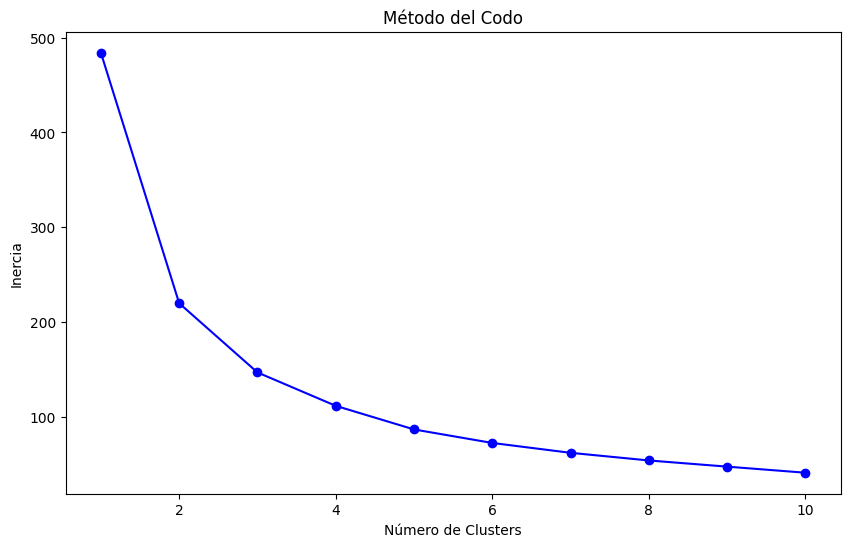

In [304]:
inercias = []
range_clusters = range(1, 11)

for k in range_clusters:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_scaled)
    inercias.append(kmeans.inertia_)

plt.figure(figsize=(10,6))
plt.plot(range_clusters, inercias, 'bo-')
plt.title('Método del Codo')
plt.xlabel('Número de Clusters')
plt.ylabel('Inercia')
plt.show()

Después de estandarizar nuestros datos y determinar el número óptimo de clusters utilizando el método del codo, en este caso 4, estamos listos para segmentar nuestros datos lo cual nos ayudará a agrupar países con características similares en términos de rendimiento educativo y porcentaje NEET.

In [305]:
n_clusters = 4
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df["cluster_neet"] = kmeans.fit_predict(df_scaled)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Una vez segmentado nuestros datos en 4 clusters, podemos examinar cada cluster para identificar características comunes y patrones entre los países dentro de cada cluster. Una manera efectiva de hacerlo es observar las métricas promedio para cada grupo. Al hacer esto, podemos obtener una comprensión más clara de lo que distingue a un cluster de otro, especialmente en relación con la métrica NEET.

In [306]:
cluster_means = df.groupby('cluster_neet')[["neet", "rea_total_value", "sci_total_value", "mat_total_value"]].mean()
cluster_means


,neet,rea_total_value,sci_total_value,mat_total_value
cluster_neet,,,,
0,12.163982,493.360656,497.213115,494.114754
1,27.094514,428.818182,423.818182,415.181818
2,20.776480,474.285714,474.892857,471.714286
3,12.404212,517.619048,528.619048,518.476190


Observar los resultados, es evidente que cada cluster tiene características distintivas en cuanto a sus métricas.
- El Grupo  0 tiene puntuaciones de PISA en el rango medio y una tasa NEET moderada. Aunque las puntuaciones en lectura, ciencias y matemáticas son decentes, la tasa NEET es ligeramente superior al 12%. Esto sugiere que, aunque la educación es de calidad razonable, hay margen de mejora en la empleabilidad o en la retención de los jóvenes en el sistema educativo

- El Grupo  1 representa un área de preocupación. No sólo tiene la tasa NEET más alta, sino que también presenta las puntuaciones más bajas en las tres categorías de PISA. Esto indica que la educación es menos efectiva y hay un porcentaje significativo de jóvenes que no están empleados ni en educación o formación.

- Aunque el Grupo 2 tiene puntuaciones de PISA que son mejores que las del Cluster 1, la tasa NEET sigue siendo alta. La educación es moderada, pero todavía hay un porcentaje considerable de jóvenes que no están en empleo, educación o formación

- El Grupo 3 es el más destacado en términos de calidad educativa, con las puntuaciones de PISA más altas en las tres categorías. Sin embargo, a pesar de la alta calidad educativa, la tasa NEET es similar a la del Cluster 0. Esto sugiere que factores adicionales, aparte de la educación, están influyendo en la tasa NEET.

En este caso, consideramos vital analizar cómo se distribuyen los países en función de dos variables clave: la tasa NEET y el gasto en educación. Esta visualización puede revelar la interacción entre la inversión en educación y sus resultados en términos de empleabilidad y formación.

**Distribución de Países por Tasa NEET y Gasto Educativo**

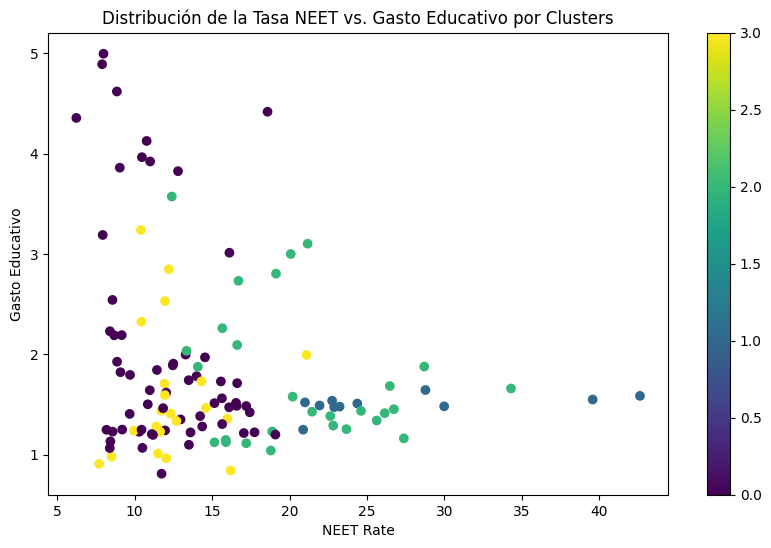

In [307]:
plt.figure(figsize=(10, 6))
plt.scatter(df["neet"], df["education_spending"], c=df["cluster_neet"], cmap='viridis')
plt.xlabel("NEET Rate")
plt.ylabel("Gasto Educativo")
plt.title("Distribución de la Tasa NEET vs. Gasto Educativo por Clusters")
plt.colorbar()
plt.show()

La visualización nos muestra una interesante distribución de los países en relación con la tasa NEET y el gasto en educación. Podemos identificar grupos de países que tienen características similares en cuanto a estas dos métricas. Es evidente que hay países que, a pesar de tener un gasto educativo similar, varían significativamente en su tasa NEET.

**Puntuación de Ciencias versus Tasa NEET**

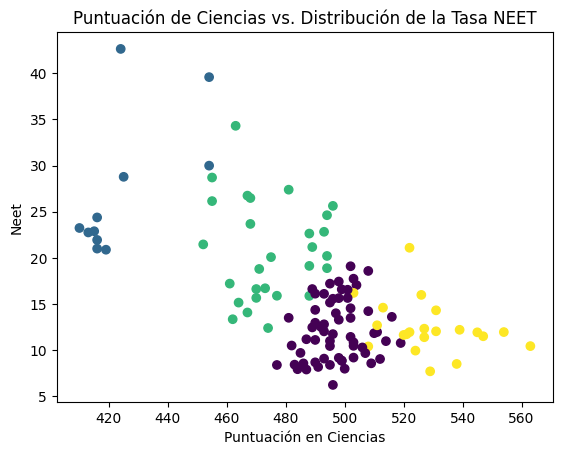

In [308]:
plt.scatter(df["sci_total_value"], df["neet"], c=df["cluster_neet"], cmap='viridis')
plt.xlabel("Puntuación en Ciencias")
plt.ylabel("Neet")
plt.title("Puntuación de Ciencias vs. Distribución de la Tasa NEET")
plt.show()


En general, se puede observar una tendencia en la que, a medida que aumenta la puntuación en ciencias, la tasa NEET tiende a disminuir. Sin embargo, hay excepciones y variaciones significativas, especialmente en el Cluster morado, que muestra claramente los desafíos combinados de bajas puntuaciones académicas y altas tasas NEET.

**Puntuación de Lectura versus Tasa NEET**

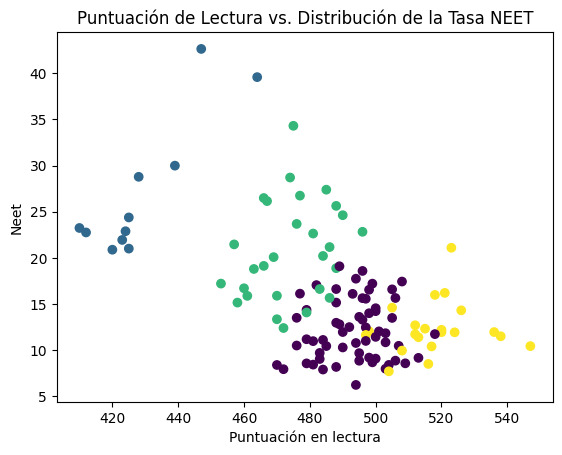

In [309]:
plt.scatter(df["rea_total_value"], df["neet"], c=df["cluster_neet"], cmap='viridis')
plt.xlabel("Puntuación en lectura")
plt.ylabel("Neet")
plt.title("Puntuación de Lectura vs. Distribución de la Tasa NEET")
plt.show()

Aunque hay una tendencia general en la que las puntuaciones más bajas de lectura coinciden con tasas NEET más altas, hay excepciones, especialmente en el Cluster 3. Esto subraya la complejidad de la relación entre la educación y la tasa NEET, sugiriendo que otros factores, además de la calidad educativa, pueden jugar un papel importante.

**Puntuación de Matemáticas versus Tasa NEET**

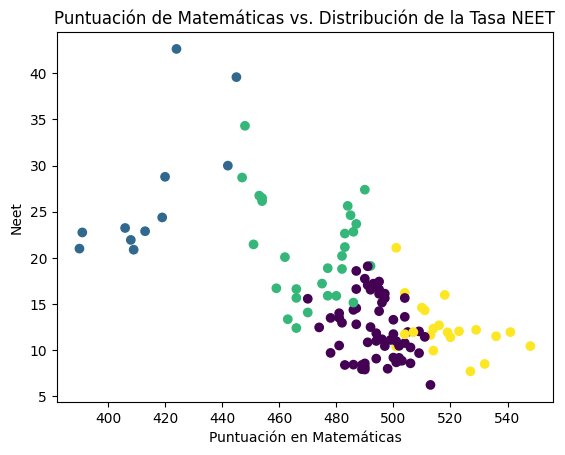

In [310]:
plt.scatter(df["mat_total_value"], df["neet"], c=df["cluster_neet"], cmap='viridis')
plt.xlabel("Puntuación en Matemáticas")
plt.ylabel("Neet")
plt.title("Puntuación de Matemáticas vs. Distribución de la Tasa NEET")
plt.show()

Este gráfico refuerza la idea de que una mejor educación (específicamente en Matemáticas) tiende a asociarse con tasas NEET más bajas.

#### 4.4.14. Conclusión Final

La relación entre la calidad educativa y la empleabilidad de los jóvenes es una cuestión fundamental que ha guiado nuestra investigación. Una de las métricas que hemos usado para evaluar la calidad educativa es la puntuación PISA, en particular en matemáticas. A lo largo de nuestro análisis, buscamos validar la hipótesis principal que sugiere que un rendimiento superior en matemáticas está inversamente relacionado con la tasa NEET.

**Validación de la Hipótesis Principal:**
"Un aumento o disminución de las puntuaciones PISA, sobre todo en Matemáticas, está inversamente relacionada con la tasa NEET de ese país."

Desde el inicio, el análisis arrojó una correlación negativa entre las puntuaciones PISA en matemáticas y la tasa NEET. Esta evidencia apunta hacia la validación de la hipótesis principal, respaldando la idea de que una educación matemática sólida se traduce en habilidades analíticas y de resolución de problemas que mejoran la empleabilidad. Los modelos de regresión lineal reforzaron esta observación: un incremento en las puntuaciones de matemáticas se correlaciona con una disminución predecible en la tasa NEET.

**Validación de la Hipótesis Secundaria 1:**
"Los países de la OCDE, en general, muestran una tendencia decreciente en sus tasas NEET a lo largo del tiempo debido a las políticas educativas y de empleo implementadas."

Al observar a los países de la OCDE, notamos una tendencia general hacia la disminución de la tasa NEET con el tiempo. Esta observación valida nuestra primera hipótesis secundaria, sugiriendo que las políticas educativas y de empleo en estos países están teniendo un impacto positivo en la reducción de la tasa NEET.

**Validación de la Hipótesis Secundaria 2:**
"Existen agentes externos, como la inversión en educación, el salario de los profesores, y los cambios en las estructuras educativas, que pueden influir en la tasa NEET de un país y, por ende, en su calidad educativa."

Nuestro análisis también consideró factores externos, como la inversión en educación, el salario de los profesores y las reformas educativas. Al examinar casos como España y Dinamarca, donde las reformas educativas llevaron a mejoras en las puntuaciones PISA y disminuciones en la tasa NEET, validamos nuestra segunda hipótesis secundaria. Estos ejemplos evidencian que hay agentes externos que influyen en la calidad educativa y, por ende, en la tasa NEET.

En conclusión, las evidencias extraídas de nuestro análisis respaldan y validan las hipótesis planteadas. La relación inversa entre las puntuaciones PISA en matemáticas y la tasa NEET es clara, la cantidad de ninis va disminuyendo y los factores externos tienen un papel determinante en esta tendencia.

### `4.5. Guardado`

In [311]:
df.head(5)

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score,cluster_mean_edu_spe,abs_education_spending,diff_education_spending,diff_abs_education_spending,cluster_neet
0,2006_AUS,2006.0,AUS,513.0,527.0,520.0,1.282893,51228.805,11.395142,520.00,4,9953.787636,NaN,NaN,3
1,2006_AUT,2006.0,AUT,490.0,511.0,505.0,1.243258,46768.280,11.958549,502.00,3,3871.439611,NaN,NaN,0
2,2006_DEU,2006.0,DEU,495.0,516.0,504.0,1.223547,61558.370,13.602721,505.00,3,34428.464032,NaN,NaN,0
3,2006_DNK,2006.0,DNK,494.0,496.0,513.0,4.356052,53278.370,6.226722,501.00,0,8842.093906,NaN,NaN,0
4,2006_ESP,2006.0,ESP,461.0,488.0,480.0,1.148465,49366.180,15.878056,476.33,1,15662.846174,NaN,NaN,2


In [312]:
with open('pickle_files/dataframe.pkl','wb') as f:
  pickle.dump(df,f)

## 5. Impletentación de modelos

En esta parte el objetivo será aplicar modelos de aprendizaje supervisado con el propósito de obtener más información sobre la importancia de las variables elegidas y, por tanto, dar más consistencia a nuestras validaciones o rechazos de hipótesis. Estudiaremos distintos modelos y los que tengan mas precisión, analizaremos sus criterios de predicción.

### `5.1. Preprocesamiento`

In [313]:
df.head()

,id,year,location,rea_total_value,sci_total_value,mat_total_value,education_spending,teachers_salary,neet,mean_score,cluster_mean_edu_spe,abs_education_spending,diff_education_spending,diff_abs_education_spending,cluster_neet
0,2006_AUS,2006.0,AUS,513.0,527.0,520.0,1.282893,51228.805,11.395142,520.00,4,9953.787636,NaN,NaN,3
1,2006_AUT,2006.0,AUT,490.0,511.0,505.0,1.243258,46768.280,11.958549,502.00,3,3871.439611,NaN,NaN,0
2,2006_DEU,2006.0,DEU,495.0,516.0,504.0,1.223547,61558.370,13.602721,505.00,3,34428.464032,NaN,NaN,0
3,2006_DNK,2006.0,DNK,494.0,496.0,513.0,4.356052,53278.370,6.226722,501.00,0,8842.093906,NaN,NaN,0
4,2006_ESP,2006.0,ESP,461.0,488.0,480.0,1.148465,49366.180,15.878056,476.33,1,15662.846174,NaN,NaN,2


In [314]:
df=df[["year",'location','mean_score','rea_total_value','sci_total_value','mat_total_value','education_spending','teachers_salary','neet']]

Vamos a trabajar con 4 dataframes distintos, cada uno asociado a un target distinto. Las variables que vamos a usar serán las que forman nuestras hipótesis. Tanto el año como el país no nos interesa meterlos en la predicción pues nuestro objetivo es valorar la importancia que le da el modelo al resto de variables.

In [315]:
df_avg=df[['education_spending','teachers_salary','neet','mean_score']]
df_rea=df[['education_spending','teachers_salary','neet','rea_total_value']]
df_sci=df[['education_spending','teachers_salary','neet','sci_total_value']]
df_mat=df[['education_spending','teachers_salary','neet','mat_total_value']]

In [316]:
scaler=StandardScaler()
df_avg[['education_spending','teachers_salary','neet']]=scaler.fit_transform(df_avg[['education_spending','teachers_salary','neet']])
df_rea[['education_spending','teachers_salary','neet']]=scaler.fit_transform(df_rea[['education_spending','teachers_salary','neet']])
df_sci[['education_spending','teachers_salary','neet']]=scaler.fit_transform(df_sci[['education_spending','teachers_salary','neet']])
df_mat[['education_spending','teachers_salary','neet']]=scaler.fit_transform(df_mat[['education_spending','teachers_salary','neet']])

<ipython-input-316-378d098cd353>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-316-378d098cd353>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-316-378d098cd353>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-316-378

In [317]:
display(df_avg.sample(2))
display(df_rea.sample(2))
display(df_sci.sample(2))
display(df_mat.sample(2))


,education_spending,teachers_salary,neet,mean_score
4,-0.760633,0.396346,0.048734,476.33
24,-0.473406,0.619044,-0.489490,518.67


,education_spending,teachers_salary,neet,rea_total_value
41,2.169705,0.032010,-0.417597,489.0
26,3.038252,0.818589,-1.015263,495.0


,education_spending,teachers_salary,neet,sci_total_value
93,-0.022404,-0.005041,-0.980286,493.0
40,-0.500928,-0.987398,-0.201838,508.0


,education_spending,teachers_salary,neet,mat_total_value
76,-0.604930,0.234852,1.099143,486.0
84,-0.943493,0.467562,-1.067606,532.0


El objetivo es ver que variables elige el modelo para hacer sus predicciones. Para ello, necesitamos que el modelo sea lo suficientemente bueno para poder afirmar que sus elecciones son adecuadas. Por tanto, iremos probando distintos algoritmos para comparar sus resultados y ya con el que consideremos que tiene menor error haremos un estudio más profundo.


### `5.2. Regresión lineal`

In [318]:
def regresion(df, target):
    X=df.drop(target, axis=1)
    y=df[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model=LinearRegression()
    model.fit(X,y)
    mbe=np.mean(y_test - model.predict(X_test))
    mae=np.mean(np.abs(y_test - model.predict(X_test)))
    mse=mean_squared_error(y_test, model.predict(X_test))
    rmse=np.sqrt(mse)
    mbe1=np.mean(y_train - model.predict(X_train))
    mae1=np.mean(np.abs(y_train - model.predict(X_train)))
    mse1=mean_squared_error(y_train, model.predict(X_train))
    rmse1=np.sqrt(mse1)
    print(f'Datos de entrenamiento para {target}: mbe={round(mbe1,3)}, mae={round(mae1,3)}, mse={round(mse1,3)}, rmse={round(rmse1,3)},')
    model_dict={}
    for column in X_train.columns:
        model_dict[column]=model.coef_[X_train.columns.get_loc(column)]
    weights=pd.DataFrame.from_dict(model_dict, orient='index', columns=[target]).T
    return mbe, mae, mse,rmse, weights

In [319]:
df_linear_regresion=pd.DataFrame(columns=['model','target','mbe','mae','mse','rmse','w_education_spending','w_teachers_salary','w_neet'])
for df,target in zip([df_avg,df_rea,df_sci,df_mat],['mean_score','rea_total_value','sci_total_value','mat_total_value']):
    mbe,mae,mse,rmse,weigths = regresion(df,target)
    df_linear_regresion=pd.concat([df_linear_regresion, pd.DataFrame({'model':'linear_regresion',
                                  'target':target,
                                  'mbe':mbe,
                                  'mae':mae,
                                  'mse':mse,
                                  'rmse':rmse,
                                  'w_education_spending':weigths['education_spending'][0],
                                  'w_teachers_salary':weigths['teachers_salary'][0],
                                  'w_neet':weigths['neet'][0]}, index=[0])], ignore_index=True)


display(df_linear_regresion)


Datos de entrenamiento para mean_score: mbe=0.789, mae=16.018, mse=462.931, rmse=21.516,
Datos de entrenamiento para rea_total_value: mbe=1.013, mae=16.248, mse=465.771, rmse=21.582,
Datos de entrenamiento para sci_total_value: mbe=0.511, mae=18.399, mse=568.526, rmse=23.844,
Datos de entrenamiento para mat_total_value: mbe=0.842, mae=16.172, mse=470.183, rmse=21.684,


,model,target,mbe,mae,mse,rmse,w_education_spending,w_teachers_salary,w_neet
0,linear_regresion,mean_score,-3.028384,16.310253,508.632852,22.552890,-1.466312,0.434158,-16.840493
1,linear_regresion,rea_total_value,-3.891111,17.581897,495.554817,22.261061,-0.810101,1.434169,-13.100990
2,linear_regresion,sci_total_value,-1.960873,17.421186,554.723053,23.552559,-1.562200,0.540398,-17.569296
3,linear_regresion,mat_total_value,-3.231804,16.193043,573.585179,23.949638,-2.027367,-0.671839,-19.851245


Quedémonos sólo con los errores. Seguramente el más indicativo sea la raíz del error cuadrático medio.

### `5.3. Árbol de decisión`

In [320]:
def decision_tree(df, target):
    X=df.drop(target, axis=1)
    y=df[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model=DecisionTreeRegressor(max_depth=3, random_state=42)
    model.fit(X_train,y_train)
    mbe=np.mean(y_test - model.predict(X_test))
    mae=np.mean(np.abs(y_test - model.predict(X_test)))
    mse=mean_squared_error(y_test, model.predict(X_test))
    rmse=np.sqrt(mse)
    mbe1=np.mean(y_train - model.predict(X_train))
    mae1=np.mean(np.abs(y_train - model.predict(X_train)))
    mse1=mean_squared_error(y_train, model.predict(X_train))
    rmse1=np.sqrt(mse1)
    print(f'Datos de entrenamiento para {target}: mbe={round(mbe1,3)}, mae={round(mae1,3)}, mse={round(mse1,3)}, rmse={round(rmse1,3)},')
    model_dict={}
    for column in X_train.columns:
        model_dict[column]=model.feature_importances_[X_train.columns.get_loc(column)]
    weights=pd.DataFrame.from_dict(model_dict, orient='index', columns=[target]).T
    return mbe, mae, mse,rmse, weights

In [321]:
df_decision_tree=pd.DataFrame(columns=['model','target','mbe','mae','mse','rmse','w_education_spending','w_teachers_salary','w_neet'])

for df,target in zip([df_avg,df_rea,df_sci,df_mat],['mean_score','rea_total_value','sci_total_value','mat_total_value']):
    mbe,mae,mse,rmse,weigths = decision_tree(df,target)
    df_decision_tree=pd.concat([df_decision_tree, pd.DataFrame({'model':'decision_tree',
                                  'target':target,
                                  'mbe':mbe,
                                  'mae':mae,
                                  'mse':mse,
                                  'rmse':rmse,
                                  'w_education_spending':weigths['education_spending'][0],
                                  'w_teachers_salary':weigths['teachers_salary'][0],
                                  'w_neet':weigths['neet'][0]}, index=[0])], ignore_index=True)
display(df_decision_tree)

Datos de entrenamiento para mean_score: mbe=-0.0, mae=10.376, mse=201.233, rmse=14.186,
Datos de entrenamiento para rea_total_value: mbe=0.0, mae=11.089, mse=207.834, rmse=14.416,
Datos de entrenamiento para sci_total_value: mbe=0.0, mae=11.879, mse=231.242, rmse=15.207,
Datos de entrenamiento para mat_total_value: mbe=-0.0, mae=10.55, mse=212.376, rmse=14.573,


,model,target,mbe,mae,mse,rmse,w_education_spending,w_teachers_salary,w_neet
0,decision_tree,mean_score,-4.655007,13.443982,298.263980,17.270321,0.047610,0.577567,0.374823
1,decision_tree,rea_total_value,-4.966777,14.868479,456.151243,21.357698,0.095919,0.579637,0.324444
2,decision_tree,sci_total_value,-1.352659,11.127168,211.336302,14.537410,0.045489,0.566958,0.387553
3,decision_tree,mat_total_value,-2.516791,10.162286,163.280130,12.778111,0.025768,0.179041,0.795191


### `5.4. Random Forest`

In [322]:
def random_forest(df, target):
    X=df.drop(target, axis=1)
    y=df[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model=RandomForestRegressor(n_estimators=20, max_depth=3, random_state=42)
    history=model.fit(X_train,y_train)
    mbe=np.mean(y_test - model.predict(X_test))
    mae=np.mean(np.abs(y_test - model.predict(X_test)))
    mse=mean_squared_error(y_test, model.predict(X_test))
    rmse=np.sqrt(mse)
    mbe1=np.mean(y_train - model.predict(X_train))
    mae1=np.mean(np.abs(y_train - model.predict(X_train)))
    mse1=mean_squared_error(y_train, model.predict(X_train))
    rmse1=np.sqrt(mse1)
    print(f'Datos de entrenamiento para {target}: mbe={round(mbe1,3)}, mae={round(mae1,3)}, mse={round(mse1,3)}, rmse={round(rmse1,3)},')
    model_dict={}
    for column in X_train.columns:
        model_dict[column]=model.feature_importances_[X_train.columns.get_loc(column)]
    weights=pd.DataFrame.from_dict(model_dict, orient='index', columns=[target]).T
    return mbe, mae, mse,rmse, weights

In [323]:
df_random_forest=pd.DataFrame(columns=['model','target','mbe','mae','mse','rmse','w_education_spending','w_teachers_salary','w_neet'])
for df,target in zip([df_avg,df_rea,df_sci,df_mat],['mean_score','rea_total_value','sci_total_value','mat_total_value']):
    mbe,mae,mse,rmse,weigths = random_forest(df,target)
    df_random_forest=pd.concat([df_random_forest, pd.DataFrame({'model':'random_forest',
                                  'target':target,
                                  'mbe':mbe,
                                  'mae':mae,
                                  'mse':mse,
                                  'rmse':rmse,
                                  'w_education_spending':weigths['education_spending'][0],
                                  'w_teachers_salary':weigths['teachers_salary'][0],
                                  'w_neet':weigths['neet'][0]}, index=[0])], ignore_index=True)
display(df_random_forest)

Datos de entrenamiento para mean_score: mbe=-0.265, mae=10.425, mse=190.736, rmse=13.811,
Datos de entrenamiento para rea_total_value: mbe=-0.041, mae=11.155, mse=201.201, rmse=14.185,
Datos de entrenamiento para sci_total_value: mbe=-0.325, mae=12.019, mse=229.951, rmse=15.164,
Datos de entrenamiento para mat_total_value: mbe=0.07, mae=10.042, mse=190.188, rmse=13.791,


,model,target,mbe,mae,mse,rmse,w_education_spending,w_teachers_salary,w_neet
0,random_forest,mean_score,-2.192544,13.538987,296.893051,17.230585,0.078367,0.513711,0.407922
1,random_forest,rea_total_value,-4.507515,15.208616,380.189513,19.498449,0.083789,0.634282,0.281929
2,random_forest,sci_total_value,-0.390101,16.007321,362.096039,19.028821,0.097812,0.537494,0.364694
3,random_forest,mat_total_value,-2.461177,13.349457,304.193572,17.441146,0.094770,0.306341,0.598889


### `5.5. Gradient Boosting`

In [324]:
from sklearn.ensemble import GradientBoostingRegressor

def gradient_boosting(df, target):
    X=df.drop(target, axis=1)
    y=df[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model=GradientBoostingRegressor(n_estimators=20, max_depth=3, random_state=42)
    model.fit(X_train,y_train)
    mbe=np.mean(y_test - model.predict(X_test))
    mae=np.mean(np.abs(y_test - model.predict(X_test)))
    mse=mean_squared_error(y_test, model.predict(X_test))
    rmse=np.sqrt(mse)
    mbe1=np.mean(y_train - model.predict(X_train))
    mae1=np.mean(np.abs(y_train - model.predict(X_train)))
    mse1=mean_squared_error(y_train, model.predict(X_train))
    rmse1=np.sqrt(mse1)
    print(f'Datos de entrenamiento para {target}: mbe={round(mbe1,3)}, mae={round(mae1,3)}, mse={round(mse1,3)}, rmse={round(rmse1,3)},')
    model_dict={}
    for column in X_train.columns:
        model_dict[column]=model.feature_importances_[X_train.columns.get_loc(column)]
    weights=pd.DataFrame.from_dict(model_dict, orient='index', columns=[target]).T
    return mbe, mae, mse,rmse, weights

In [325]:
df_gradient_boosting=pd.DataFrame(columns=['model','target','mbe','mae','mse','rmse','w_education_spending','w_teachers_salary','w_neet'])
for df,target in zip([df_avg,df_rea,df_sci,df_mat],['mean_score','rea_total_value','sci_total_value','mat_total_value']):
    mbe,mae,mse,rmse,weigths = gradient_boosting(df,target)
    df_gradient_boosting=pd.concat([df_gradient_boosting, pd.DataFrame({'model':'gradient_boosting',
                                  'target':target,
                                  'mbe':mbe,
                                  'mae':mae,
                                  'mse':mse,
                                  'rmse':rmse,
                                  'w_education_spending':weigths['education_spending'][0],
                                  'w_teachers_salary':weigths['teachers_salary'][0],
                                  'w_neet':weigths['neet'][0]}, index=[0])], ignore_index=True)
display(df_gradient_boosting)

Datos de entrenamiento para mean_score: mbe=-0.0, mae=8.383, mse=116.709, rmse=10.803,
Datos de entrenamiento para rea_total_value: mbe=0.0, mae=8.968, mse=133.708, rmse=11.563,
Datos de entrenamiento para sci_total_value: mbe=-0.0, mae=9.896, mse=159.548, rmse=12.631,
Datos de entrenamiento para mat_total_value: mbe=0.0, mae=8.008, mse=110.74, rmse=10.523,


,model,target,mbe,mae,mse,rmse,w_education_spending,w_teachers_salary,w_neet
0,gradient_boosting,mean_score,-1.205546,11.859730,236.449136,15.376903,0.151830,0.500951,0.347219
1,gradient_boosting,rea_total_value,-3.067365,13.292418,289.820537,17.024116,0.175929,0.517514,0.306557
2,gradient_boosting,sci_total_value,-0.161810,12.581080,246.747379,15.708195,0.117038,0.554211,0.328751
3,gradient_boosting,mat_total_value,-1.989122,11.708822,236.288310,15.371672,0.152964,0.242658,0.604378


### `5.6. XGBoost`

In [326]:
def xgboost(df, target):
    X=df.drop(target, axis=1)
    y=df[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model=XGBRegressor(n_estimators=5, max_depth=3, random_state=42)
    model.fit(X_train,y_train)
    mbe=np.mean(y_test - model.predict(X_test))
    mae=np.mean(np.abs(y_test - model.predict(X_test)))
    mse=mean_squared_error(y_test, model.predict(X_test))
    rmse=np.sqrt(mse)
    mbe1=np.mean(y_train - model.predict(X_train))
    mae1=np.mean(np.abs(y_train - model.predict(X_train)))
    mse1=mean_squared_error(y_train, model.predict(X_train))
    rmse1=np.sqrt(mse1)
    print(f'Datos de entrenamiento para {target}: mbe={round(mbe1,3)}, mae={round(mae1,3)}, mse={round(mse1,3)}, rmse={round(rmse1,3)},')
    model_dict={}
    for column in X_train.columns:
        model_dict[column]=model.feature_importances_[X_train.columns.get_loc(column)]
    weights=pd.DataFrame.from_dict(model_dict, orient='index', columns=[target]).T
    return mbe, mae, mse,rmse, weights

In [327]:
df_xgboost=pd.DataFrame(columns=['model','target','mbe','mae','mse','rmse','w_education_spending','w_teachers_salary','w_neet'])

for df,target in zip([df_avg,df_rea,df_sci,df_mat],['mean_score','rea_total_value','sci_total_value','mat_total_value']):
    mbe,mae,mse,rmse,weigths = xgboost(df,target)
    df_xgboost=pd.concat([df_xgboost, pd.DataFrame({'model':'xgboost',
                                  'target':target,
                                  'mbe':mbe,
                                  'mae':mae,
                                  'mse':mse,
                                  'rmse':rmse,
                                  'w_education_spending':weigths['education_spending'][0],
                                  'w_teachers_salary':weigths['teachers_salary'][0],
                                  'w_neet':weigths['neet'][0]}, index=[0])], ignore_index=True)
display(df_xgboost)

Datos de entrenamiento para mean_score: mbe=-0.098, mae=9.435, mse=174.452, rmse=13.208,
Datos de entrenamiento para rea_total_value: mbe=-0.18, mae=10.062, mse=180.745, rmse=13.444,
Datos de entrenamiento para sci_total_value: mbe=-0.117, mae=11.366, mse=222.981, rmse=14.933,
Datos de entrenamiento para mat_total_value: mbe=-0.158, mae=9.75, mse=180.127, rmse=13.421,


,model,target,mbe,mae,mse,rmse,w_education_spending,w_teachers_salary,w_neet
0,xgboost,mean_score,-3.173732,12.872399,288.475074,16.984554,0.084055,0.673074,0.242871
1,xgboost,rea_total_value,-3.319817,13.525093,288.962946,16.998910,0.097495,0.547077,0.355428
2,xgboost,sci_total_value,-0.540327,13.011523,299.101525,17.294552,0.057710,0.711553,0.230737
3,xgboost,mat_total_value,-3.765317,13.218120,333.731730,18.268326,0.124399,0.193814,0.681787


### `5.7. LightGBM`

In [328]:
def lightgbm(df, target):
    X=df.drop(target, axis=1)
    y=df[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model=lgb.LGBMRegressor(max_depth=3, random_state=42)
    model.fit(X_train,y_train)
    mbe=np.mean(y_test - model.predict(X_test))
    mae=np.mean(np.abs(y_test - model.predict(X_test)))
    mse=mean_squared_error(y_test, model.predict(X_test))
    rmse=np.sqrt(mse)
    mbe1=np.mean(y_train - model.predict(X_train))
    mae1=np.mean(np.abs(y_train - model.predict(X_train)))
    mse1=mean_squared_error(y_train, model.predict(X_train))
    rmse1=np.sqrt(mse1)
    print(f'Datos de entrenamiento para {target}: mbe={round(mbe1,3)}, mae={round(mae1,3)}, mse={round(mse1,3)}, rmse={round(rmse1,3)},')
    model_dict={}
    for column in X_train.columns:
        model_dict[column]=model.feature_importances_[X_train.columns.get_loc(column)]
    weights=pd.DataFrame.from_dict(model_dict, orient='index', columns=[target]).T
    return mbe, mae, mse,rmse, weights

In [329]:
df_lightgbm=pd.DataFrame(columns=['model','target','mbe','mae','mse','rmse','w_education_spending','w_teachers_salary','w_neet'])

for df,target in zip([df_avg,df_rea,df_sci,df_mat],['mean_score','rea_total_value','sci_total_value','mat_total_value']):
    mbe,mae,mse,rmse,weigths = lightgbm(df,target)
    df_lightgbm=pd.concat([df_lightgbm, pd.DataFrame({'model':'lightgbm',
                                  'target':target,
                                  'mbe':mbe,
                                  'mae':mae,
                                  'mse':mse,
                                  'rmse':rmse,
                                  'w_education_spending':weigths['education_spending'][0],
                                  'w_teachers_salary':weigths['teachers_salary'][0],
                                  'w_neet':weigths['neet'][0]}, index=[0])], ignore_index=True)
display(df_lightgbm)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000139 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 100
[LightGBM] [Info] Number of data points in the train set: 96, number of used features: 3
[LightGBM] [Info] Start training from score 489.066252
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

,model,target,mbe,mae,mse,rmse,w_education_spending,w_teachers_salary,w_neet
0,lightgbm,mean_score,-4.019024,14.555552,368.916710,19.207205,107,81,100
1,lightgbm,rea_total_value,-4.642467,14.929240,364.678745,19.096564,108,90,94
2,lightgbm,sci_total_value,-2.324689,15.580220,380.393355,19.503675,89,98,101
3,lightgbm,mat_total_value,-4.739218,14.930060,387.831753,19.693444,106,71,101


### `5.8. Comparación`

In [330]:
df_metrics=pd.concat([df_linear_regresion,df_random_forest,df_gradient_boosting,df_xgboost,df_decision_tree,df_lightgbm], ignore_index=True)
df_metrics

,model,target,mbe,mae,mse,rmse,w_education_spending,w_teachers_salary,w_neet
0,linear_regresion,mean_score,-3.028384,16.310253,508.632852,22.552890,-1.466312,0.434158,-16.840493
1,linear_regresion,rea_total_value,-3.891111,17.581897,495.554817,22.261061,-0.810101,1.434169,-13.10099
2,linear_regresion,sci_total_value,-1.960873,17.421186,554.723053,23.552559,-1.5622,0.540398,-17.569296
3,linear_regresion,mat_total_value,-3.231804,16.193043,573.585179,23.949638,-2.027367,-0.671839,-19.851245
4,random_forest,mean_score,-2.192544,13.538987,296.893051,17.230585,0.078367,0.513711,0.407922
5,random_forest,rea_total_value,-4.507515,15.208616,380.189513,19.498449,0.083789,0.634282,0.281929
6,random_forest,sci_total_value,-0.390101,16.007321,362.096039,19.028821,0.097812,0.537494,0.364694
7,random_forest,mat_total_value,-2.461177,13.349457,304.193572,17.441146,0.09477,0.306341,0.598889
8,gradient_boosting,mean_score,-1.205546,11.859730,236.449136,15.376903,0.15183,0.500951,0.347219
9,gradient_boosting,rea_total_value,-3.067365,13.292418,289.820537,17.024116,0.175929,0.517514,0.306557


Veamos los errores por target.

In [331]:
for target in ['mean_score','rea_total_value','sci_total_value','mat_total_value']:
    df_aux=(df_metrics[['model','target','mbe','mae','mse','rmse']])[df_metrics['target']==target]
    df_aux=df_aux.drop('target', axis=1)
    print(f'Model comparison for the target {target}')
    display(df_aux.groupby('model').mean().reset_index().sort_values(by='rmse').reset_index(drop=True))

Model comparison for the target mean_score


,model,mbe,mae,mse,rmse
0,gradient_boosting,-1.205546,11.859730,236.449136,15.376903
1,xgboost,-3.173732,12.872399,288.475074,16.984554
2,random_forest,-2.192544,13.538987,296.893051,17.230585
3,decision_tree,-4.655007,13.443982,298.263980,17.270321
4,lightgbm,-4.019024,14.555552,368.916710,19.207205
5,linear_regresion,-3.028384,16.310253,508.632852,22.552890


Model comparison for the target rea_total_value


,model,mbe,mae,mse,rmse
0,xgboost,-3.319817,13.525093,288.962946,16.998910
1,gradient_boosting,-3.067365,13.292418,289.820537,17.024116
2,lightgbm,-4.642467,14.929240,364.678745,19.096564
3,random_forest,-4.507515,15.208616,380.189513,19.498449
4,decision_tree,-4.966777,14.868479,456.151243,21.357698
5,linear_regresion,-3.891111,17.581897,495.554817,22.261061


Model comparison for the target sci_total_value


,model,mbe,mae,mse,rmse
0,decision_tree,-1.352659,11.127168,211.336302,14.537410
1,gradient_boosting,-0.161810,12.581080,246.747379,15.708195
2,xgboost,-0.540327,13.011523,299.101525,17.294552
3,random_forest,-0.390101,16.007321,362.096039,19.028821
4,lightgbm,-2.324689,15.580220,380.393355,19.503675
5,linear_regresion,-1.960873,17.421186,554.723053,23.552559


Model comparison for the target mat_total_value


,model,mbe,mae,mse,rmse
0,decision_tree,-2.516791,10.162286,163.280130,12.778111
1,gradient_boosting,-1.989122,11.708822,236.288310,15.371672
2,random_forest,-2.461177,13.349457,304.193572,17.441146
3,xgboost,-3.765317,13.218120,333.731730,18.268326
4,lightgbm,-4.739218,14.930060,387.831753,19.693444
5,linear_regresion,-3.231804,16.193043,573.585179,23.949638


Observando los errores, consideramos que el modelo más preciso en puntuación media es el GradientBoosting.
Para los resultados de lectura elegimos XGBoost, mientras que para ciencia y matemáticas optamos por el DecisionTree.
Es curioso que un simple árbol de decisión sea más “potente” que modelos ensembles. De tener que justificarlo, razonaríamos que se debe al pequeño tamaño del set de datos.

### `5.9. Feature importance`

Recordemos que vamos a estudiar la importancia de cada variable en unos modelos donde el error medio absoluto se mueve entre las 10 y 13 unidades. Esto quiere decir que, de media, el modelo se queda a 13 unidades de la puntuación PISA de acertar la predicción. Es una cantidad relativamente buena teniendo en cuenta que estamos trabajando con una pequeña cantidad de registros, pero no lo suficiente precisa para poder afirmar que el feature importance nos va a dar las respuestas a nuestras hipótesis.

In [332]:
display(df_gradient_boosting.iloc[[0],:-3])
display(df_xgboost.iloc[[1],:-3])
display(df_decision_tree.iloc[[2,3],:-3])

,model,target,mbe,mae,mse,rmse
0,gradient_boosting,mean_score,-1.205546,11.85973,236.449136,15.376903


,model,target,mbe,mae,mse,rmse
1,xgboost,rea_total_value,-3.319817,13.525093,288.962946,16.99891


,model,target,mbe,mae,mse,rmse
2,decision_tree,sci_total_value,-1.352659,11.127168,211.336302,14.537410
3,decision_tree,mat_total_value,-2.516791,10.162286,163.280130,12.778111


In [333]:
display(df_gradient_boosting.iloc[[0],[0,1,6,7,8]])
display(df_xgboost.iloc[[1],[0,1,6,7,8]])
display(df_decision_tree.iloc[[2,3],[0,1,6,7,8]])

,model,target,w_education_spending,w_teachers_salary,w_neet
0,gradient_boosting,mean_score,0.15183,0.500951,0.347219


,model,target,w_education_spending,w_teachers_salary,w_neet
1,xgboost,rea_total_value,0.097495,0.547077,0.355428


,model,target,w_education_spending,w_teachers_salary,w_neet
2,decision_tree,sci_total_value,0.045489,0.566958,0.387553
3,decision_tree,mat_total_value,0.025768,0.179041,0.795191


Lo primero que nos llama la atención es que el peso de la variable NEET es mayor en el target de matemáticas, lo que nos sigue reafirmando la tercera hipótesis.


Sin embargo, para el resto de los targets apreciamos que tiene más importancia el salario de los profesores que la cantidad de ninis. Veamos si esto ocurre también en el resto de modelos (tienen erorres similares) o es una característica puntual.

In [334]:
display(df_metrics[df_metrics['target']=='rea_total_value'])
display(df_metrics[df_metrics['target']=='sci_total_value'])
display(df_metrics[df_metrics['target']=='mean_score'])

,model,target,mbe,mae,mse,rmse,w_education_spending,w_teachers_salary,w_neet
1,linear_regresion,rea_total_value,-3.891111,17.581897,495.554817,22.261061,-0.810101,1.434169,-13.10099
5,random_forest,rea_total_value,-4.507515,15.208616,380.189513,19.498449,0.083789,0.634282,0.281929
9,gradient_boosting,rea_total_value,-3.067365,13.292418,289.820537,17.024116,0.175929,0.517514,0.306557
13,xgboost,rea_total_value,-3.319817,13.525093,288.962946,16.998910,0.097495,0.547077,0.355428
17,decision_tree,rea_total_value,-4.966777,14.868479,456.151243,21.357698,0.095919,0.579637,0.324444
21,lightgbm,rea_total_value,-4.642467,14.929240,364.678745,19.096564,108,90,94


,model,target,mbe,mae,mse,rmse,w_education_spending,w_teachers_salary,w_neet
2,linear_regresion,sci_total_value,-1.960873,17.421186,554.723053,23.552559,-1.5622,0.540398,-17.569296
6,random_forest,sci_total_value,-0.390101,16.007321,362.096039,19.028821,0.097812,0.537494,0.364694
10,gradient_boosting,sci_total_value,-0.161810,12.581080,246.747379,15.708195,0.117038,0.554211,0.328751
14,xgboost,sci_total_value,-0.540327,13.011523,299.101525,17.294552,0.05771,0.711553,0.230737
18,decision_tree,sci_total_value,-1.352659,11.127168,211.336302,14.537410,0.045489,0.566958,0.387553
22,lightgbm,sci_total_value,-2.324689,15.580220,380.393355,19.503675,89,98,101


,model,target,mbe,mae,mse,rmse,w_education_spending,w_teachers_salary,w_neet
0,linear_regresion,mean_score,-3.028384,16.310253,508.632852,22.552890,-1.466312,0.434158,-16.840493
4,random_forest,mean_score,-2.192544,13.538987,296.893051,17.230585,0.078367,0.513711,0.407922
8,gradient_boosting,mean_score,-1.205546,11.859730,236.449136,15.376903,0.15183,0.500951,0.347219
12,xgboost,mean_score,-3.173732,12.872399,288.475074,16.984554,0.084055,0.673074,0.242871
16,decision_tree,mean_score,-4.655007,13.443982,298.263980,17.270321,0.04761,0.577567,0.374823
20,lightgbm,mean_score,-4.019024,14.555552,368.916710,19.207205,107,81,100


Para el resto de los modelos usados vimos que mientras que la regresión lineal se fija prácticamente sólo en la tasa NEET, pero el resto de los modelos, salvo el LightGBM tienen un comportamiento muy similar a los examinados en cada caso. Esto es algo que nos llama la atención pues en la mayoría del análisis previo hemos observado que la variable NEET ha tenido más incidencia en las puntuaciones que el salario de los profesores.

### `5.10. SHAP`

#### 5.10.1 Función valores shap

In [335]:
model_dict={'DecisionTree':DecisionTreeRegressor(max_depth=3, random_state=42),
            'GradientBoostingRegressor':GradientBoostingRegressor(n_estimators=20, max_depth=3, random_state=42),
            'XGBoost':XGBRegressor(n_estimators=5, max_depth=3, random_state=42)}

In [336]:
def shap_values(df,target,model_name):
    print(f'Shap values for the target {target}')
    X=df.drop(target, axis=1)
    y=df[target]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    model=model_dict[model_name]
    model.fit(X_train,y_train)
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X_train)
    shap_values.shape
    shap_df=pd.DataFrame(shap_values, columns=X_train.columns)
    shap.summary_plot(shap_values, X_train)
    display(shap_df.describe())

#### 5.10.2. Puntuación media

Shap values for the target mean_score


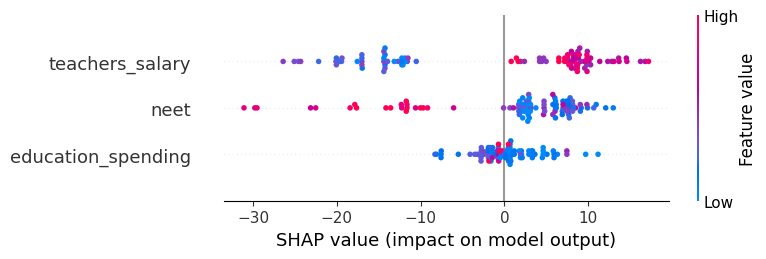

,education_spending,teachers_salary,neet
count,96.000000,96.000000,96.000000
mean,0.181857,-0.934203,0.752346
std,3.546522,12.848903,9.840794
min,-8.286919,-26.401783,-31.072198
25%,-1.866839,-14.248573,1.542255
50%,0.028883,6.491103,3.101958
75%,1.944142,8.938528,7.385967
max,11.170823,17.192628,12.984904


In [337]:
shap_values(df_avg,'mean_score','GradientBoostingRegressor')

Lo primero a mencionar debe ser que las variables están ordenadas por orden de importancia. Es decir, la variable teachers_salary es la más significativa para el modelo. Ahora debemos interpretar los puntos.
En el eje de abscisas vemos la importancia que tiene la variable de la muestra en la predicción. Si es muy positiva, tendrá una influencia positiva en el target, mientras que si es negativa, la influencia será negativa.
Cada punto se corresponde con una muestra, y el color de cada uno se refiere a si el valor de esa variable en dicha muestra es alto o bajo.


Del gráfico deducimos que el modelo interpreta que a mayor cantidad de ninis (muestras rojas), menor puntuación media, y a mayor salario de profesores, mayor puntuación. En cambio, para el gasto educativo no se puede deducir nada con claridad. Esta conclusión se asemeja mucho a nuestras evaluaciones anteriores.

#### 5.10.3. Lectura

Shap values for the target rea_total_value


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:160: UserWarning:

[09:28:59] WARNING: /workspace/src/c_api/c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.



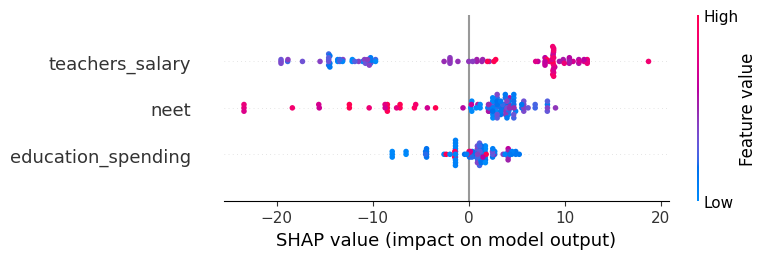

,education_spending,teachers_salary,neet
count,96.000000,96.000000,96.000000
mean,0.368238,-0.794239,0.426002
std,2.860250,10.877584,7.118905
min,-7.958482,-19.533817,-23.388870
25%,-1.370369,-11.551860,0.312751
50%,1.012577,1.413375,2.963176
75%,1.737334,8.843608,4.263505
max,5.262331,18.720078,9.035686


In [338]:
shap_values(df_rea,'rea_total_value','XGBoost')

#### 5.10.4. Ciencia

Shap values for the target sci_total_value


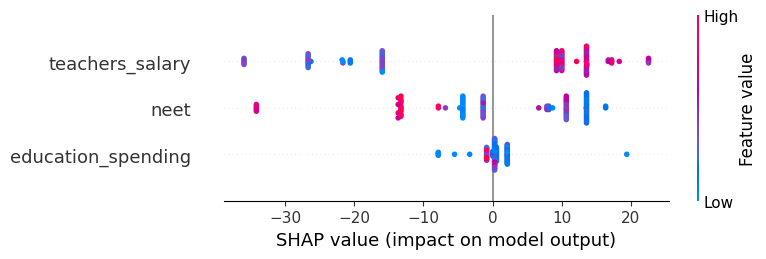

,education_spending,teachers_salary,neet
count,96.000000,96.000000,96.000000
mean,0.307752,-0.960351,0.652599
std,2.842233,18.049270,12.654317
min,-7.857218,-35.963430,-34.177773
25%,0.035711,-15.960989,-4.307412
50%,0.289908,9.243380,-1.369281
75%,0.547454,13.578709,10.658280
max,19.400980,22.553338,16.349827


In [339]:
shap_values(df_sci,'sci_total_value','DecisionTree')

#### 5.10.5. Matemáticas

Shap values for the target mat_total_value


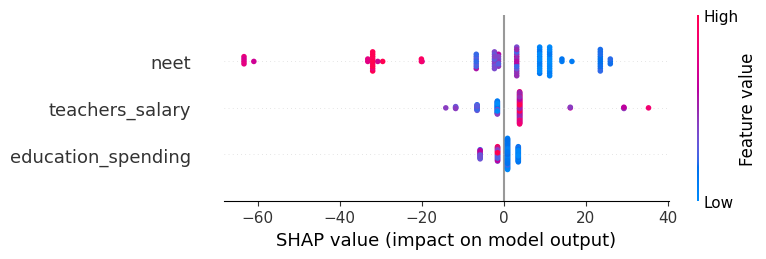

,education_spending,teachers_salary,neet
count,96.000000,96.000000,96.000000
mean,0.093975,2.093936,-2.187911
std,2.858822,7.912498,21.759473
min,-5.749081,-14.121429,-63.313542
25%,-1.503606,-1.550000,-6.691624
50%,0.930804,3.875000,3.172593
75%,0.930804,3.875000,11.203011
max,3.558955,35.303571,25.985978


In [340]:
shap_values(df_mat,'mat_total_value','DecisionTree')

Los resultados en las 3 ramas son muy parecidos que en la puntuación media.

## 6. Predicciones

Una vez evaluados nuestros distintos modelos, vamos a utilizarlo para predecir una situación hipotética en España. Estudiaremos que posibles valores en gasto educativo, salario de profesores y cantidad de ninis podría tener España en una situación hipotética pero realista en este año 2023. Una vez definidas las variables haremos una predicción con los modelos elegidos en función del target.

Contexto:

El próximo año de evaluación PISA debería haber sido en 2021, ya que se realizan cada 3 años. Sin embargo, debido a las dificultades causadas por la pandemia de COVID-19, los países miembros de la OCDE decidieron posponer PISA 2021 para 2022 y los resultados se publicarán en diciembre de 2023.

Dicho eso, realizaremos una predicción hipotética para España en 2022 considerando 3 escenarios para cada variable:

- Asumiendo que el valor de la variable ha subido un x%

- Asumiendo que el valor ha disminuido un x%

- Asumiendo un valor constante realista según la tendencia histórica/Asumiendo el valor real

De esta manera, podremos evaluar cómo se comportaría nuestro modelo predictivo en una situación realista próxima en el tiempo, considerando el contexto actual.

Así, podremos poner a prueba la capacidad predictiva de nuestro modelo bajo distintos escenarios plausibles para las variables clave.

### `6.1. Decisión de valores`

#### 6.1.1 Nuevos datos

Descargamos los datos en España de gasto educativo.

In [ ]:
df_gae = pd.read_csv("SDG_092023/SDG_DATA_NATIONAL.csv")
df_gae = df_gae[df_gae['indicator_id'].isin(['XGDP.FSGOV'])]
df_gae = df_gae.drop(['magnitude','qualifier'],axis=1)
df_gae = df_gae.rename(columns={'country_id': 'location'})
df_gae = df_gae.sort_values(by='year')
df_gae = df_gae.reset_index(drop=True)
df_gae = df_gae[df_gae['location'] == 'ESP'].reset_index(drop=True)

display('Gasto en Educación')
df_gae.tail(5)

'Gasto en Educación'

In [ ]:
df_gaed = pd.read_csv("data/Education spending_1995-2020(ESP).csv",delimiter=',')
df_gaed = df_gaed.drop(['Flags','Flag Codes','Year','EXPENDITURE_TYPE','UNIT_MEASURE.1','ISC11','Country','UNIT_MEASURE','Indicator','REF_SECTOR.1','REF_SECTOR','INDICATOR','COUNTERPART_SECTOR'],axis=1)
df_gaed = df_gaed[(df_gaed['YEAR'] >= 2000) & (df_gaed['YEAR'] <= 2023)]
df_gaed = df_gaed.sort_values(by=['YEAR', 'ISC11.1'])
df_gaed = df_gaed[df_gaed['COUNTERPART_SECTOR.1'] == 'All public and private institutions']
df_gaed = df_gaed[df_gaed['EXPENDITURE_TYPE.1'] == 'All expenditure types']
mapeamento = {
    'Early childhood education  (ISCED2011 level 0)': 'EARLYCHILDEDU',
    'Primary education (ISCED2011 level 1)': 'PRY',
    'Total secondary education (ISCED2011 levels 2 and 3)': 'SRY'
}
df_gaed = df_gaed.drop(['COUNTERPART_SECTOR.1','EXPENDITURE_TYPE.1'],axis=1)
display('Gasto en Educación')
df_gaed['ISC11.1'] = df_gaed['ISC11.1'].replace(mapeamento)
display(df_gaed.tail())
filtered_df = df_gaed[df_gaed['ISC11.1'].isin(['EARLYCHILDEDU', 'PRY', 'SRY'])]
average_df = filtered_df.groupby(['COUNTRY','YEAR']).agg({'Value': 'mean'}).reset_index()
average_df['ISC11.1'] = 'EARLY-SRY'
df_gaed = pd.concat([df_gaed, average_df], ignore_index=True)
df_gaed = df_gaed[df_gaed["ISC11.1"] == 'EARLY-SRY']
df_gaed = df_gaed.reset_index(drop=True)
display(df_gaed)

In [ ]:
#NEET
df_318_new = pd.read_csv("data/Youth not in employment, education or training (NEET)_2018_2022(25).csv")
df_318_new.columns = df_318_new.columns.str.lower().str.replace(' ', '_')
df_318_new = df_318_new.drop(['flag_codes','frequency','indicator'],axis=1)
df_318_new = df_318_new.rename(columns={'time': 'year'})
df_318_new = df_318_new.sort_values(by='year')
df_318_new = df_318_new.reset_index(drop=True)
display('NEET')
display(df_318_new.tail(5))

In [ ]:
#Salario de los profesores
#Tendencias en los salarios de los docentes: Índice de variación de los salarios reglamentarios de los docentes después de 15 años de experiencia (2015 = 100)
display('Salario de los profesores')

df_sal = pd.read_csv("data/Trends in teachers' salaries(ESP).csv",delimiter=',')
df_sal = df_sal.drop(['Country','ISC11','Experience level','Qualification level','GRADE','Category','INDICATOR','Flag Codes','Flags','QUAL','YEAR','EXP','Indicator'],axis=1)
df_sal = df_sal.loc[df_sal['Level of education'].isin(['Primary education','Lower secondary general education'])]

mapeamento = {
    'Primary education': 'PRY15YREXP',
    'Lower secondary general education': 'LOWSRY_15YREXP',
    #'Upper secondary general education': 'UPPSRY_15YREXP'
}

df_sal['Level of education'] = df_sal['Level of education'].replace(mapeamento)
df_sal = df_sal.rename(columns={'Level of education': 'subject'})
df_sal = df_sal.rename(columns={'COUNTRY': 'LOCATION'})
df_sal = df_sal.sort_values(by='Year')
df_sal = df_sal.reset_index(drop=True)
display(df_sal.tail(3))

df_314_aux = df_314_aux[df_314_aux['LOCATION'] == 'ESP']
display(df_314_aux)

mapping_dict = df_314_aux.set_index(['LOCATION', 'SUBJECT'])['Value'].to_dict()

def adjust_values(row):
    location = row['LOCATION']
    subject = row['subject']
    time = row['Year']

    # Obtener el valor correspondiente a 2015 en USD en función de "location" y "subject".
    value_2015_usd = mapping_dict.get((location, subject), None)

    if value_2015_usd is not None:
        row['Value'] = (row['Value'] * (value_2015_usd)) / 100

        row['Value'] = round(row['Value'], 2)
    else:
        row['Value'] = np.nan

    return row

df_sal = df_sal.apply(adjust_values, axis=1)

display(df_sal.tail(3))

filtered_df = df_sal[df_sal['subject'].isin(['PRY15YREXP','LOWSRY_15YREXP'])]

average_df = filtered_df.groupby(['LOCATION','Year']).agg({'Value': 'mean'}).reset_index()

average_df['subject'] = 'PRY-SRY'

df_sal = pd.concat([df_sal, average_df], ignore_index=True)

df_sal['Value'] = df_sal['Value'].round(3)

df_sal = df_sal[df_sal["subject"] == 'PRY-SRY']

display(df_sal.tail(3))



#### 6.1.2 Gasto educativo

In [ ]:
df_33[['year', 'location']] = df_33['id'].str.split('_', expand=True)
df33_ESP = df_33[df_33['location'] == 'ESP'].reset_index(drop=True)
df33_ESP = df33_ESP.sort_values(by='year')
df33_ESP = df33_ESP.drop('id', axis=1)
display(df33_ESP.tail())
display("Los datos más recientes de ESP en nuestra base de datos actual corresponden a 2019")

In [ ]:
df_gaed.rename(columns={'Value': 'education_spending'}, inplace=True)
df_gaed.rename(columns={'COUNTRY': 'location'}, inplace=True)
df_gaed.rename(columns={'YEAR': 'year'}, inplace=True)
df_gaed = df_gaed[['education_spending', 'year','location']]
display(df_gaed)
display("Los datos más recientes de ESP en esta nueva base de datos corresponden a 2020")

In [ ]:
df_gae.rename(columns={'value': 'education_spending'}, inplace=True)
df_gae = df_gae[['education_spending', 'year','location']]
display(df_gae.tail(5))
display("Los datos más recientes de ESP en esta nueva base de datos corresponden a 2021")
display("Los valores son superiores en comparación con nuestros datos actuales porque estos datos se refieren al gasto público total en la educación")

In [ ]:
# Calcular tasa de crecimiento anual
growth_rates = []
for i in range(1, len(df_gaed)):
    growth_rate = (df_gaed.loc[i, 'education_spending'] - df_gaed.loc[i-1, 'education_spending']) / df_gaed.loc[i-1, 'education_spending']
    growth_rates.append(growth_rate)

# Tomar datos de 2015 a 2020
recent_rates = growth_rates[-6:]

# Calcular promedio
avg_growth = sum(recent_rates) / len(recent_rates)

# Aplicar al último valor para estimar 2022
projection_2022 = df_gaed.loc[df_gaed['year']==2020, 'education_spending'].values[0] * (1 + avg_growth)

display("Projection education_spending para 2022")
projection_2022

Históricamente, las variaciones anuales en el gasto educativo en España han estado entre -5% y +5%. Vamos aplicar esas porcentajes de aumento y disminución sobre el valor estimado para 2022 siguiendo la tendencia histórica.

In [ ]:
gastoed = projection_2022

gastoed_s = gastoed*1.05
display('Asumiendo que el gasto en educación ha subido 5%:')
display(gastoed_s)

display('Asumiendo un valor constante realista según la tendencia histórica/Asumiendo el valor real:')
display(gastoed_s)

gastoed_d = gastoed*0.95
display('Asumiendo que el gasto en educación ha disminuido 5%:')
display(gastoed_d)

#### 6.1.3 Salario profesores

In [ ]:
df_314[['year', 'location']] = df_314['id'].str.split('_', expand=True)
df314_ESP = df_314[df_314['location'] == 'ESP'].reset_index(drop=True)
df314_ESP = df314_ESP.sort_values(by='year')
df314_ESP = df314_ESP.drop('id', axis=1)
display(df314_ESP.tail())
display("Los datos más recientes de ESP en nuestra base de datos actual corresponden a 2021")

In [ ]:
df_sal.rename(columns={'LOCATION': 'location'}, inplace=True)
df_sal.rename(columns={'Value': 'teachers_salary'}, inplace=True)
df_sal.rename(columns={'Year': 'year'}, inplace=True)
df_sal = df_sal[['teachers_salary', 'year','location']]
display(df_sal.tail())
display("Los datos más recientes de ESP en esta nueva base de datos corresponden a 2022")

El salario de los profesores en España ha permanecido relativamente estancado en los últimos años, con incrementos que apenas compensan la inflación. Un aumento salarial razonable estaría entre el 2% y 5%, teniendo en cuenta la tendencia histórica y las posibilidades fiscales. Para la disminución salarial, dado que ya hay malestar entre los profesores por sus salarios, no debería superar el 5%

In [ ]:
salario2022 = df_sal.loc[df_sal['year'] == 2022, 'teachers_salary']
salario2022 = salario2022.values[0]

salario2022_s = salario2022*1.03
display('Asumiendo que el salario de los profesores ha subido 3%:')
display(salario2022_s)

display('Asumiendo un valor constante realista según la tendencia histórica/Asumiendo el valor real:')
display(salario2022)

salario2022_d = salario2022*0.97
display('Asumiendo que el salario de los profesores ha disminuido 3%:')
display(salario2022_d)

#### 6.1.4 Tasa de ninis

In [ ]:
df_318[['year', 'location']] = df_318['id'].str.split('_', expand=True)
df318_ESP = df_318[df_318['location'] == 'ESP'].reset_index(drop=True)
df318_ESP = df318_ESP.sort_values(by='year')
df318_ESP = df318_ESP.drop('id', axis=1)
display(df318_ESP.tail())
display("Los datos más recientes de ESP en nuestra base de datos actual corresponden a 2021")


In [ ]:
df_318_new = df_318_new[df_318_new['location'] == 'ESP'].reset_index(drop=True)
df_318_new = df_318_new.sort_values(by='year')
df_318_new.rename(columns={'value': 'neet'}, inplace=True)
df_318_new = df_318_new[['neet', 'year','location']]
display(df_318_new.tail())
display("Los datos más recientes de ESP en esta nueva base de datos corresponden a 2022")

La tasa de NEET en España fluctuó entre el 18% y 19% en el período 2017-2021, y según datos recientes, en 2022 consiguió reducirse hasta el 16,48%. Tomando en cuenta esta tendencia a la baja reciente, escenarios razonables para la tasa de NEET en 2022 podrían ser un rango de variación entre -1% y +3%.

In [ ]:
neet2022 = df_318_new.loc[df_318_new['year'] == 2022, 'neet']
neet2022 = neet2022.values[0]

neet2022_s =neet2022 + 3
display('Asumiendo que la tasa ninis ha subido 3%:')
display((neet2022_s).round(6))

display('Asumiendo un valor constante realista según la tendencia histórica/Asumiendo el valor real:')
display(neet2022)

neet2022_d =(neet2022 - 1)
display('Asumiendo que la tasa ninis ha disminuido 1%:')
display(neet2022_d)

### `6.2. Preparamos el dataset`

In [ ]:
data = {
    'neet': [neet2022_d, neet2022, neet2022_s],
    'teachers_salary': [salario2022_s,salario2022,salario2022_d],
    'education_spending': [gastoed_s, gastoed, gastoed_d],
    'escenario': ['positivo', 'tendencia/real', 'negativo']
}

df_pred = pd.DataFrame(data)

df_pred['rea_total_value'] = None
df_pred['sci_total_value'] = None
df_pred['mat_total_value'] = None
df_pred['mean_score'] = None
df_pred['year'] = 2022
df_pred['location'] = 'ESP'

df_pred = df_pred[['location', 'year', 'education_spending', 'teachers_salary', 'neet']]
df_pred

Ahora debemos escalar los datos

In [ ]:
scaler=StandardScaler()
df_pred[['education_spending','teachers_salary','neet']]=scaler.fit_transform(df_pred[['education_spending','teachers_salary','neet']])
df_pred

Antes vamos a entrenar los modelos anteriores con todos los datos. En este caso vamos a entrenar los datos con las variables pais y año, para que el resultado sea más preciso.

Vamos a volver a definir los 4 datasets de entrenamiento. También tendremos que escalarlos de nuevo.

In [ ]:
with open('pickle_files/dataframe.pkl', 'rb') as f:
    df = pickle.load(f)
df.head()

In [ ]:
df=df[df.columns[:10]]
df.head()

In [ ]:
df_avg=df[['location','year','education_spending','teachers_salary','neet','mean_score']]
df_rea=df[['location','year','education_spending','teachers_salary','neet','rea_total_value']]
df_sci=df[['location','year','education_spending','teachers_salary','neet','sci_total_value']]
df_mat=df[['location','year','education_spending','teachers_salary','neet','mat_total_value']]

display(df_avg.head())
display(df_rea.head())

In [ ]:
scaler=StandardScaler()
df_avg[['education_spending','teachers_salary','neet']]=scaler.fit_transform(df_avg[['education_spending','teachers_salary','neet']])
df_rea[['education_spending','teachers_salary','neet']]=scaler.fit_transform(df_rea[['education_spending','teachers_salary','neet']])
df_sci[['education_spending','teachers_salary','neet']]=scaler.fit_transform(df_sci[['education_spending','teachers_salary','neet']])
df_mat[['education_spending','teachers_salary','neet']]=scaler.fit_transform(df_mat[['education_spending','teachers_salary','neet']])

display(df_avg.head())
display(df_rea.head())

In [ ]:
df_avg=pd.get_dummies(df_avg, columns=['location'], drop_first=True)
df_rea=pd.get_dummies(df_rea, columns=['location'], drop_first=True)
df_sci=pd.get_dummies(df_sci, columns=['location'], drop_first=True)
df_mat=pd.get_dummies(df_mat, columns=['location'], drop_first=True)

In [ ]:
display(df_avg.head())
display(df_rea.head())

In [ ]:
new_columns=df_avg.columns[5:]

In [ ]:
for column in new_columns:
    for i in range (0,3):
        df_pred.loc[i,column]=0
for i in range (0,3):
    df_pred.loc[i,'location_ESP']=1


In [ ]:
df_pred.drop(columns=['location'],inplace=True)
df_pred

### `6.3. Predicción`

In [ ]:
model_dict

In [ ]:
display(df.sample(2))
display(df_avg.sample(2))
display(df_rea.sample(2))

In [ ]:
df_pred

In [ ]:
def entrenamiento(model_name,df_train,target):
    model=model_dict[model_name]
    X=df_train.drop(target,axis=1)
    y=df_train[target]
    model.fit(X,y)
    predictions=model.predict(df_pred)
    print(f'Predicción en el escenario positivo en {target } = {round(predictions[0],2)}')
    print(f'Predicción en el escenario realista en {target } = {round(predictions[1],2)}')
    print(f'Predicción en el escenario negativo en {target } = {round(predictions[2],2)}\n')
    return [predictions[0],predictions[1],predictions[2]]

In [ ]:
mean_list=entrenamiento("GradientBoostingRegressor",df_avg,'mean_score')
rea_list=entrenamiento("XGBoost",df_rea,'rea_total_value')
sci_list=entrenamiento("DecisionTree",df_sci,'sci_total_value')
mat_list=entrenamiento("DecisionTree",df_mat,'mat_total_value')

### `6.4.Resultados`

#### 6.4.1. Dataframe

In [ ]:
df_pred['mean_score']=mean_list
df_pred['rea_total_value']=rea_list
df_pred['sci_total_value']=sci_list
df_pred['mat_total_value']=mat_list
df_pred['location']=['ESP','ESP','ESP']
df_pred['id']=['2022_ESP','2022_ESP','2022_ESP']

In [ ]:
df_pred=df_pred[['id','year','location','rea_total_value','sci_total_value','mat_total_value','education_spending','teachers_salary','neet','mean_score']]
df_pred

In [ ]:
df_pred_optimistic=df_pred.head(1)
df_pred_pessimistic=df_pred.tail(1)
df_pred_realistic=pd.DataFrame(df_pred.iloc[1,:]).T

In [ ]:
df.sample()

In [ ]:
df_optimistic=pd.concat([df,df_pred_optimistic],axis=0)
df_pessimistic=pd.concat([df,df_pred_pessimistic],axis=0)
df_realistic=pd.concat([df,df_pred_realistic],axis=0)

#### 6.4.2. Visualización

In [ ]:
#with open('pickle_files/df_realistic.pkl','wb') as f:
  #pickle.dump(df_realistic,f)

#with open('pickle_files/df_optimistic.pkl','wb') as f:
  #pickle.dump(df_optimistic,f)

#with open('pickle_files/df_pessimistic.pkl','wb') as f:
  #pickle.dump(df_pessimistic,f)

In [ ]:
list_df = [df_optimistic, df_pessimistic, df_realistic]
scenarios = ['Optimistic', 'Pessimistic', 'Realistic']
for i in range (0,3):
    df = list_df[i]
    display(df[df.location=='ESP'])

In [ ]:
list_df = [df_optimistic, df_pessimistic, df_realistic]
scenarios = ['Optimistic', 'Pessimistic', 'Realistic']
for i in range (0,3):
    df=list_df[i]
    scenario=scenarios[i]
    df_aux=df[df.location=="ESP"]
    fig, ax = plt.subplots(figsize=(8,3))
    sns.lineplot(data=df_aux, x="year", y="rea_total_value", label="Reading")
    sns.lineplot(data=df_aux, x="year", y="sci_total_value", label="Science")
    sns.lineplot(data=df_aux, x="year", y="mat_total_value", label="Math")
    sns.lineplot(data=df_aux, x="year", y="mean_score", label="Mean Score")
    plt.ylabel('')
    plt.xticks([2006,2009,2012,2015,2022])
    plt.title(scenario)
    plt.show()


Se aprecia que hemos hecho una buena estimación de escenarios, por lo que deducimos que las
correlaciones estimadas en nuestras hipótesis de variables y targets se verifican, al menos, de
manera conjunta.

## 7. Conclusiones

**Un mayor gasto educativo produce mejores resultados académicos:** En nuestro primer análisis
de datos fuimos capaces de dar alguna relación positiva entre estas dos variables para cierto
país en cierto tiempo. La varianza de las puntuaciones depende en cierta forma de la cantidad
de gasto educativo. Sin embargo, estos resultados no son lo suficientemente fuertes como para
validar la hipótesis. De hecho, el trabajo de modelado y análisis de los valores SHAP nos
mostraron que ningún modelo tiene en cuenta el gasto educativo, dejándola como la variable
menos utilizada y con un valor neutro. Por tanto, decidimos rechazar la hipótesis.

**Los países que pagan salarios más altos a los profesores suelen tener mejores resultados
académicos:** los diversos métodos estadísticos y modelos aplicados a los datos del PISA y salarios
docentes, encontramos cierta evidencia que respalda esta relación, aunque no de forma
contundente. Si bien la correlación entre ambas variables es positiva, también es débil,
indicando que no es una relación fuerte o determinante. Existen casos como Noruega y Finlandia
que tienen salarios similares pero resultados distintos en PISA. Sin embargo, el análisis SHAP
mostró que en la mayoría de los casos la variable de salario docente presenta una muy positiva
relación, sugiriendo que los modelos le dan cierta relevancia. En resumen, aunque la evidencia
no es absolutamente concluyente, los hallazgos sugieren que existe una implicación positiva
entre el salario docente y el desempeño académico. Por lo tanto, con ciertas reservas, validamos
la hipótesis planteada sobre la relación entre un mayor salario para los profesores y mejores
resultados educativos.

**La cifra de jóvenes sin empleo ni estudios es inversamente proporcional con las puntuaciones
PISA:** Durante nuestras primeras etapas de análisis, identificamos cierta relación inversa entre
la tasa NEET y las puntuaciones PISA para determinados países y períodos. Esto nos sugirió que
la calidad educativa puede ser afectada por la cantidad de jóvenes que no estudian ni trabajan.
Sin embargo, a pesar de esta correlación inicial, es crucial mencionar que no todos los resultados
respaldan de manera contundente esta hipótesis. Por consiguiente, durante el trabajo de
modelado y el análisis de los valores SHAP vemos resaltada la importancia de la tasa NEET en
relación con las puntuaciones PISA, especialmente en el área de matemáticas ya que diversos
modelos priorizaron la tasa NEET como una de las variables más significativas, con una influencia
notable en las predicciones. Además, al analizar escenarios hipotéticos para España en 2022, las
predicciones corroboraron que cambios en la tasa NEET pueden impactar significativamente en
las puntuaciones PISA, especialmente al comparar escenarios optimistas y pesimistas. Por
consiguiente y debido a que varios modelos y análisis reafirmaron la relevancia de la tasa NEET
en la calidad educativa y su relación inversa con las puntuaciones PISA, decidimos validar esta
hipótesis.